# Алгоритмы интеллектуальной обработки больших объемов данных
## Домашнее задание №2: Линейные модели


**Общая информация**

**Срок сдачи:** 25 апреля 18:00 Сдача **очная** на онлайн занятии.


Используйте данный Ipython Notebook при оформлении домашнего задания.

Присылать ДЗ необходимо в виде ссылки на свой github репозиторий на почту ml1.sphere@mail.ru с указанием темы в следующем формате:

[ML0422, Задание 2] Фамилия Имя.



**Штрафные баллы:**

1. Невыполнение PEP8 -1 балл
2. Отсутствие фамилии в имени скрипта (скрипт должен называться по аналогии со stroykova_hw2.ipynb) -1 балл
3. Все строчки должны быть выполнены. Нужно, чтобы output команды можно было увидеть уже в git'е. В противном случае -1 балл
4. При оформлении ДЗ нужно пользоваться данным файлом в качестве шаблона. Не нужно удалять и видоизменять написанный код и текст, если явно не указана такая возможность. В противном случае -1 балл
<hr\>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (12,5)

Здравствуйте, уважаемые студенты! 

В этом задании мы будем реализовать линейные модели. Необходимо реализовать линейную и логистическую регрессии с L2 регуляризацией

# Теоретическое введение



Линейная регрессия решает задачу регрессии и оптимизирует функцию потерь MSE 

$$L(w) =  \frac{1}{N}\left[\sum_i (y_i - a_i) ^ 2 \right], $$ где $y_i$ $-$ целевая функция,  $a_i = a(x_i) =  \langle\,x_i,w\rangle ,$ $-$ предсказание алгоритма на объекте $x_i$, $w$ $-$ вектор весов (размерности $D$), $x_i$ $-$ вектор признаков (такой же размерности $D$).

Не забываем, что здесь и далее  мы считаем, что в $x_i$ есть тождественный вектор единиц, ему соответствует вес $w_0$.


Логистическая регрессия является линейным классификатором, который оптимизирует так называемый функционал log loss:

$$L(w) = - \frac{1}{N}\left[\sum_i y_i \log a_i + ( 1 - y_i) \log (1 - a_i) \right],$$
где  $y_i  \in \{0,1\}$ $-$ метка класса, $a_i$ $-$ предсказание алгоритма на объекте $x_i$. Модель пытается предсказать апостериорую вероятность объекта принадлежать к классу "1":
$$ p(y_i = 1 | x_i) = a(x_i) =  \sigma( \langle\,x_i,w\rangle ),$$
$w$ $-$ вектор весов (размерности $D$), $x_i$ $-$ вектор признаков (такой же размерности $D$).

Функция $\sigma(x)$ $-$ нелинейная функция, пероводящее скалярное произведение объекта на веса в число $\in (0,1)$ (мы же моделируем вероятность все-таки!)

$$\sigma(x) = \frac{1}{1 + \exp(-x)}$$

Если внимательно посмотреть на функцию потерь, то можно заметить, что в зависимости от правильного ответа алгоритм штрафуется или функцией $-\log a_i$, или функцией $-\log (1 - a_i)$.



Часто для решения проблем, которые так или иначе связаны с проблемой переобучения, в функционал качества добавляют слагаемое, которое называют ***регуляризацией***. Итоговый функционал для линейной регрессии тогда принимает вид:

$$L(w) =  \frac{1}{N}\left[\sum_i (y_i - a_i) ^ 2 \right] + \frac{1}{C}R(w) $$

Для логистической: 
$$L(w) = - \frac{1}{N}\left[\sum_i y_i \log a_i + ( 1 - y_i) \log (1 - a_i) \right] +  \frac{1}{C}R(w)$$

Самое понятие регуляризации введено основателем ВМК академиком Тихоновым https://ru.wikipedia.org/wiki/Метод_регуляризации_Тихонова

Идейно методика регуляризации заключается в следующем $-$ мы рассматриваем некорректно поставленную задачу (что это такое можно найти в интернете), для того чтобы сузить набор различных вариантов (лучшие из которых будут являться переобучением ) мы вводим дополнительные ограничения на множество искомых решений. На лекции Вы уже рассмотрели два варианта регуляризации.

$L1$ регуляризация:
$$R(w) = \sum_{j=1}^{D}|w_j|$$
$L2$ регуляризация:
$$R(w) =  \sum_{j=1}^{D}w_j^2$$

С их помощью мы ограничиваем модель в  возможности выбора каких угодно весов минимизирующих наш лосс, модель уже не сможет подстроиться под данные как ей угодно. 

Вам нужно добавить соотвествущую Вашему варианту $L2$ регуляризацию.

И так, мы поняли, какую функцию ошибки будем минимизировать, разобрались, как получить предсказания по объекту и обученным весам. Осталось разобраться, как получить оптимальные веса. Для этого нужно выбрать какой-то метод оптимизации.



Градиентный спуск является самым популярным алгоритмом обучения линейных моделей. В этом задании Вам предложат реализовать стохастический градиентный спуск или  мини-батч градиентный спуск (мини-батч на русский язык довольно сложно перевести, многие переводят это как "пакетный", но мне не кажется этот перевод удачным). Далее нам потребуется определение **эпохи**.
Эпохой в SGD и MB-GD называется один проход по **всем** объектам в обучающей выборки.
* В SGD градиент расчитывается по одному случайному объекту. Сам алгоритм выглядит примерно так:
        1) Перемешать выборку
        2) Посчитать градиент функции потерь на одном объекте (далее один объект тоже будем называть батчем)
        3) Сделать шаг спуска
        4) Повторять 2) и 3) пока не пройдет максимальное число эпох.
* В Mini Batch SGD - по подвыборке объектов. Сам алгоритм выглядит примерно так::
        1) Перемешать выборку, выбрать размер мини-батча (от 1 до размера выборки)
        2) Почитать градиент функции потерь по мини-батчу (не забыть поделить на  число объектов в мини-батче)
        3) Сделать шаг спуска
        4) Повторять 2) и 3) пока не пройдет максимальное число эпох.
* Для отладки алгоритма реализуйте возможность  вывода средней ошибки на обучении модели по объектам (мини-батчам). После шага градиентного спуска посчитайте значение ошибки на объекте (или мини-батче), а затем усредните, например, по ста шагам. Если обучение проходит корректно, то мы должны увидеть, что каждые 100 шагов функция потерь уменьшается. 
* Правило останова - максимальное количество эпох
    


# Теоретические вопросы (2 балла)
В этой части Вам будут предложены теоретичские вопросы и задачи по теме. Вы, конечно, можете списать их у своего товарища или найти решение в интернете, но учтите, что они обязательно войдут в теоретический коллоквиум. Лучше разобраться в теме сейчас и успешно ответить на коллоквиуме, чем списать, не разобравшись в материале, и быть терзаемым совестью. 


Формулы надо оформлять в формате **LaTeX**.

Задача 1. Градиент для линейной регрессии.
* Выпишите формулу обновления весов для линейной регрессии с L2 регуляризацией для мини-батч градиентого спуска размера $n$:

$$ w_{new} = w_{old} - ... $$

 Отнеситесь к этому пункту максимально серьезно, это Вам нужно будет реализовать в задании.
 
Проанализруйте итоговую формулу градиента - как  интуитивно можно  описать, чему равен градиент?

***ОТВЕТ:*** $\omega_{new}  = \omega_{old}  - \frac{2\alpha}{N} X^T(X \omega_{old} - y) - \frac{2}{C} \omega_{old}$

Задача 2. Градиент для логистической регрессии.
* Выпишите формулу обновления весов для логистической регрессии с L2 регуляризацией  для мини-батч градиентого спуска размера $n$:

$$ w_{new} = w_{old} - ... $$

 Отнеситесь к этому пункту максимально серьезно, это Вам нужно будет реализовать в задании.
 
Проанализруйте итоговую формулу градиента - как  интуитивно можно  описать, чему равен градиент? Как соотносится этот градиент с градиентом, возникающий в задаче линейной регрессии?

Подсказка: Вам градиент, которой получается если “в лоб” продифференцировать,  надо немного преобразовать.
Надо подставить, что $1 - \sigma(w,x) $ это  $1 - a(x_i)$, а  $-\sigma(w,x)$ это $0 - a(x_i)$.  Тогда получится свести к одной красивой формуле с линейной регрессией, которую программировать будет намного проще.

***ОТВЕТ:*** $\omega_{new} = \omega_{old} + \frac{1}{N} \sum _i x_i(y_i - <\omega_{old}, x_i>) - \frac{2}{C} \omega_{old}$

Задача 3. Точное решение линейной регрессии

На лекции было показано, что точное решение линейной регрессии имеет вид $w = (X^TX)^{-1}X^TY $. 
* Покажите, что это действительно является точкой минимума в случае, если матрица X имеет строк не меньше, чем столбцов и имеет полный ранг. Подсказка: посчитайте Гессиан и покажите, что в этом случае он положительно определен. 
* Выпишите точное решение для модели с $L2$ регуляризацией. Как L2 регуляризация помогает с точным решением где матрица X имеет линейно зависимые признаки?

***ОТВЕТ:*** $\omega = (X^TX + \lambda I)^{-1}X^Ty$

Задача 4.  Предсказываем вероятности.

Когда говорят о логистической регрессии, произносят фразу, что она "предсказывает вероятности положительного класса". Давайте разберемся, что же за этим стоит. Посчитаем математическое ожидание функции потерь и проверим, что предсказание алгоритма, оптимизирующее это мат. ожидание, будет являться вероятностью положительного класса. 

И так, функция потерь на объекте $x_i$, который имеет метку $y_i \in \{0,1\}$  для предсказания $a(x_i)$ равна:
$$L(y_i, b) =-[y_i == 1] \log a(x_i)  - [y_i == 0] \log(1 - a(x_i)) $$

Где $[]$ означает индикатор $-$ он равен единице, если значение внутри него истинно, иначе он равен нулю. Тогда мат. ожидание при условии конкретного $x_i$  по определение мат. ожидания дискретной случайной величины:
$$E(L | x_i) = -p(y_i = 1 |x_i ) \log a(x_i)  - p(y_i = 0 | x_i) \log( 1 - a(x_i))$$
* Докажите, что значение $a(x_i)$, минимизирующее данное мат. ожидание, в точности равно $p(y_i = 1 |x_i)$, то есть равно вероятности положительного класса.

Подсказка: возможно, придется воспользоваться, что  $p(y_i = 1 | x_i) + p(y_i = 0 | x_i) = 1$

***Ваше решение здесь***

Задача 5.  Смысл регуляризации.

Нужно ли в L1/L2 регуляризации использовать свободный член $w_0$ (который не умножается ни на какой признак)?

Подсказка: подумайте, для чего мы вводим $w_0$

***ОТВЕТ:*** Нет, так как этот член показывает, как далеко все значения y находятся от единицы. А даже если все они равномерно далеки, это не портит качество обучения

#  Реализация линейной модели (4 балла)

## Зачем нужны батчи?


Как Вы могли заметить из теоретического введения, что в случае SGD, что в случа mini-batch GD,  на каждой итерации обновление весов  происходит только по небольшой части данных (1 пример в случае SGD, batch примеров в случае mini-batch). То есть для каждой итерации нам *** не нужна вся выборка***. Мы можем просто итерироваться по выборке, беря батч нужного размера (далее 1 объект тоже будем называть батчом).

Легко заметить, что в этом случае нам не нужно загружать все данные в оперативную память, достаточно просто считать батч с диска, обновить веса, считать диска другой батч и так далее. В целях упрощения домашней работы, прямо с диска  мы считывать не будем, будем работать с обычными numpy array. 





## Немножко про генераторы в Python



Идея считывания данных кусками удачно ложится на так называемые ***генераторы*** из языка Python. В данной работе Вам предлагается не только разобраться с логистической регрессией, но  и познакомиться с таким важным элементом языка.  При желании Вы можете убрать весь код, связанный с генераторами, и реализовать логистическую регрессию и без них, ***штрафоваться это никак не будет***. Главное, чтобы сама модель была реализована правильно, и все пункты были выполнены. 

Подробнее можно почитать вот тут https://anandology.com/python-practice-book/iterators.html


К генератору стоит относиться просто как к функции, которая порождает не один объект, а целую последовательность объектов. Новое значение из последовательности генерируется с помощью ключевого слова ***yield***. Ниже Вы можете насладиться  генератором чисел Фибоначчи.

In [2]:
def fib(max_iter=4):
    a, b = 0, 1
    iter_num = 0
    while 1:
        yield a
        a, b = b, a + b
        iter_num += 1
        if iter_num == max_iter:
            break

Вот так можно сгенерировать последовательность Фибоначчи. 

Заметьте, что к генераторам можно применять некоторые стандартные функции из Python, например enumerate.

In [3]:
new_generator = fib()
for j, fib_val in enumerate(new_generator):
    print ("Fib num: " + str(j) + " fib values: " + str(fib_val))

Fib num: 0 fib values: 0
Fib num: 1 fib values: 1
Fib num: 2 fib values: 1
Fib num: 3 fib values: 2


Пересоздавая объект, можно сколько угодно раз генерировать заново последовательность. 

In [4]:
for i in range(0, 3):
    new_generator = fib()
    for j, fib_val in enumerate(new_generator):
        print ("Fib num: " + str(j) + " fib values: " + str(fib_val))

Fib num: 0 fib values: 0
Fib num: 1 fib values: 1
Fib num: 2 fib values: 1
Fib num: 3 fib values: 2
Fib num: 0 fib values: 0
Fib num: 1 fib values: 1
Fib num: 2 fib values: 1
Fib num: 3 fib values: 2
Fib num: 0 fib values: 0
Fib num: 1 fib values: 1
Fib num: 2 fib values: 1
Fib num: 3 fib values: 2


А вот так уже нельзя.

In [5]:
new_generator = fib()
for i in range(0, 3):
    for j, fib_val in enumerate(new_generator):
        print ("Fib num: " + str(j) + " fib values: " + str(fib_val))

Fib num: 0 fib values: 0
Fib num: 1 fib values: 1
Fib num: 2 fib values: 1
Fib num: 3 fib values: 2


In [6]:
X = np.asarray([[1, 2, 3], [0, 0, 0]])
Y = np.asarray([2, 4, 1])
np.dot(X, Y)

array([13,  0])

Концепция крайне удобная для обучения  моделей $-$ у Вас есть некий источник данных, который Вам выдает их кусками, и Вам совершенно все равно откуда он их берет. Под ним может скрывать как массив в оперативной памяти, как файл на жестком диске, так и SQL база данных. Вы сами данные никуда не сохраняете, оперативную память экономите.

Если Вам понравилась идея с генераторами, то Вы можете реализовать свой, используя прототип batch_generator. В нем Вам нужно выдавать батчи признаков и ответов для каждой новой итерации спуска. Если не понравилась идея, то можете реализовывать SGD или mini-batch GD без генераторов.

In [7]:
def batch_generator(X, y, shuffle=True, batch_size=1):
    """
    Гератор новых батчей для обучения
    X          - матрица объекты-признаки
    y_batch    - вектор ответов
    shuffle    - нужно ли случайно перемешивать выборку
    batch_size - размер батча ( 1 это SGD, > 1 mini-batch GD)
    Генерирует подвыборку для итерации спуска (X_batch, y_batch)
    """
    X_and_y = np.column_stack((X, y))
    np.random.shuffle(X_and_y)
    X_temp = X_and_y[:,:-1]
    y_temp = X_and_y[:,-1:]
    #print(X_temp)
    #print(y_temp)
    #X_batch = X_temp
    #y_batch = y
    for i in range((X.shape[0] // batch_size)):
        X_batch = X_temp[i * batch_size: (i+1)*batch_size , :]
        y_batch = y_temp[i * batch_size: (i+1)*batch_size][:,0]
        yield (X_batch, y_batch)

# Теперь можно сделать генератор по данным ()
#  my_batch_generator = batch_generator(X, y, shuffle=True, batch_size=1):

In [600]:
#%%pycodestyle

def sigmoid(x):
    """
    Вычисляем значение сигмоида.
    X - выход линейной модели
    """
    sigm_value_x = 1.0 / (1 + np.exp(-x))
    return sigm_value_x
def net_input(theta, x):
    # Computes the weighted sum of inputs
    return np.dot(x, theta)

from sklearn.base import BaseEstimator, ClassifierMixin

class MySGDClassifier(BaseEstimator, ClassifierMixin):
    
    def __init__(self, batch_generator, C=1, alpha=0.01, max_epoch=10, model_type='lin_reg'):
        """
        batch_generator -- функция генератор, которой будем создавать батчи
        C - коэф. регуляризации
        alpha - скорость спуска
        max_epoch - максимальное количество эпох
        model_type - тим модели, lin_reg или log_reg
        """
        
        self.C = C
        self.alpha = alpha
        self.max_epoch = max_epoch
        self.batch_generator = batch_generator
        self.errors_log = {'iter' : [], 'loss' : []}  
        self.model_type = model_type
        self.weights = None
        
    def calc_loss(self, X_batch, y_batch):
        """
        Считаем функцию потерь по батчу 
        X_batch - матрица объекты-признаки по батчу
        y_batch - вектор ответов по батчу
        Не забудте тип модели (линейная или логистическая регрессия)!
        """
        X_batch = np.column_stack((np.ones(X_batch.shape[0]), X_batch))
        if self.model_type == 'lin_reg':
            y_pred = np.dot(X_batch, self.weights)
            loss = (1 / X_batch.shape[0]) * np.sum((y_pred - y_batch) ** 2)
        elif self.model_type == 'log_reg':
            y_pred = np.dot(X_batch, self.weights)
            prob_pred = sigmoid(y_pred)
            loss = np.sum(y_batch * np.log(prob_pred)) + np.sum((1 - y_batch) * np.log(sigmoid(-y_pred)))
            loss = -loss / X_batch.shape[0]
        return loss
    
    def calc_loss_grad(self, X_batch, y_batch):
        """
        Считаем  градиент функции потерь по батчу (то что Вы вывели в задании 1)
        X_batch - матрица объекты-признаки по батчу
        y_batch - вектор ответов по батчу
        Не забудте тип модели (линейная или логистическая регрессия)!
        """
        # self.weights = np.asarray([1, 2, 1])
        if self.model_type == "log_reg":
            
            y_diff = y_batch - sigmoid(np.dot(X_batch, self.weights))
            y_diff = y_diff.reshape((X_batch.shape[0], 1))
            np.reshape(y_diff, (X_batch.shape[0], 1))
            loss_grad = np.sum(X_batch * y_diff, axis=0)
            #print(loss_grad)
            weight_temp = np.r_[0, self.weights[1:]]
            loss_grad = -loss_grad + 2 * self.C * self.weights
            loss_grad = loss_grad / X_batch.shape[0]
        elif self.model_type == "lin_reg":
            y_diff = np.dot(X_batch, self.weights) - y_batch
            loss_grad = 2 * np.dot(X_batch.T, y_diff)
            #print(loss_grad)
            loss_grad = loss_grad / X_batch.shape[0] + 2 * self.C * self.weights
        
        return loss_grad
    
    def update_weights(self, new_grad):
        """
        Обновляем вектор весов
        new_grad - градиент по батчу
        """
        # new_grad = new_grad.astype('float32')
        self.weights -= (self.alpha * new_grad)
        #print(self.weights)
    
    def fit(self, X, y):
        '''
        Обучение модели
        X - матрица объекты-признаки
        y - вектор ответов
        '''
        
        # Нужно инициализровать случайно веса
        
        X = np.column_stack((np.ones(X.shape[0]), X))
        self.weights = np.ones(X.shape[1])
        for n in range(0, self.max_epoch):
            new_epoch_generator = self.batch_generator(X, y, shuffle=True, batch_size=2)
            for batch_num, new_batch in enumerate(new_epoch_generator):
                X_batch = new_batch[0]
                y_batch = new_batch[1]
                #print(y_batch, X_batch)
                batch_grad = self.calc_loss_grad(X_batch, y_batch)
                self.update_weights(batch_grad)
                # Подумайте в каком месте стоит посчитать ошибку для отладки модели
                # До градиентного шага или после
                batch_loss = self.calc_loss(X_batch[:,:-1], y_batch)
                self.errors_log['iter'].append(batch_num)
                self.errors_log['loss'].append(batch_loss)
                
        return self
        
    def predict(self, X):
        '''
        Предсказание класса
        X - матрица объекты-признаки
        Не забудте тип модели (линейная или логистическая регрессия)!
        '''
        if self.model_type == "lin_reg":
            y_hat = np.dot(X, self.weights)
        elif self.model_type == "log_reg":
            y_hat = sigmoid(np.dot(X, self.weights))
            med = 1/2
            y_hat[np.where(y_hat > med)] = 1
            y_hat[np.where(np.dot(X, self.weights) <= med)] = 0
            print(y_hat)
        # Желательно здесь использовать матричные операции между X и весами, например, numpy.dot 
        return y_hat

Запустите обе регрессии на синтетических данных. 


Выведите полученные веса и нарисуйте разделяющую границу между классами (используйте только первых два веса для первых двух признаков X[:,0], X[:,1] для отображения в 2d пространство ).  

In [456]:
def plot_decision_boundary(clf):
    print(clf.weights, clf.calc_loss(X, y))
    w_0 = clf.weights[0]
    w_1 = clf.weights[1]
    w_2 = clf.weights[2]
    plt.plot(X[:,0], (1/2 - w_0 - w_1 * X[:,0])/w_2, '-r')
    

In [119]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0, penalty = 'none')

[-5.53069176  1.18640825 -1.33932257] 0.2831084210740441
[-7.92027763] 1.6268891048273606 -1.9152951796559063
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1.
 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0.
 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.
 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1.
 1. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0

0.8680203045685279

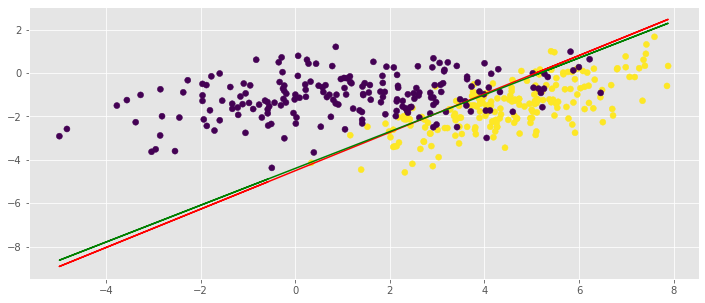

In [602]:
np.random.seed(0)

C1 = np.array([[0., -0.8], [1.5, 0.8]])
C2 = np.array([[1., -0.7], [2., 0.7]])
gauss1 = np.dot(np.random.randn(200, 2) + np.array([5, 3]), C1)
gauss2 = np.dot(np.random.randn(200, 2) + np.array([1.5, 0]), C2)

X = np.vstack([gauss1, gauss2])

y = np.r_[np.ones(200), np.zeros(200)]

sgd = MySGDClassifier(batch_generator, C=0, alpha=0.01, max_epoch=100, model_type='log_reg')
sgd.fit(X, y)
plot_decision_boundary(sgd)

plt.scatter(X[:,0], X[:,1], c=y)
classifier.fit(X, y)
print(classifier.intercept_, classifier.coef_[0][0], classifier.coef_[0][1])

plt.plot(X[:,0], (1/2 -classifier.intercept_ - classifier.coef_[0][0] * X[:,0])/classifier.coef_[0][1], '-g')

f1_score(sgd.predict(np.column_stack((np.ones(X.shape[0]), X))), y)

Далее будем анализировать Ваш алгоритм. 
Для этих заданий используйте датасет ниже.

In [83]:
from sklearn.datasets import make_classification

In [361]:
X, y = make_classification(n_samples=100000, n_features=10, 
                           n_informative=4, n_redundant=0, 
                           random_state=123, class_sep=1.0,
                           n_clusters_per_class=1)

Покажите сходимости обеих регрессией на этом датасете: изобразите график  функции потерь, усредненной по $N$ шагам градиентого спуска, для разных `alpha` (размеров шага). Разные `alpha` расположите на одном графике. 

$N$ можно брать 10, 50, 100 и т.д. 

In [362]:
X_temp = np.vstack((X.T, np.ones(X.shape[0]))).T
my_batch_generator = batch_generator(X_temp, y, shuffle=True, batch_size=1)
sgd = MySGDClassifier(my_batch_generator, model_type='lin_reg', alpha=0.05)
sgd.fit(X_temp, y)

[0.84464893 1.24673251 0.94142816 0.91092991 1.23477242 0.43057575
 0.97312049 0.81624793 0.61503136 0.78570321 0.73829324]
[0.2635739  0.55540868 0.78292651 0.57867348 0.82493854 0.58633082
 0.63460365 1.07585279 0.8356828  0.94851587 0.3176042 ]
[0.26039698 0.51468209 0.83948212 0.34995347 0.64573273 0.5746224
 0.66212999 1.13731694 0.63579381 0.74299565 0.39735228]
[ 0.44437549  0.01655957  1.20697403 -0.05175366 -0.0370653   0.5754992
  0.50594887  1.0524014   0.56293901  0.58894806  0.13450251]
[ 0.15455284  0.19837475  0.74510132 -0.11458645  0.67353081 -0.30716638
  0.15562083  0.7820279   1.01178475  0.46586729 -0.17348568]
[ 0.33080464  0.39537574  0.60014451 -0.06672376  0.11473126  0.02309264
  0.15444551  0.87232838  0.65660832  0.28517507 -0.39824253]
[ 0.48838539  0.22666516  0.37175033 -0.23393345 -0.14559365  0.29739783
  0.14829818  0.98154779  0.520009    0.22739194 -0.22265915]
[ 0.43486008  0.18306962  0.33691227 -0.2052969  -0.10140296  0.20856009
  0.14464106  0.8

[ 0.04817775 -0.00721182  0.00392116 -0.21886815 -0.04976568  0.07838541
  0.03889872  0.03223396  0.19017048  0.05840161  0.16837387]
[-0.02786464  0.08025105  0.09232724 -0.16663763 -0.05431957  0.1715823
  0.08207697 -0.01193595  0.25043164  0.10235386  0.20756875]
[-0.05667152  0.13107988 -0.04348136 -0.18347017 -0.16149225  0.29682366
  0.10730659  0.0583866   0.12828709  0.1433437   0.24886987]
[-0.09594969  0.13751746 -0.15208213 -0.22695574  0.01622508  0.16779171
  0.07822966  0.04845925  0.01950944 -0.09279106  0.36211271]
[-0.05294678  0.0972693  -0.11851016 -0.1972092  -0.06676648  0.22068415
  0.03894577  0.08247898 -0.00514349 -0.10506606  0.2898224 ]
[-0.04732306  0.08872253 -0.10852476 -0.17483097 -0.05660095  0.1993439
  0.03649553  0.0773739  -0.0053115  -0.09763228  0.26627006]
[-0.05325282  0.06663677 -0.11481499 -0.15152943 -0.05392487  0.16655136
  0.02746038  0.08323616 -0.0076134  -0.07438993  0.25211111]
[-0.04628408  0.06403955 -0.10782951 -0.15574309 -0.07333

[-0.12016485 -0.10583721 -0.01460257 -0.1937421   0.02337268  0.1373003
 -0.07245235 -0.09750055 -0.04545589 -0.0590652   0.28207002]
[-0.10618692 -0.09178071 -0.01422022 -0.17998242  0.0211425   0.12679066
 -0.06814165 -0.09486998 -0.03886328 -0.05172085  0.25351587]
[-0.10790473 -0.08089771 -0.01607127 -0.15128397  0.00361805  0.11050655
 -0.07304152 -0.07120682 -0.03706343 -0.04174669  0.23928067]
[-0.02668023 -0.09534914  0.07330649 -0.26823495 -0.00916337  0.10065916
 -0.06875492  0.00185048  0.0274198  -0.04752743  0.28472989]
[-0.02225746 -0.07613611  0.04523391 -0.2227514   0.05682935  0.07674338
 -0.07008814 -0.01554636  0.04909722 -0.03396423  0.27879156]
[-0.04903936 -0.06210471  0.07119578 -0.27258585 -0.02173149  0.13801843
 -0.0117293   0.05613869  0.07538845  0.03947299  0.29643967]
[-0.0337066  -0.02645865  0.00361202 -0.26176094 -0.10031787  0.16053476
  0.01066355  0.08975068  0.07952898  0.06765417  0.32639843]
[-0.10110757 -0.03176831  0.04185433 -0.21697896 -0.0717

[ 0.01934367  0.01389883  0.03679957  0.00307465 -0.09410206  0.2599818
 -0.07087189  0.05261608 -0.05419003  0.00823032  0.24840294]
[ 0.0375246   0.00192783  0.02940749 -0.00688811 -0.07283378  0.25163268
 -0.07968582  0.00969676 -0.04301298 -0.00025381  0.21525778]
[-0.09525608  0.04556811  0.15616524 -0.12116992 -0.11684513  0.2666649
  0.04152601  0.11149109  0.04488697  0.04838591  0.27241222]
[-0.08390181  0.1377958   0.20682089 -0.11142695 -0.11319678  0.22641378
  0.05036917  0.12422953  0.00795148  0.05674095  0.28167041]
[-1.24097894e-01  1.65520849e-01  1.33828335e-01 -1.27435780e-05
  5.38612300e-02  1.81653063e-01  1.33518486e-02  9.84536609e-02
  7.87346042e-02  3.77403653e-02  3.06623809e-01]
[-0.06363253  0.09427845  0.0715369  -0.02463825 -0.03302112  0.23936981
  0.02835371  0.08553914  0.11799477  0.04773183  0.2296427 ]
[-0.02546247  0.0814781   0.06389865 -0.00759297  0.00060604  0.2072218
  0.02474619  0.07747271  0.10158926  0.04689898  0.22605587]
[ 0.03724779 

[ 0.02739388 -0.1160408  -0.06203946 -0.25130264 -0.12990488  0.18851617
  0.11925126  0.15864249  0.16328596  0.00250035  0.34113405]
[-0.05459385 -0.1155759  -0.00144599 -0.10346304 -0.03095894  0.10226682
  0.09339916  0.02538939  0.13563448  0.04216646  0.24628599]
[-0.05570109 -0.10828585  0.01334658 -0.09783799 -0.00933849  0.10456121
  0.08910582  0.00058291  0.12079308  0.04067712  0.21669072]
[ 0.04214026  0.13066044  0.17901158 -0.11236837  0.00377191  0.09509326
 -0.03850246 -0.01298226  0.29409216 -0.13959471  0.29656117]
[ 0.03294928  0.12645474  0.16543724 -0.09385188 -0.02147992  0.06709407
 -0.05018852  0.0215085   0.25642599 -0.12762174  0.28078884]
[ 0.03261129  0.11633225  0.15222454 -0.08495475 -0.02140355  0.0571573
 -0.04473155  0.02442511  0.22961286 -0.11516507  0.25736653]
[ 0.07709651 -0.00171591  0.1146088   0.01669521  0.1206274   0.04548781
 -0.06625687  0.02526885  0.15926624 -0.08470794  0.28436277]
[ 0.21779234  0.09405662  0.23314761 -0.14800543 -0.1781

[-0.13474391  0.02611098  0.10749972 -0.30137871  0.08993924 -0.11634692
  0.02812369  0.19767198  0.14126967  0.07097855  0.26980635]
[-0.00107113 -0.01925529  0.08200207 -0.34092115  0.11164225 -0.0522328
  0.0272961   0.06167417  0.15346604  0.16170336  0.19030515]
[-0.09562798  0.03837736  0.17921763 -0.31492072  0.08508359 -0.00090298
  0.12483818  0.06111119  0.14723779  0.17216171  0.23095319]
[ 0.00820949 -0.04861457  0.10607186 -0.41018125 -0.29157506 -0.01430053
  0.04638438  0.12512577  0.08094841  0.11795424  0.13946866]
[ 0.03283373 -0.07234852  0.10853549 -0.31903545 -0.23031256 -0.02781657
  0.04574456  0.19295929  0.09274753  0.0941962   0.16402928]
[ 0.02494678 -0.07564874  0.10627082 -0.2850506  -0.22394721  0.00630799
  0.04288768  0.17450285  0.07026085  0.08016116  0.13506912]
[ 0.00830221 -0.04385165  0.11200594 -0.28281189 -0.198571    0.05483946
  0.09493228  0.07759162  0.07752205  0.04143926  0.08699595]
[ 0.04282709 -0.01454298  0.08830424 -0.20566071 -0.1626

[ 0.05967628  0.06950406 -0.02930946 -0.0716183   0.02891436 -0.11084735
  0.05548403 -0.02937648 -0.04859992  0.16722208  0.07386578]
[ 0.03742029 -0.01321454 -0.12795476 -0.19253932 -0.15900208  0.07972656
  0.23272581  0.1220005  -0.02079112  0.21865975  0.16373127]
[-0.09985419 -0.06495691 -0.0023697  -0.12628522  0.08268608 -0.03606697
  0.13243367  0.09627112  0.01140356  0.12358239  0.24602024]
[-0.09644732 -0.0343452   0.02760403 -0.0639863   0.07035998 -0.06127063
  0.09464778  0.14841031 -0.01343785  0.04619013  0.24930803]
[-0.02465656 -0.07818968 -0.01093867 -0.08676892  0.08781592  0.00993077
  0.22254204 -0.01890882 -0.04344923  0.04510492  0.17310078]
[-0.09238733 -0.12404272 -0.08395249 -0.1230572  -0.06154583  0.08047107
  0.1106059  -0.03805447  0.00757759  0.01113498  0.09835821]
[-0.07963113 -0.11914673 -0.08669185 -0.10334823 -0.03861314  0.07347228
  0.10354891 -0.02755742 -0.00220334  0.01115049  0.09482412]
[-0.11311325 -0.09596826 -0.10424746 -0.14025163 -0.096

[ 0.0008393   0.07425999 -0.02016241 -0.17525268 -0.15937581  0.0923977
  0.00226308  0.07977057  0.05117108 -0.06964567  0.17259536]
[ 0.00528377  0.06067151 -0.01668483 -0.1504692  -0.14283109  0.08032705
  0.00129105  0.0865108   0.05546503 -0.05581403  0.16392794]
[ 0.00768313  0.01130631  0.08083423 -0.11452695 -0.063493    0.18191841
 -0.00760227 -0.08530755 -0.00065975 -0.06720863  0.09072096]
[ 0.08664104 -0.16641879  0.19024414 -0.12897475 -0.02632539  0.15377943
  0.09444637 -0.05740629  0.09303424 -0.18191684  0.15675609]
[ 0.07616498 -0.15389335  0.17813461 -0.2001096  -0.10951972  0.1724099
  0.09654772  0.04527554  0.10543177 -0.15259872  0.16570063]
[ 0.02994431 -0.05681072  0.12252477 -0.121762    0.05055375  0.33531634
  0.12823523 -0.0961216   0.12020466 -0.13834569  0.09655192]
[ 0.03122431 -0.05498877  0.11002742 -0.11056032  0.05068232  0.30033509
  0.11521418 -0.08520068  0.11454412 -0.12864128  0.09148738]
[-0.03717407 -0.03311519  0.06843613 -0.03607893  0.09595

[-0.03662424 -0.06862596 -0.00732149  0.02943991  0.17884203 -0.12404568
  0.06878895 -0.10386802  0.06272836 -0.33618809  0.25995604]
[-0.05297919 -0.0882616   0.12077459 -0.0412322   0.14674381  0.06559456
 -0.00633542 -0.06727489  0.08173286 -0.1998017   0.14045841]
[-0.01833599  0.02025438  0.15941915  0.02517885  0.09371356  0.03568577
  0.00996956  0.02795228  0.02995667 -0.16734358  0.17311034]
[-0.06925375 -0.07464644  0.20363699 -0.16404878  0.00840924 -0.0123612
  0.00921371  0.16733582  0.12975261 -0.14019472  0.24008646]
[-0.09701263 -0.11125597  0.19374576 -0.16487129 -0.03552211  0.07831095
 -0.00065769  0.13027174  0.07330774 -0.06217256  0.17210815]
[-0.06534762 -0.09435055  0.18602906 -0.19241423  0.00957319  0.11098243
 -0.02558469  0.05319917  0.01032002 -0.00785305  0.11820892]
[-0.06480169 -0.08411154  0.16181802 -0.18526308 -0.00043696  0.10225276
 -0.01871792  0.04011253  0.00895372 -0.00884843  0.10221426]
[-0.06193792 -0.07102905  0.14292755 -0.14537709  0.0209

[-0.11334208 -0.04785355  0.11029387 -0.15308522 -0.14417747  0.03530831
 -0.10842441  0.18573614  0.09890705  0.04835938  0.25763028]
[-0.12590839 -0.11574068  0.18992446 -0.15514572 -0.08444266  0.05806579
 -0.04475769  0.14534432  0.13730808  0.02042559  0.29934796]
[-0.25294227 -0.21175054  0.15907849 -0.1058911   0.03260205  0.04889023
 -0.06699811  0.05400084  0.13832134  0.03089696  0.33558291]
[-0.27106863 -0.13406132  0.12436248 -0.10096882  0.01496295  0.13836597
 -0.06692974  0.0304265   0.09569499 -0.03050306  0.25671975]
[-0.23280685 -0.13680427  0.05714553 -0.0597109   0.02216252  0.08331441
 -0.04465714  0.07011341  0.06598368 -0.07816587  0.26475281]
[-0.25552332 -0.08934025  0.06601989 -0.10658813 -0.03352605  0.09733033
 -0.02652677  0.12545066  0.06336342 -0.03909476  0.26284646]
[-0.13341089  0.02452301  0.01201614 -0.22656858 -0.10954103  0.15633861
  0.11947601  0.20436353 -0.16948949  0.0200146   0.33699012]
[-0.11917303  0.02544488  0.00600986 -0.19230338 -0.091

 -0.08944533 -0.0077149   0.02235587 -0.02716862  0.19276269]
[ 0.09853072 -0.06349386 -0.12975115 -0.19990822 -0.02672909  0.23964925
  0.00642249  0.09432115  0.05865539 -0.02442246  0.22278016]
[ 0.0543511  -0.07153626 -0.08979776 -0.11975021  0.09388214  0.22112853
  0.082199    0.05203599  0.05608535  0.02434704  0.24229926]
[ 0.04742152 -0.07149133 -0.09026125 -0.11877284  0.03749706  0.22771398
  0.06099302  0.0477285   0.04023138 -0.01483172  0.20221249]
[ 0.04273632 -0.05324797 -0.08228299 -0.09372274  0.06696069  0.20379285
  0.03887925  0.03859425  0.0440881  -0.01950576  0.19346813]
[ 0.0188677  -0.054211   -0.07843411 -0.08732735  0.07061511  0.15365055
  0.04593327  0.04270865  0.03628656 -0.02412626  0.19092548]
[ 0.04605012  0.01114044 -0.0719768  -0.0718093  -0.05854668  0.30720415
  0.07251551  0.08523864 -0.02814041  0.14842667  0.23761337]
[ 0.13515605  0.05299253 -0.03422297 -0.12266752 -0.09347813  0.32159625
  0.02122039  0.12838081  0.02151533  0.07090481  0.269

  0.01276062  0.07697322 -0.08996836 -0.06217767  0.17858759]
[ 0.00563808  0.11307952  0.0045546  -0.08146583 -0.04747109  0.08867837
  0.0113733   0.07008427 -0.08171194 -0.05634875  0.16257486]
[-0.01072088  0.09033391  0.03852499 -0.03451525  0.05138362  0.06005079
  0.05760713  0.03367451 -0.07158416  0.00038212  0.17995622]
[ 0.03233056  0.05403878  0.06052806 -0.09135739  0.01314727  0.07706889
  0.05377693 -0.04069407 -0.02098122  0.03417673  0.12894052]
[ 0.08202767 -0.01380676  0.062261   -0.05072712 -0.01985647  0.2495771
 -0.05820934 -0.05360363 -0.06209826  0.20841575  0.18885319]
[ 0.1064214  -0.02849983  0.09690841 -0.02731993 -0.03792834  0.05406077
 -0.0938925   0.22301151 -0.06189855  0.37978328  0.26418208]
[ 0.09661742 -0.03194311  0.08328747 -0.02987184 -0.04021284  0.05265845
 -0.08284822  0.19770565 -0.05567144  0.35095614  0.23555062]
[ 0.04369328 -0.24097373  0.01141848  0.00705996 -0.00930425  0.11795899
 -0.15238991  0.13138302 -0.10319469  0.33060579  0.2871

[ 0.02264552 -0.03682151 -0.06972858  0.07981756  0.00791388  0.15959561
  0.06857445  0.06478939 -0.07774406 -0.01623646  0.2607245 ]
[-0.00985199 -0.10087993  0.06562951 -0.12214325 -0.11527361  0.13111277
  0.01468166  0.2653195  -0.21562596  0.08576369  0.31855581]
[-0.0119181  -0.08471667  0.09644507 -0.20846307 -0.10831556  0.06185334
  0.0954837   0.29681762 -0.12295444  0.1091862   0.33849912]
[ 0.00248046 -0.07220644  0.06513004 -0.17107071 -0.09068101  0.04299929
  0.06141104  0.27923779 -0.12070118  0.09660469  0.32232523]
[ 0.01133141 -0.06273217  0.04796028 -0.15492938 -0.09678509  0.04384951
  0.06721164  0.25292945 -0.11433886  0.09282007  0.28485721]
[ 0.00898047 -0.00650855  0.06042091 -0.0740521   0.04837153  0.0538353
  0.04469071  0.25124201 -0.10460806  0.07731558  0.2933321 ]
[ 0.01286803 -0.00433067  0.05094102 -0.06226105  0.04425527  0.04680693
  0.03870278  0.22485449 -0.08715379  0.06805265  0.26307534]
[-0.00132353 -0.06515604  0.07690602 -0.01441922  0.0590

  0.04144276  0.03632713  0.0683046   0.06941092  0.18190792]
[-0.05498583  0.06828121  0.10871453 -0.20217528  0.08329229  0.12427082
  0.08032452  0.0404547   0.09984727  0.01903607  0.24262013]
[-0.09550557  0.08762634  0.11355558 -0.25780724  0.00547985  0.13994683
  0.06649023  0.12254953  0.03537927 -0.05591877  0.25925441]
[-0.02981789  0.02291732  0.28995636 -0.15387479  0.09373732  0.05157121
  0.05333543  0.06247286  0.2187414  -0.08742084  0.32894313]
[-0.07083395  0.04675404  0.33636493 -0.13035142  0.04704784  0.10016835
  0.0086831   0.06789277  0.15960596 -0.08227186  0.33831792]
[-0.05472129  0.03001517  0.31705211 -0.13481407  0.04123862  0.0918834
  0.00171966  0.07258467  0.14340595 -0.07720032  0.31682067]
[-5.47341505e-02  2.30654555e-02  2.83424365e-01 -1.17977288e-01
  4.03651304e-02  8.50040858e-02 -2.65808159e-05  6.23970872e-02
  1.30694045e-01 -6.91876034e-02  2.85160873e-01]
[-0.09493825 -0.01832372  0.10231828 -0.19257571 -0.31153661  0.14529919
  0.0263702

[ 0.19279013 -0.03728575  0.27104148 -0.09370097 -0.04091108  0.26563658
  0.10845742  0.05409509 -0.11164296  0.03536059  0.37107767]
[ 0.19454227 -0.0241206   0.18801736 -0.17748543 -0.13497085  0.28156154
  0.00944494  0.15543314 -0.08432889  0.08918882  0.38578151]
[ 0.16196821 -0.00917321  0.18220348 -0.09755915 -0.08420965  0.21848722
  0.02834679  0.08849924 -0.06774291  0.05542119  0.3116746 ]
[ 0.1327092   0.02917987  0.17318721 -0.1227506  -0.06591226  0.21536152
  0.00679576  0.10889212 -0.13499875  0.05144183  0.32046754]
[ 0.08034786  0.03917293  0.06596807 -0.11804657 -0.09801223  0.32140785
 -0.00172354  0.10361709 -0.10345518  0.06184861  0.34370403]
[ 0.09000839  0.03771923  0.03855683 -0.10836189 -0.02935293  0.26116634
  0.0185785   0.07544467 -0.11820061  0.06169794  0.33742119]
[ 0.08757159  0.03749928  0.01516757 -0.09075274 -0.03960491  0.26343816
  0.0381625   0.07314207 -0.14381661  0.03440093  0.32952016]
[ 0.07696437  0.06755097 -0.05015446 -0.12824947 -0.073

  0.02374673  0.12320857  0.0990377   0.06495592  0.22020091]
[-0.06840798  0.12322107  0.04777954 -0.17098671 -0.0861125   0.13770732
  0.01713648  0.14954268  0.07620985  0.06354692  0.22265468]
[-0.07045072  0.10825144  0.05801978 -0.13038797 -0.01872413  0.12272733
  0.03334152  0.12381863  0.09268185  0.07427166  0.2210647 ]
[-0.10142254  0.03499423  0.1160767  -0.18354466 -0.08342876  0.04057049
  0.15171312  0.2065137   0.00610809 -0.01403278  0.27504112]
[-0.08841547  0.02323746  0.10789977 -0.16474664 -0.05979711  0.02198247
  0.14227638  0.17834142  0.0106843  -0.01236012  0.24489346]
[-0.05141463  0.0130925   0.09375917 -0.15018359 -0.02919477 -0.00430142
  0.13928622  0.15176551 -0.00151683 -0.02579272  0.2369528 ]
[-0.06854389  0.09255461 -0.03331196 -0.1502774  -0.1860645   0.16777676
  0.06266935  0.21854534 -0.05278186 -0.01362293  0.29146563]
[-0.02932271  0.13176095  0.06867378 -0.07600544 -0.10303823  0.12374286
  0.15587382  0.1881234   0.01116616  0.03728108  0.304

[ 0.03902665 -0.01471425  0.01484679  0.00840734  0.05306427  0.15060165
  0.08469517  0.10994928  0.11017487 -0.10926188  0.36642281]
[ 0.06263191  0.0052426  -0.00619718 -0.02070698 -0.10476803  0.18455601
  0.04870092  0.06748833  0.04018843 -0.14823402  0.28121189]
[ 0.05484802  0.00566529 -0.01047287 -0.02304494 -0.09443365  0.1784397
  0.03278111  0.0407568   0.02375639 -0.14998723  0.24714374]
[ 0.06804456 -0.0225734   0.04500008 -0.07604194  0.00824727  0.16363334
 -0.00408206  0.02047164 -0.08881299  0.00439205  0.33071738]
[ 0.0055661  -0.07541133 -0.02772098 -0.1628048  -0.09307281  0.19490708
  0.08678089  0.10270945 -0.05660872  0.00801954  0.353625  ]
[ 0.03986616  0.06320413  0.06748368 -0.14150971 -0.03909187  0.11378464
  0.00609236  0.08299619  0.15892617  0.09453122  0.43060886]
[ 0.06505351  0.04433899  0.01144474 -0.17823333 -0.07235652  0.11647144
 -0.04802096  0.1155259   0.14069764  0.07103933  0.4246616 ]
[-0.05319266  0.06562196 -0.00620034 -0.182493   -0.0493

[ 0.14673151 -0.206464   -0.04737013 -0.14387642 -0.07274372  0.19292105
  0.1693026   0.04784398 -0.05787736  0.06832414  0.24709066]
[ 0.09213657 -0.2099375  -0.05243361 -0.04158683 -0.03882488  0.13690386
  0.0707652   0.06808225  0.00610449 -0.01092696  0.28015413]
[ 0.08451614 -0.19471091 -0.03981836 -0.04182497 -0.04218945  0.13784182
  0.0756607   0.06625622  0.00480312 -0.01916186  0.26063758]
[ 0.0840081  -0.17152874 -0.02375089 -0.04130394 -0.05508137  0.14289697
  0.06721472  0.05236683 -0.01066256 -0.01858785  0.22669153]
[ 0.06457775 -0.14892482 -0.028843   -0.02594191 -0.02119387  0.12587659
  0.08221413  0.05300034 -0.0083756  -0.02889065  0.2148521 ]
[ 0.10175244 -0.14464909 -0.07216844 -0.08514752 -0.07228733  0.13027438
  0.09469628  0.12394479 -0.06495292  0.02194291  0.22773303]
[ 0.16925948 -0.03540372 -0.17299108 -0.15513108 -0.0524028   0.14899241
  0.07142372  0.14233441  0.06061768  0.00467786  0.27635745]
[ 0.18128936 -0.01074196 -0.14441666 -0.13043284 -0.024

  0.0227886   0.13201297  0.02860936  0.0470777   0.27739434]
[-0.01851882  0.01380051  0.01145222 -0.26503743 -0.03752531  0.10089998
  0.02452889  0.11139203  0.02312078  0.04278441  0.24939409]
[-0.00772927  0.04197085 -0.00995132 -0.2134469  -0.02457646  0.084824
 -0.00197186  0.12103411  0.04162577  0.02139224  0.24350678]
[-0.00733696  0.03863191 -0.00839369 -0.19438915 -0.02291259  0.07726354
 -0.00168539  0.10979579  0.03765668  0.01958112  0.22102339]
[ 0.00860741  0.01996232 -0.04503472 -0.20495323 -0.05166342  0.13863015
  0.07757619  0.12375656  0.05074982  0.02538606  0.23088702]
[-0.03280281 -0.10997027 -0.02234465 -0.15152427 -0.04055933  0.16905123
  0.1260616   0.08970192  0.02490586  0.16273078  0.28844953]
[-0.02518639 -0.10672309 -0.01793103 -0.14950312 -0.0588429   0.15031634
  0.09972367  0.08186274  0.02297889  0.15213697  0.2555206 ]
[-0.00211216 -0.05363108 -0.06351926 -0.16988434 -0.06754771  0.22870295
  0.15720523  0.07860248 -0.13786807 -0.16509566  0.33374

[-0.04591911 -0.01158434 -0.08459853 -0.13021661 -0.04266036  0.19490499
  0.00453948  0.06042783 -0.03654322  0.01080408  0.12877448]
[-0.03274939  0.00534641 -0.1077277  -0.17458281 -0.10752398  0.1759442
 -0.01241262  0.124192   -0.02333184  0.00607568  0.14260619]
[-0.06067689  0.11844332 -0.09987936 -0.09614818  0.07186732  0.11575757
  0.02198683  0.03466848  0.03426227  0.04123777  0.19093781]
[ 0.01981732 -0.06408974 -0.00089017 -0.11815095 -0.01843066  0.29382493
 -0.00369355  0.10201247  0.09185397  0.07511421  0.26494158]
[ 0.02157768 -0.06798074 -0.00123078 -0.10879241 -0.01919835  0.27694077
 -0.01788011  0.0937016   0.09101835  0.06985616  0.24801486]
[ 0.00249176 -0.08302905 -0.00251145 -0.08771541 -0.00644441  0.23774492
 -0.02711228  0.08566059  0.09610285  0.03665309  0.23795592]
[ 0.0333152  -0.10764594  0.01348922 -0.12821212 -0.02554875  0.23948395
  0.00970477  0.10819375  0.086473    0.01986921  0.24552642]
[ 0.02417166 -0.0906466   0.0069225  -0.11204016 -0.0115

  0.09048368 -0.02150879 -0.00197015 -0.18880666  0.38283228]
[ 0.08523203  0.00625558 -0.03153698 -0.10389239  0.01902663  0.1603458
  0.0685079  -0.03562775 -0.01967903 -0.13730834  0.32723076]
[ 0.06551298  0.01701814 -0.02350121 -0.11810969 -0.02182831  0.14696928
  0.06569204 -0.04768235 -0.02358292 -0.13137715  0.27807422]
[ 0.09012006  0.00394257  0.05396126 -0.06299325 -0.03729517  0.1991146
  0.02146291 -0.04518354 -0.00849471 -0.19228396  0.30066794]
[ 0.02953932 -0.00277228  0.10999335 -0.05124501 -0.00255806  0.13685238
  0.06434185 -0.00690197 -0.00057976 -0.15325082  0.30171348]
[ 3.75278888e-02 -1.27256059e-04  4.64902685e-02 -2.44710664e-02
 -6.87180184e-02  1.87567415e-01  2.59384018e-02  1.19102128e-02
 -3.13352384e-02 -1.19397435e-01  2.35901707e-01]
[-0.03751249  0.05210196 -0.08376805  0.06435715  0.12683759  0.17862375
 -0.02183775 -0.1426479   0.10336254 -0.09049178  0.32052142]
[-0.00406341  0.04668789 -0.06838175  0.06506252  0.09979882  0.19992685
 -0.00248454

[-0.00031486 -0.04955014 -0.07809926 -0.0224463  -0.0049645   0.1114736
 -0.11184381  0.03060982 -0.06106564 -0.04593881  0.16145075]
[ 0.06236739  0.04107139 -0.07955862 -0.07876725  0.00489998  0.15230876
 -0.05052971  0.04580479 -0.18440297 -0.00299134  0.22521533]
[ 0.01634598 -0.06607476  0.08943609 -0.03016832 -0.03595541  0.18625381
  0.03328803  0.02056927 -0.20179778 -0.05494895  0.29764395]
[-0.14259996  0.07619592  0.07526183 -0.07324321 -0.0591005   0.18292265
 -0.01987582  0.05639683 -0.0955863   0.00283701  0.36982103]
[-0.14491881  0.06920342  0.04654015 -0.06557727 -0.0207341   0.20187157
  0.00751126  0.01592102 -0.09629885  0.00042229  0.31900067]
[-0.08163246  0.05142156  0.16380142 -0.13832534 -0.04993316  0.21252766
  0.06345377  0.07697581 -0.07636378 -0.03998381  0.33822247]
[-0.03279595 -0.00102171  0.10856957 -0.0466756   0.02342165  0.16686658
  0.07568186  0.00622974 -0.08253847 -0.03845762  0.27270722]
[ 0.01985273 -0.14547562  0.04887458 -0.07856153 -0.0452

[ 0.1380488   0.23281884  0.17890757 -0.0663455  -1.76170736  0.01760765
  0.08830703 -0.23991779 -0.87992325  0.56911386 -0.36588086]
[ 0.37475875 -0.17354474  0.17406885  0.64485712 -0.05956297  0.01813275
  0.70455102  0.13111096 -0.73778331  0.73854366  0.21267852]
[ 0.49774813 -0.08691011  0.24010014  0.7216279   0.01712784  0.26766799
  0.57962583  0.05069188 -0.64041551  0.45023882  0.08770291]
[ 0.32248656  0.0179728   0.13522478  0.47137411 -0.13133454  0.3086354
  0.65392541  0.20383778 -0.68368207  0.5627641   0.1659467 ]
[ 0.29680239  0.07845347  0.06341289  0.53815034 -0.01526265  0.19512582
  0.64125075  0.18916381 -0.46687921  0.36919525  0.26476154]
[ 0.07588228  0.07740971 -0.12698932  0.50946387  0.12519009  0.4117632
  0.48690951 -0.03820284 -0.60414195  0.22803525  0.14188963]
[ 0.02453175  0.11891163 -0.1007425   0.16930841  0.12431341  0.47217734
  0.15149639 -0.38471579 -0.48622425 -0.13921949 -0.06666505]
[ 0.34644963  0.06251941 -0.11691999  0.21809232 -0.35820

 -0.16714789  0.09893375 -0.15772405 -0.16562274  0.30031226]
[-0.35308297  0.08853857 -0.51665563 -0.09266243 -0.14723066 -0.02977385
 -0.25013757  0.29850804 -0.03262609 -0.1828372   0.36196715]
[-0.23480171  0.14310927 -0.29210084  0.12772137  0.12250458 -0.3332759
 -0.33616201  0.0148128   0.09624424 -0.15702605  0.20922395]
[-0.18933076  0.26832463 -0.26005275  0.06183529  0.11475313 -0.24169045
 -0.28990243 -0.0474048   0.04893575 -0.19448902  0.13815935]
[-0.06653064  0.06362277 -0.34652846  0.06810391 -0.24393621  0.46289079
 -0.09447873  0.03157751  0.138631   -0.01508703  0.35360042]
[-0.07704068  0.04300202 -0.26402513  0.13775262  0.0012934   0.36312882
 -0.11878542  0.02174673  0.16539391 -0.04758627  0.39743959]
[-0.07202444  0.04071131 -0.22852655  0.09326464 -0.01638035  0.36179206
 -0.0800855   0.00696019  0.1711678  -0.03770252  0.33825972]
[-0.01858602  0.08588406 -0.23535064 -0.09864002 -0.05008418  0.21511314
  0.01529905  0.13234033  0.37972958 -0.09440677  0.3947

[-0.12047768  0.09640686  0.09814308 -0.12200343 -0.00313696  0.20913709
  0.07487685 -0.00795644  0.02855804  0.05961737  0.23345335]
[-0.15817492  0.0574881   0.0752188  -0.23576798 -0.05803243  0.13982059
  0.09071595  0.09420492 -0.06152492  0.06580725  0.28079371]
[-0.14461867  0.05209779  0.06796108 -0.21568303 -0.05319095  0.1273317
  0.0829863   0.08686721 -0.05640306  0.06026925  0.25623112]
[-0.11026136  0.04355627  0.05630343 -0.21786928 -0.05829165  0.15985504
  0.09134627  0.0816077  -0.0223832   0.13361626  0.28410239]
[-0.09341223  0.02082018  0.06552667 -0.2214005  -0.07450718  0.1448469
  0.06987904  0.07115152 -0.01863758  0.10578036  0.24085984]
[-0.09154467  0.01690292  0.06178899 -0.19806871 -0.07413938  0.14125912
  0.0626038   0.06534343 -0.01852377  0.08853195  0.21298821]
[-0.01980147 -0.00563315  0.02859365 -0.21132793 -0.10501284  0.18235523
  0.12851791  0.08514819 -0.0346306   0.08221588  0.23615435]
[-0.00966087 -0.0464002   0.01997524 -0.17464171 -0.09410

[ 0.16755375  0.08936094 -0.05186236 -0.07881603 -0.05277598  0.20179741
  0.03489234  0.12527695  0.01727197 -0.16450618  0.33822467]
[ 0.14891033  0.0747001  -0.04211131 -0.06807885 -0.06151623  0.21814273
  0.0308224   0.11460481  0.0095599  -0.15888023  0.32200474]
[ 0.12572583  0.08513561 -0.05851088 -0.0435285  -0.02680485  0.1947734
  0.01896261  0.12197232  0.000921   -0.1149014   0.30614555]
[ 0.05789718  0.01855474 -0.01257496 -0.07665696 -0.00868807  0.24253387
 -0.05786016  0.01542399  0.00748161 -0.14405035  0.22926272]
[ 0.03492976 -0.07038919  0.00391663 -0.05530898  0.05326341  0.1657658
 -0.0589282   0.01827301 -0.01757653 -0.12439501  0.2414004 ]
[-0.00685567  0.10152728  0.08823563 -0.21334829 -0.11380168  0.16758407
  0.05010782  0.17242081 -0.03089675 -0.14640342  0.30506331]
[ 0.02214444  0.17880435  0.1753833  -0.25275713  0.00646894  0.08898746
  0.11146598  0.14469819  0.06664572 -0.06014544  0.35456429]
[ 0.02768585  0.19687972  0.11732186 -0.26959389 -0.00512

[-0.15859994  0.0376318  -0.00498939 -0.28306029  0.26535816  0.24204756
 -0.08734353  0.02099296 -0.00977258 -0.02210063  0.34936706]
[-0.16297032  0.03666876  0.01520669 -0.26589865  0.23398721  0.23080527
 -0.08457573  0.02400279 -0.00349061 -0.03627865  0.33105598]
[-0.15802652  0.01213996  0.04565575 -0.28820419  0.19039658  0.2167032
 -0.0594885   0.04737772 -0.02129958 -0.08647438  0.33479701]
[-0.10581859  0.00554088  0.06902249 -0.31554818  0.15985268  0.22428095
 -0.0278666   0.08642808 -0.03347389 -0.03499755  0.33840088]
[-0.12355915 -0.01022162  0.03046148 -0.25141789  0.11381656  0.14537884
 -0.06131927  0.14935358 -0.070745   -0.00889575  0.33966259]
[-0.12358893 -0.01890752  0.01542788 -0.23002831  0.08902095  0.15196919
 -0.06560871  0.13971494 -0.07450959  0.00656163  0.3165087 ]
[-0.07281505 -0.06891603  0.07660808 -0.28746709  0.06744505  0.14757415
  0.03738872  0.18153766  0.05916626  0.0259529   0.34298224]
[-0.03298286 -0.07366199  0.03867906 -0.28855974  0.0320

[-0.10184423 -0.05274496  0.01402945 -0.04542094 -0.00467005  0.17421755
 -0.01881723 -0.04891925 -0.04921509 -0.08250116  0.18460977]
[-0.06157742 -0.09233601  0.02382648 -0.01627275 -0.01792741  0.09086402
 -0.07796713  0.04103696  0.06246767 -0.04107145  0.20905623]
[-0.21971958 -0.01283102 -0.09298798 -0.12017514 -0.03467317  0.05827221
  0.11039072  0.07436501 -0.06508404 -0.03368178  0.2890937 ]
[-0.22062863 -0.0047632   0.01402817 -0.15737032 -0.07800596  0.09962768
  0.01157793  0.00359437 -0.05793807  0.08293883  0.20949067]
[-0.18728686  0.01732566  0.05207644 -0.09027934 -0.15742522  0.23465823
  0.0027986   0.01075329 -0.03710146  0.08575166  0.25324028]
[-0.18450986  0.05751248  0.08227261 -0.11056199 -0.15756747  0.21400339
  0.00692887  0.03554549 -0.05857937  0.08488746  0.25370804]
[-0.16771406  0.04502237  0.07999469 -0.0809373  -0.12628782  0.18257016
 -0.00327839  0.01436042 -0.03152874  0.08038061  0.21997767]
[-0.18435611  0.04907828  0.1812452  -0.13758319 -0.064

 -0.06339628  0.06483305 -0.03197094 -0.13180315  0.26573276]
[ 0.04264584  0.02192168 -0.02521202 -0.07735424 -0.00791669  0.16132172
 -0.09348628  0.10325468 -0.07316355 -0.14594936  0.28321479]
[-0.00020472  0.02873216 -0.04059878 -0.09340138 -0.00877389  0.20196289
 -0.03321287 -0.04170047 -0.12490367 -0.07188068  0.20362268]
[ 0.02773164  0.09253555 -0.04562352 -0.08216079 -0.03408507  0.26326737
 -0.04892478 -0.0369188  -0.08777842 -0.05602362  0.21573493]
[ 0.02982612  0.08754622 -0.02431901 -0.05427285 -0.00560184  0.21687242
 -0.05909763 -0.0316505  -0.08449087 -0.05683148  0.21461152]
[ 0.02560151  0.07758996 -0.02179333 -0.0521118  -0.01088016  0.19943889
 -0.0564416  -0.02949079 -0.07644079 -0.04931972  0.19263211]
[-0.00833535  0.05154632  0.01674181 -0.02964666  0.01206381  0.1421741
 -0.05248703  0.00621245 -0.07115191 -0.0393617   0.20293854]
[ 0.00471317  0.04938817  0.0056686  -0.04131728  0.01964058  0.1471692
 -0.03384121 -0.02246545 -0.04929661 -0.02942472  0.16858

[-0.05016234  0.01215832 -0.05493103 -0.13049367 -0.0877742   0.04969422
 -0.05558298  0.12122558  0.04178814 -0.03097647  0.20145963]
[ 0.03294953 -0.12106304  0.00595899 -0.07827039  0.08763379  0.09751351
 -0.00622956  0.00872929 -0.01423363 -0.17749831  0.29672043]
[ 0.04226921 -0.10513717  0.01511975 -0.09100401  0.06585369  0.09433813
 -0.00933524 -0.00797567 -0.00671564 -0.16940126  0.25952418]
[-0.11864325 -0.03935621  0.00650061 -0.11793279  0.01532946  0.15996152
 -0.07944065 -0.02046669 -0.031337   -0.12914163  0.19078763]
[ 0.04719165 -0.01416071  0.04625333 -0.02715569  0.02164461  0.16030525
 -0.02182313  0.07536016 -0.02746187 -0.13644973  0.21898101]
[ 0.01597917 -0.00328389  0.03734404 -0.0106487  -0.0189722   0.09960399
 -0.02401602  0.1192812  -0.00502049 -0.12285387  0.21680908]
[ 0.14774787  0.01609601  0.15026203 -0.0407375  -0.0879413   0.16062017
 -0.03666599  0.14808545 -0.01123501 -0.06867671  0.24288061]
[ 0.12199097  0.00045825  0.09974233 -0.08141879 -0.097

  0.05454295 -0.05322157  0.02651819  0.0395158   0.12722901]
[-0.06545179 -0.18842703  0.03713974 -0.07302482 -0.01430873  0.17858915
  0.09084507  0.04176491  0.07657843  0.02973074  0.15113152]
[-0.03922186 -0.21836389  0.09506645 -0.10277774  0.05878757  0.13168952
  0.15369082  0.01812577  0.10660145 -0.03365378  0.20303836]
[-0.04351133 -0.19135424  0.09748916 -0.10732011  0.04809519  0.12845933
  0.13051896 -0.00301759  0.10290825 -0.03331707  0.17364593]
[ 0.09100206 -0.18899089  0.10590776 -0.00377103 -0.06966292  0.06064356
  0.01947292  0.14285131  0.02216191 -0.0586191   0.2158042 ]
[ 0.08953627 -0.15679923  0.09539262 -0.05552136 -0.1045111   0.07252013
  0.0138203   0.17682527  0.00792382 -0.07580207  0.21113819]
[ 0.06852226 -0.14712023  0.08676498 -0.06125535 -0.11272387  0.07021583
  0.01506853  0.15758857  0.00466522 -0.05890354  0.18435   ]
[ 0.03787976 -0.11967566  0.08701468 -0.01693436 -0.08542704  0.07916947
  0.02939243  0.11165429 -0.00186011 -0.04234859  0.155

[-0.06093115  0.11029112 -0.09171722  0.05222997  0.06891822 -0.03930744
  0.09455345  0.13231306 -0.12882426  0.0579896   0.16396345]
[-0.03110501  0.10549876 -0.06015887 -0.00775396 -0.03753824 -0.00714031
  0.14600987  0.09725821 -0.11561453  0.04548969  0.10536442]
[ 0.0084902   0.08769994  0.02309909 -0.10586467 -0.14397455  0.11552357
  0.18848265  0.19988234 -0.10823596  0.11370404  0.14267026]
[-0.09616067  0.13806605 -0.07830489  0.21584305  0.07739511  0.07173457
  0.21961969 -0.10923516 -0.02342626  0.19569369  0.05855827]
[-0.01977318  0.05952637  0.00621115  0.06552505 -0.12764078  0.03689242
  0.22959666 -0.13776439 -0.01484138  0.1807127  -0.02462768]
[-0.01073037  0.05898596  0.00372726  0.07210135 -0.12406953  0.02568847
  0.21262906 -0.10819257 -0.00601258  0.16255371 -0.01669331]
[-0.02860262  0.22533456  0.13899823 -0.1185869  -0.23940713  0.12269314
  0.25462872  0.05191796 -0.0194761   0.19902345  0.05762254]
[-0.12236709  0.27962856  0.05523694 -0.20383024 -0.169

 -0.05234085  0.07824963  0.15739007 -0.14184431  0.29501123]
[ 0.0970852  -0.02229605  0.14319734 -0.02051424 -0.03047746  0.23947191
 -0.05276111  0.08653204  0.14268387 -0.10150816  0.29089199]
[ 0.15200264  0.01869621  0.13787442 -0.11201619 -0.07388465  0.18215546
 -0.01891605  0.17762691  0.06547906 -0.1893687   0.31892343]
[ 2.43956201e-03 -2.30079997e-01  6.64382191e-03 -3.11268815e-02
  1.23460795e-01  1.84299101e-01  1.18596168e-01 -1.85762937e-04
 -3.03038093e-01 -1.09129861e-01  4.41785912e-01]
[ 3.77022404e-03 -1.93760727e-01 -2.33122354e-02 -6.60060014e-02
  1.31220690e-01  2.27961390e-01  9.74317471e-02  3.62579162e-04
 -2.38059939e-01 -1.60620458e-01  4.46102570e-01]
[-0.00858245 -0.16051601 -0.05242423 -0.0353234   0.13915546  0.18396806
  0.07399978 -0.01182533 -0.17469697 -0.1596753   0.38475972]
[-0.04119074 -0.11081069  0.01665463 -0.03989323  0.11856092  0.21523972
  0.05913552 -0.08571161 -0.14466915 -0.16455062  0.31179853]
[-0.00956057 -0.10654723 -0.03263186 -

[ 0.07470083  0.0334163   0.05403207 -0.01399973 -0.05849683  0.0296908
  0.10506235 -0.01226981 -0.02581364  0.06502292  0.05918077]
[ 0.02031004  0.08436718  0.07904354 -0.07834355 -0.06587001  0.15574391
  0.07523214  0.03904571 -0.13361881  0.03193603  0.14379479]
[ 0.01943513  0.0735039   0.07411568 -0.05113415 -0.04606338  0.14041418
  0.07356807  0.04200677 -0.12241234  0.03958733  0.13818941]
[-0.16235209 -0.03087387  0.07901863 -0.16206468 -0.09825077  0.16697672
  0.03970863  0.12858445 -0.17406049  0.03998479  0.19043078]
[-0.16355649 -0.08839057 -0.00283802 -0.15033025 -0.03914387  0.10995885
 -0.0035958   0.14314709 -0.05175038  0.0132516   0.21967053]
[-0.14811768 -0.08018474 -0.00181835 -0.13646823 -0.03586676  0.09814486
 -0.00401585  0.13132648 -0.0463445   0.01173913  0.20055775]
[-0.01594658 -0.03731869 -0.05228743 -0.16979664 -0.14505086  0.21686685
  0.04155623  0.20042446 -0.10748393  0.01309398  0.221999  ]
[-0.03476667 -0.05313033 -0.03763093 -0.17358773 -0.1352

[-0.11818613  0.05247696  0.02521357 -0.04654971 -0.05140834  0.13452705
  0.0364341   0.05601592 -0.11808243  0.00161983  0.24352704]
[-0.04074231  0.06799624  0.04108692 -0.06809764 -0.0289617   0.18019971
  0.01596034 -0.01308395 -0.05552812  0.0262167   0.17749964]
[-0.12400231  0.05543358  0.06322896 -0.10344649 -0.14418525  0.19343103
 -0.04922239  0.06082986 -0.02208557  0.07167884  0.22107044]
[-0.0976046   0.02313359  0.0039178  -0.03689516 -0.02210679  0.15951023
  0.00756425  0.06101659 -0.03369306  0.07660255  0.24813062]
[-0.09141608  0.02042294 -0.01606883 -0.05357529 -0.00055929  0.16925709
  0.0103989   0.01871206 -0.01877423  0.06506556  0.20917826]
[-0.08211181  0.01897141 -0.01545907 -0.04796085  0.00121319  0.15345116
  0.00965508  0.01712634 -0.01783221  0.05935362  0.1908507 ]
[-0.07238965  0.01774118 -0.01456846 -0.04473047 -0.00162452  0.14536886
  0.0081449   0.01361072 -0.01501395  0.04934356  0.17075666]
[-0.13303714 -0.03724023  0.11778219 -0.05146632 -0.011

  8.73777291e-02  3.47371554e-02  2.10349977e-01]
[-0.00889433 -0.03169421  0.11575136 -0.16959606 -0.03236167  0.20714331
  0.02246999  0.09118424  0.08770479  0.02710232  0.21206876]
[-0.00306011 -0.02515321  0.10872222 -0.1504538  -0.01198631  0.16829572
  0.01192848  0.07416531  0.07276052  0.02715724  0.18512325]
[-0.00128165 -0.02164204  0.10042074 -0.13858181 -0.0047266   0.16073489
  0.01555155  0.05637244  0.06277824  0.02304254  0.16426412]
[ 0.0148563   0.01804334  0.09356504 -0.15892215 -0.04220789  0.2065023
  0.05858489  0.08735785  0.05400439  0.06382956  0.1879801 ]
[-0.03893016  0.00868575  0.10116011 -0.08561489 -0.05331798  0.1478384
  0.03484503  0.12817781  0.08655026  0.01907077  0.19962185]
[-0.05108086  0.02226628  0.0437217  -0.1477632  -0.09293118  0.12824345
  0.039907    0.18031453  0.11466987 -0.00458088  0.20903524]
[-0.04458763  0.01946263  0.03937422 -0.13886011 -0.09032357  0.12392876
  0.04047601  0.1697481   0.10062861 -0.00136696  0.19376909]
[-0.041

[-0.02434411  0.07295828 -0.11667966 -0.31113496  0.01344452  0.03798183
  0.06651102  0.09545742 -0.0392061  -0.145249    0.27398625]
[-0.04122011  0.0665819  -0.0945906  -0.25173285  0.0679168   0.02282793
  0.05209213  0.09012203 -0.04152983 -0.13472464  0.26962517]
[-0.05978182  0.05189936 -0.09129934 -0.22687481  0.06071542  0.05736714
  0.06688112  0.07272378 -0.06933456 -0.19656103  0.29023378]
[-0.05374945  0.02591371 -0.19860924 -0.23118225 -0.01452234  0.15132028
  0.03795961  0.08300458 -0.02015909 -0.14762803  0.32266894]
[-0.04136594  0.02102733 -0.18707988 -0.20458523 -0.01539829  0.12961275
  0.02725567  0.08810783 -0.01199424 -0.12938198  0.29794339]
[-0.04334383  0.01590591 -0.16588521 -0.18689151 -0.02606203  0.1283638
  0.02602608  0.08258912 -0.01556803 -0.1180374   0.26452235]
[-0.04130741  0.02186607 -0.15032613 -0.16350679 -0.00798019  0.11498823
  0.01617793  0.07308106 -0.01039131 -0.10770507  0.2468023 ]
[-0.02352121  0.02162246 -0.12110583 -0.11490471  0.0107

  4.85996273e-02 -5.12742888e-03  2.62397335e-01]
[-2.74572669e-02 -2.95584393e-03  1.65226966e-02 -1.48020272e-03
  8.79181181e-02  3.08692577e-01 -4.32234538e-02 -1.94550221e-05
  4.64353685e-02  7.14383470e-03  2.47037516e-01]
[ 0.00290916  0.01397701  0.07134211 -0.04482491  0.00787077  0.35066638
 -0.0408797   0.0509414  -0.00238418 -0.02707633  0.25247232]
[ 0.00957304  0.00844061 -0.00450311  0.03246056  0.09960192  0.21610116
 -0.01988576 -0.04712786 -0.0060877   0.02926193  0.18662464]
[-0.08850949  0.03961074 -0.00413969  0.0969756   0.14126432  0.23310331
  0.00991871 -0.10057572 -0.0129306   0.01788917  0.21324412]
[ 0.08302126  0.04242763  0.08209132  0.03016951  0.04721078  0.26676896
 -0.16510758 -0.01158066 -0.0717035   0.00382721  0.29919598]
[ 0.02522359  0.00974261  0.10338213  0.03237624 -0.00694704  0.15943407
 -0.19806063  0.07623525 -0.05774709  0.05205515  0.3050725 ]
[ 0.09041241 -0.03105846  0.04396216 -0.0602889  -0.00774242  0.16729694
 -0.16721865  0.004406

[-0.13002327  0.00473725 -0.04636926 -0.10284291 -0.13777864  0.21417328
 -0.0871023   0.09216838  0.09138146 -0.06526292  0.20478108]
[-0.11604505  0.01116361 -0.03690489 -0.10780506 -0.13438565  0.1990861
 -0.08329656  0.09292162  0.07737654 -0.06910528  0.19228816]
[-0.10188081 -0.01574157 -0.03018928 -0.10949164 -0.14332354  0.19732556
 -0.04638197  0.08108467  0.03639369 -0.0553913   0.15951516]
[-0.09037489 -0.01828082 -0.02808352 -0.09140708 -0.13279681  0.1763833
 -0.05025172  0.07941049  0.03311082 -0.04113932  0.14960693]
[-0.02487347 -0.02394116  0.02516054 -0.21757228 -0.17449368  0.15923834
  0.06337516  0.17728504  0.09823094  0.01258394  0.19350873]
[-0.03279749 -0.02057043  0.02312926 -0.17993191 -0.14991615  0.14141328
  0.06298183  0.17559946  0.09352565 -0.00494928  0.18504982]
[-0.05473509 -0.13807971  0.00084405 -0.18076115 -0.13795748  0.14870956
  0.12007597  0.16005181  0.11842699  0.01783513  0.20147956]
[-0.12972642 -0.19271988  0.04053477  0.12339975  0.13934

[-0.0842042   0.09153584  0.10029706 -0.3318373   0.0460066   0.03983832
  0.01331236  0.07728314 -0.06528951  0.00755658  0.30201348]
[-0.06305219  0.10994764  0.06033096 -0.34443497 -0.03991746  0.11527535
 -0.01534742  0.13698038  0.01521477  0.01833707  0.30334144]
[ 0.00073322  0.09674623  0.19168076 -0.30471501 -0.08795726  0.16990775
 -0.01197611  0.13301127 -0.04089758 -0.0527514   0.32540465]
[-0.06285459  0.04308473  0.1819193  -0.20768782  0.14379335  0.12554366
 -0.2038294   0.06230305  0.01530864 -0.00999615  0.35760294]
[-0.09396518  0.03898177  0.1434062  -0.22304053 -0.00859577  0.11868745
 -0.23569121  0.06834784  0.00192612  0.00804543  0.28153656]
[-0.08444225  0.03471031  0.13261876 -0.20272008 -0.00920469  0.11036369
 -0.21436194  0.06162128  0.00425459  0.00506775  0.25415407]
[-0.0761153   0.03044574  0.12468595 -0.17386889 -0.00517318  0.09930326
 -0.19590626  0.05996277  0.00132437  0.00776109  0.23551018]
[-0.08118078  0.02773897  0.05125724 -0.20584167  0.021

[-0.11228106 -0.07598275  0.03756141 -0.22622878 -0.12959383  0.25983051
  0.13777848  0.04815781  0.00213796 -0.04175652  0.23267799]
[-0.08353903 -0.06332584  0.06312094 -0.23486701 -0.14214414  0.23885758
  0.12182504  0.07061783 -0.0038559  -0.02356675  0.22645152]
[-0.07760881 -0.04600761  0.08494952 -0.14583523 -0.14446797  0.19652626
  0.09074996  0.08622802 -0.03966093 -0.04131832  0.23820119]
[ 0.02047191  0.00352752  0.2127527  -0.1353851  -0.09796191  0.23635127
  0.13188811  0.05280836  0.01306253 -0.04241206  0.27629752]
[ 0.00432774 -0.01084963  0.18314039 -0.12868482 -0.10861733  0.23617962
  0.12460592  0.06301158  0.03394895 -0.03939121  0.26252383]
[-0.00841941 -0.01001234  0.16691249 -0.09953352 -0.07907286  0.21404647
  0.11461482  0.06114403  0.05061944 -0.01804706  0.24973031]
[ 0.00149469 -0.01420994  0.1068949  -0.09721954 -0.06182682  0.2756085
  0.00358669 -0.04359982  0.07091726  0.02824568  0.18455102]
[-0.0036156  -0.00990481  0.08249564 -0.05107109 -0.0451

  0.0806719   0.108034   -0.08461543 -0.01625352  0.29182733]
[-0.11959714  0.00917169  0.02682145 -0.256189   -0.21426086  0.21269861
  0.03196434  0.12623728 -0.02931097 -0.06114778  0.29808563]
[-1.51641218e-01  2.80780553e-04  4.07475448e-02 -2.09038165e-01
 -8.19878666e-02  8.08202632e-02  8.71985520e-02  1.09519026e-01
 -4.86504345e-02 -2.96459464e-03  3.28413740e-01]
[-0.14355167  0.01077398  0.0411726  -0.19274372 -0.08010066  0.08043865
  0.07943482  0.10364778 -0.04819791 -0.00260147  0.30385193]
[-0.19399194 -0.03211239  0.08778531 -0.14755647 -0.08066511  0.13850987
  0.04634697  0.09190592 -0.08100667  0.01897993  0.32279288]
[-0.16948542 -0.01270366  0.10099014 -0.1243813  -0.03926328  0.12051835
  0.03207502  0.08203553 -0.06775806  0.03085398  0.30623574]
[-0.06941123  0.08662468  0.08058626 -0.05339919  0.07205183 -0.01754545
  0.04701952  0.01171331 -0.08712183 -0.00341236  0.23590908]
[-0.06297723  0.08025699  0.07834286 -0.05303596  0.06854804 -0.00847509
  0.039139

[ 0.03191631 -0.34442002 -0.24365165  0.13790881  0.37463303  0.4139058
 -0.05072152  0.21188765  0.16272612  0.32083852  0.2490144 ]
[ 0.0408688  -0.31546653 -0.22313944  0.12503186  0.33549172  0.38621496
 -0.05434361  0.1841815   0.14181401  0.29096094  0.22020627]
[-0.02889139 -0.34325    -0.25897363  0.04556535  0.39753045  0.1748802
  0.01848291  0.18343101  0.16635871  0.3491965   0.25890041]
[ 0.34156841 -0.1740633  -0.30429358 -0.07698855  0.34970541  0.1310772
 -0.15762514  0.25033216  0.05334192  0.27660002  0.36582749]
[ 0.10203076 -0.06315451 -0.24153638 -0.40021928 -0.04326786  0.37747248
 -0.15689121  0.5446018   0.25935936  0.1461722   0.47005662]
[ 0.09193175 -0.05584579 -0.21665219 -0.36164901 -0.03452191  0.33929779
 -0.1452991   0.49573553  0.23392448  0.14089342  0.43119894]
[ 0.08136205 -0.0474629  -0.19825038 -0.32649217 -0.02917632  0.30717413
 -0.13948094  0.44783607  0.21067328  0.13075676  0.38889745]
[ 0.04460559 -0.22020656 -0.07078458 -0.26291556  0.331206

  0.08670619  0.06008138  0.05483915  0.00887571  0.19615663]
[-0.09129861 -0.057773    0.15428974 -0.14312705  0.02350476  0.18703224
  0.00983687  0.02925349  0.04372505  0.14126856  0.28155584]
[-0.13793582 -0.05385648  0.0878216  -0.16830247 -0.01481214  0.21721399
 -0.01431348  0.06337285  0.05197343  0.1359788   0.29071515]
[-0.12453506 -0.049602    0.07968277 -0.15243405 -0.0122447   0.19722553
 -0.01275018  0.05765851  0.04715173  0.12445136  0.26481501]
[-0.05331403 -0.00088156  0.10114852 -0.20515884 -0.04982746  0.18969726
 -0.05022242  0.11714898  0.06802121  0.12011772  0.29136713]
[-0.05130764 -0.00753201  0.08655411 -0.19548793 -0.07275861  0.18062791
 -0.05581451  0.09685669  0.05747786  0.09721197  0.25355563]
[-0.0198139   0.00748891  0.07039157 -0.21430125 -0.05233057  0.19417171
 -0.07873033 -0.00516484  0.04952134  0.04932662  0.19867091]
[-0.03778796  0.10065894  0.06778968 -0.20165374 -0.02384645  0.23290826
 -0.05403475 -0.01998883  0.0720381   0.02250258  0.242

[-0.10364499  0.01064414 -0.09184179 -0.13399607 -0.19997404  0.20961836
  0.08151957  0.18190927  0.11795204  0.04350483  0.31527755]
[-0.11014965  0.01367664 -0.0892504  -0.10954786 -0.17760538  0.15172881
  0.03646556  0.18853499  0.09747212  0.00172819  0.30625809]
[-0.09944563  0.01610543 -0.08275472 -0.10327052 -0.16708513  0.1435007
  0.03240068  0.17421466  0.08388716  0.00299102  0.28208695]
[-0.09186331  0.01669324 -0.07378743 -0.09215814 -0.14945895  0.12993887
  0.02856064  0.15915741  0.07667377  0.00064739  0.25800562]
[-0.11962965  0.01090568 -0.17869834 -0.1272412  -0.14405855  0.08827748
 -0.02866251  0.17098739  0.02161037  0.04271293  0.28567022]
[-0.14386973 -0.02618847 -0.05803455 -0.2377081   0.02009969  0.18469414
 -0.01173236 -0.07440554 -0.00461555 -0.05480143  0.16916583]
[-0.12733616 -0.02751669 -0.04100093 -0.21809154  0.03166805  0.14916417
 -0.01857777 -0.06036017  0.01757708 -0.04678715  0.16820082]
[-1.01841789e-01  3.67714102e-02 -7.64591155e-02 -2.1118

  0.06652851  0.14488221 -0.05946271  0.05301989  0.33295548]
[-0.11497794 -0.01483013 -0.00892606 -0.17366492  0.04562472  0.1617296
  0.01896835  0.11037177 -0.13609081  0.0769816   0.37497307]
[-0.09206883 -0.01154392 -0.09182315 -0.20815659 -0.01332997  0.16154157
 -0.03080725  0.1613793  -0.08377726  0.08660034  0.37695555]
[-0.12345069  0.06262906 -0.02123248 -0.19278611 -0.00711538  0.22263488
  0.00990246  0.1359533  -0.02300774  0.15050781  0.3829511 ]
[-0.15118664  0.03301539 -0.0145569  -0.16670501 -0.01427907  0.25435362
 -0.03189724  0.07776026 -0.0078611   0.11012779  0.31700462]
[-0.14175268  0.0289766  -0.00912228 -0.15583858 -0.01066124  0.23797258
 -0.01726764  0.05744287 -0.00392639  0.10016401  0.28224771]
[-0.12393651 -0.02748337 -0.02414441 -0.25823871  0.17203138 -0.0124909
  0.04989622  0.06286775 -0.02250484  0.28217944  0.3512329 ]
[-0.12762583 -0.05325231  0.02933255 -0.20690448  0.20022199  0.03242467
  0.14315008 -0.00444329 -0.01342242  0.27465031  0.37009

[ 0.0610657  -0.02768003 -0.00295905 -0.02808781 -0.0820013   0.09174024
 -0.08083102  0.06173767  0.01102867  0.11047024  0.21699025]
[ 0.01838836 -0.01485206  0.08040841 -0.13209106 -0.11446631  0.15071877
 -0.16210824  0.11658267 -0.03023469  0.02093481  0.25644737]
[-0.00976014  0.02482308  0.02405663  0.02167742  0.1181726   0.12604668
 -0.00723156  0.08491925  0.02982816 -0.04374893  0.31013433]
[-0.09859005  0.00385742  0.00440299  0.04269816  0.04960222  0.22005979
  0.01880788  0.08759244 -0.01525846 -0.02007553  0.34168094]
[ 0.04927591  0.04377875  0.02758518  0.05281057 -0.034126    0.26521964
  0.01414165  0.10859685  0.03947556 -0.02081777  0.37750893]
[ 0.00844183 -0.0056803   0.00147862 -0.00724431 -0.04567244  0.24292997
 -0.04124908  0.16323608 -0.00638004 -0.03492294  0.40770713]
[ 3.98108989e-03 -1.80609314e-04 -7.70703321e-03 -9.99459497e-03
 -4.48427216e-02  2.30291132e-01 -4.68444157e-02  1.43681078e-01
 -8.42792348e-03 -4.18304671e-02  3.63572070e-01]
[ 0.002774

 -0.09474414  0.01657705  0.07411678 -0.06406202  0.19045954]
[ 0.10893391  0.11142216  0.01950924 -0.14901245 -0.0664491   0.17455747
 -0.08591967  0.0159139   0.06682984 -0.05874665  0.17371446]
[ 0.13901897  0.01354874  0.03960587 -0.09718826 -0.08693147  0.071393
 -0.1008827   0.05916887  0.0801985  -0.04580934  0.19550373]
[ 0.12332959  0.00223758  0.05008565 -0.11055674 -0.07860576  0.06924847
 -0.15306995  0.06846781  0.14035565 -0.02305442  0.23257026]
[ 0.12138579 -0.01026165  0.06231174 -0.12244158 -0.08933871  0.08456535
 -0.13992915  0.08318589  0.12382361 -0.02288077  0.2245534 ]
[ 0.07577841 -0.0064548   0.03160056 -0.01727892 -0.00673743  0.05172573
 -0.11061361  0.12331176  0.04021442 -0.03134775  0.25157553]
[ 0.10496982 -0.0392521   0.07623812 -0.05638275 -0.0124312   0.08504654
 -0.14236069  0.13275418  0.01709038 -0.03320812  0.26060334]
[ 0.09930806 -0.06518132  0.11556977 -0.07211765 -0.00905138  0.17464085
 -0.08001011  0.12451481  0.06580225 -0.03822995  0.29521

  0.04966457  0.07159589 -0.09318539  0.00752041  0.32936609]
[ 0.00216625  0.12878915  0.10808399 -0.05492991  0.02183523  0.32508275
  0.07244779  0.07238567 -0.11867776 -0.03689041  0.3214685 ]
[-0.01384213  0.16712095  0.03938443  0.01829167  0.09596654  0.23402338
 -0.0146057  -0.00265498  0.00508033 -0.04437212  0.25045019]
[-0.00683608  0.16508359  0.07631259  0.01742594  0.02265224  0.22915359
 -0.02263106  0.00525408 -0.00184307 -0.03882893  0.21089313]
[-0.03213034  0.16965952  0.06835102  0.01911129  0.03914598  0.15769961
  0.00987967  0.02438165 -0.03880355  0.00686083  0.21442946]
[-0.02332691  0.09134597  0.15351864 -0.03767885  0.04938753  0.14899531
  0.05324317  0.04430794 -0.12794924 -0.02063567  0.27329865]
[-0.02037074  0.08287055  0.14165565 -0.03979376  0.0348043   0.13453644
  0.04733121  0.04346971 -0.12209833 -0.01772134  0.24576328]
[-0.05904232  0.07378802  0.11209256 -0.00503579  0.00093651  0.21620863
  0.0224352   0.02611611 -0.16533613 -0.02173333  0.267

[ 0.16619837  0.09720423 -0.13115907  0.25885373  0.25790976  0.15863976
  0.06475475 -0.05547219  0.27453693  0.02295123  0.28478196]
[-0.02201125 -0.18400965 -0.09116546 -0.52929511 -0.45372675  0.6355838
 -0.03711503  0.6531193   0.24478011 -0.39713223  0.50088981]
[-0.18953777  0.25685558  0.62508108  0.92386837  0.55926528  0.26101714
 -0.52301096 -0.76849741  0.50345726  0.1980842  -0.02524336]
[-0.14064242  0.47977771 -0.97363458  0.18804989 -0.65017676  0.17717373
 -0.60020328 -0.37031603  0.08779697  0.53352539 -0.51925163]
[-0.26410545  0.50735525 -0.90061475  0.22004258 -0.67287616  0.31537506
 -0.31824625 -0.33933148  0.01435329  0.55618924 -0.37932545]
[-0.56645758  0.20894584 -0.72033864  0.30165498 -0.13203097  0.05980785
 -0.41345747 -0.36225829  0.11469641  0.79064144 -0.15609668]
[-0.57773452 -0.02494361 -0.54880071  0.64725671  0.75814647  0.17120201
 -0.1526727  -0.48304269  0.18896545  0.56787927  0.01721287]
[-0.42580162 -0.04342723 -0.43929619  0.42473941  0.4534

 -0.21407029  0.21318188 -0.1050189  -0.11390401  0.37647687]
[-0.17145838  0.09726555 -0.02506835  0.02268075 -0.22204478  0.1925925
 -0.2335686   0.19510704 -0.14770307 -0.05579113  0.38967564]
[-0.15473111  0.08778722 -0.02177374  0.0199101  -0.20489025  0.17741236
 -0.21293456  0.17569478 -0.13359079 -0.05357665  0.35237962]
[-0.12545469  0.0262659  -0.02696975  0.14469045 -0.01671053  0.15021227
 -0.13763239  0.14666207 -0.08607406  0.03096397  0.38481531]
[ 0.09732964  0.00047374  0.0553089   0.14591553 -0.0475476   0.25540669
 -0.07235711  0.13003957 -0.08879475 -0.0425137   0.43283908]
[ 0.02916186  0.05995022  0.0174485   0.0956108  -0.09975964  0.28271272
 -0.04942595  0.15728256 -0.07150046 -0.06724561  0.43243913]
[ 0.0305837   0.05627756  0.02314902  0.08062896 -0.09459281  0.26742528
 -0.04034859  0.14741523 -0.0643333  -0.05623883  0.39942492]
[-0.02705568  0.03374057  0.01400737  0.0671945  -0.01113158  0.25832684
 -0.13507872  0.09662651 -0.01031204 -0.09136743  0.4352

[-0.15865903  0.04274892 -0.0186392  -0.09273787  0.01431576  0.06303359
  0.00726139  0.07558153  0.00634839  0.02116511  0.16914438]
[-0.0215762   0.16086083 -0.09830453 -0.11571855 -0.01314073  0.07324095
  0.06618371  0.12322684 -0.00170025 -0.01197442  0.24284889]
[-0.00823131  0.15840669 -0.09889675 -0.12380989 -0.03913635  0.09378539
  0.05363777  0.13822908 -0.02347861  0.00800715  0.23724741]
[ 0.02027796  0.14726312 -0.09011283 -0.12429994 -0.04887268  0.1194398
  0.02574211  0.09794267 -0.00419901  0.03927132  0.19317755]
[ 0.03521863  0.11841038 -0.09058193 -0.11473038 -0.06500793  0.12101824
  0.02373934  0.08014603 -0.01113062  0.04071642  0.16461693]
[ 0.11406643  0.02688875 -0.07216906 -0.20696865 -0.09017273  0.10974374
  0.01992829  0.14012559 -0.04335869  0.04297798  0.21446549]
[ 0.15639771  0.08961323 -0.09646632 -0.10085551 -0.03002811  0.05279099
  0.02889138  0.05812365 -0.03655401 -0.02100639  0.1667618 ]
[ 0.1391047   0.05187095 -0.08394727 -0.10826151 -0.0565

 -0.05508958  0.02996051 -0.03249544 -0.06924382  0.13396515]
[-0.16681517  0.02077846 -0.14564394 -0.01044716  0.0506164   0.10268585
  0.04586481  0.03141805 -0.02583222  0.03146455  0.17827416]
[-0.14554777  0.03841178 -0.13526925 -0.02552811  0.01936414  0.10195712
  0.06571467  0.01165819 -0.00761679  0.04498947  0.14533705]
[-0.21643553 -0.02715337 -0.0788081  -0.05647434  0.00590914  0.19437186
  0.03345817  0.00920509  0.0168472   0.0412421   0.19786879]
[-0.19474023 -0.01141117 -0.07827582 -0.04485398  0.00935192  0.15529886
  0.00959125  0.02513945  0.00410196  0.05481763  0.19401502]
[-0.19072912  0.00238606 -0.0520517  -0.07024393 -0.03386976  0.1737345
  0.01269667  0.06140202  0.00334339  0.06160823  0.18913927]
[-0.17292371 -0.01435166 -0.04977842 -0.09042248 -0.03206918  0.16496254
  0.00299237  0.00533283  0.0139474   0.04688933  0.15024311]
[-0.19967812  0.0405711  -0.07111016 -0.15897821 -0.06978376  0.1725955
 -0.02419729  0.06564895 -0.03902242 -0.02086114  0.19197

[-0.05142023  0.14973618 -0.08345214 -0.2975717  -0.08370105 -0.02695587
 -0.07557944  0.16562784 -0.08637057 -0.03390095  0.24699095]
[-0.04084329  0.14401593 -0.01464235 -0.29448025 -0.1039611  -0.00054008
 -0.02857291  0.13408159 -0.07072804 -0.01845134  0.19270412]
[ 0.02076521  0.11077271  0.05177369 -0.2597551  -0.1732411   0.0380836
 -0.01661393  0.11997538 -0.00235652  0.03336672  0.13879782]
[ 0.01759248  0.10767613  0.04862401 -0.23064905 -0.14318654  0.0197025
 -0.01333994  0.11089842  0.00802276  0.03577619  0.13868296]
[ 0.01922396  0.09981573  0.04389609 -0.21309598 -0.12939847  0.02845799
 -0.01161342  0.09286402  0.00904686  0.03648739  0.12195515]
[-0.10349174  0.11429945  0.0907174  -0.05704076  0.06485539  0.02284688
 -0.08663618  0.06010387  0.01861854  0.03685891  0.17694268]
[-0.07216399  0.09290092  0.11719676 -0.13181898  0.0304063   0.01615073
 -0.08458509  0.12586303  0.07127628  0.11395414  0.22639344]
[-0.0642247   0.04356116  0.06143408 -0.16367133 -0.04392

[-0.10510744 -0.09658856  0.01699974 -0.09199667  0.03466776  0.08526193
  0.057314    0.06907674 -0.07776761  0.23897033  0.2929214 ]
[-0.12335606 -0.06601025  0.01897731 -0.0958217   0.00438884  0.09476906
  0.06448426  0.04713495 -0.0839527   0.21222561  0.24768332]
[-0.14984104  0.01033106 -0.00263248 -0.15437058 -0.15254981  0.08108819
  0.02032995  0.07191154 -0.13567866  0.1082463   0.18004929]
[-0.23507018 -0.00509108  0.0312103  -0.06566857  0.0536494   0.03266982
  0.07034448  0.03785666 -0.14523006  0.01013665  0.21627535]
[-0.22556948 -0.01686786  0.01891886 -0.10791679  0.03979794  0.02132179
  0.06008402  0.01188749 -0.11211755 -0.00627746  0.17968426]
[-0.17664549 -0.06365325 -0.01971352 -0.09279342  0.02451743 -0.07047335
  0.05470406  0.09201711 -0.01820608  0.02651086  0.19757657]
[-0.08939322 -0.01348595 -0.02243854 -0.04868666 -0.20225197  0.21408731
  0.07435405  0.13688151 -0.11356602 -0.09556946  0.2938901 ]
[-0.05863357 -0.05834224 -0.10720536 -0.08178033 -0.211

 -0.125129    0.03994536  0.14026255  0.13084321  0.24087121]
[ 0.20072119 -0.1398337  -0.10191944 -0.15486809 -0.00702568  0.23923751
  0.06879896  0.13240061  0.33741868  0.08327636  0.33419333]
[ 0.20039788 -0.13773566 -0.10114346 -0.18480737 -0.03408623  0.22244197
  0.08032794  0.09231726  0.26871164  0.10659853  0.27527651]
[ 0.10041827 -0.08344035 -0.10271889 -0.14390718  0.02083122  0.14596453
  0.07480031  0.03686838  0.22652236  0.06863556  0.20592614]
[ 0.05111652 -0.03489054 -0.04348895 -0.34422905 -0.17890549  0.17650659
  0.00351706  0.29029886  0.00348336 -0.0076307   0.29123492]
[ 0.03290857 -0.10398901  0.05132659 -0.26549215 -0.1129379   0.08498519
  0.13886349  0.21694276 -0.01514044  0.00455442  0.21862791]
[ 0.04721743 -0.12651478  0.06558893 -0.30291022  0.0138108   0.1588558
  0.17682434  0.04169402  0.02705487  0.00236493  0.1510118 ]
[ 0.04092024 -0.12313251  0.05651172 -0.26636963  0.02645209  0.13331949
  0.15618614  0.02577665  0.02677509  0.00101481  0.1319

[-0.09925382 -0.00827082  0.03779036 -0.03560567 -0.04999666  0.09479627
 -0.00277679  0.01155576 -0.01235329 -0.00522683  0.08143331]
[-0.15777845  0.05352962  0.05772493 -0.11646155 -0.12403181  0.13410042
  0.03379693  0.10332759  0.06894934 -0.019552    0.13572916]
[-0.15881902  0.06600164  0.0499215  -0.1362166  -0.15433447  0.12379891
 -0.01975846  0.13047215  0.08257805 -0.03095729  0.14980109]
[-0.1407042   0.0423455   0.05662115 -0.07043371 -0.09831362  0.08337157
  0.07564363  0.16022426  0.04397147  0.02877609  0.17326365]
[-0.08637673 -0.02380067  0.07205037 -0.15390344 -0.072637    0.11833734
  0.06040906  0.04846301  0.00741009  0.11093604  0.11007561]
[-1.42456069e-01  6.77145153e-02  7.50949821e-02 -2.03053367e-01
 -1.02279750e-01  1.05064957e-01  1.07239111e-01  9.24052609e-02
 -5.06733104e-05  8.45747713e-02  1.43494477e-01]
[-0.12966526  0.06107196  0.0727417  -0.18473544 -0.04946273  0.07400241
  0.10786165  0.07990098  0.00253547  0.07089235  0.14905367]
[-0.117239

[ 0.01132389 -0.05291369  0.09141661  0.0157939   0.07801496  0.24875998
  0.18783404  0.03528885 -0.00357796  0.08876879  0.30323869]
[-0.08558648  0.02735535 -0.02041407 -0.01897055 -0.02318134  0.36265652
  0.05236661  0.08527476  0.04198883  0.10096515  0.35445503]
[-0.07529744  0.02388489 -0.02504959 -0.02370031 -0.0202604   0.3319205
  0.0471698   0.07015542  0.0430016   0.09852824  0.31901537]
[-0.09024506  0.02271082 -0.03115278 -0.036197   -0.00386282  0.32192138
  0.02922114  0.05955158  0.06139006  0.10319009  0.31137472]
[-0.09319504  0.03864888  0.00448507 -0.00840235  0.04498494  0.24269088
  0.00574768  0.02061809  0.00901564  0.09020724  0.25878844]
[-0.08070785 -0.03279638  0.03337923  0.13986622  0.23489651  0.26419343
 -0.05002324  0.07979083  0.08534355  0.03343734  0.28366774]
[-0.15186462  0.08557293  0.05710761 -0.02874556 -0.04307734  0.21712337
 -0.01176655 -0.02513336  0.11995542 -0.02980052  0.14642464]
[-0.04061823 -0.16690591  0.36849243 -0.24951753 -0.2106

[ 0.10346285 -0.02160519 -0.20982056 -0.02040623  0.05748632  0.14289301
  0.03457834  0.10556063 -0.00073405  0.00052129  0.22232958]
[-0.02613092 -0.09593658 -0.07836654  0.0687691   0.23968454  0.05689279
 -0.02989327  0.16181591  0.12860083  0.17584488  0.30889707]
[-0.07223838 -0.02133111  0.11775993  0.01128673  0.02701887  0.27881143
  0.00620123  0.24001839  0.0033224   0.30168069  0.38154535]
[-0.07299482 -0.0182106   0.11235517  0.01887912  0.02881665  0.24289591
  0.01848422  0.21514935  0.00606955  0.26101892  0.3380281 ]
[-0.09070733 -0.00804401  0.11470484  0.00992331  0.11345935  0.08056109
 -0.0141094   0.19534025  0.0199257   0.17668793  0.35958336]
[-0.0728118  -0.04935242  0.08354511 -0.02939534  0.12674085  0.14511804
 -0.04155872  0.11463256 -0.00501517  0.19092935  0.28642342]
[-0.07124023 -0.03486909  0.07055837 -0.03060225  0.133854    0.14521681
 -0.03732449  0.08704975 -0.002718    0.17372164  0.25041707]
[-0.0366531  -0.016111    0.04674013 -0.02886096  0.114

[-0.2138434   0.06942061  0.10715236 -0.2896659  -0.09344815  0.00211472
  0.03924707  0.06879604 -0.08065216 -0.12708966  0.05447317]
[-0.18362332  0.04972657  0.08577514 -0.28063607 -0.07805226  0.02721447
  0.0374899   0.03107068 -0.06256787 -0.12410059  0.03262995]
[-0.20141677  0.14274784 -0.03464701 -0.1551798  -0.04946179 -0.01724589
 -0.1086083   0.07965935 -0.10699927 -0.04213066  0.09029028]
[-2.94765491e-01 -6.13876376e-02 -1.12905786e-01 -1.82843100e-01
 -8.32369316e-02 -2.05353592e-04 -3.76102836e-02  1.08336179e-01
 -1.88618692e-01  1.68571203e-02  1.60560311e-01]
[-0.29461021 -0.03955215 -0.15380154 -0.22472236 -0.1144272   0.02828779
 -0.02539994  0.14850956 -0.09048343  0.05763282  0.1805711 ]
[-0.25701445 -0.06155332 -0.12917195 -0.2028006  -0.11813591  0.08607146
 -0.0669276   0.09536219 -0.09339438  0.03134891  0.12939966]
[-0.22942868 -0.02963752 -0.07951824 -0.19870761 -0.04766338  0.14310957
 -0.0663881   0.02631292 -0.05194752  0.04184037  0.07291427]
[-0.198646

  0.02025836  0.12407102 -0.01029161 -0.03583555  0.2340119 ]
[-0.14129542 -0.04214389 -0.04432829  0.03454963  0.0156857  -0.00713256
 -0.04763768 -0.02899994 -0.02292486  0.09167158  0.15197812]
[-0.17939288 -0.09100908 -0.11421869  0.07344831  0.04293389  0.0579789
 -0.06152776 -0.08224504  0.00238521  0.06771246  0.19877525]
[-0.16940406  0.05718647 -0.08890292 -0.26439035 -0.3811044  -0.09692282
 -0.11331665 -0.03187233  0.05663087 -0.01764166  0.08676558]
[-0.14540357  0.04423601 -0.08419391 -0.24377032 -0.35165623 -0.07044015
 -0.10863401 -0.04505091  0.04049422  0.00567944  0.0676567 ]
[-0.11423692  0.12340996 -0.12903568 -0.04662393  0.306956    0.0620612
  0.04445812 -0.04160159  0.17016346  0.180249    0.22415353]
[-0.21750617 -0.30259017 -0.04575446 -0.16405818 -0.16316465  0.23221751
  0.28944771 -0.04982083 -0.09695846  0.21958699  0.0550699 ]
[-0.22036886 -0.08212686 -0.00146061  0.05174892 -0.14642412  0.21666773
  0.23171761  0.23386048 -0.05027777  0.27021786  0.14656

[ 0.04693872  0.01956942  0.07995518 -0.06563892 -0.04293161  0.07505039
  0.05385225  0.05976934  0.01011636 -0.0233733   0.08723032]
[ 0.02751908  0.01555594  0.06505426 -0.08294963 -0.04789896  0.07417345
  0.04856375  0.04291101 -0.00471173 -0.01115808  0.06963781]
[ 0.02589226  0.01715154  0.05540577 -0.07842955 -0.03598235  0.0843501
  0.04376508  0.01318971  0.00787797 -0.007147    0.05376479]
[-0.01156547  0.0503219   0.05564214 -0.00625989  0.04772887  0.15259696
  0.10655814 -0.07863555 -0.08756023  0.06920575  0.14472487]
[-0.0264073   0.04663926  0.05410357  0.00726735  0.04869978  0.12185758
  0.11293885 -0.05864722 -0.05489374  0.06755557  0.14341113]
[ 0.05466141 -0.15908842  0.14814025  0.05248581  0.07928722  0.11627581
 -0.09874998 -0.06512215  0.0232143   0.05242452  0.242797  ]
[ 0.00673215 -0.06848649  0.22815192 -0.01448214  0.05037733  0.11567447
 -0.02482203 -0.0026121  -0.0147634   0.10935465  0.31003407]
[ 0.00373478  0.06687308  0.203292   -0.13031737  0.0269

[ 0.0933008  -0.06421779 -0.03198023 -0.06796116  0.04515038  0.27308723
 -0.1066323  -0.01156329 -0.23315854 -0.21361414  0.26914593]
[ 0.0837842  -0.05924221 -0.03020213 -0.05872845  0.04697395  0.24837513
 -0.09749237 -0.01139709 -0.20841427 -0.19488966  0.24649931]
[ 0.02740238 -0.03863435 -0.11992527  0.0736317   0.12325427  0.25086238
 -0.03901734 -0.10846697 -0.17045196 -0.20761667  0.30124619]
[ 0.0114029   0.08599933  0.00356446 -0.18537981 -0.27822893  0.52569718
 -0.03184938  0.25244432 -0.22387861 -0.08983403  0.39233176]
[ 0.00729072  0.04644876 -0.0181086  -0.17606748 -0.17588613  0.55843933
 -0.07844106  0.12472162 -0.18475912 -0.17818148  0.31514798]
[-0.03102019 -0.01282762 -0.0522703   0.14152619  0.00495712  0.53769414
  0.00672468 -0.16296468 -0.05300507 -0.21366844  0.20591204]
[-0.01167897 -0.01874939 -0.06137033  0.2345317  -0.02708027  0.42146306
  0.03982789 -0.03737298 -0.13196894 -0.17972459  0.23905142]
[ 0.0302352   0.17131757 -0.10360934  0.18297494 -0.438

  0.07035799  0.0589144   0.02508053 -0.01423895  0.2262945 ]
[ 0.01113018  0.0350816  -0.00029285 -0.11158166 -0.08469805  0.16219363
  0.05265214  0.02931373  0.01382287 -0.01988042  0.18853697]
[ 0.11314181  0.00982006 -0.0496401   0.04734361  0.0635967   0.09191838
 -0.00575494 -0.11386115 -0.07380937 -0.07920427  0.13418104]
[ 0.08633792  0.02584793 -0.03598435  0.04690854  0.07035841  0.05959513
 -0.01502275 -0.11619178 -0.06196426 -0.05652455  0.13510706]
[ 0.07805247  0.02403878 -0.03310665  0.04337887  0.0645322   0.0535704
 -0.01277504 -0.10463536 -0.05627975 -0.05175405  0.12340798]
[-0.01903296  0.07890807  0.00535743 -0.09714493 -0.17998438  0.01712622
  0.00890491 -0.10180577 -0.06946121 -0.0322604   0.05168442]
[-0.04351191  0.06522813  0.00553746 -0.06902277 -0.16810139 -0.0067773
  0.0073014  -0.07854453 -0.06971506 -0.01790392  0.06135321]
[ 0.00105429  0.07461256  0.01757243  0.00666928 -0.05019825 -0.02500101
 -0.00746858 -0.10664411 -0.08232836 -0.05357968  0.09519

  0.05610642  0.05521497  0.06365713  0.00073887  0.30597072]
[ 0.02602493 -0.02661427  0.16124617 -0.0898079  -0.23815767  0.17305585
  0.03449836  0.12355227  0.03488863 -0.04565547  0.21770816]
[ 0.00919937 -0.04691196  0.10001029 -0.13170749 -0.22743763  0.19201587
  0.00859502  0.06851651 -0.00361454 -0.02271268  0.16792074]
[ 0.06255755 -0.12328813 -0.09314292 -0.13830475  0.06740714 -0.02723208
  0.15187738  0.00811932 -0.05891599 -0.00514883  0.252015  ]
[ 0.05279559 -0.13697017 -0.09172917 -0.00743972  0.11559758 -0.00574453
  0.05496962 -0.06228395 -0.03531234  0.0720441   0.32846329]
[ 0.04144194 -0.1331143  -0.09660801 -0.0094717   0.10131552  0.01823097
  0.02558721 -0.06649266 -0.06059565  0.07693478  0.28533264]
[ 0.03853201 -0.13190012 -0.08634479 -0.01767366  0.09344345  0.04041342
  0.01834412 -0.07533908 -0.03719493  0.07243146  0.24769156]
[ 0.09943564 -0.14965414  0.00356334  0.01147906  0.00538641  0.21674349
  0.04843924 -0.06592034  0.04542603  0.08540939  0.303

[-0.03295129 -0.0840635  -0.01566728 -0.15117898  0.00766974  0.08209802
 -0.06823558  0.06440252 -0.02991971 -0.06349379  0.25453779]
[-0.09842233 -0.08829975 -0.01486211 -0.11213084 -0.07397156  0.21636281
 -0.12452394  0.07443447 -0.02780025 -0.02500312  0.27326936]
[-0.068914   -0.06508161 -0.00274777 -0.11342586 -0.0912815   0.22342111
 -0.13993658  0.08122788 -0.05731688 -0.06126613  0.27177547]
[-0.05871214 -0.02837326 -0.04094449 -0.09062025 -0.1209402   0.26998366
 -0.12659519  0.07664765 -0.06585902 -0.01462508  0.28508738]
[-0.05337752  0.00154909 -0.04743196 -0.04561856 -0.08584672  0.22047212
 -0.11069998  0.09272204 -0.08358118 -0.06414932  0.27935479]
[-0.02871091 -0.00632375 -0.01746993 -0.06115854 -0.11565588  0.20696935
 -0.10774737  0.07734281 -0.05859665 -0.0533622   0.23454618]
[-0.01067845  0.00293029 -0.00600094 -0.02473641 -0.08397496  0.1654093
 -0.07171154  0.0635668  -0.07959304 -0.03374801  0.23848695]
[-0.00826658  0.01111364 -0.01313855 -0.04477574 -0.1502

 -0.14712743 -0.04720283 -0.1838799   0.11412591  0.11713794]
[-0.01070454  0.21689884  0.1113767   0.02571703  0.09475536  0.21716126
 -0.13490607 -0.04956868 -0.15874103  0.09203716  0.12534764]
[ 0.02834658  0.18491073  0.09596219  0.03230267  0.06838961  0.13197313
 -0.15781294  0.01873951 -0.16396225  0.08114768  0.14673135]
[-0.03169196  0.27716759  0.03734356  0.04137395  0.04150777  0.14858604
 -0.08783936  0.04324226 -0.14932945  0.13455427  0.1984404 ]
[ 0.13202912  0.32771447 -0.07624018 -0.32850224 -0.16997496  0.17129856
  0.07786757  0.37845595  0.03420957  0.02433199  0.29821027]
[ 0.15396168  0.25962762 -0.03817684 -0.24772015 -0.04272835  0.11098025
  0.02011429  0.36598612 -0.04616075  0.07314453  0.32906346]
[ 0.03491228  0.24485805 -0.03242587 -0.24505802 -0.07480296  0.20699954
 -0.0010201   0.24909443 -0.00714432  0.22189315  0.23833742]
[ 0.02569195  0.19346488 -0.06413568 -0.14693002  0.04185595  0.09596331
  0.01690509  0.13375131  0.00972878  0.25771934  0.166

[ 0.06568346 -0.05920001 -0.09516693 -0.06040933 -0.06016406  0.2226976
 -0.14071132  0.03893353  0.06728648  0.25913669  0.18127398]
[ 0.05429334 -0.05964249 -0.08686912 -0.05167388 -0.04835569  0.19408507
 -0.1278125   0.04557675  0.06524637  0.23562195  0.1717707 ]
[ 0.06878931 -0.04688746 -0.08220032 -0.09843259 -0.03982752  0.17978429
 -0.10107067 -0.00168861  0.07498499  0.20597948  0.13513827]
[ 0.05557948 -0.02986387 -0.08682644 -0.08667629 -0.01465393  0.1563365
 -0.08466037 -0.00711207  0.07449776  0.18682905  0.13421857]
[ 0.07465447 -0.01434022 -0.05469971 -0.06493474 -0.03254566  0.07149782
 -0.08175062  0.05275252  0.04407251  0.18436284  0.15083454]
[ 0.06522279  0.0159581  -0.01892613 -0.0002626   0.02945122  0.03057338
 -0.07149175  0.13394133  0.06169962  0.04681417  0.1825677 ]
[ 0.07465197 -0.01344726  0.04113799 -0.02686583  0.07436901  0.09549496
 -0.04159053  0.03808891  0.10428969  0.07438378  0.13170213]
[-0.25461249  0.1678361  -0.12433147 -0.19526256 -0.03428

[ 0.00380321  0.13562112  0.0068518  -0.14899529  0.05555082  0.06930407
  0.02916995  0.03552944 -0.14937353  0.07617891  0.23140322]
[ 0.01353302  0.12837287  0.02369671 -0.1221413   0.05448625  0.0555549
  0.03226469  0.02984254 -0.13237613  0.05702292  0.21912211]
[ 0.01906661  0.09210489  0.04616844 -0.09696858  0.07352782  0.10184522
  0.09896415 -0.00778096 -0.09616206  0.01137142  0.16469736]
[ 0.04119355  0.04139758 -0.0021061  -0.0579661   0.07385283  0.0617579
  0.0861112   0.03055175 -0.09574131 -0.0055052   0.17578766]
[ 0.0387992   0.04485482 -0.01662528 -0.06531262  0.05808825  0.05810887
  0.08240978  0.01824058 -0.08790927 -0.00823435  0.15295143]
[-0.02307402  0.05437277  0.08181245 -0.21416983 -0.09776019  0.03673004
  0.18768761  0.18921818  0.05972378  0.06829786  0.227477  ]
[ 0.04552821 -0.05629794  0.06298898 -0.21626516 -0.06317258  0.12408514
  0.0908004   0.08461614  0.07527113  0.13379524  0.14116416]
[ 0.00388925 -0.07775632 -0.02317748 -0.11942514 -0.05131

[ 0.0267762  -0.01186507  0.05571131  0.0157641   0.13586545  0.06931929
 -0.01900579  0.01652471 -0.03355728  0.08417149  0.21854841]
[ 0.096371   -0.00078371  0.12899638  0.03280765  0.09407548  0.16213729
  0.16713802  0.02202165  0.02368263  0.07957721  0.27073721]
[-0.02929784  0.03019168  0.1736433  -0.05911993  0.1438842   0.15551846
  0.03126801 -0.13255343  0.02367063  0.05666825  0.18092719]
[-0.11695733 -0.18070488 -0.11614671 -0.51553765 -0.46640016  0.52042038
  0.06028399  0.44376969  0.1171239   0.25022263  0.31854584]
[-0.22367904  0.2520157   0.44512186  0.89771372  0.85105263 -0.2488665
  0.01181173 -0.86897231 -0.68468322  0.02494441 -0.17858484]
[-0.19260627  0.17597629  0.47368737  0.83374014  0.76901148 -0.30492229
  0.05968359 -0.71261637 -0.63490345  0.00303649 -0.11733102]
[-0.2925324   0.15744955  0.39269938  0.66569698  0.57943801 -0.15370872
 -0.14063064 -0.55205964 -0.83172806  0.32388591  0.07203821]
[-0.39697679  0.00537967  0.49580286  0.5521359   0.3671

[ 0.04123214 -0.08312241 -0.10832019 -0.18873828 -0.00045115  0.15150446
 -0.09169367  0.06750218 -0.02762947 -0.04887594  0.39270854]
[-0.04624632  0.04877531 -0.14560005 -0.19956694 -0.0624218   0.18879154
  0.01136996 -0.00213198 -0.05007945 -0.04714562  0.30325125]
[-0.05783171  0.02593052 -0.133902   -0.16370604 -0.07105585  0.15783619
  0.00194195  0.02138069 -0.03038114 -0.04208575  0.28955434]
[-0.07777395  0.00981424 -0.11181053 -0.23546386 -0.07286575  0.13535093
 -0.0237478   0.07405015  0.00595832 -0.0193549   0.30113309]
[ 0.01479232  0.04337247 -0.08038241 -0.26588138 -0.08255492  0.12761053
 -0.04150733  0.09752926 -0.05921047 -0.07540044  0.32726478]
[ 0.01151994  0.03856002 -0.07070684 -0.24310521 -0.07462159  0.10957153
 -0.03790755  0.08921334 -0.05475081 -0.06569757  0.29991028]
[ 0.01031237  0.03529174 -0.06423037 -0.22083383 -0.06743582  0.09931511
 -0.03436656  0.08086975 -0.04969406 -0.05981298  0.27247042]
[ 0.00503987  0.03589884 -0.05981344 -0.19175502 -0.058

[-0.01571144 -0.06093576  0.02021134 -0.18073262 -0.04890809  0.19713138
  0.10456178  0.09427068 -0.02695571  0.01984267  0.20897182]
[-0.02359714 -0.11388699  0.0325471  -0.17216418 -0.07865247  0.22410398
  0.06102634  0.11204563 -0.01206179  0.00553049  0.21785783]
[-0.03497913 -0.08527179 -0.00303184 -0.11478302 -0.0348062   0.19241168
  0.06618718  0.1463598  -0.01074786  0.01826351  0.2201839 ]
[-0.02822635 -0.08525345 -0.01035553 -0.13485179 -0.05883984  0.20340979
  0.06692419  0.15723296 -0.09719635 -0.0041371   0.2432675 ]
[-0.0453653  -0.04719115 -0.0358087  -0.09431609 -0.01429036  0.16593601
  0.0294522   0.17557747 -0.07892622 -0.02148323  0.24219638]
[-0.04664655 -0.02636965 -0.02188675 -0.12831808 -0.05608397  0.20481434
 -0.01167142  0.19100559 -0.02640768 -0.04259329  0.25180815]
[-0.00929043 -0.04204046 -0.02548605 -0.09714543  0.00749409  0.16755924
  0.04340092  0.16657914  0.01104273 -0.02584635  0.2558029 ]
[-0.00077995 -0.03706014  0.00291076 -0.08019922 -0.043

[-0.07504197 -0.03020059 -0.15187253 -0.22109569 -0.11867006  0.17011515
  0.05452148  0.12459074  0.0025826   0.06169149  0.22372057]
[-0.07239805 -0.00038722 -0.15406306 -0.19027275 -0.06905513  0.12483735
  0.03647506  0.08875683  0.02660784  0.02899338  0.18691036]
[-0.03618542  0.00174412 -0.12998184 -0.14866076  0.00873158  0.10967207
  0.04295934  0.09397087 -0.04120184  0.09298318  0.19646779]
[ 0.05427747 -0.02040409 -0.11729916 -0.1802996  -0.03715723  0.1321226
  0.00508779  0.12008538 -0.10873853  0.12651825  0.20912071]
[ 0.01547171 -0.05525854 -0.17181788 -0.00493411  0.33206341  0.19720832
  0.12627471  0.04626504  0.02555282 -0.09906209  0.26576692]
[-0.02331269 -0.20549382 -0.1717155  -0.16278105  0.08020714  0.19015997
  0.187486    0.03226     0.12513111 -0.0064711   0.15168204]
[-0.06758033 -0.02736043 -0.1373642  -0.21133286 -0.10804809  0.28283075
  0.21947563  0.16573559 -0.05216372 -0.08578626  0.24575931]
[-0.05236774 -0.0525882  -0.10720082 -0.07747353  0.1053

[-0.05579112  0.10095114 -0.21442594 -0.24579064  0.13690397  0.11746534
  0.02758128 -0.06740879  0.03165192  0.15475492  0.28924511]
[-0.04435912  0.07791593 -0.16765974 -0.28307499  0.0419325   0.11587446
 -0.04025291 -0.11306338  0.05005277  0.13264365  0.22811611]
[-0.04631384  0.04960947 -0.1474839  -0.3104001  -0.08537578  0.24473763
 -0.08903632 -0.02460825  0.00498542  0.11962223  0.24612852]
[-4.89543085e-02  4.55159076e-02 -1.68849655e-01 -2.32227458e-01
 -2.85666618e-02  2.37975366e-01 -7.97119240e-02 -1.57720929e-02
 -1.47730775e-04  1.13107841e-01  2.45688378e-01]
[-0.00398721  0.03144321 -0.15113093 -0.08190608  0.07834374  0.15268907
 -0.08509495 -0.13055714 -0.02192015  0.11685766  0.18311755]
[-0.00813249  0.02887778 -0.10835835 -0.08848856  0.06991279  0.08611913
 -0.04724511 -0.0905296  -0.04724005  0.09364272  0.20125675]
[ 0.03276055 -0.24139281 -0.01816048 -0.3744465  -0.20013663  0.11832669
  0.25321804  0.20944349 -0.04562267  0.13938445  0.29831685]
[-0.013641

[-0.01206294 -0.02023224 -0.06369921 -0.13191725 -0.06480853  0.13066635
  0.0691169   0.13175097 -0.08640625 -0.01914137  0.18370124]
[-0.05679941 -0.0411577  -0.03446677 -0.14438414 -0.1117762   0.14057971
  0.07288029  0.17316554 -0.06434827 -0.01450171  0.21873565]
[-0.0337974  -0.01887503 -0.00163161 -0.112801   -0.08119387  0.19913058
  0.03036312  0.11512948 -0.10899907 -0.03912189  0.16504494]
[-0.04693848 -0.00444269 -0.00664659 -0.08511898 -0.06501166  0.1751028
  0.03767089  0.12009912 -0.0793342  -0.03522508  0.16254608]
[-0.01418125 -0.01231089 -0.00513415 -0.13512906 -0.12465353  0.178873
  0.00836514  0.17822812 -0.04328089 -0.01520098  0.17630674]
[-0.04879478 -0.01184503  0.01388048 -0.15729258 -0.11882102  0.16938811
  0.00403704  0.125802   -0.02055224 -0.00545634  0.1403774 ]
[-0.00039825 -0.02023318 -0.03952347 -0.15478527 -0.13579022  0.2105825
  0.02861363  0.13919924 -0.0431401   0.00707297  0.15378079]
[-0.00988035 -0.01489265 -0.03683102 -0.14010211 -0.1106438

[ 0.21438452  0.4530333   0.04438285 -0.22055902  0.17308861 -0.20267458
 -0.15014212  0.16597282 -0.00799471  0.22568755  0.31808259]
[ 0.28523543  0.49155262 -0.01515229 -0.15118393  0.10176093 -0.04247965
 -0.12234078  0.14419399  0.02869746  0.21331445  0.35413514]
[ 0.17919176  0.47081378 -0.01989176 -0.04588345  0.13726403 -0.04250184
 -0.04010407  0.20086379  0.04013514  0.13211799  0.36311047]
[ 0.18001297  0.43854703 -0.05592603 -0.12821361  0.02338282  0.03705454
 -0.02744243  0.27541919  0.05162941  0.06156259  0.38031408]
[ 0.32004601  0.28348653  0.02607307 -0.19753287 -0.02287067  0.11140596
  0.00748446  0.24177842  0.07291722  0.0296726   0.28026177]
[ 0.26851504  0.24958757  0.01698981 -0.1588176  -0.00565474  0.09928918
  0.03793949  0.20024506  0.01592224  0.02247292  0.23112222]
[ 0.27864151  0.22789146 -0.00919267 -0.14648752 -0.00459397  0.1264067
 -0.00396128  0.20101109 -0.00347658  0.00701068  0.24914018]
[ 0.14854634  0.23745282 -0.02964749 -0.19620814 -0.0636

  0.01700332  0.28319508  0.13640098 -0.0919844   0.29477627]
[ 0.19596803 -0.00302226 -0.04174499 -0.25102178 -0.14807276  0.17716748
 -0.04026926  0.2709334   0.09248302 -0.02895817  0.30440075]
[ 0.13682375  0.02901942  0.03653683 -0.20276355 -0.11777045  0.13792387
 -0.04866995  0.22007838  0.08744016 -0.01928052  0.24601609]
[ 0.18072363  0.0977548   0.01778551 -0.20840807 -0.06535392  0.21154134
 -0.0290163   0.05596584  0.08108338 -0.01903784  0.17566862]
[ 0.15545976  0.07628813  0.02012496 -0.21935149 -0.10186893  0.2395836
 -0.02563553  0.07125259  0.07690387  0.03407629  0.19507951]
[ 0.1269283   0.06521636 -0.00828877 -0.17573012 -0.08433363  0.14385648
 -0.08909351  0.11852666  0.0262416   0.04151234  0.21786739]
[ 0.10484034  0.05385627  0.0099238  -0.21247261 -0.09662395  0.12511443
 -0.09989481  0.15161171  0.03427709  0.02082011  0.22978445]
[ 0.01825087  0.06683547 -0.05451371 -0.16374896 -0.05800975  0.22719461
  0.06620591  0.08128325  0.02144089  0.05473451  0.3117

 -0.04589788  0.10192701 -0.04680254 -0.06080087  0.14125881]
[ 0.0310751  -0.0354494   0.02384603 -0.14042094  0.02810223  0.10701889
 -0.04656197  0.10193931 -0.04546449 -0.04849778  0.13634468]
[ 0.05048658 -0.04073595  0.14892609 -0.07856452  0.07910459 -0.007914
 -0.12458195  0.18261251  0.0492136  -0.03349553  0.21498605]
[ 0.13239729  0.00887135  0.08539499 -0.16535403 -0.04946558  0.04192881
 -0.02806531  0.2773936   0.03912213  0.02218277  0.27377934]
[ 0.06773675 -0.01841677  0.05608167 -0.21557399 -0.13823798  0.05654401
 -0.02779077  0.20229347 -0.10426093  0.02203305  0.1978616 ]
[ 0.07552614 -0.08381603  0.02846486 -0.25309409 -0.06248961  0.17510707
 -0.00602066  0.00385993 -0.07936134  0.04216284  0.11747929]
[ 3.93929442e-02 -1.27996210e-01 -1.55959850e-04 -1.66377054e-01
  4.69998366e-02  1.54907507e-01  4.12023208e-02  5.52720714e-03
 -8.59999681e-02  3.61855564e-02  1.47379510e-01]
[ 0.034692   -0.14407344  0.01657885 -0.27164335 -0.12339142  0.15285472
 -0.00413786

[ 0.03866223 -0.1114313   0.10181206 -0.22113369 -0.16684873  0.03499459
  0.01148097  0.14301739 -0.11875573 -0.03388209  0.16918389]
[ 0.04969726 -0.08399794  0.09970499 -0.2416967  -0.16863105  0.07457101
  0.05802783  0.14260368 -0.11484252 -0.05910763  0.20208228]
[ 0.03438614 -0.1321913   0.09501381 -0.14475422 -0.0909538   0.06026519
  0.0563951   0.16500237 -0.08374947 -0.06306016  0.22071658]
[ 0.0447397  -0.11324906  0.07614231 -0.14659452 -0.09160199  0.08596385
  0.05791963  0.13443162 -0.07059415 -0.05205385  0.18083099]
[ 0.09245366 -0.08111568  0.09664693 -0.15457113 -0.08898182  0.10395451
  0.01312516  0.06066206 -0.05054019 -0.06163947  0.13585041]
[-0.17861704 -0.05687752  0.00151954 -0.0356751  -0.14528349  0.3762562
 -0.00565941  0.0008762   0.18160343 -0.16767762  0.23151109]
[-0.22058776 -0.04576319  0.11556823 -0.15147557 -0.14471296  0.32251013
 -0.08541432  0.09564141  0.04932555 -0.17732507  0.29591498]
[-0.20535565 -0.06922977  0.10560727 -0.11931273 -0.1304

[-0.16641441  0.14914136 -0.09656662 -0.26635733 -0.14471277 -0.20706569
 -0.08986403  0.00659898 -0.13559811 -0.10748074  0.15853117]
[-0.19745162  0.18716744 -0.13172574 -0.16739353 -0.20940079  0.14553253
 -0.29913592 -0.01858338 -0.24129872 -0.13372559  0.2466805 ]
[-0.17312707  0.15715541 -0.13477744 -0.14439714 -0.19717741  0.1101668
 -0.28549323  0.0087909  -0.19707049 -0.13182063  0.23792414]
[-0.14985747  0.06659437 -0.10511072 -0.01568582 -0.17839914  0.12321261
 -0.2537166   0.10618963 -0.2226156  -0.09034203  0.25683218]
[-0.07921888  0.00197841 -0.10460801  0.03307246 -0.11786563  0.0530382
 -0.20290692  0.18906393 -0.14814283 -0.15789509  0.27676575]
[-0.03330881 -0.03521533 -0.06311013  0.08709708 -0.02318227  0.00021755
 -0.20803728  0.09098983 -0.0947691  -0.07489677  0.21201838]
[-0.03421643 -0.03946964 -0.0543574   0.07390779 -0.03017845  0.00552324
 -0.19246051  0.08011593 -0.09122437 -0.06794404  0.18704637]
[ 0.00635542 -0.07312595 -0.14286924 -0.09844499 -0.10894

[-0.01964458  0.09575987 -0.03707705 -0.08362758 -0.02522631  0.07940727
 -0.03504554  0.01219936 -0.07976443  0.00790289  0.19829556]
[-0.05853891  0.08043903 -0.06702387 -0.14026649 -0.09586193  0.10399359
 -0.05392535  0.09626246 -0.10546122  0.03721977  0.22537221]
[-0.06411162  0.10265903 -0.00404878 -0.14962582 -0.11116734  0.16498915
 -0.05775949  0.09084071 -0.11496312  0.04048365  0.24228093]
[-0.04936807  0.06401769 -0.01470499 -0.11235895 -0.09604027  0.13416131
 -0.06926916  0.10262043 -0.10719095  0.04872896  0.23666271]
[-0.00970415  0.04261143  0.05175501 -0.12136106 -0.12071755  0.17657756
 -0.09315165  0.109974   -0.09605332  0.08201051  0.25060044]
[-0.01559066  0.07039198  0.09001606 -0.11231091 -0.07792737  0.11488394
 -0.08210572  0.11254666 -0.05441978  0.04243207  0.25302913]
[-0.01310721  0.06589966  0.07932698 -0.09717786 -0.06435817  0.09956508
 -0.0747262   0.0954468  -0.05412018  0.04133744  0.22728601]
[-0.01259596  0.05981423  0.07192293 -0.08694271 -0.058

 -0.08089687  0.06935236  0.10775523  0.15429586  0.19222756]
[-0.03681757 -0.03614957 -0.02488342 -0.42048611 -0.05449691  0.03169777
 -0.12749189  0.10224541  0.08346018  0.14464659  0.20804129]
[ 0.0303968  -0.02314311  0.04837593 -0.38503394 -0.01878222  0.13079992
 -0.07233043  0.05243971  0.15270601  0.11528394  0.1496429 ]
[ 0.02951765 -0.02674764  0.05823181 -0.3262752  -0.04121125  0.09935196
 -0.06569756  0.08037317  0.13599447  0.13338164  0.15377419]
[-0.01174806 -0.01749006  0.04062206 -0.31340293  0.02294711  0.14271759
 -0.02667462  0.00527665  0.10233877  0.13369164  0.11396059]
[ 0.05710058  0.05469242  0.10268998 -0.4157493   0.00873503  0.06668205
 -0.04981242  0.09169845  0.05352099  0.04791604  0.14865265]
[ 0.04618155  0.04965266  0.08882735 -0.38503445  0.01914082  0.08270433
 -0.04139908  0.05532324  0.04150613  0.04062952  0.12421848]
[ 0.15469992  0.1197128   0.03580904 -0.28825892  0.01208611  0.18368391
 -0.09002633  0.04477625  0.01193859  0.06240087  0.209

[-0.20454213 -0.14342602  0.00956942 -0.14042795  0.23925931  0.11727005
  0.08876731 -0.00799018  0.20021679 -0.23975526  0.17538468]
[-0.19169506 -0.1130248   0.00494806 -0.13419391  0.24236201  0.1332546
  0.08036093 -0.04024314  0.16129927 -0.20066688  0.14630047]
[-0.14800871 -0.07019032 -0.015447   -0.08431045  0.27905195  0.0950361
  0.01502999 -0.04227034  0.13448376 -0.16966784  0.16118899]
[-0.0986701  -0.00939247 -0.07894492 -0.12549784  0.24498433  0.13433583
 -0.03683961 -0.11963227  0.08773448 -0.07579069  0.09627326]
[-0.08308966 -0.00358492 -0.11060598 -0.11291087  0.2295772   0.09198748
 -0.0276652  -0.09069119  0.06166819 -0.06363834  0.10448089]
[-0.05890251  0.01884231 -0.0066251  -0.28562869  0.19028053  0.1660481
  0.04645992  0.04288084 -0.0530584  -0.05966707  0.19252934]
[ 0.08862098  0.09297432  0.01579683 -0.27240279  0.20904436  0.16846966
 -0.04409537  0.00753953 -0.17760224  0.03291448  0.25238113]
[ 0.07376141  0.05063682 -0.01028459 -0.28680401  0.141171

[-0.11566777  0.00617899 -0.10244989 -0.09846485 -0.17908954  0.2786985
  0.16358573  0.18606569  0.01463177 -0.10221987  0.25320651]
[-0.10799748  0.00347069 -0.09223035 -0.08877865 -0.16051604  0.27165535
  0.14850411  0.15211804 -0.00690043 -0.09398066  0.22147705]
[-0.0857005   0.02448284 -0.07132587  0.00992682 -0.07423535  0.28154661
  0.11009017  0.16949937  0.01323323 -0.04907338  0.2306628 ]
[-0.05640469  0.05678122  0.00968723 -0.03690586 -0.12036089  0.2940856
  0.11082028  0.19382992  0.02312675 -0.02054693  0.24960715]
[-0.05390394  0.03819136 -0.01944928 -0.05311627 -0.10515485  0.28822084
  0.0984938   0.15484106  0.03017778 -0.03115681  0.21592974]
[-0.04336092  0.13274724  0.05493829 -0.12483839 -0.11000146  0.27715716
  0.08833712  0.18163941 -0.04830476 -0.00960539  0.23786964]
[-0.06736909  0.11723618  0.03873364 -0.11702175 -0.10907693  0.27705882
  0.06513374  0.17007102 -0.05528747 -0.02481605  0.23042453]
[-0.01317052  0.05157216 -0.0153291  -0.01838528  0.00149

[-0.04225331 -0.1563339  -0.08537905 -0.17378851  0.01425583  0.18291042
 -0.10453406  0.08809647 -0.06487933  0.13523702  0.29715594]
[-0.05426422 -0.18095837 -0.00195787 -0.15641692 -0.03021039  0.22834639
 -0.11237807  0.1063307  -0.07409625  0.09614029  0.30879802]
[-0.07939549 -0.16365006  0.00645282 -0.11926458 -0.00860478  0.20363893
 -0.08698799  0.10278823 -0.05800776  0.09408387  0.29190645]
[-0.02949489 -0.1490158  -0.01245598 -0.17956652 -0.12376891  0.14342309
 -0.08904374  0.09790039 -0.03050971  0.11442827  0.23716225]
[-0.01980442 -0.13681715 -0.01282073 -0.15144594 -0.1055257   0.13370069
 -0.07943209  0.07942925 -0.01944137  0.10303591  0.21075373]
[-0.02257223 -0.10403374 -0.00764047 -0.15209272 -0.12233417  0.13666872
 -0.05761791  0.04715353  0.0022177   0.08772102  0.17099247]
[-0.04991157 -0.12249249 -0.00531191 -0.19415496 -0.1401441   0.07357797
 -0.11651714  0.08575355 -0.02232003  0.11197339  0.19832495]
[-0.13742288  0.01174622  0.12837933 -0.10307722  0.131

  0.01698222  0.16819271  0.02634482 -0.01596554  0.17512118]
[-0.10715078 -0.00330641  0.0209774  -0.27938074 -0.05762597  0.1285172
 -0.01902428  0.02692695  0.02885755  0.01476654  0.12374761]
[-0.19511869  0.04202469  0.05330309 -0.27894779 -0.02182053  0.12296847
 -0.07854795  0.01573345 -0.04852863 -0.00969391  0.17560783]
[-0.14816106  0.08699731  0.08394346 -0.33761396  0.01406823  0.02084418
  0.00693623  0.04745975  0.02154575 -0.02999286  0.24067225]
[-0.13477958  0.08018739  0.07651957 -0.30869134  0.01215693  0.01846064
  0.00564421  0.04490853  0.01996626 -0.02599061  0.21979841]
[-0.11889662  0.07037167  0.06659693 -0.27771355  0.01494799  0.01297456
  0.0082965   0.0372338   0.01984737 -0.02392895  0.19740075]
[-0.11252367  0.04366555  0.04027343 -0.26276208 -0.03038856  0.01669286
  0.01164363  0.02703551  0.04106166 -0.03596642  0.16339478]
[-0.16770147 -0.06153643 -0.05579442 -0.3012845  -0.12332631  0.05575365
 -0.03054655  0.10374832  0.02762342  0.1215448   0.2064

[-0.05381898  0.00813262  0.03903791 -0.15380971 -0.04663797  0.04916469
  0.07542868  0.0704883  -0.00765129  0.01423726  0.11998838]
[-0.00620699 -0.01148876  0.09216709 -0.17876682 -0.07368678  0.03448663
  0.07900407  0.10432575  0.10860303  0.0236566   0.18432484]
[-0.09419532 -0.00053716  0.08046346 -0.24808153  0.04385086 -0.18246213
  0.0542054   0.12713116  0.09416378  0.06493781  0.24608775]
[-0.08854326  0.04732195  0.1341213  -0.26683221 -0.1086019  -0.10646058
  0.00455217  0.14829584 -0.00989935  0.00551988  0.17373377]
[-0.06855459  0.06495405  0.11217537 -0.31389955  0.00618475 -0.02125084
 -0.12323544  0.04065175  0.04117284  0.04204486  0.10763446]
[-0.01975591  0.08840082  0.0757855  -0.34712324 -0.06680011  0.03531313
 -0.12244719  0.11261326  0.06256283  0.01692472  0.12989135]
[-0.07828094 -0.05201348  0.04934387 -0.00266159  0.16867254 -0.08630439
  0.0213369  -0.17063448  0.03592148  0.02983595  0.01768041]
[-0.33095365  0.028719    0.12766243 -0.10907284  0.053

[-0.05884036  0.08703339  0.04667283 -0.0946638  -0.1050232   0.2090018
  0.04931192  0.08895351 -0.04288911 -0.09015474  0.24552022]
[-0.05428575  0.08823319  0.05094568 -0.06472915 -0.08341024  0.17558195
  0.04027193  0.0597517  -0.03830809 -0.06584867  0.21309288]
[-0.02788424  0.06318142  0.02464787 -0.04786884 -0.06174379  0.14229215
  0.04429011  0.08567669 -0.02647146 -0.06581038  0.21059816]
[-0.02482056  0.05775125  0.03584489 -0.05537516 -0.06233959  0.13654985
  0.03388662  0.07774442 -0.01368885 -0.048473    0.18430853]
[-0.04390509  0.06466127  0.05252995 -0.09282274 -0.09369985  0.15684506
  0.01034128  0.10618541 -0.01541408 -0.10344997  0.20076407]
[-0.00537452  0.0420545   0.05257824 -0.04949522  0.06778817  0.09845639
 -0.01671592  0.09920753 -0.02578995 -0.09951     0.22451773]
[-0.13443627  0.10663656 -0.02350649 -0.15420518  0.02550268  0.06658764
 -0.00385261  0.18698382  0.02643096 -0.07131212  0.27167189]
[-0.12086927  0.10962371  0.07268651 -0.13333209 -0.0104

[ 0.04736289  0.09870977 -0.10118263 -0.14944895 -0.11280648  0.14068364
  0.08984285  0.08046757  0.08837012  0.03957739  0.23180978]
[ 0.02298644  0.07882508 -0.07237412 -0.13719443 -0.11001607  0.16130436
  0.09080003  0.05014169  0.08971521 -0.00041688  0.18793244]
[ 0.03512856  0.05460493 -0.14647432 -0.12760603 -0.12052898  0.17197154
  0.08818113  0.05560554  0.11382029 -0.00096106  0.20136638]
[ 0.02008939  0.10368307 -0.12379679 -0.17525128 -0.1317093   0.17643323
  0.00993243  0.07988925  0.13893829 -0.11990862  0.2352733 ]
[ 0.02859727  0.09103517 -0.11329648 -0.16092555 -0.11493172  0.16566539
  0.01657058  0.06277252  0.13873197 -0.10537587  0.20721773]
[ 0.03265375  0.06410168 -0.09852173 -0.16633902 -0.14142647  0.19167586
  0.01491038  0.08430771  0.12985017 -0.08342373  0.21210938]
[ 0.10619466  0.05944089 -0.0934776   0.036485   -0.03936177  0.26503343
  0.09760183 -0.03051189  0.12953413 -0.16103343  0.29401147]
[ 0.09980383  0.10101179 -0.08138321 -0.05345522 -0.150

[-0.01123897  0.09507645 -0.1160131  -0.02608312  0.12215984  0.21141141
 -0.03672415  0.12774532 -0.19784332  0.14590151  0.23499692]
[-0.00449674  0.0702402  -0.10872135 -0.03683419  0.10973585  0.19379323
 -0.03452603  0.1012795  -0.19504475  0.13744046  0.20675428]
[ 0.02915519  0.09583838 -0.1179194  -0.07066516  0.06342123  0.18918907
 -0.03747764  0.04817508 -0.1650607   0.12918678  0.160197  ]
[ 0.02898145  0.10153082 -0.10204936 -0.12428994  0.02387365  0.07255566
 -0.01395316  0.07632657 -0.16811113  0.11449434  0.17381005]
[ 0.01334006  0.09426225 -0.10174601 -0.12052351  0.00124174  0.06739927
 -0.0039138   0.06918123 -0.15190111  0.10190937  0.15022884]
[-0.14244143  0.05942545 -0.30414725 -0.04384169 -0.02965082  0.23492535
 -0.09451443  0.07013186  0.09677988 -0.03786441  0.24646367]
[-0.21108019  0.0614491  -0.24647017 -0.08407422 -0.06802044  0.22669445
 -0.07863742  0.09172997  0.09657804 -0.05731389  0.2760646 ]
[-0.23679791  0.02654571 -0.17770878 -0.09480394 -0.114

[ 0.03490156 -0.02834483  0.03594274 -0.12200472 -0.05713152  0.23176073
 -0.03322774  0.13720003 -0.10778877  0.11634436  0.17053161]
[ 0.02112413 -0.04235937  0.0179967  -0.12796772 -0.04249066  0.22710611
 -0.04877169  0.09747343 -0.09878249  0.09365428  0.14144781]
[ 0.10027374 -0.01241811  0.01870372 -0.15254775 -0.04296701  0.21015184
 -0.05486078  0.11438245 -0.13259784  0.12690256  0.16173124]
[ 0.1118597  -0.035228   -0.02393509  0.02994835  0.08953585  0.17925236
  0.02048094 -0.0554801  -0.05090474  0.11057437  0.09859279]
[ 0.10130565 -0.05265734 -0.02922832  0.0326808   0.08188779  0.13770918
  0.01169157 -0.0271463  -0.05188421  0.11468051  0.10281595]
[ 0.08201338 -0.03326687 -0.06675755  0.07460326  0.0003987   0.06639312
  0.04689026  0.06367079  0.05377323  0.12151368  0.13169368]
[ 0.08112985 -0.0126455  -0.0479424   0.05305646 -0.01777805  0.09782744
  0.05702308 -0.01877329  0.06712715  0.07867061  0.08660324]
[ 5.08454993e-02  4.23102130e-02 -1.01423012e-01  1.373

[-0.03680095 -0.06381025  0.00169406 -0.04256947 -0.05843528  0.25893452
 -0.03571142 -0.02289209 -0.04682603  0.00066813  0.18783404]
[ 0.04604692 -0.06707073 -0.0011734  -0.05966435 -0.0366945   0.10244304
 -0.07068072  0.02422637 -0.12169085 -0.03473088  0.21942899]
[ 0.02935303 -0.01219623  0.04542    -0.12994307 -0.13373035  0.08091036
 -0.09802888  0.04062251 -0.00977058  0.02420745  0.15763754]
[ 0.0683188  -0.01382896 -0.02925057 -0.17258359 -0.13951789  0.11086402
 -0.13233271  0.07308715  0.0179127   0.06478122  0.19387876]
[ 0.0683098  -0.01570799 -0.03498367 -0.1577667  -0.11772634  0.11939278
 -0.10962976  0.05371299  0.02841876  0.07627678  0.16123382]
[-0.00617275  0.01447628 -0.04100766 -0.13038236  0.07084231  0.07285746
 -0.06782421  0.07738072 -0.05743552  0.06889164  0.19939008]
[-0.00155891  0.01339579 -0.03332831 -0.11342556  0.06971653  0.06432776
 -0.06683855  0.07301254 -0.0471202   0.05876754  0.18396824]
[-0.0057037   0.01348533 -0.02968921 -0.10328087  0.082

[-0.01844108  0.02942115 -0.06044254 -0.27628887 -0.0545397   0.09973412
  0.03850603  0.08773998 -0.07182851 -0.01215032  0.10805645]
[-0.00656835  0.03006196 -0.05760823 -0.25027061 -0.04969743  0.08267485
  0.03067374  0.08373355 -0.06685965 -0.01566407  0.10237805]
[ 0.0151998   0.00978923 -0.0610152  -0.22218781 -0.03117541  0.06240441
  0.02165643  0.08426215 -0.07456483 -0.00321351  0.10303714]
[-0.00430895  0.0384539  -0.04173695 -0.2070659   0.02298699  0.11234563
  0.0197883   0.02665848 -0.05444924  0.01772343  0.07019347]
[-0.00042082  0.01074371 -0.06542629 -0.15177013 -0.03524405  0.30767154
 -0.00549158  0.0404846  -0.04824412  0.00730027  0.13754175]
[ 0.01059891  0.02075378 -0.04432438 -0.10750232 -0.02292581  0.27790777
  0.0199207   0.05490774 -0.0639336  -0.00411346  0.14131782]
[-1.26254604e-04  7.08330300e-02 -3.57349007e-02 -8.37270753e-02
  2.93150396e-02  2.28878842e-01  4.70028586e-02  3.89512811e-02
 -8.10406434e-02  3.34931628e-02  1.49154122e-01]
[-0.051721

  0.02744731  0.10526926 -0.14054234 -0.10009975  0.27916223]
[ 0.06900199 -0.02008893 -0.0153588  -0.15425612 -0.13646099  0.17065504
  0.00942874  0.07069198 -0.12244765 -0.08794504  0.24295773]
[ 0.07269653 -0.04441049 -0.08759563 -0.2366378  -0.10988872  0.11275284
 -0.00252358  0.11751124 -0.11187275 -0.10768256  0.26208733]
[ 0.08560761 -0.06626813 -0.08594555 -0.19236027 -0.06202301  0.10143655
 -0.01687678  0.09494103 -0.11610494 -0.11129403  0.25078967]
[ 0.07957655 -0.04839659 -0.04982922 -0.19234584 -0.09430491  0.12738643
 -0.03671601  0.08619191 -0.07501518 -0.07603837  0.20382002]
[-0.05242803 -0.09872897 -0.07647551 -0.2197213  -0.13274863  0.06796809
 -0.17939574  0.14157174 -0.12341848  0.04090141  0.2534177 ]
[-0.04695427 -0.12779073 -0.08573434 -0.18662791 -0.07550775  0.03938388
 -0.13056065  0.12947076 -0.09599264  0.06638186  0.2545619 ]
[-0.02787197 -0.14981784 -0.06845136 -0.20812079 -0.03593975  0.10195137
 -0.12747732  0.01635081 -0.0895646  -0.05763192  0.185

[ 0.06843951  0.01446459 -0.03567668 -0.05557773 -0.17220177  0.24952511
 -0.02283305  0.09459938 -0.00499416 -0.00560191  0.18811362]
[ 0.05120859  0.00478579 -0.03191398 -0.02907606 -0.13155032  0.20475794
 -0.02330444  0.05980283 -0.00621304 -0.00239083  0.1561039 ]
[ 0.0503174   0.02363141 -0.00631053 -0.03019721 -0.15463571  0.22807829
  0.00313941  0.07177131 -0.01706989 -0.03907673  0.16336066]
[ 0.04471546  0.02176009 -0.00375495 -0.02700437 -0.1454759   0.21359026
  0.00625363  0.06617955 -0.01834196 -0.0439302   0.15169719]
[ 0.00359903  0.022103    0.026227   -0.01920258 -0.10786434  0.11372882
 -0.00938318  0.10695491  0.03611089 -0.06141623  0.175254  ]
[-0.0129386  -0.0331966   0.07196088 -0.03733657 -0.13226491  0.14675723
 -0.04513623  0.13357185  0.02771616 -0.1186866   0.20320449]
[-0.05400234 -0.0252045   0.11359786 -0.09471561 -0.15421649  0.14707508
  0.01340228  0.15895287  0.03266786 -0.11199428  0.22369403]
[-0.0269209  -0.0156751   0.08757965 -0.1634966  -0.147

[ 0.13567824 -0.00321094 -0.04033761 -0.15577377 -0.08587988  0.23106313
 -0.20554943  0.16399475 -0.1355902  -0.00567649  0.24924771]
[ 0.1214168  -0.01733664  0.06393723 -0.15401168 -0.1195414   0.26027275
 -0.16505278  0.1527855  -0.14098687 -0.02669952  0.28031144]
[ 0.1164123   0.00795709  0.0644615  -0.11907871 -0.07663124  0.22368519
 -0.15955604  0.16483428 -0.09898906 -0.01911317  0.27302472]
[ 0.09303156  0.01566798  0.07105683 -0.09989704 -0.06064912  0.16966869
 -0.15562294  0.14531971 -0.07610465 -0.0355214   0.23644939]
[ 0.08405667  0.01488274  0.06521874 -0.08948352 -0.05240151  0.15478111
 -0.14240899  0.13135966 -0.06958553 -0.03191105  0.21556605]
[ 0.0726424   0.01074656  0.0524854  -0.08821576 -0.06248811  0.1582972
 -0.13769027  0.09656176 -0.06080089 -0.0240708   0.18426304]
[ 0.06480426  0.01029281  0.04808305 -0.08296046 -0.06054084  0.14358882
 -0.12497694  0.08727781 -0.05429064 -0.02154211  0.1662385 ]
[ 0.05473778  0.01522672  0.03535275 -0.06225466 -0.0470

[-0.01978146  0.0353839   0.02040316 -0.25302914 -0.13576354  0.191247
  0.17338016  0.20881834 -0.00416331 -0.16505744  0.31135085]
[ 0.00551699 -0.00774155 -0.02144355 -0.18929389 -0.08370353  0.17157172
  0.13953253  0.21169482 -0.04880561 -0.18235055  0.30530123]
[-0.17862186 -0.07222632 -0.08656238 -0.12384741 -0.03579742  0.07807478
  0.06253087  0.23557513 -0.13871206  0.0297077   0.33854189]
[-0.04785366 -0.04309891 -0.08009487 -0.19043264 -0.10706506  0.10436785
  0.09229123  0.12718655 -0.16421631  0.0508973   0.24373088]
[-0.06932299 -0.0033437  -0.05854736 -0.12591687 -0.09147676  0.07641472
  0.04785398  0.13391536 -0.15003793  0.02806908  0.24973982]
[-0.06600877 -0.04377386 -0.04619087 -0.12651548 -0.08739879  0.03827529
  0.05615218  0.16477068 -0.15614157 -0.06465287  0.29251533]
[-0.03149251 -0.03902579 -0.00658025 -0.11250994 -0.086351    0.05966449
  0.02127972  0.15491832 -0.2262326  -0.02486562  0.32294377]
[-0.0295515  -0.03253932 -0.01001228 -0.09864173 -0.07922

[-0.03471171 -0.15253266  0.02429086 -0.17082797 -0.07681955  0.22526883
 -0.06583262  0.01537471 -0.07546188 -0.03790423  0.16489884]
[-0.06373736 -0.09164161  0.00862669 -0.14374397  0.06017127  0.12185105
 -0.08004209  0.00408206 -0.03369126 -0.03953266  0.20409026]
[-0.06014973 -0.1324464  -0.12563127 -0.19029488  0.03298541  0.08088931
 -0.16727971  0.04074015 -0.03216016 -0.05449969  0.23003709]
[-0.00189614 -0.11862769 -0.10318415 -0.16081113  0.09114681  0.20665223
 -0.05913806 -0.06326118  0.01972266 -0.03466796  0.15558743]
[-0.0092583  -0.12618953 -0.10013381 -0.13357862  0.04357988  0.27730241
 -0.08818875 -0.05698794  0.00731926 -0.04036957  0.18277895]
[-0.02359775 -0.0847029  -0.09644942 -0.09295146  0.075264    0.24914252
 -0.06035535 -0.07410753  0.00421119 -0.06633758  0.18213809]
[-0.13488931 -0.19673004  0.04855602 -0.36537334 -0.20130875  0.25654731
 -0.00073439  0.23599734  0.14998244 -0.2023671   0.25058649]
[-0.12943585 -0.13329609  0.05716635 -0.41100671 -0.166

[-0.13250994 -0.23654298  0.13568512 -0.30140404  0.09399659  0.18717293
  0.02397215  0.18110411  0.04835452  0.0434879   0.40977835]
[-0.04443303 -0.23027492  0.1466525  -0.24151798  0.07176504  0.27158598
  0.11368034  0.14340355  0.02165682  0.0466898   0.42757449]
[ 0.00861867 -0.01938173  0.07871956 -0.18022065 -0.04774523  0.3620911
  0.05921921  0.18516825  0.08458113  0.00558312  0.48508803]
[-1.68013842e-04 -1.81718478e-02  8.83114826e-02 -1.85188175e-01
 -3.24611851e-02  3.40031465e-01  6.53411286e-02  1.47234483e-01
  6.95248132e-02 -1.66456515e-03  4.27924946e-01]
[-0.02317953 -0.00716718  0.09272743 -0.17212112 -0.03672311  0.33972017
  0.04617623  0.10283935  0.02715508 -0.01124785  0.37240094]
[-0.02720716 -0.00577906  0.07071533 -0.16921247 -0.03871781  0.31989487
  0.04014365  0.0761377   0.01496641 -0.00488996  0.32791127]
[ 0.12970816 -0.07085564 -0.14544068  0.04966586  0.27503037 -0.00266982
 -0.04506245 -0.16906656  0.05879799  0.06347076  0.19337718]
[-0.0600112

[ 0.10200636  0.10147868  0.08422721 -0.2091527   0.03038139  0.09698462
 -0.08433602  0.10450597 -0.12694736 -0.06677612  0.30141412]
[ 0.05162633  0.09724078  0.05160445 -0.22507921 -0.04914897  0.21649823
 -0.08739692  0.13171691 -0.00807026 -0.13066183  0.33081018]
[ 0.03178634  0.08685051  0.03894361 -0.218077   -0.04789688  0.20715303
 -0.08063283  0.10085206 -0.03874796 -0.12235381  0.28984835]
[-0.04687796  0.0367262  -0.0756998  -0.00709351  0.22312544 -0.09712072
 -0.13480154 -0.14492598 -0.05125377 -0.22336016  0.18019365]
[ 0.15517572 -0.09218426 -0.0520944  -0.2701103   0.04002614 -0.07160543
 -0.21276944  0.05629631 -0.06839184 -0.1115088   0.30602114]
[ 0.10864086 -0.04635986 -0.05079612 -0.25054663 -0.02913746 -0.03087547
 -0.20224286  0.09831544 -0.15847743 -0.1136593   0.34693473]
[ 0.19375361  0.05749389  0.04671074 -0.00695795 -0.05950761 -0.0115417
 -0.00992213  0.27540974  0.07538322 -0.03348496  0.40598492]
[ 0.11828844  0.05209131  0.0282411  -0.00361874 -0.0242

[ 0.10171617  0.16150938  0.08060682 -0.0024817   0.07150259  0.23763907
  0.05777071 -0.21434925 -0.16874436  0.06686904  0.17835519]
[ 0.09722715  0.14861597  0.06840466 -0.00544309  0.02152067  0.23029938
  0.05828551 -0.18825711 -0.14949009  0.08768704  0.15055137]
[-0.05573696  0.07102883  0.21813483 -0.20447036  0.08818246 -0.11357763
  0.17541908 -0.07517122 -0.0142541   0.18028107  0.2902496 ]
[-0.01573429  0.04633286  0.24799695 -0.16487807  0.01677777  0.0019027
  0.1949697  -0.058702   -0.05797061  0.21377308  0.33353766]
[-0.1697858   0.07601361  0.08222391 -0.27873943 -0.05806099 -0.00671559
 -0.01312476  0.03818295 -0.16697825  0.03581434  0.43264493]
[-0.1544285   0.06853383  0.07472736 -0.2540108  -0.05381445 -0.00611448
 -0.01204335  0.03498856 -0.15139212  0.03296099  0.39294734]
[-0.11836362 -0.0825324  -0.0004212  -0.13660188  0.05142215 -0.06245777
  0.08953413 -0.08058563 -0.07932943 -0.00232077  0.30290698]
[-0.1107959  -0.08257333  0.00400025 -0.13239558  0.0339

 -0.06249235  0.01530292 -0.06883931  0.11225158  0.23833317]
[ 0.01275116  0.02076566 -0.01943077 -0.21564634 -0.09176991  0.13081186
 -0.17359901  0.07529592  0.018927    0.10341633  0.2724974 ]
[ 0.0084903   0.03100623  0.03433251 -0.17911044 -0.02067712  0.05100603
 -0.24881138  0.03306437 -0.00749819  0.00213854  0.33810038]
[-0.01617287  0.09172815  0.08653749 -0.27856286  0.01038376 -0.02760752
 -0.11832562  0.08504748 -0.05385342 -0.06641502  0.38014143]
[-0.00083209  0.02205443  0.056845   -0.19511363  0.05300049 -0.04745178
 -0.07902354  0.02696089 -0.0196903  -0.08840644  0.31345579]
[ 0.05737233  0.00366718 -0.07463237 -0.24399437 -0.0591037   0.05865713
 -0.08597255  0.11127876 -0.07886517 -0.11772779  0.34917415]
[-2.05585609e-02  7.21905569e-03 -1.47964651e-02 -2.37438524e-01
  3.18007449e-04  1.25230814e-02  4.00184864e-02  1.15452825e-01
 -1.75991713e-01 -9.96317572e-02  3.96551576e-01]
[-0.02448082  0.00469998 -0.00658801 -0.22092936 -0.00354216  0.01595768
  0.028369

[-0.02086507 -0.05366152  0.01429784 -0.12991255 -0.12070426  0.15174011
 -0.03565048  0.13846195  0.06628139  0.07075806  0.22157072]
[ 0.14572403  0.04367308  0.02499856 -0.18000161 -0.03434828  0.09830137
 -0.00397715  0.14497059 -0.00479939  0.12241209  0.29421908]
[ 0.13582897  0.03995969  0.02144686 -0.15381657 -0.03298151  0.07940752
 -0.00884718  0.14119001  0.00251199  0.09692774  0.27464633]
[ 0.12920601  0.03199409  0.04125937 -0.13864164  0.01989903  0.06993108
 -0.01907168  0.11085123 -0.00044337  0.08296309  0.25982571]
[ 0.12332245  0.04527241  0.03984832 -0.1450794   0.03687041  0.09376914
 -0.02037853  0.05495477  0.03050858  0.06967772  0.21483606]
[ 0.11883162  0.03673386  0.0111761  -0.16500624 -0.04524591  0.24293943
  0.06673234  0.09918961  0.02856635 -0.00578755  0.25164575]
[ 0.00938336  0.04634558  0.02889043 -0.03363604  0.05208722  0.20115346
  0.00330567  0.07055749  0.02863802 -0.04193415  0.28423855]
[ 0.01095691  0.0605933   0.02047234 -0.02421256  0.032

[ 0.01661048  0.07319648  0.03356556 -0.03538682 -0.15149462  0.27464522
  0.05894096  0.16879624 -0.01175586  0.05249269  0.26315869]
[ 0.06578151  0.06422523 -0.0419496   0.00986832 -0.08646251  0.2089239
  0.01952708  0.17463164 -0.00876423  0.02167977  0.2748204 ]
[ 0.05143767  0.0614412  -0.03413763  0.02018342 -0.05461217  0.17280585
  0.01349235  0.14065329  0.00537301  0.03563332  0.23895078]
[ 0.04551358  0.0545497  -0.03174206  0.01762431 -0.05187537  0.15823798
  0.01360823  0.12868481  0.00432113  0.03067101  0.21611823]
[ 0.10342685  0.01674482 -0.09354981 -0.02954889 -0.0347598   0.20481398
  0.04018146  0.12579434 -0.0201179  -0.0049339   0.25483377]
[ 0.04014242 -0.00059099 -0.02089217 -0.01812881  0.04987274  0.12129625
  0.04608347  0.08105178  0.02131894 -0.02239337  0.27754203]
[ 0.02321202  0.08954135 -0.06871744 -0.08843693 -0.04052508  0.18491752
 -0.04646313  0.14376137  0.06250438 -0.07309909  0.30519944]
[ 0.06131747  0.11023203 -0.06070657 -0.10184034 -0.0081

[ 0.08368375 -0.10756054  0.00054906 -0.15915403 -0.00730444  0.13984778
 -0.13204753  0.0962454   0.10711856 -0.01241173  0.19331071]
[ 0.08893155 -0.09370144  0.01671497 -0.08902099 -0.00694323  0.11923476
 -0.12327157  0.11636337  0.07564548  0.00480111  0.19701243]
[ 0.078986   -0.08662109  0.01577776 -0.10514958  0.01373168  0.13064594
 -0.10243628  0.07258891  0.08510718  0.00388249  0.165545  ]
[ 0.08482335 -0.04093425  0.01007124 -0.13703439 -0.06419208  0.18571744
 -0.10853633  0.11580751  0.10228995 -0.03466449  0.1851234 ]
[ 0.08490853 -0.03413324  0.00190495 -0.11878965 -0.05217083  0.16139573
 -0.10253541  0.11038454  0.09136071 -0.02888869  0.17391393]
[ 0.07944937 -0.0070892  -0.01798878 -0.07252211  0.01570723  0.12846865
 -0.09490014  0.09280409  0.1129917   0.01987437  0.18276983]
[-0.00288446  0.05316701  0.10917831 -0.10363066 -0.02533212  0.08553539
 -0.0775042   0.14912077  0.06333575 -0.02923156  0.25941913]
[ 0.01567411  0.04328509  0.08132946 -0.07245307  0.025

[ 0.02932387  0.00093601 -0.104022   -0.12980278 -0.01196118  0.06848978
 -0.00961745  0.08220558  0.14359608 -0.02721547  0.18939081]
[ 0.01089498  0.00240696 -0.07248144 -0.09577189  0.02043088  0.0362965
  0.01384862  0.09582622  0.09787578 -0.02618304  0.19709573]
[-0.02308322 -0.03227596 -0.07408649 -0.08652124 -0.01725858  0.06198448
  0.03702437  0.10127594  0.07091374  0.01205732  0.15682032]
[ 0.01467478 -0.08807351 -0.12915872 -0.09077082  0.01262962  0.08059338
 -0.07247538  0.07973952  0.14064914 -0.0220697   0.21671376]
[ 0.01412134 -0.08775269 -0.11481039 -0.07935308  0.01098355  0.09861351
 -0.0623992   0.06757374  0.12770633 -0.00763264  0.18737923]
[-0.01315934 -0.01520196 -0.05063312  0.0059768   0.08283554  0.01874808
 -0.0184878  -0.00832256  0.06942101  0.02087378  0.13723621]
[-0.06388422 -0.07484917 -0.14537885 -0.11081487 -0.11599847  0.17200482
  0.01002422  0.14358891  0.1139921   0.08031318  0.21538039]
[-0.0799582  -0.16232139 -0.11788821 -0.08089715 -0.1162

[ 0.12237266  0.16096168  0.03178382  0.02876439  0.02001617  0.27743006
  0.01220874  0.09670287 -0.11026394  0.02090691  0.31893599]
[ 0.17862888  0.05116494 -0.07014502 -0.25270854 -0.0755952   0.20566221
 -0.04066497 -0.08673481 -0.01544061 -0.07888822  0.19368759]
[ 0.15540538  0.03222635 -0.05986004 -0.2104729  -0.04632     0.17609592
 -0.04047922 -0.10228465 -0.02422275 -0.06634041  0.16600232]
[ 0.14957937  0.08698217 -0.01156006 -0.31590061 -0.06189294  0.1225635
 -0.08507637 -0.00554911 -0.11782632 -0.04379573  0.20690722]
[ 0.12994055  0.08592413 -0.02348621 -0.30276234 -0.10103365  0.17080711
 -0.06489907  0.02352503 -0.09490329 -0.03133528  0.20790524]
[ 0.15317188  0.0143085   0.01600135 -0.28620627 -0.09687273  0.21156542
 -0.10294525  0.0164109  -0.06922269 -0.06000259  0.24255514]
[ 0.12748642 -0.01535387  0.06062204 -0.25343094 -0.07500669  0.12120686
 -0.07343369  0.05912501 -0.10490554 -0.02535019  0.25461842]
[ 0.11203719 -0.01497284  0.05488289 -0.229986   -0.0732

[-0.04561545 -0.0420342  -0.06074074 -0.05317978  0.00381954  0.10210431
 -0.04395894  0.1072911  -0.02328383 -0.03357674  0.32930417]
[-0.095173    0.03112711 -0.13346415 -0.0965276  -0.02333015  0.10948223
  0.01431677  0.13859138 -0.05812178  0.02962496  0.34682173]
[-0.08668233  0.02863745 -0.12325879 -0.08083967 -0.01354018  0.09881401
  0.01078557  0.11797504 -0.05832372  0.02601113  0.31308197]
[ 0.00030701  0.04682491 -0.13438338 -0.12548765  0.02222999  0.14894105
 -0.04436199 -0.03149954 -0.05754742 -0.01931097  0.23129617]
[-0.07291847  0.04028982 -0.12061902 -0.04302718 -0.00694743  0.11042287
 -0.05466823  0.06528877 -0.03033242  0.04558574  0.24311347]
[ 0.01881614  0.11231684 -0.1286011  -0.07675436 -0.03938336  0.10743757
 -0.05329554  0.10684449  0.02535217  0.14897257  0.28329211]
[ 0.00959807  0.12854112 -0.0996293  -0.13508697 -0.06320688  0.20055366
 -0.03994859  0.13199421  0.0157823   0.06539598  0.30898178]
[ 0.07018074  0.12250321 -0.09401491 -0.20543216 -0.036

[-0.04483167  0.02817005 -0.06539518 -0.08981121  0.06853515  0.11059997
  0.06085906 -0.04519355 -0.04675212  0.10793999  0.06923104]
[-0.00690054  0.03279388 -0.06158763 -0.1036911   0.07099388  0.03703503
 -0.00069252 -0.03762632 -0.04022624  0.08334211  0.09266041]
[-0.02021255  0.01758181 -0.03144772 -0.10050729  0.02260738 -0.0337358
  0.02145938  0.03884438 -0.04755475  0.1009895   0.10620581]
[ 0.00531212  0.05457768 -0.00846459 -0.05952309  0.04146422 -0.04916284
  0.05268272  0.07760888 -0.03143631  0.04199285  0.11584983]
[ 0.017712    0.01264706 -0.01484219 -0.07367562 -0.02385023 -0.00727646
  0.06312378  0.05702651  0.02587727  0.04473552  0.07281398]
[ 0.03616978  0.03562371 -0.01736528 -0.18274523 -0.11066326  0.04054375
  0.0705861   0.17470288  0.04804377  0.08255429  0.11598362]
[ 0.03591106  0.02587651 -0.00849132 -0.17870155 -0.1086345   0.04458947
  0.06705905  0.16815865  0.05386061  0.06873185  0.11158299]
[ 0.01847896 -0.01815119  0.00738479 -0.20925413 -0.1320

[ 0.0912908   0.1320208   0.2497247  -0.00431753  0.03328201  0.02489511
 -0.14931777  0.21191876  0.00028755 -0.01553767  0.25999329]
[ 0.03831639  0.05426003  0.08793021 -0.13891866 -0.19962798  0.25548264
 -0.14797919  0.34137851 -0.00603476 -0.03997401  0.32694131]
[ 0.0352534  -0.02178889  0.21113146 -0.08534564 -0.03118706  0.08471294
 -0.02629193  0.23123935  0.01356848 -0.10263565  0.22247333]
[-0.0218545  -0.01193578  0.21871675 -0.11086468 -0.06378167  0.09600716
 -0.0128082   0.24513239  0.02676497 -0.06077803  0.22955756]
[-0.03275843  0.02756327  0.22113127 -0.11065984  0.00871998  0.19092549
 -0.03618603  0.10999699 -0.00564048 -0.08534266  0.15702537]
[-0.02745117  0.02581541  0.20299362 -0.10320542  0.00436239  0.17739922
 -0.03341272  0.10303121 -0.00764896 -0.07967783  0.14508438]
[-0.0389344   0.02640752  0.177457   -0.13600621 -0.05867302  0.16301229
  0.01315581  0.07512655 -0.00811682 -0.03373333  0.10578704]
[ 0.02941718  0.01614859  0.18047016 -0.06402852  0.025

[ 0.01141029 -0.06152532  0.01055476 -0.11788309  0.21739643  0.38053176
 -0.11223995 -0.14752563  0.15288592  0.05331266  0.13115973]
[ 0.09096767  0.04921713  0.0355494  -0.2910067   0.05243961  0.47860107
 -0.07541873  0.03961995  0.16941415  0.02023806  0.1927266 ]
[ 0.03197677  0.33540192  0.0104961  -0.34996635 -0.10248675  0.3263589
  0.29918586  0.20772451 -0.11477921 -0.18060428  0.32183868]
[ 0.02632798  0.28482635  0.07871987 -0.35313119 -0.10397506  0.38538035
  0.21983743  0.10918834 -0.18182944 -0.00193199  0.23295528]
[ 0.06958777  0.24280325  0.01453519 -0.20631895  0.05011428  0.25080028
  0.21398609 -0.01887181 -0.26289998 -0.02527596  0.14596689]
[ 0.09417824  0.22175467  0.0106541  -0.1927416   0.01339415  0.28224409
  0.18218034  0.00341839 -0.24425663 -0.0162124   0.1538792 ]
[ 0.01761806  0.19578825  0.04648821 -0.18117235 -0.05528725  0.38381736
  0.17933532  0.01366248 -0.16871589  0.06510383  0.19130911]
[ 0.03428511  0.16936937  0.03488381 -0.19875687 -0.0749

  0.06437241  0.23612489  0.16329232  0.11374194  0.23620909]
[ 0.16125647  0.0791018   0.0541971   0.04269439 -0.02181725  0.04930085
  0.05618598  0.20442763  0.12491386  0.09954571  0.23495938]
[ 0.19129041  0.07490591  0.04779679 -0.02506923 -0.06477617  0.09207509
  0.0621498   0.23490451  0.08662696  0.08362353  0.24899203]
[ 0.13225202  0.04664152  0.00254283  0.03244827 -0.13912449  0.23518405
  0.20087397  0.20985655  0.09903889 -0.00114283  0.28502436]
[ 0.08331425  0.01001603 -0.01882817  0.03158694 -0.10546544  0.16156098
  0.19264588  0.17862444  0.12732376  0.00399619  0.23899042]
[ 0.06606139 -0.0004808  -0.01296009  0.03135041 -0.09857896  0.15918956
  0.18601539  0.16107981  0.12325513  0.00539281  0.22325961]
[ 0.08981744 -0.00032025 -0.0043179  -0.04500775 -0.1444423   0.10391317
  0.2071107   0.21870545  0.09026583 -0.02886488  0.25055109]
[ 0.07776036  0.00495535 -0.01254508 -0.0578579  -0.15164881  0.10511918
  0.18778823  0.21731028  0.0772599  -0.03686071  0.241

[-0.0121272  -0.00931013  0.12782714 -0.02288328  0.16828204  0.07007022
  0.15408525 -0.00391996 -0.07290795 -0.03581642  0.1332631 ]
[ 0.01171692 -0.26313678  0.11318752 -0.20942425 -0.03280385  0.24475677
  0.07914005  0.19609606  0.03287165 -0.07783547  0.23312388]
[ 0.04663325 -0.24032264  0.1132249  -0.18968843 -0.01859327  0.17924049
  0.05341257  0.18713523  0.00426593 -0.0729327   0.23341329]
[ 0.09078294 -0.19298313  0.07292596 -0.15986411  0.08188882  0.13863659
  0.0794412   0.15328962 -0.00650977 -0.07218722  0.24333115]
[ 0.10219735 -0.13801698  0.07504855 -0.19373355  0.03417627  0.14902446
  0.09834169  0.10921241 -0.0065093  -0.03778505  0.19115031]
[ 0.0658958  -0.12960493  0.054801   -0.2138783  -0.04765763  0.20863157
  0.04966754  0.15436387  0.02063725 -0.07315443  0.20630404]
[ 0.05189012 -0.07546591  0.01967227 -0.17036683 -0.00105072  0.18124492
  0.04272922  0.16967975 -0.03059827 -0.05791018  0.21582174]
[ 0.04040666 -0.08678079  0.09392889 -0.09207089  0.111

[-0.04675807  0.01245806  0.18647452 -0.13414952 -0.04423081  0.19740739
 -0.08397186  0.07146118 -0.0987067  -0.09776471  0.20469453]
[-0.05228972  0.02539452  0.16406878 -0.10226414 -0.0207956   0.16966216
 -0.06126373  0.04142774 -0.10077516 -0.08650785  0.17714693]
[-0.01162591  0.04251642  0.04984492 -0.22951182 -0.117571    0.17527906
 -0.01137383  0.16867403 -0.09332423 -0.05922816  0.23935328]
[-0.00240811  0.04148645  0.05152153 -0.2133992  -0.10543535  0.16938633
 -0.0012953   0.14720176 -0.07755189 -0.05060733  0.21215814]
[-0.00285827  0.10006994  0.05143532 -0.13731704 -0.01058195  0.06393604
  0.03714469  0.06775874 -0.10266808 -0.03800126  0.15695294]
[-0.03280084  0.02704654  0.10866043 -0.20795112 -0.08667501  0.10152581
  0.05665226  0.13688843 -0.09773652 -0.02091706  0.18559283]
[-0.00747319  0.02331111  0.08418476 -0.20612354 -0.09994716  0.13973537
  0.15917278  0.12674865 -0.06211529 -0.08022471  0.22855085]
[-0.06232644  0.0766443   0.07852266 -0.16135553 -0.040

[-0.0223995   0.04235101  0.0474467  -0.17269761 -0.20229773  0.14025294
 -0.04189158  0.12557614  0.03502702  0.12148008  0.13592136]
[ 0.01413956 -0.13185852 -0.0225917   0.00042697 -0.04666783  0.06943415
 -0.08882667  0.20164335 -0.03212076  0.18964218  0.19036866]
[ 0.0156476  -0.11823798 -0.01850629  0.00758947 -0.03823538  0.05709525
 -0.08293977  0.1785107  -0.03135188  0.16697614  0.17000786]
[ 0.02107433 -0.09429222 -0.01958556  0.01503824 -0.02762639  0.04398982
 -0.06741911  0.16334631 -0.01793523  0.15975858  0.16108994]
[ 0.01725334 -0.0927137  -0.01438219 -0.00632933 -0.06355333  0.03079385
 -0.06119904  0.13748572 -0.02613746  0.1525894   0.13399324]
[-0.03599056 -0.08884874  0.07690287 -0.04785021 -0.14767639  0.06036312
 -0.0272677   0.07355275  0.05661189  0.06952197  0.07424484]
[ 0.00160511 -0.094359    0.14243739 -0.12345386 -0.13059969  0.06999226
 -0.00325991  0.12996797  0.08447114  0.08670668  0.1340816 ]
[-0.02589321 -0.08881022  0.08577523 -0.16549766 -0.143

[-0.00552418  0.05446043 -0.06377079 -0.19426049 -0.26688641  0.09871101
  0.01233869 -0.01198027  0.11623118 -0.08805067  0.04106187]
[ 0.02680419 -0.05659405 -0.01031464 -0.12222086 -0.13605091 -0.10037665
  0.04995028  0.08830074 -0.03508269  0.04806563  0.13282519]
[-0.13117735  0.07983125  0.0058724  -0.21842344  0.05672324  0.0292561
  0.11123595 -0.10293317 -0.05498705 -0.04049071  0.04210378]
[-0.06562943  0.06683483  0.02348607 -0.35205869 -0.06054257  0.09320133
  0.12177015  0.05395828  0.05359492 -0.1806442   0.123548  ]
[-0.11630621  0.01505373  0.0365834  -0.2742177   0.00089855  0.05122191
  0.11671217 -0.00743796  0.00299539 -0.13520852  0.08483825]
[-0.10527286  0.01450073  0.03449896 -0.24943595  0.00061065  0.04862832
  0.10538072 -0.00787638  0.00323233 -0.122868    0.07621386]
[-0.05817193  0.02850994  0.0349336  -0.23348537 -0.06546057  0.07158469
  0.06978158  0.00668028  0.00590264 -0.11583961  0.04782622]
[ 0.00735602  0.02635003  0.08063057 -0.2806477  -0.1070

 -0.08162105  0.10702573 -0.18243504  0.14773943  0.30172135]
[ 0.03736375 -0.12777353 -0.09557626 -0.10578785 -0.03957028  0.21060843
 -0.05918301  0.09779622 -0.18432866  0.16225524  0.29414788]
[ 0.03898587 -0.11182333 -0.08874811 -0.09388932 -0.03203723  0.18493851
 -0.0582698   0.09063486 -0.16409893  0.15185     0.27173699]
[ 0.02931589 -0.10443261 -0.07634025 -0.06533805 -0.00517523  0.16382343
 -0.07075278  0.08361475 -0.13932041  0.1410413   0.25715021]
[ 0.01796121 -0.18195272 -0.02338429 -0.07625257 -0.07471815  0.22111611
 -0.02557819  0.12531724 -0.11377377  0.09137339  0.27984236]
[ 0.02890464 -0.16189446  0.00913977 -0.00427132  0.03974205  0.15290601
 -0.03033043  0.10693089 -0.02421426  0.14243301  0.29609563]
[-0.04042567 -0.05880231  0.00221053  0.04079705  0.08007935  0.10367189
 -0.00271013  0.04749607 -0.03241389  0.10579979  0.2397846 ]
[ 0.00420921 -0.14866267 -0.06215896  0.04992617  0.07667339  0.08184154
  0.07627838  0.03129552 -0.10099376  0.13476813  0.279

[-0.00597593 -0.04035401  0.04850461 -0.07836621 -0.08753523  0.18073346
 -0.05471006  0.0702842  -0.09552034 -0.07780578  0.17120029]
[-0.00345954 -0.0255406   0.04334558 -0.07828463 -0.07794299  0.17264446
 -0.05102234  0.05505636 -0.0820184  -0.07395169  0.14981267]
[ 0.03058013 -0.00659002  0.11612246 -0.11968849 -0.09398076  0.18779846
 -0.05428435  0.08288712 -0.0813842  -0.08736888  0.17554036]
[-0.21174655 -0.08373143 -0.15721255 -0.10823146 -0.10747069  0.28644604
 -0.14275015  0.06630861  0.1246586   0.13753803  0.27915616]
[-0.16386125 -0.0780213  -0.05890773 -0.01274337  0.07181916  0.26642419
 -0.12213446  0.04601893  0.11767272  0.14298574  0.30753301]
[-0.14639448 -0.06453905 -0.05639563 -0.01169056  0.06789527  0.23754946
 -0.11114889  0.04340022  0.10889742  0.13174055  0.28318542]
[-0.11798553 -0.05471158 -0.01268288 -0.04106528 -0.03172643  0.22908016
 -0.08274072  0.03197165  0.1399052   0.07275752  0.20638334]
[-0.17864889  0.05259793  0.03791741 -0.12153296 -0.147

[ 0.1181889   0.00797137  0.0659311  -0.14773434 -0.15334495  0.17714921
 -0.03043506  0.15200973  0.06996188 -0.07658527  0.2556197 ]
[ 0.0150303   0.04391429  0.0301003  -0.05890643 -0.09100107  0.13652934
 -0.06869797  0.07106938  0.01178244  0.03389929  0.18601714]
[ 0.02437854  0.03999722  0.04544003 -0.10884369 -0.12479079  0.13571829
 -0.06587201  0.1169572   0.0195155   0.01179792  0.19038183]
[-0.06189568 -0.04254297  0.23217237 -0.02246941 -0.06032379  0.3104276
 -0.05374098 -0.00478234 -0.00120569  0.01246026  0.25384897]
[-0.02442582  0.00867466  0.22748785 -0.01585793 -0.08071055  0.33274866
  0.01300925 -0.00412855  0.04113262  0.02223118  0.27237344]
[ 0.02550545  0.03441396  0.21138422 -0.00843853  0.01240416  0.25571382
  0.06958979 -0.03551008  0.01411203  0.01379716  0.28354341]
[ 0.07435648  0.04449218  0.23200953 -0.17347601 -0.09230508  0.23986437
  0.02432936  0.11714193 -0.02446294 -0.14305386  0.32725528]
[ 0.08818592  0.05443573  0.16003167 -0.12182501 -0.0439

[-0.03077102  0.05305696 -0.08326038 -0.08080494  0.03951537  0.11145448
  0.05914278  0.0311109   0.01828233 -0.02679343  0.18353947]
[-0.02850667  0.04777626 -0.07581526 -0.07348366  0.03543144  0.09996144
  0.05353106  0.02987715  0.01608917 -0.02451949  0.16756894]
[-0.01866106  0.07320095 -0.00754165  0.01949004  0.07360367  0.06387556
  0.00584638 -0.05590077  0.06725716 -0.06499361  0.10575557]
[ 0.12532979 -0.11965744  0.09249728 -0.06275114  0.03039612  0.18335474
  0.0780362  -0.03135197 -0.09811307 -0.06227401  0.20752226]
[ 0.24145464 -0.1221419   0.03535786 -0.1405979  -0.0458094   0.16933999
  0.09390611  0.07242382  0.01553079 -0.066424    0.26016473]
[ 0.20708087 -0.11846614  0.03145037 -0.11494581 -0.04939734  0.10652978
  0.05126056  0.09738842  0.0260494  -0.08134728  0.25904854]
[ 0.19115221 -0.10486118  0.01728985 -0.08751876 -0.03037557  0.09380766
  0.05247761  0.07105264  0.02123056 -0.07672739  0.23006223]
[ 0.17626824 -0.10387334 -0.00811922 -0.09035914 -0.003

[-0.06759632 -0.04906394  0.11102614 -0.21846394 -0.01374806  0.04687323
 -0.01426171  0.12922692 -0.01207058 -0.04400948  0.22560344]
[-0.10304147 -0.02956099  0.09544327 -0.21939851 -0.03738316  0.08120667
 -0.01726615  0.13732625 -0.02822965 -0.09495478  0.23123714]
[-0.12288963 -0.01786433  0.09327239 -0.21182108 -0.04226435  0.07223719
  0.00945888  0.13403188 -0.03352241 -0.09187642  0.22231203]
[-0.08971957 -0.02579361  0.0980225  -0.20085771 -0.07433613  0.08158049
  0.0288059   0.11462245 -0.03722481 -0.06696246  0.18670811]
[-0.09322368 -0.05934968  0.17678777 -0.18683341 -0.08618838  0.12211642
  0.04549266  0.10130433 -0.00552213 -0.06649908  0.20513481]
[-0.08082463 -0.0518706   0.16398762 -0.18294789 -0.09073577  0.11980445
  0.0354218   0.10473274 -0.00928786 -0.07445349  0.19597452]
[-0.1922443   0.01163938  0.14977913 -0.16117041 -0.00876346  0.14682002
  0.01857829  0.05142414  0.08809649 -0.04524494  0.26332926]
[-0.13755706  0.00698767  0.12608696 -0.17295225 -0.068

[ 0.06529999  0.1345548   0.11758752  0.12884039 -0.12514786  0.19550876
  0.01649066 -0.10544345 -0.19209983 -0.07372883  0.26052746]
[ 0.05976375  0.12269194  0.1096036   0.1126184  -0.12003632  0.17979042
  0.01607564 -0.09710573 -0.17304923 -0.06398888  0.23419571]
[ 0.06574859  0.0810004   0.07063086  0.05077331 -0.09309289  0.19302049
 -0.03213344 -0.15236237 -0.14596496 -0.09237008  0.18036574]
[ 0.0059603   0.016765    0.09916689  0.03555127 -0.19773718  0.29897208
 -0.0265959  -0.0818185  -0.13363133 -0.01301247  0.22439724]
[-0.01708777 -0.05303087  0.10869176  0.0128792  -0.22524365  0.33691175
  0.09146007 -0.02984321 -0.07182296  0.07699182  0.25381993]
[ 0.02769284 -0.05316381  0.06932191  0.00312373 -0.24071475  0.3402842
  0.08672154  0.00526109 -0.04000989  0.07607656  0.26423126]
[ 0.04440719 -0.01789024  0.0477311   0.0036132  -0.2046029   0.35051211
  0.06031492 -0.00754004 -0.08029494  0.13472816  0.27843875]
[ 0.03088316 -0.08753573  0.02667397  0.09718938 -0.0326

  0.1695096   0.05300698 -0.10672411  0.04577028  0.24558825]
[-0.02552662  0.17188346  0.00862336 -0.11619437 -0.16371932  0.22017969
  0.18203263  0.07517585 -0.10171491  0.05250803  0.2435052 ]
[ 0.04510013  0.17378147  0.07598589 -0.0574924  -0.0617794   0.12063968
  0.16917452  0.07937068 -0.08885632  0.07848282  0.26770296]
[ 0.04055249  0.15584304  0.06873154 -0.05177142 -0.05681492  0.10775438
  0.15377173  0.07383888 -0.08146271  0.07295289  0.24451786]
[ 0.0450411   0.16520524  0.0608539  -0.06487741 -0.08534874  0.12795201
  0.14442644  0.08865023 -0.07670579  0.03967681  0.24072465]
[ 0.04129232  0.17134586  0.04916395 -0.01594447  0.03754532  0.14127199
  0.10684098  0.05300623 -0.06197454  0.05757711  0.24348872]
[ 0.04450378  0.10660963  0.03256789 -0.25975286 -0.01905716  0.13131451
  0.12468567  0.21902852  0.04128766  0.07714767  0.29570398]
[ 0.21221372  0.01636456  0.08097303 -0.21051938  0.00891419  0.16266459
  0.14459673  0.15453109 -0.04206229  0.07389603  0.350

[-0.09028088 -0.09386284  0.11665484 -0.01946105 -0.08941915  0.24868661
 -0.16377864  0.03098335 -0.15118777  0.07553845  0.23823831]
[-0.09504737 -0.09384247  0.01362498 -0.08725951 -0.09223479  0.23680724
 -0.18346523 -0.01475937 -0.10740176  0.09312763  0.18571665]
[-0.01730908 -0.13189423  0.03335207 -0.05924563 -0.09474425  0.14333215
 -0.16756388  0.00510186 -0.03801439  0.04611576  0.21493865]
[-0.03021566 -0.1063794   0.04039963 -0.03855558 -0.04324037  0.12417698
 -0.1625934   0.00938864 -0.0258545   0.05555395  0.20946842]
[ 0.02629491 -0.16475585  0.01023558 -0.07774098 -0.04506839  0.1416856
 -0.21391135  0.03509449  0.0804174   0.00066895  0.23254416]
[ 0.01707933 -0.18453026  0.00451893 -0.09284146 -0.05530942  0.15710118
 -0.20989905  0.05309299  0.05840205 -0.02089958  0.24953615]
[ 0.01316828 -0.17637225 -0.01068723 -0.05123401 -0.00885691  0.1065591
 -0.19546053  0.00691248  0.03146114 -0.02242213  0.21330896]
[ 0.07352585 -0.21789188  0.00646644 -0.09407549  0.04923

[-0.02013062 -0.09492653  0.08406524 -0.14491244  0.04040616  0.08628379
 -0.15352689  0.06104962  0.01962356  0.03337043  0.28858139]
[-0.02735634 -0.0505792   0.09555884 -0.14870392  0.03468485  0.09380832
 -0.17730285  0.06489538  0.0040461   0.01953861  0.27597432]
[-0.02595405 -0.04626762  0.08692054 -0.13642275  0.03460763  0.08762187
 -0.16101482  0.05511289  0.00280799  0.01923611  0.24974262]
[-0.03624975 -0.03939274  0.08046687 -0.12457373  0.03743131  0.09146573
 -0.14891939  0.03323206 -0.00035639  0.01432261  0.22163043]
[-0.08340067  0.00704249 -0.03416876 -0.2443674  -0.10020787  0.11561159
 -0.07592087  0.18926487  0.09489861 -0.05546836  0.27774682]
[-0.06126989  0.00698332 -0.04822244 -0.24175404 -0.09401398  0.08323749
 -0.05369399  0.19272551  0.13415959 -0.09667625  0.27742156]
[ 0.1245437  -0.02717     0.04632718 -0.27362898 -0.05076344  0.04153144
  0.0559836   0.15361819  0.02322664 -0.17380752  0.34873819]
[ 0.02551768  0.04563994  0.0386105  -0.17247508  0.022

[ 0.03200891  0.0378586   0.04143003 -0.08210022 -0.00370565  0.03978285
  0.06465619  0.05422046  0.04048604 -0.03829001  0.12524805]
[ 0.01059002  0.02927711  0.0355411  -0.09005792 -0.01177939  0.05201112
  0.04607902  0.03058483  0.01655624 -0.04598536  0.09508238]
[-0.15742841  0.23510464  0.08768502 -0.0369295   0.06533846 -0.07804442
  0.09024402 -0.00442708  0.05557826 -0.18890056  0.17285838]
[-0.15358257  0.19776448  0.05883381 -0.04330889  0.066364   -0.05438828
  0.12559536 -0.05515926  0.0361895  -0.17471483  0.13737667]
[-0.16729713  0.21942944 -0.11634839 -0.12004271 -0.08029181  0.12355818
  0.24716334  0.04431878  0.01446331 -0.26170157  0.18520757]
[-0.15511911  0.2267082  -0.10107237 -0.1475894  -0.08994925  0.11539006
  0.23325889  0.06666706  0.01229494 -0.2228138   0.18678805]
[-0.14892594  0.18280747 -0.08754954 -0.11506272 -0.05492252  0.10216677
  0.22133686  0.07565803  0.03395464 -0.20736829  0.18575415]
[-0.0297711   0.01239241 -0.15596422 -0.12505303 -0.069

[-0.02071164  0.00146029  0.00955726 -0.16228922 -0.09939099  0.25776515
  0.04508371  0.06672066 -0.03272767 -0.02142273  0.259746  ]
[-0.01504534  0.00970277  0.01065939 -0.14772359 -0.09185914  0.22885279
  0.04486119  0.06399    -0.03057273 -0.02047473  0.23902268]
[-0.02115829  0.00031818  0.00708723 -0.12632351 -0.06837618  0.20512431
  0.03895046  0.06389586 -0.0302257  -0.02982005  0.22552817]
[ 0.00023655  0.00783431  0.03478066 -0.17277007 -0.10135452  0.19951386
 -0.01120766  0.11072006 -0.01534208 -0.05251485  0.23604426]
[-0.0362186   0.01552918  0.02589159 -0.15947928 -0.0528623   0.16756579
 -0.00733425  0.09607885 -0.0375158  -0.0690206   0.22907692]
[-0.02871309 -0.00045188 -0.00700668 -0.19690325 -0.0659536   0.18629479
 -0.01252267  0.13114452 -0.02398308  0.00920285  0.26164628]
[ 0.00424771  0.02717929 -0.01894598 -0.16481192 -0.03939775  0.14186342
 -0.00425931  0.10635304 -0.03437255 -0.00427287  0.22448947]
[ 0.00504342  0.00769348 -0.04982043 -0.17503297 -0.056

 -0.09439331  0.1456347  -0.08120194 -0.05400949  0.27432632]
[-0.03643765 -0.02113618 -0.08454968 -0.07940062 -0.10474868  0.18957676
 -0.09710644  0.18630411 -0.09269862  0.01439269  0.29078231]
[-0.01718068 -0.03021665 -0.07884827 -0.04746301 -0.05234747  0.17787898
 -0.08851454  0.1735059  -0.08782658  0.00416651  0.27570044]
[ 0.02258977 -0.01399056 -0.07429607 -0.06858385 -0.07241937  0.19179351
 -0.04805962  0.13347394 -0.08861947  0.00215562  0.22583956]
[ 0.02152388 -0.00068568 -0.0534415  -0.08065352 -0.07907732  0.20453066
 -0.07970204  0.138032   -0.1018182  -0.01730692  0.22860663]
[ 0.01724193 -0.02000075 -0.09785536 -0.12724572 -0.10774781  0.18915787
 -0.07530816  0.17878594 -0.05399764 -0.01019947  0.23704631]
[ 0.02650344 -0.03518366 -0.085547   -0.12001057 -0.1138023   0.19426711
 -0.05533346  0.17160828 -0.05824739 -0.01406402  0.22775228]
[-0.04726168  0.00792598 -0.05284688 -0.04984815 -0.02355354  0.08389233
 -0.00835161  0.07944313  0.00433368  0.04622955  0.159

[ 0.00816711  0.03702722  0.04100045 -0.25975231 -0.04663706  0.28740666
 -0.07931124  0.10064796 -0.0932177  -0.09200255  0.317878  ]
[ 0.0057794   0.04298847  0.02671595 -0.22579296 -0.01505035  0.25881122
 -0.07617777  0.09135312 -0.08911159 -0.08739844  0.29806027]
[ 0.00420742  0.03640127  0.02403634 -0.22262423 -0.02385665  0.23598206
 -0.0588122   0.09596957 -0.09070665 -0.07756813  0.27939971]
[-0.03026927  0.04220624  0.05233833 -0.23723047 -0.06832906  0.22578679
  0.01424923  0.13966355 -0.08836469 -0.05248368  0.28412204]
[ 0.0318395  -0.00577699  0.04062515 -0.22548939 -0.08591735  0.22468988
  0.01845492  0.07954728 -0.11624227 -0.00840877  0.2263889 ]
[ 0.0108635   0.00393633  0.10555446 -0.25421303 -0.08309601  0.17819726
  0.03598313  0.10677617 -0.13531655 -0.04948871  0.23960356]
[ 0.05439008 -0.01531935  0.07991488 -0.1881133   0.01913415  0.1511196
  0.00633     0.10125898 -0.11571022 -0.04818238  0.25562681]
[ 0.06137428 -0.0211068   0.01919078 -0.13185708  0.0070

[-0.00721958 -0.18929343 -0.0163049  -0.04902484 -0.11661214  0.18607236
 -0.0837586   0.09094168 -0.02937148 -0.02028035  0.1840111 ]
[-0.10000333 -0.10458184 -0.04256362 -0.08432958 -0.15097848  0.23519947
 -0.01863265  0.14279927 -0.04663801  0.13782568  0.24086616]
[-0.07655145 -0.07206965 -0.05243086 -0.06644978 -0.10333747  0.17542475
 -0.00371189  0.14397587 -0.07171089  0.13881673  0.24528429]
[-0.06014809 -0.05358446 -0.04992628 -0.05779848 -0.08634496  0.15042139
 -0.00529631  0.12639738 -0.06605462  0.12797124  0.21761391]
[-0.07577229  0.07686629  0.12727877  0.03828152 -0.07397781  0.22957942
 -0.0068782   0.07347733 -0.04759155 -0.03839684  0.30544098]
[-0.00307473 -0.02027146  0.11568538  0.06464518  0.08191338  0.01180729
 -0.01419151  0.00213298 -0.00046884 -0.01681988  0.21939397]
[ 0.08928334 -0.13358904  0.12969897  0.0410313   0.03685107  0.12271466
 -0.11065933 -0.00946585  0.01083327 -0.04235208  0.27229834]
[ 0.09741116 -0.1335234   0.19446356 -0.06014002 -0.013

  0.01018511  0.10088786  0.09404871  0.01529448  0.16300865]
[ 0.01812928 -0.06459011 -0.05317067 -0.02605145 -0.1260468   0.23998912
  0.00507701  0.09149478  0.08173485  0.01831943  0.14412818]
[ 0.01872253 -0.05635779 -0.05503385 -0.01589016 -0.11100669  0.21428621
 -0.0043226   0.09451779  0.06781606  0.01376062  0.13587378]
[ 0.01743474 -0.04557586 -0.03409182 -0.06539987 -0.14777966  0.18891709
  0.00418066  0.05897748  0.03585693 -0.00527472  0.10457952]
[-0.02036759  0.03155878 -0.06558592  0.01827815 -0.00144862  0.11814486
 -0.03116339  0.07973577  0.0657821  -0.02570533  0.14917823]
[-0.01615174  0.02597191 -0.05397377 -0.03048624  0.02845277  0.1351429
 -0.10163718  0.00014105  0.03613487  0.02983107  0.10558289]
[ 0.00294276  0.06056725 -0.01665476 -0.04396166  0.11828331  0.14136973
 -0.05039801 -0.0349186   0.04465166 -0.14375363  0.19009322]
[ 0.05088606  0.21249227  0.03723425 -0.06127373  0.03022387  0.22931754
  0.04017091  0.03217352  0.14462873 -0.11706756  0.2366

  0.04050311 -0.04318192  0.09609675  0.19492596  0.22555722]
[-0.24106706 -0.0779301  -0.0215878  -0.10572197 -0.10701604  0.17656663
 -0.18685347  0.00805845  0.10700538 -0.04951045  0.35091564]
[-0.20349324 -0.07405542 -0.03386499 -0.14528817 -0.07467142  0.1874542
 -0.14423311 -0.05478513  0.1115311  -0.07690535  0.29174084]
[-0.18487518 -0.06548644 -0.03199467 -0.12639793 -0.06322265  0.16830259
 -0.13103577 -0.05512539  0.10068535 -0.07167741  0.26335838]
[-0.16709875 -0.0296469  -0.09665697 -0.15925738 -0.11540698  0.1645508
 -0.10664364  0.00643552  0.10966205 -0.11487553  0.28925767]
[ 0.10420685 -0.02772743 -0.11569454 -0.12517162 -0.01794202 -0.0586386
 -0.13534062 -0.02868927  0.06086862 -0.03091628  0.19411083]
[ 0.09580718 -0.03037291 -0.08867569 -0.0984516   0.00023382 -0.06758886
 -0.10706857 -0.00835526  0.05370242 -0.01253392  0.19364027]
[ 0.08555839 -0.02392887 -0.0998853  -0.10152208  0.01590612 -0.01184685
 -0.1055574  -0.04954854  0.01672362 -0.01324425  0.151785

[-0.09483102  0.09800229  0.04579012 -0.03662179 -0.07154657  0.1424474
  0.00106983  0.06111288  0.01979275 -0.01191053  0.20708265]
[-0.08476737  0.08781113  0.01164526 -0.01560504 -0.04300348  0.12056596
 -0.00110926  0.06065528  0.02663018  0.00714915  0.202271  ]
[-0.12388534  0.09656552  0.10918839 -0.08227872 -0.0657156   0.08151707
  0.07168982  0.11160873  0.08559079  0.01941477  0.24707137]
[-0.10409189  0.11273835  0.11079951 -0.07536974 -0.04026437  0.1070067
  0.05962424  0.05864252  0.10987601  0.00574261  0.20867518]
[-0.09701132  0.13740154  0.12370349 -0.10822281 -0.05560662  0.12009551
  0.02836536  0.0780547   0.12390934  0.00048829  0.22476254]
[-0.10231439 -0.05929019  0.21607781 -0.02054893 -0.1242676   0.41563121
 -0.035609    0.01234051 -0.03141044 -0.02201902  0.28533431]
[-0.06685314  0.0603354   0.18417472 -0.01710497  0.1359566   0.24492827
  0.01380567 -0.02206476 -0.03119301 -0.02945296  0.34617731]
[ 0.01355834  0.02724137 -0.10239745 -0.11830789 -0.07349

[-0.10329325  0.0953987   0.08835234 -0.04782803 -0.09082439  0.06203657
 -0.04470526  0.01461196 -0.02483603 -0.06203197  0.0821091 ]
[-0.04645732  0.13296052  0.07788448 -0.20595896 -0.17012888  0.11214649
  0.0857235   0.13167712  0.05744412  0.05006718  0.15939366]
[-0.06229731  0.11402878  0.09095997 -0.16215486 -0.11501752  0.06544281
  0.10810987  0.08983705  0.05294543  0.05101815  0.12939478]
[-0.03879315  0.06312031  0.11265538 -0.23278001 -0.1531884   0.0570866
  0.09757037  0.13591051  0.02755474  0.01422643  0.15332836]
[-0.003572    0.07119836  0.13892356 -0.22141048 -0.15370689  0.06812459
  0.0989946   0.13283919  0.07233872  0.04219092  0.15990175]
[ 0.01782234  0.04948563  0.09324025 -0.21284408 -0.15002783  0.10883624
  0.07502027  0.10066666  0.04805502  0.05855432  0.11830538]
[ 0.01673119  0.04564041  0.08560666 -0.19458026 -0.13726534  0.09959734
  0.06940581  0.09270068  0.04339421  0.0525494   0.10836317]
[ 0.04294442  0.00409207  0.01335963 -0.22547257 -0.1627

[ 0.25946813 -0.09196671 -0.10007331 -0.14165872 -0.01710924  0.22192448
  0.17134558 -0.18687833  0.02913323  0.39468953  0.31821908]
[ 0.18431265 -0.03352667 -0.20487391  0.00040807  0.00780592  0.1804171
  0.24532671 -0.02327933 -0.05505441  0.27692548  0.36242997]
[ 0.19993755 -0.05068169 -0.19824123 -0.06897998 -0.09485163  0.15233304
  0.16971348 -0.00324476 -0.0101997   0.25942651  0.27868428]
[ 0.13372247  0.01142144 -0.19055694  0.03006373 -0.15675225  0.07413786
  0.06256756  0.16086666  0.05203656  0.16244413  0.31536733]
[ 0.1366245   0.05069239 -0.08574105 -0.01683429 -0.21660298  0.10196617
  0.01324034  0.21255309  0.05163511  0.16370115  0.33609693]
[ 0.07751613  0.04708881 -0.11054886  0.14414808  0.24765287  0.10112206
  0.12573133  0.07740576  0.17839619  0.22064052  0.39316202]
[ 0.06102525 -0.25730371  0.03624841  0.03902751 -0.02453614  0.40628227
  0.00560671  0.22733713  0.02070883  0.24460766  0.48752971]
[ 0.06151125 -0.21333458  0.04976694 -0.02179814 -0.0639

  0.03141473  0.07620906  0.04834344  0.01454273  0.24890444]
[ 0.0100137   0.14679567  0.20880841 -0.07820988  0.00775572  0.01063597
  0.05825726  0.09440136  0.04156807 -0.00516762  0.25174283]
[ 0.00605183  0.13886911  0.20041246 -0.11983586 -0.02125945  0.00990718
  0.0526647   0.12688588  0.03313041  0.00654311  0.24672651]
[-0.00912518  0.1366224   0.17737649 -0.11698562 -0.02298354  0.02234994
  0.05525889  0.10735293  0.05260143 -0.01847128  0.21236239]
[-0.00794093  0.12315596  0.16403539 -0.08770978  0.00375863  0.02496701
  0.05680123  0.09310538  0.04983858 -0.02410638  0.20060695]
[ 0.01346597  0.12176309  0.14092908 -0.11581784 -0.05016006  0.03520445
  0.03426697  0.06945609  0.02491534 -0.03443224  0.16163171]
[ 0.03129969  0.07916364  0.12592227 -0.12601871 -0.07739353  0.05917026
  0.03391756  0.03129736  0.0395042  -0.01258478  0.12494732]
[ 0.01536474  0.07345419  0.11428633 -0.10874606 -0.06918964  0.04843017
  0.03131627  0.03580384  0.04172825 -0.00749399  0.119

[-0.04218695  0.02757652  0.13109677 -0.12725771  0.06469416  0.17435687
 -0.06035333 -0.04278938 -0.13265575 -0.03904526  0.09175213]
[-0.02232129  0.05592165  0.09956614 -0.10128828  0.10500352  0.12403564
 -0.05816194 -0.01402893 -0.10234315 -0.04489363  0.11104351]
[-0.02571659  0.06314034  0.09874216 -0.09646812  0.09067505  0.08583749
 -0.04399027  0.00566526 -0.08540902 -0.05882412  0.11220275]
[-0.02148426  0.06018929  0.0888166  -0.08277453  0.08094873  0.06910653
 -0.0449333   0.01693894 -0.08379577 -0.04584876  0.1077765 ]
[-0.21509176 -0.23776366  0.0654367   0.157572   -0.12000215 -0.0591013
 -0.16183484  0.32120806  0.14722462  0.34611465  0.24452901]
[-0.17852196 -0.22067311 -0.00493707  0.08441953 -0.16474475 -0.02542241
 -0.18053613  0.35312037  0.09427985  0.33078086  0.25274991]
[-1.60773068e-01 -1.92691968e-01 -2.66027741e-02  7.25798752e-02
 -1.72873245e-01  2.80955784e-05 -1.51389937e-01  3.35356639e-01
  8.89781444e-02  3.18673518e-01  2.47164219e-01]
[-0.1466248

[-0.12002846  0.15028305  0.09694302 -0.0957825  -0.10056702  0.2583335
  0.00919104  0.13788428 -0.05817094 -0.12648264  0.22047232]
[-0.08476952  0.05291009  0.1076605  -0.18867971 -0.12250672  0.23668052
 -0.05426459  0.06890654  0.00528484 -0.12822618  0.15540516]
[-0.05573374  0.04838038  0.10279056 -0.12269344 -0.07365504  0.19680838
 -0.08732824  0.01558062  0.01643981 -0.07495294  0.11737714]
[-0.02909516  0.09074115  0.09928604 -0.08034638  0.02902397  0.16123039
 -0.09577231  0.02422613 -0.02738002  0.02987771  0.14501549]
[-0.08101783 -0.10979789  0.09029974 -0.2306596  -0.08684551  0.16132432
 -0.00159552  0.1852024  -0.03911847  0.10621567  0.22342514]
[-0.09395068 -0.099525    0.0696289  -0.2077496  -0.09154519  0.15821585
 -0.00530075  0.15343873 -0.03729171  0.10496008  0.18973718]
[-0.09266748 -0.06278441  0.04499139 -0.16779531 -0.05590188  0.09389805
 -0.01720627  0.17649036 -0.0196524   0.1100194   0.19804897]
[-0.07382633 -0.0529127   0.04714145 -0.15179183 -0.0277

 -0.08839809  0.08174422 -0.02782233  0.13149633  0.33349294]
[ 0.03584854  0.10597848  0.07120893 -0.12905209 -0.0772314   0.04560026
 -0.05326511  0.16832932 -0.03190818  0.13109572  0.32835365]
[ 0.03472405  0.16435593  0.03973677 -0.09258462  0.08364978  0.20631188
 -0.04746073  0.02744636 -0.0271824   0.17035158  0.23816712]
[ 0.06658007  0.11263538  0.15082857 -0.25881468 -0.02936806  0.19263833
 -0.01475292  0.16111466 -0.06810705  0.16659114  0.26362801]
[ 0.06289495  0.12823944  0.12270164 -0.03975539  0.14600352  0.1182887
 -0.0575881  -0.05075635 -0.04015586  0.15857917  0.17126321]
[-0.00901849 -0.05919169  0.215982   -0.34346738 -0.1629775   0.27529893
  0.00065113  0.25193934 -0.15974951  0.0991253   0.2762174 ]
[ 0.00426568 -0.0505056   0.21202469 -0.26588209 -0.12624149  0.35100835
 -0.05568443  0.18879987 -0.14087149  0.07679657  0.22061607]
[-0.04496226 -0.01218814  0.27634997 -0.17239821  0.04041137  0.23658562
  0.17351536  0.1407469  -0.10548524  0.1684513   0.2709

[ 0.09797431  0.02669036  0.13110709 -0.11637991 -0.11290756  0.26209783
  0.03978365  0.00231475  0.04418222 -0.10673068  0.24856725]
[ 0.0884866   0.02420161  0.11964076 -0.10521383 -0.1039724   0.2404541
  0.03664686  0.00212873  0.03977618 -0.09756584  0.22693303]
[ 0.08105865  0.02436355  0.11048898 -0.09381879 -0.09329125  0.21648865
  0.03324097  0.00412188  0.03471835 -0.08791509  0.20884064]
[ 0.00624938  0.0289507   0.10021321 -0.04703914 -0.12047401  0.14400202
  0.00560805  0.06069134  0.04951782 -0.12581287  0.21687741]
[-0.02053455  0.01705653  0.0654061   0.05076443 -0.00677732  0.10707075
  0.01325387  0.0520123   0.01673162 -0.10800407  0.23802997]
[-0.00751241  0.00719357  0.08201467  0.02222301 -0.05920857  0.10916725
  0.02073047  0.05986233  0.03615815 -0.08405873  0.19895321]
[-0.00632053  0.0060989   0.07351882  0.02205797 -0.05125798  0.09759714
  0.01575701  0.05704311  0.02984048 -0.07541525  0.18305622]
[-0.01739624 -0.00255008  0.07065573  0.01701512 -0.0324

[-0.15065831  0.01685562 -0.03018823 -0.10186662 -0.08759533  0.13768085
  0.01486111  0.122995    0.06033035 -0.08934386  0.17646759]
[ 0.02546132  0.09938928 -0.17369225 -0.00246077  0.08636406  0.16655363
 -0.18911358 -0.01986758  0.10296679 -0.0021174   0.28934568]
[-0.02135872  0.1542414  -0.07680928 -0.03775381  0.11295044  0.08532326
 -0.10597309 -0.01190732  0.08583032 -0.01216162  0.364006  ]
[-0.06975695  0.15831767 -0.01940912 -0.07238121  0.07434389  0.11149721
 -0.08402721 -0.01669179  0.09656735  0.00569633  0.29845048]
[-0.01250106  0.20603236 -0.02371431 -0.06378481  0.03691129  0.14609247
 -0.1082573  -0.00413595  0.09357255 -0.02377382  0.29963473]
[-0.00222889  0.1925977  -0.02285565 -0.06328176  0.01942981  0.1536041
 -0.11082236  0.00484217  0.0908892  -0.02864955  0.28215201]
[-0.0708346   0.17926119 -0.0207649  -0.07582562 -0.00182164  0.19086647
 -0.10428942  0.02576938  0.13137748  0.03769334  0.28818338]
[-0.00162308  0.06683338 -0.14495216 -0.02411264  0.1485

[-0.14938534 -0.12119471 -0.0020933  -0.08002672 -0.02184106  0.06413743
 -0.03092825 -0.07492484  0.09917696 -0.18510265  0.17951544]
[-0.04637718  0.0158908  -0.08168837 -0.31699047 -0.09110896  0.08886847
  0.1480862   0.07168056  0.15781514 -0.00300028  0.28298906]
[ 0.00151129  0.04229367 -0.08774288 -0.3505166  -0.11187788  0.08268321
  0.06486204  0.11408978  0.12669571  0.00059496  0.28823956]
[-0.1493565  -0.02510856 -0.09021926 -0.23018144 -0.02718427  0.04055117
  0.05504952  0.00260136  0.09851027 -0.08057484  0.21346705]
[-0.09357167 -0.02895027 -0.10674138 -0.23457541 -0.0944778   0.05187587
  0.06551682  0.0112626   0.04733198 -0.05979529  0.17292794]
[-0.11320496 -0.01907211 -0.10343961 -0.24550199 -0.1147938   0.11851853
  0.06815968  0.01724013  0.07352068 -0.01930664  0.19939601]
[-0.16757432 -0.06649115 -0.09529217 -0.30673868 -0.10386974  0.0293528
  0.04143798  0.07503597  0.00037995 -0.0377002   0.23288958]
[-0.15113009 -0.02421306 -0.14499291 -0.27167832 -0.0198

  0.06617672  0.07920795  0.03889199  0.01071476  0.24487755]
[ 0.03115103 -0.02085273 -0.10608678 -0.11046703 -0.0909679   0.02013978
  0.05452644  0.05465198  0.04074967  0.0071474   0.2122614 ]
[ 0.03060004 -0.02852845 -0.09940152 -0.10983728 -0.09070351  0.02476621
  0.04711462  0.05884278  0.0388389   0.002028    0.19682324]
[ 0.09500707 -0.00267436 -0.0815088  -0.08545775 -0.15784896  0.16603734
  0.10029835  0.06056956  0.09028719  0.01535642  0.23140525]
[ 0.11365107 -0.05376085 -0.08206151 -0.06000158 -0.15732138  0.21835827
  0.12769892  0.04110478  0.03282493  0.04295767  0.25722985]
[ 0.06648433 -0.05435144 -0.08077936 -0.06933421 -0.12147344  0.24122153
  0.10968586 -0.00540046  0.04425272  0.03916543  0.21539541]
[ 0.04446106 -0.04534376 -0.10030007 -0.0592267  -0.17780926  0.15509942
  0.08912185  0.05531063  0.01224456  0.01445079  0.2187947 ]
[ 0.14643481  0.12163698 -0.05613129 -0.01454422 -0.13411387  0.20984562
  0.01804948 -0.00728246  0.00445507 -0.00337033  0.290

  0.12858274  0.03989939 -0.11854333  0.06293308  0.30894695]
[ 0.1195312  -0.02722823 -0.02511957 -0.12384563  0.02464281  0.12582667
  0.11817112 -0.03409508 -0.09053124  0.04264468  0.25117001]
[ 0.10293632  0.03135958 -0.06571095 -0.12920198 -0.04404357  0.1263158
  0.1186431  -0.03721813 -0.06338166 -0.00184093  0.19935009]
[ 0.04695264  0.04148486  0.00416015 -0.27863409 -0.05576698  0.07514579
  0.15565626  0.07633038 -0.04892262 -0.1276114   0.24745477]
[ 0.05090142  0.04516082 -0.01865987 -0.22413249  0.01386328  0.03551343
  0.14863507  0.0595408   0.00165001 -0.09986191  0.2562693 ]
[ 0.07674436 -0.0086216  -0.02165706 -0.24988262 -0.04573088  0.06268668
  0.09853221  0.11985033 -0.09414613 -0.12124986  0.28585857]
[ 0.07426476 -0.01000135 -0.01904672 -0.2282604  -0.04531692  0.0589057
  0.09071052  0.10762243 -0.08383436 -0.10812987  0.25820871]
[ 0.0633618  -0.0137154  -0.02199513 -0.20759428 -0.05050712  0.09419553
  0.1163075   0.10032155 -0.11430017 -0.13707912  0.26573

  0.02458315  0.14121206 -0.02747892  0.02956599  0.17874231]
[-0.13888683 -0.13175098 -0.06923484 -0.1225224  -0.03857146  0.10121784
  0.03245123  0.13466715 -0.02121299  0.03048644  0.16613116]
[-0.14360912  0.01154255 -0.12708995 -0.10889603  0.06699154  0.16008881
 -0.09770446  0.03053343  0.07148957  0.08485537  0.25742963]
[-0.10535441 -0.02240202 -0.07073939 -0.21592551 -0.06096445  0.24064821
 -0.12301474  0.1354458   0.09749267 -0.05812504  0.29606943]
[-0.12403508 -0.02460737 -0.07491905 -0.1914368  -0.05760797  0.22913412
 -0.12742199  0.11651554  0.12332686 -0.06971822  0.29169353]
[-0.11270245 -0.02152416 -0.06865057 -0.17438897 -0.05305361  0.20916956
 -0.1146285   0.10542967  0.11309289 -0.06274032  0.26453499]
[-0.171852   -0.00363688 -0.00260406 -0.20030896 -0.08408607  0.20449908
 -0.09991491  0.13015667  0.06544325 -0.01176901  0.29105632]
[-0.12251214 -0.05203937 -0.00196389 -0.00487126  0.13596379  0.2143233
 -0.15180604  0.12464066 -0.05370274 -0.00371615  0.3247

  0.01166544 -0.03923944  0.07127416 -0.07854346  0.30125135]
[-0.18524561  0.09807775  0.13240316 -0.02369658  0.0582556   0.23993122
  0.00970693  0.01315178  0.08030428 -0.09196487  0.30135368]
[-0.17486335  0.09690132  0.12074718 -0.02314558 -0.04989541  0.24635019
 -0.00830874  0.05272968  0.09532508 -0.04323023  0.24891275]
[-0.10981917  0.01754118  0.09922231 -0.02527228 -0.05354098  0.19430282
  0.02646143  0.05648099  0.06056089 -0.06290669  0.20146444]
[-0.08770881  0.01394311  0.08352857 -0.0400072  -0.09434065  0.23104334
  0.0057803   0.08143064  0.09055288 -0.07559483  0.22336355]
[-0.13171027 -0.00401101  0.09009159  0.02961075  0.03902765  0.21962098
  0.03158282  0.06993319 -0.00215936 -0.0259015   0.23548538]
[-0.11909403 -0.00324894  0.0822485   0.02644136  0.03594638  0.20036411
  0.02906658  0.06310502 -0.00148881 -0.02419768  0.21364993]
[-0.09337505 -0.02350496  0.03962505 -0.03397444 -0.01046002  0.20579669
  0.01331982 -0.00796389 -0.03261849 -0.09230023  0.157

[ 0.06928507  0.18394882  0.04344451 -0.00383135  0.10107644  0.09477118
  0.0849728  -0.14836216  0.09673497 -0.11340878  0.2934094 ]
[ 0.08386902  0.01815839  0.14810374 -0.31141491 -0.03626341  0.12084746
 -0.1191415   0.08708852 -0.11244642 -0.26862233  0.39821842]
[-0.07894151 -0.0454447   0.19473435 -0.2251786  -0.03051865  0.25537994
 -0.12437547 -0.00284962 -0.07294359 -0.28510502  0.42727666]
[-0.13621946 -0.07383973  0.04886178 -0.33553073 -0.13293347  0.24648727
 -0.10410738  0.14170725 -0.11093126 -0.17246006  0.45348854]
[-0.07312791 -0.04150434  0.01774752 -0.230322   -0.06554844  0.17218624
 -0.13197947  0.21182941 -0.06199319 -0.13859811  0.46187134]
[-0.0496225   0.0015175   0.04744371 -0.26000492 -0.06548406  0.14523329
 -0.08552895  0.22765424 -0.06954066 -0.09481888  0.44423139]
[ 0.02932072 -0.01200862 -0.0365468  -0.22490424  0.00089715  0.0175773
 -0.00615871  0.17315548 -0.08868582 -0.05221998  0.50515099]
[ 0.02920113 -0.03776023 -0.02058669 -0.24559756 -0.0052

[ 0.00047822 -0.16692361  0.05267019 -0.04959256  0.01132677  0.19318211
  0.09570645 -0.02465773  0.06860919 -0.03174041  0.21632128]
[-0.13749189 -0.05082069  0.0429406  -0.03626738  0.05706852  0.11786952
  0.08188872 -0.07085284 -0.01189267 -0.00995093  0.30554031]
[ 0.01513829 -0.07538838 -0.20660349 -0.09889924  0.02074014  0.1453543
  0.01097046 -0.01490179 -0.02609846 -0.0050068   0.37869555]
[ 0.01206903 -0.06829491 -0.19120063 -0.09467761  0.01274181  0.13158395
  0.01067171 -0.01465179 -0.0187309  -0.00512022  0.34197774]
[ 0.02590698 -0.05650138 -0.16902781 -0.09134503 -0.01014467  0.08825343
  0.01071193  0.0203541  -0.02503128  0.02450257  0.32282091]
[ 0.07420405 -0.09810731 -0.14159896 -0.11428658 -0.07636146  0.14836835
 -0.00809356  0.05882393 -0.01055252 -0.00430544  0.32160192]
[ 0.05455728 -0.09630187 -0.12442661 -0.10911824 -0.06999027  0.15118031
 -0.00334295  0.0508535  -0.03772671  0.00116049  0.28182591]
[ 0.09310452 -0.12806272 -0.08045092 -0.11205288 -0.1040

[ 0.02681352 -0.00294843 -0.04666858 -0.06550228  0.02538227  0.09682991
 -0.11487967 -0.01525151 -0.02825988  0.02640586  0.23376408]
[ 0.02592393 -0.00305725 -0.04300447 -0.05886463  0.02266926  0.08691409
 -0.10410166 -0.01298212 -0.02573908  0.02332136  0.21318546]
[-0.12029195 -0.03178225 -0.10519508 -0.04452078 -0.02144291  0.16906107
 -0.13973909 -0.01032638 -0.0534311   0.01606162  0.25459824]
[-0.12306475 -0.04784662 -0.06720132 -0.02365103 -0.02037853  0.13689752
 -0.12761125  0.0133768  -0.05470553  0.01234161  0.24279043]
[-0.15583227 -0.04413138 -0.00104855 -0.01740376 -0.0392383   0.18832177
 -0.14056983  0.01861691 -0.05576123  0.02972774  0.26144314]
[-0.14830494 -0.03621486  0.01828838 -0.07122364 -0.10964095  0.17610371
 -0.08885578 -0.01180489 -0.05698278  0.00034088  0.20870598]
[-0.18804988  0.02401548  0.07471343 -0.10003525 -0.13499024  0.16758382
 -0.08722262  0.03270874 -0.06653816  0.03577783  0.23308626]
[-0.16866222  0.02697101  0.06470789 -0.06628624 -0.097

[-0.01271973  0.08264729  0.04057592 -0.09925983  0.0006568   0.20531958
  0.1266248  -0.02956659 -0.00254155  0.00151109  0.19479636]
[-0.01280525  0.0918231   0.03416933 -0.07412102  0.01370734  0.18512927
  0.10209174 -0.01030806  0.0043667   0.00175949  0.18664305]
[ 0.01965077 -0.01587292  0.06059962 -0.1105063  -0.04432163  0.1810438
  0.13162669  0.04242148  0.0040031  -0.02867798  0.25145234]
[ 0.01947244 -0.00973287  0.03698865 -0.20827213 -0.11527129  0.19298007
  0.04517896  0.14162934 -0.01498936 -0.02447251  0.2716974 ]
[ 0.09768494 -0.08930729 -0.02102296  0.04852079  0.13744749  0.09494786
  0.08319047 -0.09808125 -0.07024606  0.00463694  0.16680671]
[ 0.07697302 -0.07898287  0.0178179  -0.01653213  0.08902852  0.08488072
 -0.00766541 -0.15496335 -0.06430437 -0.01445064  0.10957978]
[-0.04491375 -0.05573265 -0.01232301 -0.08524693 -0.00505677  0.18500332
  0.07836222 -0.07426661 -0.00350947  0.01390521  0.2094718 ]
[-0.05313486 -0.01147426 -0.02939362 -0.06972201  0.0265

[ 0.10714212  0.03787339  0.05050126  0.07136382  0.06998364  0.09485661
  0.07396232 -0.13292885 -0.07671075  0.05914798  0.25306992]
[ 0.06954836  0.02816238  0.04213078  0.02352919 -0.02361906  0.10236946
  0.07172338 -0.16703267 -0.08274261  0.06235094  0.19605006]
[-0.09327688 -0.08224635  0.22500167 -0.06969199 -0.17817986  0.10220115
  0.06780699 -0.04177451  0.15111071 -0.171221    0.30260141]
[-0.13226963 -0.0008212   0.10457031 -0.05988056 -0.28238295  0.18216043
  0.02606104 -0.00975003 -0.03318216 -0.21516219  0.3601133 ]
[ 0.03193671 -0.02072117  0.16598676 -0.07204253 -0.22780442  0.1718448
  0.07125414  0.0052144  -0.04833712 -0.24536132  0.39998071]
[ 0.02433183 -0.04250355  0.15688969 -0.06110839 -0.16126953  0.24498914
  0.07438379 -0.05418772 -0.05747264 -0.20342803  0.32965438]
[ 0.01800969 -0.03090809  0.13672123 -0.04950558 -0.19413725  0.18809259
  0.08407815  0.00819931 -0.04820896 -0.17472619  0.31395644]
[-0.00352662 -0.03204072  0.10475135 -0.04347717 -0.1673

[-0.14259494  0.10439403 -0.09557189 -0.08248801 -0.21035197  0.26837456
 -0.08730665  0.15370213 -0.13536739  0.16027072  0.29900013]
[-0.08401905  0.04809367 -0.09782357 -0.06744083 -0.09520775  0.04229839
  0.11434315  0.10666945 -0.06443852  0.11365956  0.19169833]
[-0.0177067   0.04212023 -0.08605536 -0.1094443  -0.1863241   0.16892423
  0.11569272  0.16161443 -0.01029916  0.08492324  0.22036541]
[-0.02726526  0.00675005 -0.09026969 -0.07999063 -0.13960717  0.14759564
  0.1209651   0.15813225 -0.00926162  0.06267578  0.21687655]
[ 0.00624795 -0.01820003 -0.10809612  0.00199911 -0.03757671  0.06305743
  0.13035365  0.05192089 -0.05485257  0.04104947  0.16177593]
[-0.01115145 -0.0593386   0.10344481 -0.03335524 -0.14985274  0.20914135
  0.21293157  0.12279835 -0.0908343   0.07433222  0.21099238]
[ 0.07181501 -0.15999246  0.05785501 -0.07533477 -0.04863504  0.28815702
  0.09421401 -0.02137575 -0.07432004  0.09598491  0.12956153]
[ 0.19478521 -0.04264164 -0.06833668 -0.18572327 -0.194

[-0.26991641  0.38808748  0.07151506 -0.11353246 -0.17665348  0.12743282
  0.02914007  0.16497487  0.07937647 -0.04807765  0.20228445]
[-0.19157922  0.35715583  0.08629828 -0.125309   -0.21525172  0.13313109
 -0.02976123  0.13301067  0.06055631 -0.06062881  0.15792704]
[-0.18246764  0.21572844  0.14301021  0.1002355   0.18907424  0.17984661
  0.157002    0.06499093  0.22048854  0.01122424  0.25446835]
[-0.22016906  0.1331414  -0.12926015 -0.25847448 -0.05357926  0.1757575
 -0.09011718  0.37523979  0.40065984  0.13954946  0.36887746]
[-0.15233245  0.16280401 -0.13382328 -0.18943789  0.00231346  0.09562606
 -0.14537453  0.2969365   0.36067301  0.14748844  0.29760973]
[-0.14182753  0.1498728  -0.11584309 -0.17210854 -0.00616848  0.09673429
 -0.13505736  0.26832659  0.3306165   0.13066234  0.26493756]
[-0.13728318  0.07256893 -0.06238273 -0.12583833  0.07882871  0.0505619
 -0.15948958  0.23936491  0.29146767  0.12835218  0.27505921]
[ 0.00804724 -0.02418167 -0.01053272 -0.15734546 -0.07339

[-0.05068711  0.06625181  0.03118924 -0.10672989 -0.06278896  0.12877356
 -0.08386952  0.10654304 -0.01706715  0.03756821  0.23266028]
[-0.06353927  0.06871162  0.03387774 -0.08346756 -0.03781078  0.10927352
 -0.06750396  0.100356   -0.01083343  0.01634416  0.22109904]
[-0.06807164  0.11466374  0.00907058 -0.0924959  -0.06161647  0.12728357
 -0.07088266  0.11461015 -0.02250662  0.02801512  0.22306081]
[-0.06073181  0.10345972  0.00972771 -0.08594056 -0.05970732  0.11537624
 -0.06406523  0.10470365 -0.02359841  0.02443365  0.20146934]
[-0.07402206  0.18867363  0.01929071 -0.06651561 -0.02318942  0.10690583
 -0.04869609  0.07707107  0.15325447  0.064275    0.25931926]
[ 0.03339314  0.16223142  0.01425322 -0.10282423 -0.12914594  0.24276515
  0.08345715  0.15456475  0.12053762 -0.01530482  0.30347642]
[ 0.02827075  0.08412503  0.02625329 -0.14529905 -0.11997078  0.26971502
  0.08690263  0.06629272  0.08786129 -0.09744566  0.23465281]
[ 0.02556134  0.07640936  0.02392508 -0.13229169 -0.108

[ 0.039331   -0.05595334  0.030811   -0.14609862 -0.01173933  0.25417129
  0.01815335  0.14206166 -0.06413517  0.14289547  0.31663427]
[ 0.01463186  0.03015097  0.07250056  0.00366071  0.16407243  0.12643833
  0.0663193  -0.03590928  0.0532997   0.11990255  0.22435368]
[ 0.03709611  0.04298559  0.06344952  0.0310801   0.17915473  0.10810213
  0.07672711 -0.06492862  0.06009091  0.12129411  0.21845136]
[ 0.06584174  0.12046657  0.03539858 -0.013937   -0.01109819  0.14262958
  0.03307453 -0.07403855  0.051319    0.07467705  0.13114053]
[ 0.06810458  0.10519923  0.02971785 -0.02763792 -0.02617195  0.13490269
  0.03496356 -0.07001608  0.02937707  0.06573951  0.11055981]
[ 0.20504821  0.00794541 -0.0081998  -0.09367896 -0.08850244  0.14134365
  0.01142769 -0.01017282  0.13597567  0.03806951  0.18604377]
[ 0.18631969  0.00835789 -0.0083827  -0.08463914 -0.07920046  0.12756792
  0.01102049 -0.00948502  0.12477261  0.03442389  0.16981716]
[ 0.15176379  0.02357409 -0.00215348 -0.08295658 -0.080

[-0.02476626 -0.08097277  0.02756196 -0.16917139 -0.04259402  0.12888101
  0.05633876  0.06821733 -0.07319454  0.09855069  0.24139756]
[ 0.02557835 -0.02312177  0.05838319 -0.21427343 -0.09099725  0.14902434
  0.05314497  0.11765575 -0.02763415  0.10016351  0.25446758]
[ 0.02593572 -0.06034136  0.05840482 -0.1779006  -0.04157865  0.0882615
  0.09417547  0.11665495 -0.01627451  0.06529813  0.25599629]
[ 0.07591543 -0.04862421  0.05370401 -0.20693237 -0.04364353  0.09976056
  0.08836223  0.02707203 -0.07558718 -0.01114689  0.20208466]
[ 0.08532755 -0.05550528  0.01429399 -0.25072128 -0.0994207   0.07515015
  0.08981779  0.09144826 -0.04189424 -0.09113288  0.21691267]
[ 0.09061845 -0.05624999  0.00927008 -0.2031343  -0.07703546  0.06536335
  0.06079051  0.06481333 -0.05887397 -0.07733567  0.18645254]
[ 0.08037454 -0.05092244  0.00879132 -0.19043674 -0.07376211  0.06351247
  0.04991346  0.05347146 -0.05118434 -0.0687148   0.16539468]
[ 0.04524548 -0.16310553  0.00054872 -0.1786253  -0.1057

[ 0.10618537  0.07425147  0.20673479 -0.02731744 -0.01335961  0.26854506
 -0.01202852 -0.00166529  0.04603029 -0.02160702  0.2970317 ]
[ 0.10347724  0.07526539  0.18400658 -0.06314017 -0.06098838  0.24875385
 -0.01015077 -0.00670643  0.01201526 -0.0072212   0.24879615]
[ 0.08974927  0.07706732  0.15001713 -0.09287855 -0.08720842  0.22675638
 -0.02019314 -0.01756479  0.01343399  0.01504234  0.21017273]
[ 0.1051749   0.04989122  0.18835164 -0.08603371 -0.08073137  0.24153187
  0.02177129 -0.01154454  0.05021916 -0.03474946  0.22849203]
[ 0.09793398  0.04727964  0.16643064 -0.07908754 -0.07561092  0.22439996
  0.01647221 -0.00968998  0.04134249 -0.03295593  0.20465968]
[ 0.10033023  0.06162285  0.15663002 -0.05687878 -0.01541554  0.19455953
 -0.01601558 -0.02207843  0.02183408 -0.03669657  0.20096325]
[ 0.0862987   0.06286611  0.14109969 -0.046029    0.00333951  0.16882985
 -0.01427683 -0.01057958  0.01146956 -0.04085429  0.19151386]
[ 0.09148612  0.04120347  0.05998217 -0.09853259 -0.064

[ 0.11425562 -0.0407998   0.10414013 -0.05324975  0.06718979  0.24275387
  0.06654094 -0.02378433 -0.05108554 -0.03336543  0.2019424 ]
[ 0.07526659 -0.04248632  0.10441102 -0.11671915 -0.01137502  0.29246226
  0.05883183  0.04832952 -0.0819849  -0.03975058  0.21162519]
[ 6.47407088e-02 -3.19717538e-02  1.43785352e-01 -9.53077559e-02
 -1.89562838e-05  2.36596766e-01  1.13092457e-02  9.26414410e-02
 -6.34017013e-02  1.56638945e-03  2.11899429e-01]
[ 0.13045679 -0.03712601  0.10225112 -0.11188896 -0.02855898  0.24389205
  0.02514892  0.1243359  -0.04567652  0.04695864  0.24723205]
[ 0.11074986 -0.02263307  0.09964192 -0.11334282 -0.04409114  0.23869301
  0.02668183  0.1280213  -0.027088    0.04239057  0.23469107]
[ 0.0798994  -0.00831767  0.11566063 -0.14321821  0.01975254  0.25005338
  0.04340925  0.01775004 -0.01347718  0.07106348  0.18522087]
[ 0.05345439 -0.0193515   0.10567456 -0.10184475  0.02845526  0.21694472
  0.05460582  0.05131722  0.00022029  0.02921395  0.19087106]
[ 0.050066

[ 0.15409803 -0.17988328 -0.10228911  0.03399968  0.0648997   0.3997634
  0.09585936  0.2387832  -0.0024112  -0.26337583  0.18303733]
[ 0.15526593 -0.14314568 -0.20936748  0.06052149  0.11895102  0.39703067
  0.02321037  0.17090997 -0.02159118 -0.24543611  0.2254132 ]
[ 0.1424978  -0.12625105 -0.18783016  0.05398215  0.10735226  0.35279971
  0.01438029  0.15903837 -0.02348794 -0.22108836  0.19982929]
[ 1.42659343e-01 -1.57982179e-01 -4.96291310e-02  1.79827262e-02
  6.83156222e-02  3.75256765e-01 -1.77467751e-04  2.11035857e-01
  2.12012442e-01 -5.38992656e-02  2.88484569e-01]
[ 0.14589698 -0.08678958 -0.01968305  0.01633638  0.0497258   0.39147282
 -0.00747794  0.19315495  0.18991124 -0.09417487  0.29126238]
[ 0.15157001 -0.11737813  0.01209356 -0.22857568 -0.34052932  0.24168659
 -0.12085067  0.15847264  0.27705537 -0.06405576  0.18012945]
[ 0.13977192 -0.07630503 -0.0003625  -0.05636303 -0.19971607  0.15122701
 -0.19214011 -0.00373568  0.29009693  0.05629104  0.09565584]
[ 0.0956012

[-0.09566849 -0.06785807  0.00073403 -0.13079068  0.10488051  0.04884071
  0.25570087  0.02812279  0.06322547 -0.01765112  0.20012708]
[-0.0739453  -0.06947015 -0.10383098 -0.16048557  0.08042165  0.0735518
  0.19440101 -0.01508341  0.05678792 -0.07351375  0.1466258 ]
[-0.010563   -0.16340245 -0.11942235 -0.23657286 -0.006987    0.13107842
  0.12748807  0.03763028  0.22049514 -0.05801238  0.18781506]
[-0.01495575 -0.14501713 -0.09754656 -0.2181735  -0.0191488   0.13071612
  0.11254462  0.03466734  0.20113592 -0.06341825  0.16271864]
[-0.02089602 -0.06032792 -0.08174606 -0.20165984 -0.03105963  0.15939779
  0.11189986 -0.00540198  0.20175961 -0.06605489  0.12894975]
[-0.01232353 -0.0622279  -0.08813907 -0.18486887 -0.03560253  0.08260627
  0.08666105  0.0348479   0.18251658 -0.06598518  0.14249851]
[ 0.02864845 -0.05492493 -0.05635854 -0.10075087  0.04048692  0.02752192
  0.11849748 -0.03787624  0.11505012 -0.03189793  0.10159569]
[ 0.02610815 -0.05012438 -0.0512843  -0.09344032  0.0339

[ 0.03448603  0.04738749 -0.02118075 -0.06130548 -0.0942362   0.0148945
 -0.09832476  0.08191844 -0.03318559 -0.13535958  0.2212633 ]
[ 0.03508221  0.05435592 -0.00727074 -0.05703049 -0.09203911  0.03897876
 -0.09108244  0.06396713 -0.00691559 -0.13151939  0.18733741]
[-0.03915504  0.06571388 -0.01519846 -0.11862087 -0.12147664  0.11589118
 -0.14124958  0.08727256 -0.02485323 -0.12179246  0.20942574]
[-0.04238015  0.07090252  0.04399952 -0.08413631 -0.02555966  0.06781544
 -0.14814612  0.05893183 -0.03301583 -0.10796754  0.22176964]
[-0.02775614  0.07244279  0.03249523 -0.08455541 -0.05555254  0.08853179
 -0.10935912  0.04610192 -0.02238599 -0.11415259  0.18136673]
[-0.06407881  0.04274127  0.03421024 -0.00151618  0.04753153  0.09998146
 -0.05906614  0.03383084 -0.03177276 -0.1365292   0.19066577]
[-0.18866244  0.06735509  0.06380976 -0.03571974  0.01928656  0.10959684
 -0.09620454  0.08155805 -0.03718266 -0.12663673  0.2162457 ]
[ 0.15406905 -0.04102038  0.02274145 -0.05513022 -0.1105

[ 0.34450719 -0.00451303  0.10212461 -0.10758783 -0.05697092  0.17216648
 -0.1503975  -0.22326121 -0.02938395  0.10216732  0.10227805]
[ 0.30442987 -0.0749924   0.10306302 -0.0261643  -0.14312766  0.05996941
 -0.24009007 -0.07551362  0.03440544 -0.00367749  0.1554022 ]
[ 0.28635412 -0.0669402   0.08962152 -0.01413331 -0.12306759  0.02482952
 -0.21064747 -0.05056178  0.00676871  0.00823298  0.15656012]
[ 0.26905078 -0.13433327  0.04202954  0.02452235 -0.18892726  0.16449734
 -0.17804203 -0.04388948 -0.00406935  0.04556858  0.20479426]
[ 0.28566992 -0.12418891  0.06788502 -0.07755649 -0.23770716  0.13586229
 -0.15944566  0.04326678  0.04189804  0.03205888  0.22191677]
[ 0.26285913 -0.11586797  0.069386   -0.08206948 -0.23201688  0.13808773
 -0.13927903  0.05436993  0.02269579  0.03470951  0.21343977]
[ 0.24127053 -0.05823235 -0.00915693 -0.07106082 -0.18784966  0.19150681
 -0.13044285  0.0069344   0.0021745   0.06547281  0.15411336]
[ 0.23385677 -0.04309842 -0.0952747  -0.02730372 -0.109

[-0.14059145 -0.21782051 -0.08504582 -0.08314911  0.00322014  0.06808033
 -0.03556638  0.16353205  0.02974853 -0.11102142  0.34816007]
[-0.15603973 -0.06616356 -0.00706963 -0.15640487  0.0688705   0.28155299
 -0.1968182  -0.15401012 -0.03474511  0.05819076  0.21248677]
[-0.21059457  0.03887381 -0.04077715 -0.18945477  0.03550056  0.29214886
 -0.17136712 -0.09386495 -0.11085767 -0.01978921  0.25587165]
[-0.16639314  0.07486233 -0.03926337 -0.10840599  0.10125527  0.25874685
 -0.14149134 -0.08814403 -0.10232652  0.03842746  0.2646066 ]
[-0.14585947  0.0638321  -0.02975348 -0.17251336  0.06275323  0.20277322
 -0.09705803 -0.14967622 -0.12594747  0.04441066  0.21660382]
[ 0.14647612  0.16123208 -0.06588983 -0.24731801  0.0623713   0.17410301
 -0.09827389 -0.10138149 -0.12925401 -0.01348918  0.29868238]
[ 0.10539141  0.12552059 -0.0208548  -0.32134224 -0.01768911  0.24154872
  0.01743798 -0.00635493 -0.08244637 -0.08821333  0.34021717]
[ 0.06754504  0.07949293 -0.01327213 -0.2465683  -0.011

  0.20342248  0.00310037 -0.03566612  0.02191819  0.33456255]
[ 2.28673956e-04 -8.80099553e-02  7.74331438e-02 -3.87699109e-01
 -1.79259674e-01  8.08696499e-02  2.29057438e-02  2.85787326e-01
  1.94365041e-02  1.04944772e-01  3.92197731e-01]
[-0.00652363 -0.0804921   0.104975   -0.30553984 -0.12862012  0.07349195
  0.03652325  0.28464922 -0.00638507  0.11105203  0.37796981]
[-0.02432211 -0.0261423   0.04189739 -0.28860314 -0.15535311  0.12141522
  0.03697652  0.27721676 -0.00696274  0.10482541  0.36540365]
[-0.00739465 -0.1178886   0.15541238 -0.11973151 -0.01007294  0.03800312
 -0.0259559   0.133516    0.05893302  0.14829284  0.26226398]
[ 0.00596541 -0.14285853  0.13084059 -0.10311331  0.01709288  0.10781114
 -0.05378849  0.09323896  0.04060266  0.12864155  0.2109947 ]
[-0.02409576 -0.09584735  0.08722788 -0.09556101  0.00477656  0.15097517
 -0.03583788  0.02590341  0.0930857   0.10616638  0.14982782]
[-0.01999222 -0.08066068  0.07391181 -0.08483318 -0.00375468  0.11439258
 -0.028727

[ 0.01767184 -0.05392475 -0.04295526 -0.10002491 -0.05820061  0.24525773
 -0.17812119  0.13629554  0.00087903 -0.03349318  0.28342012]
[ 0.01666032 -0.0681981  -0.00919621 -0.0823384   0.03654847  0.10203517
 -0.12350736  0.09593094 -0.02812705 -0.02186299  0.21617355]
[ 0.01792863 -0.00329519  0.05025014 -0.10150872  0.06165895  0.13858733
 -0.12764271  0.02690632  0.01769569 -0.02733862  0.16929453]
[ 0.0529483   0.1236755   0.02203477 -0.17601195  0.05586926  0.05904584
 -0.11767271  0.12230637 -0.06064395  0.02879812  0.23899744]
[ 0.04129307  0.07201173  0.00728609 -0.22466725  0.07646027 -0.02028557
 -0.17004594  0.13822138 -0.05990825  0.04194783  0.2508358 ]
[ 0.07867922  0.28357685 -0.02438693 -0.24576005 -0.03948106  0.21013853
  0.02611897  0.17236018  0.00264039 -0.03958485  0.32156961]
[ 0.11528738  0.20036364  0.16670224 -0.12875472 -0.10830238  0.37343235
 -0.07041971  0.11232083  0.01389807  0.02389923  0.37471446]
[ 0.10035329  0.18064613  0.15100493 -0.12296039 -0.107

[-0.02297121 -0.01894385  0.07673713 -0.16432416 -0.00960209  0.1526507
 -0.05748343  0.0827545   0.00037827  0.09582801  0.15485759]
[-0.01866421 -0.01356902  0.07340713 -0.16008046 -0.02519283  0.15458338
 -0.05184362  0.08560144 -0.0090556   0.08423172  0.14724051]
[-0.01479621 -0.01022544  0.06852753 -0.14455368 -0.02217521  0.13860834
 -0.04862479  0.07876145 -0.01033657  0.07614966  0.13548989]
[-0.09261289  0.00554884  0.02305274 -0.21418149 -0.09310684  0.09936686
  0.02821216  0.17384194 -0.00834281  0.00929815  0.19881388]
[-0.09726399  0.00510569  0.0077852  -0.19315039 -0.09440315  0.11627171
  0.04223328  0.13584584 -0.01319202 -0.01099483  0.16406852]
[-0.0869591   0.00686934  0.00440393 -0.17545343 -0.08199634  0.095374
  0.04252418  0.12620122 -0.01454718 -0.00899701  0.15454588]
[-0.07916008  0.00474765  0.00640473 -0.16031854 -0.0765785   0.09027497
  0.04249582  0.11052254 -0.01433585 -0.01144926  0.13785742]
[-0.14521427  0.15446737 -0.12498907 -0.07169673  0.112935

[ 0.05618685  0.00766137  0.0527569  -0.22374866  0.11794533  0.14968129
 -0.07900883 -0.00621787  0.06701159  0.03940192  0.13901028]
[ 0.01134799  0.13409934  0.01130936 -0.10796253 -0.04662165 -0.03217185
 -0.00821159  0.15640629  0.06265535  0.02831369  0.20577786]
[ 0.01954237  0.08802126  0.03234993 -0.13110055 -0.06379205  0.00229425
 -0.00592765  0.07945047  0.02931426  0.0912826   0.14300467]
[ 0.04952833  0.09177674  0.13749644 -0.13071152 -0.00975673  0.02342411
  0.07806005  0.06508447  0.02317166  0.10929562  0.20957972]
[ 0.04621957  0.10459064  0.13673095 -0.11758608 -0.01439259  0.05447182
  0.05785289  0.00026782 -0.01876567  0.1112378   0.16866026]
[ 0.05246958  0.08801227  0.11849849 -0.11114602 -0.03326271  0.0555792
  0.06007832  0.00195411 -0.01878849  0.10254665  0.14618708]
[ 0.049209    0.08173131  0.09940899 -0.09757474 -0.02813173  0.04590251
  0.05576724  0.01166498 -0.0227634   0.09888593  0.13665979]
[ 0.03922795  0.07378731  0.18928305 -0.13105814 -0.1060

  0.00076209  0.05102373  0.1065229  -0.03474866  0.19971103]
[-0.04815322  0.03490082 -0.01776826 -0.1422253  -0.05976746  0.20084544
 -0.00181858  0.06669081  0.11591847 -0.03976659  0.19176619]
[ 0.00174988  0.01511306 -0.02147779 -0.15730822 -0.07565242  0.23061081
  0.02042502  0.07909804  0.10700127 -0.02009328  0.19640356]
[ 0.00974682  0.05619355  0.02856227 -0.14675058 -0.10564051  0.2662354
  0.00777328  0.07919909  0.0813264  -0.03410294  0.20812121]
[ 0.02930261  0.03259431  0.00324559 -0.19457279 -0.12445597  0.24371672
 -0.01873655  0.11734441  0.08246352  0.0149546   0.2138889 ]
[ 0.06675906  0.02771821 -0.01756177 -0.1742641  -0.06935715  0.20347992
 -0.01121119  0.11395236  0.08571827 -0.01706669  0.21422942]
[ 0.06379556  0.03277652 -0.01901346 -0.1446034  -0.05580424  0.17960277
 -0.00965793  0.09031357  0.07525306 -0.01153314  0.18845031]
[ 0.06076391  0.01699028 -0.00894257 -0.12658536 -0.03463368  0.19572696
  0.0220709   0.0604073   0.05782933  0.00236322  0.1567

[ 0.06229155 -0.0569413  -0.13974373 -0.16515274 -0.54459875  0.41713812
  0.32104066  0.258372   -0.16829797 -0.00792902  0.27865037]
[ 0.14968126 -0.08393821 -0.10094724 -0.16276131 -0.4842928   0.38748244
  0.2606033   0.24186079 -0.18983325 -0.03395818  0.32284176]
[-0.0184484  -0.0548717  -0.19845821 -0.15634526 -0.25966997  0.11534101
 -0.02699627  0.15287833 -0.25318751 -0.22855002  0.1641072 ]
[-0.01675953 -0.06647505 -0.17942606 -0.17032955 -0.25441569  0.1198775
 -0.03063144  0.15958595 -0.19975153 -0.21525996  0.16178789]
[-0.13689457  0.29565902 -0.43678622 -0.10545056  0.13474459  0.44479835
 -0.08858905 -0.10338996  0.03270462  0.06384071  0.00825127]
[-0.10185644  0.22093023 -0.35219007  0.07002492  0.13435027  0.32158819
 -0.04502229 -0.0366581   0.08910574  0.09956622  0.10406421]
[-0.09652986  0.20070539 -0.32740645  0.07045409  0.1250514   0.28417951
 -0.03720814 -0.02418255  0.06547079  0.08622022  0.10135483]
[-0.12467153  0.14613475 -0.28166804  0.07208265  0.1600

[ 0.07967555  0.01914524  0.17090108 -0.24025046 -0.18590525  0.20650722
  0.07144902  0.13529567 -0.0289269  -0.08798232  0.2509853 ]
[-0.04781536 -0.05643056  0.07141561 -0.25153058 -0.15470537  0.21854211
 -0.00845406  0.12956024 -0.01425135 -0.13072164  0.31848413]
[-0.15752326  0.08707531  0.06960468 -0.14081389  0.15435126  0.10290038
 -0.01027819  0.11238059 -0.00051837 -0.04738039  0.37530116]
[-0.17591704  0.00591775  0.11631522 -0.05181785  0.18225714  0.19534927
 -0.156944    0.02246002  0.06146832 -0.049615    0.40110861]
[-0.12808224  0.15382878  0.19150314 -0.13928303  0.04738936  0.22011152
 -0.11765211 -0.06180206  0.0270795  -0.00398855  0.30356163]
[-0.11362163  0.12454452  0.17098565 -0.0860343   0.05484058  0.20575397
 -0.10361141 -0.0287233   0.02596687  0.0197871   0.29486395]
[-0.10432701  0.12858374  0.14173758 -0.07699116  0.0398179   0.21749387
 -0.10214231 -0.02851758  0.03335181  0.01872773  0.27887364]
[-0.00839474  0.14501202  0.17582222 -0.04576775 -0.010

[-0.01127612 -0.07082246 -0.01970592 -0.07293473 -0.04130816  0.21086442
  0.0058872   0.04542791  0.06238906  0.0446111   0.14770455]
[-0.01360787 -0.05736983 -0.01869018 -0.0811734  -0.06330394  0.18761375
  0.01490262  0.04138016  0.05386479  0.03426224  0.12372653]
[-0.05674727 -0.05455895  0.00227319 -0.07686241 -0.08745349  0.12945102
  0.02751006  0.07216975  0.01214788  0.0041791   0.13244671]
[-0.01914937 -0.00733213  0.09086298 -0.11558848 -0.11210706  0.19190911
 -0.00392422  0.10500048  0.05870594  0.03715635  0.18383931]
[-0.04816225 -0.094447   -0.00505821 -0.11630798 -0.11968983  0.22832642
 -0.04918808  0.10557677  0.04873386 -0.07988962  0.24400686]
[-0.05036123 -0.10800125 -0.00584804 -0.04927788 -0.01967612  0.22981711
 -0.05078071  0.08433613  0.03324048 -0.10085481  0.24194151]
[-0.08360065 -0.05888947 -0.0214705  -0.06737809 -0.06221786  0.25568717
 -0.00207434  0.10041452  0.04146969 -0.09697028  0.23993695]
[-0.08072615 -0.05156552 -0.02243681 -0.05972314 -0.059

  0.03612454 -0.00184543 -0.03602927  0.0368598   0.24536181]
[ 0.03522466 -0.02067014  0.05403682 -0.27398431 -0.01744718 -0.04518116
  0.00518654  0.00720333 -0.06268366  0.07790346  0.31059143]
[ 0.03649466 -0.017792    0.04424285 -0.23703648 -0.01528847 -0.04606257
  0.01999177  0.02399206 -0.03843026  0.07493849  0.29184516]
[ 0.0717491   0.08478339  0.10147838 -0.20561999 -0.01966601  0.07992533
  0.06099904  0.00864847 -0.02220431  0.05668797  0.22160955]
[ 0.06520489  0.07602522  0.09917355 -0.18302135 -0.01340587  0.06762792
  0.05245386  0.00813263 -0.01250076  0.05444266  0.20485952]
[-0.00567487 -0.18736015  0.25500293 -0.1675834  -0.0177799   0.09262547
 -0.03524037 -0.00211914  0.02944346  0.06264452  0.27600486]
[-0.0053205  -0.17038764  0.23181841 -0.15324597 -0.01691427  0.08469626
 -0.03218063 -0.00102715  0.02638791  0.05670024  0.25118695]
[-0.08788047 -0.19200981  0.19345031 -0.20164456 -0.06185051  0.10209697
 -0.0604316   0.06591568 -0.02190836 -0.01419449  0.282

 -0.04680512  0.17071025  0.00233099  0.07028118  0.22646504]
[-0.00556407 -0.00450229 -0.06204051 -0.17685242 -0.13738127  0.13708851
 -0.0340165   0.15004274  0.00257897  0.06497339  0.20162843]
[-0.02611586 -0.00583012 -0.05730133 -0.16284823 -0.15098045  0.16898445
 -0.03443326  0.15707402  0.02190995  0.06513361  0.20887612]
[-0.01977044 -0.00564928 -0.0402682  -0.15354747 -0.10591643  0.12773428
 -0.03903274  0.15965792  0.00356774  0.05558631  0.20729909]
[-0.01173122  0.02267573 -0.046249   -0.09781133 -0.06049848  0.11130436
 -0.04371794  0.16607811  0.00994829  0.04987545  0.20661301]
[-0.07184447 -0.0997605   0.00206076 -0.11083385  0.04533535  0.06776773
 -0.09787021  0.12079461 -0.00885124  0.08084772  0.28070981]
[-0.07119953 -0.09621003  0.00169632 -0.10007077  0.04084766  0.07074812
 -0.09220693  0.10591108 -0.00806104  0.06819511  0.25141984]
[-0.07063898 -0.08046181 -0.06934527 -0.15345193 -0.04180069  0.08597309
 -0.07148635  0.16263278 -0.04112988  0.07621139  0.282

  0.09854718  0.17449265 -0.07095437  0.09387203  0.1813025 ]
[-0.1053095   0.12404828  0.05609213 -0.30327507 -0.08725903  0.0281638
  0.0961932   0.15339734 -0.06527757  0.07611484  0.15674924]
[-0.07464841  0.11073303  0.01940329 -0.28340133 -0.14863089  0.05096639
  0.05751612  0.13185271 -0.01586184  0.02721429  0.1104906 ]
[ 0.07218208  0.17117434  0.04205916 -0.19498397  0.11045373 -0.02800401
  0.01167691  0.07873268 -0.13090186 -0.04857371  0.17764347]
[ 0.06353312  0.12135984  0.12048597 -0.22752166  0.11749553 -0.00041639
 -0.0146588   0.06415522 -0.06016514 -0.06397321  0.24272886]
[ 0.04982924  0.10304442  0.1251322  -0.17597325  0.05172662 -0.03517876
 -0.06068243  0.12046208 -0.0651048  -0.01981672  0.24259539]
[ 0.04057246  0.09710488  0.11527143 -0.17651576  0.02815053 -0.03666081
 -0.05271268  0.09962408 -0.0610014  -0.01652225  0.21403575]
[ 0.0430011   0.08831862  0.11885616 -0.18352383  0.01959453 -0.04942325
 -0.04423352  0.10877443 -0.07618451 -0.0146398   0.2089

[ 0.1327384  -0.16081662  0.05572409 -0.1882538  -0.21676257  0.21901157
  0.11764902  0.1390106   0.10620783  0.11418173  0.21941672]
[ 0.13210577 -0.09739236 -0.10768483 -0.0542877  -0.0301845   0.12000457
  0.24428504 -0.02273415  0.07234306 -0.00745319  0.12637181]
[ 0.06015497  0.03550697 -0.15681987 -0.1276946   0.00785767 -0.0187342
  0.21536278  0.0038509  -0.01679983  0.07956503  0.16774294]
[ 0.08723052  0.04715052 -0.10554565 -0.13370625 -0.00822517 -0.01221119
  0.19561765 -0.02343276  0.02523133  0.08092529  0.12954542]
[ 0.01597554  0.08759798 -0.0866593  -0.10532828 -0.04181383 -0.06121372
  0.12117844 -0.00507092  0.00367898 -0.03479935  0.22861971]
[-0.05654291  0.0820643   0.00309971 -0.0864821  -0.08849247  0.06751511
  0.02632815 -0.04087051 -0.06780315 -0.05135117  0.14612528]
[-0.13512842  0.17684182 -0.1695637  -0.06474361 -0.13021874  0.19035147
 -0.00522114 -0.00665272 -0.00988038  0.03921821  0.19466734]
[-0.17089496  0.11993088 -0.16236587  0.02490838  0.0424

[ 0.0614316  -0.00908884 -0.06335659 -0.11830308 -0.0895782   0.29216086
  0.04461161  0.09724845 -0.0027245   0.03667986  0.28867942]
[ 0.05226204 -0.01089286 -0.05928355 -0.12080283 -0.08785776  0.26872836
  0.02636625  0.09723001 -0.00185236  0.03669582  0.26744769]
[ 0.04904769 -0.00891985 -0.05478405 -0.11036755 -0.08074179  0.24721771
  0.02433808  0.08887612  0.00119264  0.03197358  0.24459698]
[ 0.04645568 -0.00604402 -0.05039004 -0.10149566 -0.07402629  0.22635419
  0.02158535  0.07751558  0.00040048  0.02852595  0.22079135]
[ 0.04924279 -0.00792747 -0.04010431 -0.09668018 -0.05882522  0.2125979
  0.02089375  0.06001405  0.00129632  0.03066412  0.19637882]
[ 0.04463487 -0.00758311 -0.03593989 -0.09009919 -0.0533674   0.19428936
  0.01883507  0.05226035 -0.00043909  0.02596801  0.17746341]
[ 0.04517615 -0.01200876 -0.02781018 -0.08400436 -0.01588708  0.15449052
  0.01913685  0.03570414  0.0048176   0.05593452  0.17758316]
[ 0.04750238 -0.03187207 -0.06490212 -0.1297666  -0.0718

[-0.02622324  0.21069776  0.38614215 -0.09787131  0.06916756 -0.23291883
 -0.03321932 -0.09214555 -0.09120484  0.24944076  0.28946976]
[-0.10724109  0.13167852  0.37322811 -0.20246784 -0.00640383 -0.15851366
 -0.04907297 -0.10288549 -0.05908534  0.14513511  0.19374274]
[ 0.14593558  0.28920995  0.25234599 -0.33820387 -0.13805671  0.00643388
 -0.1064796   0.0224865   0.12451631 -0.07500791  0.31327416]
[ 0.13910672  0.29287127  0.15419668 -0.35470341 -0.20280688  0.06105831
 -0.03958151  0.09066599  0.08025051 -0.02537718  0.34360041]
[ 0.14596248  0.24968729  0.12110803 -0.20709129 -0.12011265  0.05007616
 -0.08257982 -0.03626534  0.07116558  0.00643708  0.25577345]
[ 0.1517496   0.25030019  0.09806122 -0.20492604 -0.11700763  0.05731852
 -0.11207831 -0.02605194  0.04468802 -0.09697355  0.27975003]
[ 0.13806014  0.22884966  0.08932858 -0.18510371 -0.1055129   0.05131126
 -0.10089871 -0.02303526  0.04082674 -0.08769561  0.25499475]
[ 0.112876    0.24224218  0.05399735 -0.23143536 -0.129

 -0.00620942 -0.01128541  0.04733377  0.060083    0.27766312]
[-0.06560729 -0.04857144  0.06803308 -0.09997068 -0.0772377   0.18490339
 -0.04063616 -0.06511815  0.03576961  0.02471082  0.21626822]
[-0.09609056 -0.02975526  0.06380828 -0.07481029 -0.08006434  0.14059422
 -0.01338083 -0.01240475  0.01790776 -0.02529268  0.21893365]
[-0.08476449 -0.02611755  0.05764217 -0.04223085 -0.04037518  0.13195585
 -0.01850058  0.00095629  0.01049663  0.00800301  0.2133698 ]
[-0.07571678 -0.03997757  0.03972749 -0.04937375 -0.04725903  0.1247439
 -0.01906364 -0.01426262  0.01357954 -0.00166932  0.18529004]
[-0.11723225 -0.03756817 -0.00832578 -0.0535003  -0.08396306  0.21483783
 -0.02717683  0.00908886 -0.04291898 -0.00882738  0.21621379]
[-0.1246032  -0.0315982   0.00587908 -0.09907238 -0.11824686  0.21852344
 -0.02193168  0.05018247 -0.02354725  0.01835389  0.21890057]
[-0.10829844  0.01653085 -0.02277036 -0.12388473 -0.09076924  0.2107948
 -0.01958624 -0.00410399 -0.01200212 -0.01570196  0.17160

[-0.09925561  0.05891453 -0.06823591 -0.0540751   0.08506391  0.02835461
  0.02041722 -0.00461613  0.06764051  0.03651162  0.15253085]
[-0.08181494  0.05277848 -0.07739504 -0.07798198  0.06565688  0.03619242
  0.03125671 -0.01627967  0.05100457  0.0057198   0.12128421]
[-0.11501045  0.12167126 -0.14644989 -0.17431004 -0.03828142  0.08962809
  0.03768896  0.09370372  0.1012428  -0.01792655  0.1657066 ]
[-0.15346678  0.12289877 -0.13359122 -0.17571755 -0.02344061  0.08572029
  0.01896143  0.08715455  0.11267326 -0.04520454  0.16989335]
[-0.03876365  0.13939409 -0.14770087 -0.18288847 -0.0065767   0.11369384
 -0.00938126 -0.00340207  0.13273613  0.04709297  0.11314104]
[-0.06481558  0.08649156 -0.1273173  -0.12953426 -0.01152191  0.02473942
  0.04339438  0.06250319  0.10776944 -0.00153695  0.14812881]
[-0.03526667  0.04912842 -0.13867203 -0.03043474  0.1176216   0.03866141
  0.07169568  0.06925773  0.04193839 -0.02786513  0.16959145]
[ 0.01544489  0.05391488 -0.1028838   0.03040883 -0.002

  0.0383947   0.12565331 -0.00239689  0.23708053  0.18649626]
[-0.04854068 -0.06112884  0.04438429 -0.07620407 -0.09119977  0.17516369
  0.03511195  0.11405248 -0.00227962  0.21560936  0.16929467]
[-0.03833095 -0.0547347   0.02870935 -0.07364318 -0.07359237  0.17733571
  0.02584299  0.0829024  -0.00472208  0.20290391  0.14483443]
[-0.04085281 -0.04898465  0.0269565  -0.06895595 -0.08390233  0.13585336
  0.0234224   0.08168162  0.00606847  0.18493779  0.14127904]
[-0.0372161  -0.04109919  0.0237602  -0.05744029 -0.06833817  0.12411254
  0.02106811  0.07653221  0.00175053  0.16910444  0.1327298 ]
[-0.00427305  0.06695609 -0.03117119 -0.08874343 -0.09794504  0.08056377
  0.05459976  0.1109093   0.04873433  0.24750067  0.1865092 ]
[ 0.03649394  0.0575333  -0.04513744 -0.09365868 -0.07779335  0.10039787
  0.0276053   0.07958045  0.04302466  0.22766714  0.14812437]
[ 0.06867646  0.03041421 -0.03950428 -0.09341716 -0.10321989  0.10361433
  0.04276569  0.058881    0.0289147   0.19211581  0.120

[-0.11070715 -0.0067722   0.08528082 -0.07686238 -0.01711559  0.10811113
  0.12731658  0.06937549 -0.01020322  0.0711436   0.1748611 ]
[-0.09561153 -0.00895844  0.07435431 -0.06001949 -0.01156266  0.0981519
  0.11400458  0.0703758  -0.01478205  0.06937192  0.16340191]
[-0.08650391 -0.00780695  0.06739727 -0.05359895 -0.01061321  0.08857747
  0.10348505  0.06541557 -0.01254585  0.06294005  0.14923171]
[-0.07550377 -0.05528006 -0.07244051 -0.17715311 -0.03469441  0.04001911
 -0.01111121  0.14763383  0.06000019  0.10179656  0.22982602]
[-0.0605764  -0.07504018 -0.0698075  -0.20712349 -0.08197594  0.10968539
 -0.03289688  0.17784859  0.00661479  0.05300005  0.23675753]
[-0.04805765 -0.10241199 -0.01329486 -0.14016643 -0.02190953  0.11698201
 -0.0101917   0.18108096  0.01437689  0.04550509  0.23865864]
[-0.09903158  0.0293727  -0.09614395 -0.12430125 -0.01761467  0.194446
  0.0432005   0.17137294 -0.04053249  0.02911855  0.29255102]
[-0.28888741  0.01579319 -0.00205107 -0.04341157  0.029134

[ 0.07521275 -0.01446012  0.07777402 -0.08873453 -0.06124375  0.23733391
  0.06697246  0.13857786  0.03246797 -0.06522139  0.19426411]
[ 0.09087687  0.006496    0.04298323 -0.11535557 -0.07534935  0.24714906
  0.04143947  0.14774895  0.01773332 -0.11795604  0.21394503]
[ 0.06989706  0.00920569  0.0404684  -0.11279801 -0.08077693  0.24319506
  0.05120624  0.14291733 -0.00383064 -0.11539332  0.20611114]
[ 0.0753485   0.0038226  -0.0472616  -0.00824767  0.00620021  0.12361565
  0.03021332  0.03521815 -0.02207239 -0.1349325   0.14341215]
[ 0.0686136   0.00324327 -0.04225774 -0.00732354  0.00718347  0.11123825
  0.02618075  0.03270089 -0.02028342 -0.12289334  0.13127754]
[ 0.06400739 -0.03876268  0.09079313 -0.09275014 -0.04626364  0.10828384
  0.04953572  0.10436415  0.12771455 -0.17712661  0.20165745]
[ 0.08028703 -0.04487451  0.07475817 -0.0207344  -0.00663386  0.08427541
  0.01588905  0.04319322  0.06143035 -0.14127458  0.15902321]
[ 0.20027295 -0.01147315  0.01841867  0.00482314 -0.070

[ 0.05519236  0.12859029 -0.06984971 -0.04311977  0.0835145   0.16227168
 -0.03183688  0.2004954   0.0977964  -0.08613308  0.27753276]
[ 0.06565222  0.07853878 -0.07602494 -0.03096684  0.03656732  0.07447443
 -0.04109218  0.23016665  0.05899156 -0.06703774  0.27654404]
[ 0.07088723  0.02072047 -0.14736234 -0.04377777  0.11940864  0.16053867
 -0.0370544   0.11598406  0.09592233 -0.12623423  0.21950809]
[ 0.02915912  0.01345343 -0.17788916 -0.07330561  0.10230839  0.15683071
 -0.06413999  0.1259481   0.07024074 -0.16007421  0.22717625]
[-0.01703949  0.00757037 -0.14769615 -0.09703659  0.09558395  0.17195742
 -0.03377491  0.06498291  0.14148448 -0.13395161  0.18024424]
[-0.02911759  0.02515121 -0.15681794 -0.12624817  0.03228575  0.15387057
  0.01741642  0.04519403  0.1280967  -0.11702435  0.139679  ]
[-0.05455041 -0.02416861 -0.2220713  -0.12177662  0.03079049  0.16369782
  0.03367515  0.05748803  0.12259179 -0.10452821  0.17428622]
[-0.1069739  -0.01442693 -0.21249037 -0.16830443 -0.013

[-0.0517905  -0.12971463 -0.03857651 -0.09342379 -0.08171672  0.1230166
  0.10258599  0.05607319  0.02788925  0.10603451  0.16307211]
[ 0.11278592 -0.08431109 -0.01599693  0.05537892  0.01588278  0.05959729
 -0.07759621 -0.09164581  0.02624632 -0.05623681  0.09035755]
[-0.07218406  0.05949575  0.13093671 -0.15902661 -0.29916987  0.18905682
 -0.09552686  0.20114376 -0.12418886 -0.03386148  0.22339693]
[-0.10043858  0.061204    0.00604818  0.07351238 -0.11956688  0.14408176
  0.04587386  0.28298258 -0.16232159  0.10279794  0.28655365]
[-0.04323639  0.09445779  0.04737726  0.01130668 -0.16569189  0.17495054
 -0.0566662   0.21539739 -0.1213185   0.09138175  0.20615639]
[-0.0221509   0.08972459 -0.01222698  0.0491338  -0.05044417  0.11339512
 -0.02619747  0.19187066 -0.1414653   0.03116086  0.23319033]
[ 0.04460377  0.07511688 -0.01901693  0.05198347 -0.11362895  0.15692519
  0.02285299  0.17361284 -0.06557833  0.0089312   0.1796145 ]
[ 0.01918796  0.04723094 -0.01130204  0.06362211 -0.0892

[ 3.77723703e-02  1.29461922e-02  7.77424825e-04 -1.44177174e-01
  2.71303252e-02  1.69135297e-01 -1.87450261e-02  9.31546491e-02
  1.23127658e-04 -1.48849173e-02  2.51734364e-01]
[ 0.03877052  0.01301103  0.01093222 -0.15221835 -0.00156939  0.19444604
 -0.03807268  0.0918447  -0.02677612 -0.04224575  0.24865025]
[ 0.03476344  0.01086265  0.00766954 -0.14073732  0.00126977  0.17173029
 -0.03541181  0.08406526 -0.02701957 -0.03846433  0.22800052]
[ 0.01041471 -0.00654498  0.03101014 -0.14052062 -0.04830143  0.21051568
  0.00555468  0.10602242 -0.04948742 -0.01591742  0.22719458]
[ 0.00560576 -0.01471191  0.02301605 -0.13679934 -0.05212711  0.19573891
  0.00600805  0.08551177 -0.03655288 -0.02391772  0.20029088]
[ 0.02096678  0.01599847  0.07062172 -0.10645305 -0.00684722  0.14034881
  0.01062472  0.07253246 -0.04494093 -0.00951761  0.20728593]
[-0.02250212  0.05112802  0.08072998 -0.10620433 -0.07214851  0.20343624
 -0.01930407  0.09443859 -0.05642747 -0.01416839  0.22341992]
[ 0.013536

  0.07587669  0.18662071  0.11791044  0.06288437  0.35299081]
[ 0.0287745   0.06970425  0.09753185 -0.11771384 -0.02867657  0.12485916
  0.06879907  0.17096575  0.10909419  0.05715074  0.32208206]
[-0.0275654   0.02770099  0.1018033  -0.12078043 -0.10536368  0.16529864
  0.02399648  0.09290831 -0.00853377  0.08435138  0.2340104 ]
[-0.03981019 -0.01799895  0.08856474 -0.13319425 -0.06377467  0.19371812
  0.03727406  0.05217268  0.01077437  0.03740298  0.18678781]
[-0.04723431 -0.02904886  0.05811969 -0.12164586 -0.04814507  0.19111409
  0.0463558   0.01842628  0.02765207  0.05092326  0.15810135]
[-0.06452792  0.04017381 -0.00293802 -0.11717105 -0.03713681  0.27295334
 -0.05871324  0.00100516  0.05182069  0.14481902  0.19864324]
[-0.06423645  0.03294456 -0.02568    -0.09163057 -0.03173408  0.21114029
 -0.04019204  0.04438155  0.03229659  0.1356344   0.20745364]
[-0.04921042 -0.03338537 -0.03613055 -0.11988086 -0.062764    0.20578509
 -0.01315017  0.07634207  0.03078635  0.17781595  0.212

[ 0.02994037 -0.04183703 -0.09493897 -0.19871215 -0.14897236  0.20614684
 -0.18228595  0.05635161 -0.0018873   0.08597964  0.23684719]
[ 0.04480536 -0.01962522 -0.10170657 -0.20109723 -0.12265837  0.19294044
 -0.15636517  0.02694497  0.00200164  0.07763038  0.20434878]
[ 0.04236976  0.01343534 -0.03197359 -0.18670735  0.23012848  0.12346566
 -0.1290895  -0.03814714  0.00387172  0.13196288  0.25160604]
[ 0.05868255  0.02484225 -0.02513766 -0.19455334  0.23312996  0.13789272
 -0.10606593 -0.02554008  0.04485911  0.12533175  0.27472832]
[ 0.0564817   0.025963   -0.08760194 -0.13804946  0.19723935  0.20774382
 -0.12658301 -0.05485323  0.12977826  0.05831122  0.31739393]
[ 0.10927063 -0.01644638 -0.0387479  -0.13438781  0.15229044  0.22905122
 -0.17406039 -0.02569786  0.09823809 -0.0143144   0.35283353]
[ 0.03512629 -0.03946102 -0.05516075 -0.18008747  0.07402309  0.25597382
 -0.20436759  0.04062057  0.08636779 -0.01086365  0.36467942]
[ 0.06297646 -0.12398032 -0.05399165  0.00344827  0.168

  0.18505502  0.01544348 -0.1247818  -0.02015246  0.13525557]
[ 0.05161225 -0.01296395 -0.09943912 -0.08173331 -0.10393435  0.18665306
  0.17734834  0.05128773 -0.10459039 -0.00882759  0.13951733]
[ 0.04812825 -0.01101025 -0.08904234 -0.07577604 -0.09768827  0.17346781
  0.16419285  0.04946079 -0.09391575 -0.00797984  0.12876701]
[ 0.05718116 -0.03207392 -0.09964032 -0.05332898 -0.04651606  0.15821403
  0.14839363  0.0433624  -0.08186168 -0.00725117  0.1296868 ]
[ 0.04675067 -0.02876979 -0.07202751 -0.00739893  0.01462526  0.13349314
  0.13067985  0.04412077 -0.06392751 -0.00348592  0.14359819]
[ 0.04160901 -0.06036999 -0.13211644  0.0928579   0.0338597   0.22241459
  0.14114175 -0.03180161 -0.05414467 -0.01272002  0.17224275]
[ 0.01354898 -0.08758614 -0.12388534  0.03459401 -0.01343892  0.19820214
  0.1634986  -0.04551099 -0.04277828  0.01255004  0.13592575]
[ 0.02163954 -0.11198041 -0.10365944 -0.03029771 -0.0945972   0.16381787
  0.10343236 -0.0624507  -0.06764936  0.03335382  0.088

[-0.01742069  0.01660371 -0.06941349 -0.12899877  0.05544052  0.08436939
 -0.04422321  0.17124567 -0.04255468  0.17148371  0.20533925]
[-0.04209451 -0.02438884 -0.06869833 -0.17061819 -0.02101384  0.16198937
 -0.03908972  0.2139828   0.0245196   0.13625518  0.23905775]
[ 0.00036332 -0.07582529  0.02733046 -0.19979987 -0.15684316  0.17716989
 -0.02484263  0.12585991  0.01676903  0.02186709  0.1587937 ]
[ 0.01686523 -0.11890506 -0.00784624 -0.21310344 -0.14592822  0.17774828
 -0.05962655  0.13766151  0.03729082  0.03934572  0.18025081]
[ 0.04376194 -0.04474567 -0.0243533  -0.33154914 -0.09821351  0.0433221
  0.08818103  0.17883982 -0.05128507  0.04243596  0.25425812]
[ 0.04573481 -0.04437779 -0.02198094 -0.30768455 -0.09358881  0.04181708
  0.07501663  0.15381285 -0.04617539  0.03769261  0.22660238]
[ 0.05604394 -0.05281631 -0.02261588 -0.26033284 -0.07346538  0.03866927
  0.03657249  0.12609864 -0.03436435  0.03112298  0.19401856]
[ 0.03851707 -0.0612672   0.01224949 -0.21638475 -0.0542

[-0.07186789  0.01037842 -0.11797161 -0.28165172 -0.13658754  0.12554444
 -0.23037585  0.03604922 -0.11622547 -0.20635767  0.3004967 ]
[-0.01984086 -0.01577113 -0.18731457 -0.17917806 -0.07512859  0.07214529
 -0.22057213 -0.023079   -0.09360493 -0.15491647  0.23921187]
[-0.0917742  -0.05134471 -0.17824154 -0.19378936 -0.13601385  0.15238793
 -0.08515994  0.0176256  -0.12848209 -0.17751799  0.28812187]
[-0.08311016 -0.07942765 -0.14839547 -0.16753722 -0.12903812  0.11142408
 -0.07037994  0.02521286 -0.13249174 -0.15411293  0.27515997]
[-0.08525269 -0.06607443 -0.13044658 -0.16155635 -0.12506865  0.10403903
 -0.07794261  0.01275142 -0.11544105 -0.13504378  0.239474  ]
[-0.04580532 -0.07588545 -0.11473056 -0.15790082 -0.09012008  0.12242809
 -0.07266676 -0.05158806 -0.09222607 -0.14275634  0.19434072]
[-0.01197194 -0.09948863 -0.09911392 -0.19146579 -0.11548146  0.13815834
 -0.0951692  -0.00437903 -0.06319434 -0.13312412  0.19826779]
[ 0.01156233 -0.11508014 -0.0599705  -0.2514761  -0.134

[-0.06062462  0.06458432 -0.00539555 -0.05090494 -0.05637027  0.22288139
  0.02595602  0.12935882  0.17437325 -0.04334795  0.1965533 ]
[ 1.98802117e-02  1.45548787e-01 -1.92438107e-02  1.23964544e-04
  1.27181934e-01  1.48430855e-01  7.07133002e-02  6.63006707e-02
  1.07030033e-01  7.97918109e-02  2.35101395e-01]
[-0.00311355  0.11152538  0.05550586 -0.00044782  0.14727955  0.19852436
  0.09633365  0.01588501  0.02983134  0.01386489  0.17884609]
[-0.04892067 -0.03303088 -0.05421917 -0.19787033 -0.09347647  0.12190491
  0.09549501  0.06658366 -0.08283293 -0.10496409  0.07009724]
[-0.07984883 -0.03627013 -0.04852345 -0.19479937 -0.11580293  0.16863818
  0.089235    0.08265045 -0.05472436 -0.10339389  0.0857138 ]
[-0.07662054 -0.05609943 -0.05886796 -0.1906347   0.00383804  0.09888168
  0.08666013  0.04751556 -0.08792439 -0.04618744  0.12067331]
[-0.07472605 -0.03928073 -0.0661991  -0.15108431  0.02692168  0.09148299
  0.08337655  0.04414701 -0.09030514 -0.04010107  0.11981462]
[-0.002716

  0.037887    0.0963785   0.0248621   0.16887792  0.2151354 ]
[ 0.03774124 -0.03668491  0.03007673 -0.01228124  0.00956187  0.06751466
 -0.00149287  0.0223063   0.0237907   0.17290716  0.14038559]
[ 3.21997704e-02 -9.97132564e-03  2.26066433e-02 -3.53612318e-02
  1.49341341e-04  6.53947403e-02  2.34762901e-02  1.82279297e-03
  3.55953291e-02  1.58873289e-01  1.11060316e-01]
[ 0.03817625  0.01238282  0.01270948 -0.02709926  0.00931013  0.02435994
  0.01187492  0.00247625  0.01967466  0.13457069  0.11804563]
[ 0.12773676 -0.18733017  0.12374173 -0.12699682 -0.13440335  0.19914219
 -0.02878586  0.09384478  0.02205821  0.10484372  0.18840856]
[ 0.14086503 -0.11735182  0.07074138 -0.20037829 -0.16201724  0.17580539
  0.01757633  0.03215229  0.05930264  0.05184715  0.13419271]
[ 0.11057496 -0.11263387  0.05727194 -0.19896721 -0.19891073  0.19535726
 -0.04542905  0.06209447  0.02723065  0.03134387  0.14194187]
[ 0.11986862 -0.11480583 -0.02606838 -0.12983057 -0.05613643  0.16933472
 -0.026071

[-0.05381037 -0.00223185  0.08826584 -0.11497095  0.01151154 -0.03968102
 -0.11556393  0.19062365  0.07402687 -0.02631129  0.25303   ]
[ 0.07597679 -0.01693535  0.09461812 -0.14893436  0.10024712  0.15015533
 -0.03204615 -0.05073997  0.03604122  0.02044478  0.13807027]
[ 0.02385949  0.02053482  0.06671204 -0.10757736  0.11378751  0.09820884
 -0.0306274  -0.02049116  0.02906424  0.01289692  0.15794873]
[ 0.06224414  0.0285758   0.09421187 -0.14642627  0.0689255   0.2241879
 -0.0737398   0.0255122  -0.02145329 -0.01168877  0.19546745]
[ 0.08786317  0.05399896 -0.00704498 -0.10302802  0.03715775  0.06641896
  0.00596135  0.05353649 -0.02536037 -0.02577208  0.23735795]
[ 0.06768615  0.07926649 -0.04641217 -0.17752779  0.00205195  0.07116805
  0.01344425  0.1026432  -0.09655837 -0.04955747  0.25173751]
[ 0.03427223  0.05545637 -0.06093235 -0.14748467 -0.05125504  0.11370133
  0.02666238  0.07048439 -0.07967018 -0.0428625   0.19175748]
[ 0.027956    0.05179231 -0.0599566  -0.13162672 -0.0385

[-0.05755867  0.08282745  0.04008102  0.10180762  0.03407379  0.11035066
 -0.16217054 -0.09834288 -0.1389884   0.01801364  0.08768903]
[-0.04710144  0.2319611   0.12303923 -0.41916905 -0.34012152  0.14434716
 -0.33983368  0.34481846 -0.07794975 -0.13869819  0.21783452]
[-0.26766261  0.07500264  0.00965734  0.10879535  0.03029895  0.16687294
 -0.18174031 -0.14629604 -0.09334799 -0.20787436  0.00195443]
[-0.24424765  0.06012292 -0.01123481  0.09871643  0.0143624   0.18742695
 -0.1828401  -0.12187443 -0.1087373  -0.22033749  0.0207117 ]
[-0.27333639  0.06582043 -0.0228324   0.02290191 -0.09981844  0.21364703
 -0.10210945 -0.14268778 -0.0448419  -0.10722586 -0.02803031]
[-0.2644622   0.01749912 -0.01666406  0.09003182 -0.06368723  0.20991559
 -0.07775979 -0.09036457 -0.01213875 -0.04007597  0.00891762]
[-0.24950829  0.01055264 -0.02260541  0.09194261 -0.04690356  0.17902725
 -0.06449517 -0.07712367 -0.01927754 -0.02188841  0.01886856]
[-0.22492044  0.00496426 -0.03782253  0.1242095  -0.024

[ 0.01631579 -0.00300539 -0.0013468  -0.21212839 -0.11497239  0.1897085
  0.05141671  0.21577428  0.02432763 -0.03448755  0.36182088]
[ 0.00655466 -0.00867082 -0.00240304 -0.17649903 -0.08572106  0.17335487
  0.02922218  0.20464711  0.01895249 -0.03947796  0.33861059]
[ 0.02387019  0.04176667 -0.08804399 -0.02373406  0.00503732  0.05376728
  0.0745756   0.10311903 -0.04995357  0.03005744  0.2516065 ]
[ 0.04228579  0.03170781 -0.09209015 -0.0576619  -0.03236917  0.06111488
  0.09102988  0.07344802 -0.01895697  0.02574696  0.20782878]
[ 0.02345433  0.03757117 -0.0940492  -0.03402432  0.00953153  0.05370951
  0.08238521  0.05681295 -0.01123851  0.00337971  0.19931388]
[-0.00381491  0.07047941 -0.08479138 -0.18921973 -0.09488979  0.13500421
 -0.0032848   0.17528309  0.06462496 -0.11935847  0.24761708]
[-0.00411147  0.04472788 -0.07730328 -0.16349209 -0.08219125  0.10436563
 -0.01170193  0.17054001  0.0583071  -0.10800385  0.23607638]
[-0.00615761  0.01816099 -0.0135795  -0.19996966 -0.0599

 -0.07283474  0.09119057 -0.02966447 -0.02951763  0.26443941]
[-0.12284999  0.01069562 -0.14531025 -0.17138492 -0.05927229  0.1659224
 -0.07263391  0.13732036  0.05162991 -0.01470838  0.28655994]
[-0.10444014  0.01899163 -0.12033598 -0.12795076 -0.00672065  0.14599958
 -0.07088332  0.13670884  0.05765575  0.00539631  0.27883806]
[-0.0949775  -0.0012173  -0.11201714 -0.09879577  0.01831582  0.12898588
 -0.0486396   0.12758569  0.04174731  0.02747794  0.26422485]
[-0.05954418  0.11700058  0.03582726 -0.12298937  0.08521863  0.14923878
  0.11748484  0.08363533  0.06694392  0.08312378  0.33371186]
[-0.05404908  0.12263813  0.01631078 -0.13601919  0.08542443  0.15626685
  0.07666116  0.01850404  0.07309334  0.10276598  0.28562841]
[-0.15079335  0.13026052  0.00595222 -0.16001701  0.04714352  0.18246838
  0.0417222   0.05576641  0.11546336  0.03667454  0.29183968]
[ 0.01358002  0.13973244 -0.04901936 -0.1597081  -0.03278232  0.30694521
  0.03891629  0.08048497  0.02674687 -0.05367114  0.3441

[ 0.02870136  0.00564623  0.03033529 -0.25319215 -0.13519554  0.04399567
  0.02107347  0.15931162  0.11529915 -0.07931713  0.22348649]
[-0.03006    -0.05541055  0.03305266 -0.24617786  0.07203671  0.17887338
 -0.07024082 -0.06134983  0.19047272 -0.07700138  0.12589244]
[-0.02043962 -0.01975003  0.03830521 -0.21405393  0.09273358  0.14721202
 -0.0694505  -0.04957652  0.1796751  -0.07489148  0.12709244]
[-0.00802429 -0.01483327  0.05941804 -0.24536442  0.03636102  0.13928507
 -0.06369405  0.00628     0.2207061  -0.04879922  0.13726634]
[-0.00457339 -0.01792523  0.05690484 -0.22019553  0.03972014  0.11763638
 -0.05189457  0.00176037  0.19403582 -0.04005121  0.12082876]
[-0.00076218  0.00108579 -0.01954606 -0.21124981 -0.00644782  0.23730463
 -0.11879762  0.03205419  0.07619253 -0.08487428  0.20001479]
[-0.09772629  0.03722407 -0.15921393 -0.18497053  0.01009279  0.27097556
 -0.0466567   0.02955109  0.09906972 -0.09629129  0.24416573]
[-0.08639223  0.03632627 -0.14170233 -0.16512194  0.010

[-0.01140956 -0.00425894  0.07577366 -0.16284089  0.01779871  0.10267526
  0.10573413  0.02609414  0.05797131  0.09556379  0.28228133]
[ 0.03612381 -0.10344569  0.08100511 -0.11803605  0.01441326  0.21795213
  0.01538092 -0.00741041  0.14938055  0.04011557  0.32772165]
[-0.00142797 -0.06102042  0.06967252 -0.08966019 -0.02395425  0.15046132
  0.0175      0.04882972  0.14190631  0.03522705  0.32644688]
[-0.02585858 -0.02231668  0.1338364  -0.12918035 -0.07116942  0.15178762
  0.01624211  0.09442105  0.08574032  0.02783852  0.35175849]
[-0.02154474 -0.0193732   0.12283969 -0.11541807 -0.0636953   0.13261528
  0.01463725  0.0874534   0.07765202  0.02253821  0.32245958]
[-0.02031768 -0.01846251  0.11123991 -0.10603642 -0.0594375   0.12165498
  0.01322755  0.08091277  0.07051899  0.0204335   0.29383906]
[-0.06974851 -0.07509989  0.09372179 -0.11019533 -0.08162554  0.19293139
 -0.05886316  0.07587843  0.00243543  0.02103765  0.32004356]
[-0.09148502 -0.02914173  0.06726731 -0.10647121 -0.093

[-0.08380643 -0.04857911  0.07335761 -0.00929786 -0.07659579  0.17984886
 -0.06878999  0.09346392 -0.0371888  -0.00597205  0.27516597]
[-0.05527463 -0.05447539 -0.03481405 -0.10646637 -0.1686656   0.17946881
 -0.04950905  0.2050914  -0.00612797  0.02563278  0.29799883]
[-0.02051383 -0.05429332 -0.05082406 -0.12481664 -0.14039032  0.21557032
 -0.04072222  0.14373504 -0.01053899  0.01529404  0.24231622]
[-0.2040544   0.06687676  0.04476935 -0.07494655 -0.141213    0.24348637
 -0.01240044  0.11078811  0.02866295 -0.02968573  0.30184253]
[-0.18738781  0.06283296  0.04668369 -0.06811951 -0.12433719  0.23496195
 -0.01849939  0.08134283  0.03850717 -0.02750125  0.26587648]
[-0.17021824  0.04378625  0.03846281 -0.04184196 -0.09129802  0.21252901
 -0.01303958  0.08046329  0.05135798 -0.01954757  0.25330982]
[-0.25277277  0.01084284 -0.02378838 -0.056337   -0.06236303  0.16127886
 -0.04371392  0.09608234  0.0609231  -0.07773041  0.28887813]
[-0.20171113 -0.01091013  0.00284719 -0.07134681 -0.089

[-0.06294266  0.03388458  0.0189405  -0.17882953 -0.10149919  0.34468056
 -0.07685238  0.2110359  -0.05010799 -0.05414377  0.29546388]
[-0.0667114   0.08323964 -0.02888569 -0.18133766 -0.09069135  0.15463176
 -0.04348448  0.17543106 -0.04173138 -0.04870471  0.32992501]
[-0.05841056  0.07694776 -0.02764288 -0.16122416 -0.07646176  0.13557364
 -0.0404406   0.16027671 -0.04355142 -0.04766506  0.30373388]
[-0.07847805  0.04284761  0.01754902 -0.03714292  0.03232123  0.06518829
 -0.04759097  0.03640719 -0.04094057 -0.03632708  0.23058718]
[-0.04083093 -0.12069212 -0.11855088  0.06328609 -0.12581014  0.40422574
  0.03862689  0.03775016 -0.0578677   0.06090509  0.29148112]
[ 0.02517832 -0.12165126 -0.08241704  0.08392454 -0.06433329  0.31185088
  0.02138092  0.00049678 -0.03126755  0.0315796   0.23093805]
[ 3.31777477e-02 -9.15785636e-02 -3.58508803e-02  1.83395386e-02
 -6.51592060e-02  3.08960411e-01 -9.64275781e-02 -7.45117306e-02
 -1.34929136e-04  9.68578864e-03  1.71746530e-01]
[ 0.040812

[-7.72327950e-02  1.91613521e-02  1.01233711e-01 -6.04540834e-02
 -2.04893695e-04  8.11889782e-02 -1.47291417e-01  1.49885004e-01
  9.03253123e-02 -3.18714656e-02  2.25738695e-01]
[-0.04782728  0.04112803  0.11910954 -0.1563812   0.01820353  0.07228588
 -0.17589553  0.01005905  0.05111712 -0.02778913  0.16331836]
[-0.07611129  0.06816251  0.13830207 -0.16040912 -0.01940991  0.08088186
 -0.17012591  0.04850304  0.04717828 -0.04012136  0.16758728]
[-0.06628302  0.09700388  0.11878377 -0.15740306 -0.06235379  0.10695135
 -0.11089101  0.02929208  0.04583979 -0.01651021  0.12696179]
[-0.12703467  0.07172341  0.07130003 -0.07065508  0.01152734  0.05719302
 -0.02142502  0.10839618 -0.01426147 -0.04682322  0.16413094]
[-0.07563873  0.07778115 -0.03405184 -0.24406582 -0.05277193  0.08471083
 -0.01485261  0.21312603  0.016779   -0.03103683  0.20963301]
[-0.04857892  0.08602669 -0.05374684 -0.28132818 -0.06933845  0.07401774
 -0.00799259  0.09836064 -0.06201523  0.01601263  0.15118814]
[-0.049533

[ 0.03854997  0.05328847  0.26960289 -0.11329737  0.07893078  0.11480721
 -0.12999985 -0.01193318  0.0499014  -0.11017183  0.13166682]
[ 0.08713916 -0.08296109  0.33437983 -0.04278724 -0.01015455  0.26997526
 -0.01699373 -0.00730071  0.2130311  -0.0127765   0.19227431]
[ 0.07946858 -0.10385676  0.28490116 -0.03753822  0.01012155  0.22433107
  0.00737856 -0.00525544  0.22112508 -0.01191616  0.1884597 ]
[ 0.0631928  -0.0920006   0.25867063 -0.0122591   0.0549726   0.13259926
  0.0189682  -0.0382854   0.18767351 -0.00544679  0.15137341]
[-0.10964563  0.16432811  0.17621688 -0.151344   -0.12389054  0.31193385
  0.14747235  0.10683623 -0.00061    -0.04864522  0.27165759]
[-0.09372297  0.15740361  0.15579501 -0.12381493 -0.11851005  0.2680191
  0.12750214  0.11327804 -0.00856122 -0.06892932  0.25827857]
[-0.00311063  0.05876741  0.15688496 -0.17257534 -0.15977802  0.28704482
  0.09845357  0.15307242 -0.08239171 -0.09744248  0.27983509]
[ 0.04531883 -0.01544165  0.02206628 -0.1092308  -0.0690

[-0.11162443 -0.00845728  0.00651897 -0.13527132  0.11637408  0.18690079
  0.14792016  0.08939452 -0.06359458  0.08029895  0.27666516]
[-0.10709078 -0.01495671  0.00656962 -0.10895809  0.10736045  0.17101701
  0.1219043   0.09502913 -0.05187551  0.06660716  0.25829089]
[-0.09548938 -0.01956596  0.01273638 -0.16882696 -0.00726126  0.18510677
  0.12371664  0.19188147  0.01550114  0.10026923  0.28379078]
[-0.08675068 -0.03546731  0.02224505 -0.16576303 -0.01446432  0.17951858
  0.11804451  0.16166087 -0.01050555  0.08508488  0.24658461]
[-7.85930789e-02 -3.02731935e-02  1.88651128e-02 -1.45993399e-01
 -1.17866707e-02  1.57811983e-01  1.07181183e-01  1.52625462e-01
  4.12736537e-05  7.59945839e-02  2.28349334e-01]
[-0.08420307 -0.08050619  0.08916147 -0.18737196  0.01070959  0.13839091
  0.00580964  0.17163034 -0.10550939  0.05988791  0.27699763]
[-4.95058739e-02 -5.80985698e-02  8.07596888e-02 -1.56004760e-01
  1.56573977e-02  1.12679663e-01 -2.62476820e-04  1.75379387e-01
 -8.66981273e-0

[-0.15332942 -0.07318534 -0.10800797 -0.02982555  0.06817132  0.1152677
  0.11378525 -0.20894549  0.07462702  0.09489131  0.13101859]
[-0.11919229 -0.08797192 -0.10685666 -0.0399895   0.03383186  0.12298743
  0.09292775 -0.18196614  0.07450955  0.10572758  0.1026685 ]
[-0.20412539 -0.14628008 -0.09047651 -0.05491996  0.06210621  0.11884878
  0.09702149 -0.18452421  0.05862652  0.05664033  0.14886277]
[-0.18132256 -0.22245743 -0.06078313 -0.35367435 -0.04073013  0.06573827
 -0.02156715  0.03239605  0.02108683  0.22679422  0.2425044 ]
[-0.17570637 -0.05891192  0.07608581 -0.4032705  -0.03060972  0.04136429
  0.11206658  0.04113115  0.06424772  0.08249415  0.33206311]
[-0.1328268  -0.13904656  0.05086106 -0.27550649 -0.00321989  0.04007267
 -0.04989333 -0.03652419  0.14940613  0.05366308  0.25428474]
[-0.13657039 -0.14507103  0.02428096 -0.14799634  0.08971378  0.02789687
 -0.05658518  0.06077947  0.11409874  0.04828436  0.27594432]
[-0.11296991 -0.10918618 -0.01897519 -0.13567861  0.1046

[-0.03708869 -0.10048051  0.0768228  -0.22601016 -0.14194702  0.11613871
 -0.01683538  0.23132376  0.05805947 -0.05479967  0.20999116]
[-0.04044983 -0.05967096  0.06638594 -0.19162778 -0.10533847  0.08845547
 -0.02231244  0.22689709  0.06735656 -0.04560175  0.20905045]
[-0.05436576 -0.04895599  0.06492419 -0.13651954 -0.04592595  0.09287199
 -0.01586616  0.21406744  0.09345298 -0.03083868  0.20858646]
[-0.00741731  0.00573964  0.04140058 -0.12638316 -0.04583366  0.04817325
 -0.00084436  0.19942472  0.05510163 -0.09942937  0.14818365]
[ 0.0047168   0.01531519  0.04494091 -0.14244031 -0.05872175  0.05473071
 -0.02506712  0.20495688  0.02493761 -0.09742579  0.14726697]
[-0.14835266 -0.13425538  0.2480089  -0.04842469 -0.07740924  0.25884064
  0.01787919  0.13316895 -0.05903801  0.05036759  0.23819152]
[-0.11450309 -0.12829164  0.24648273 -0.08155008 -0.09151117  0.22881663
  0.03375165  0.16191102 -0.03968705  0.06961307  0.2357108 ]
[-0.0521263  -0.08747519  0.24068883 -0.05225814 -0.038

[ 0.13481238  0.00147321  0.06838932 -0.06835821  0.01572347  0.22148585
  0.03336023  0.10802005 -0.06667946 -0.00824058  0.32512115]
[ 0.05358924  0.0475941  -0.02564523 -0.06898596  0.12018634  0.11978662
  0.05962361  0.07814517 -0.19372169  0.05308908  0.38877907]
[ 0.09937506  0.01017942  0.04056896 -0.22509049 -0.09471866  0.11432614
  0.06134511  0.09142812 -0.10085061  0.13291044  0.28398932]
[ 0.12598401  0.12857621  0.1683277  -0.13303717 -0.0101184   0.12117659
  0.09596138  0.03771422 -0.08710085  0.11529212  0.34588719]
[ 0.25260026  0.14601809  0.17772818 -0.06159179  0.13596044  0.03409506
 -0.01739397 -0.06426746 -0.06177279  0.07777314  0.39444705]
[ 0.35089186 -0.01583386  0.02801288 -0.15776172  0.03407173  0.10219917
 -0.12175323  0.07581194  0.10623378 -0.06918842  0.46312374]
[ 0.31956234 -0.01465218  0.0226635  -0.14619015  0.02911844  0.09336133
 -0.11158893  0.0704919   0.09868886 -0.06858805  0.42375534]
[ 0.27653875 -0.03341686 -0.00507858 -0.15189134 -0.014

[-0.03559787 -0.02651859  0.00165634 -0.00801377  0.01362655  0.15298449
  0.07085909  0.04331277  0.05213387 -0.01621189  0.2066278 ]
[-0.03208837 -0.02376977  0.00104097 -0.00647538  0.01164852  0.13881694
  0.06231013  0.04087887  0.04749397 -0.01548653  0.18851219]
[-0.04661592 -0.04714906 -0.05239794 -0.05648058 -0.06648639  0.22376531
  0.01266692  0.09943032  0.07230387 -0.01986682  0.22243457]
[-0.05880741 -0.046981   -0.0528842  -0.06473574 -0.0487826   0.21125699
  0.01037134  0.07668096  0.06133364 -0.01621618  0.19117434]
[-0.06285523 -0.04641865 -0.03268018 -0.04821741 -0.02394198  0.18948184
  0.01643207  0.07431855  0.05702556 -0.01571107  0.18069358]
[-0.05699275 -0.03374961 -0.13278671 -0.11324938 -0.0577254   0.16795079
  0.08636763  0.13487124  0.10132905 -0.01472411  0.21713726]
[-0.05131651 -0.03379953 -0.11879748 -0.08931835 -0.04557933  0.15569695
  0.08255247  0.11065576  0.08089397 -0.01866306  0.19265571]
[-0.06088681 -0.04014494 -0.10365635 -0.08672514 -0.038

 -0.21063709  0.02735689 -0.06709311 -0.16435655  0.25595933]
[-0.03297449  0.07198746  0.10703456 -0.04114147  0.10423004  0.08349308
 -0.14078469  0.13353376 -0.17194092 -0.18502062  0.31860404]
[-0.03944438  0.10782245  0.06464078 -0.07633419  0.07192176  0.08991934
 -0.15500336  0.15798091 -0.14715813 -0.19106066  0.32428398]
[-0.0915007  -0.06366708  0.07264701 -0.063709    0.16323299  0.01712495
 -0.12336678  0.09084467 -0.18157807 -0.19744688  0.2390144 ]
[-0.08879366 -0.06231508  0.06778818 -0.06429837  0.15859129  0.03644889
 -0.10391839  0.07106025 -0.16290747 -0.18161159  0.20872563]
[-0.02177257 -0.13022531  0.05568278 -0.09789267  0.10892416  0.11668403
 -0.04020245 -0.07981316  0.11580976 -0.13906614  0.09821374]
[-0.08516787 -0.09924503  0.03839987 -0.05097385  0.10732604  0.09178481
 -0.03401757  0.01601506 -0.00587047 -0.07058638  0.14292746]
[-0.06479421 -0.17821539 -0.06465374 -0.15124339 -0.04798784  0.1087146
 -0.11810351  0.16676913 -0.05172742 -0.08470702  0.2119

[-0.02703681  0.02518411  0.03319441 -0.15503596 -0.10912639  0.1280465
  0.00997638  0.17198227  0.06395077 -0.00680573  0.17698483]
[-0.0271125   0.06576756 -0.11686415 -0.13650534  0.01510795  0.06514741
  0.02787244  0.08709971  0.21637622 -0.12789886  0.26620715]
[ 0.07020686 -0.06673919  0.07975524 -0.17733965  0.04152239  0.06309989
  0.11125745  0.08239347  0.09215765 -0.02259931  0.3624088 ]
[ 0.03914835 -0.07357869 -0.00690921 -0.11052019  0.05681608  0.20231079
  0.14991465  0.05784585  0.02620249  0.05392152  0.27597362]
[ 0.02749019 -0.06235172 -0.00496493 -0.11996029  0.01404707  0.23087444
  0.14217181  0.09073432  0.00408438  0.05736647  0.27601123]
[ 0.02858402 -0.05029811 -0.01454822 -0.12374918 -0.01183475  0.23717615
  0.11957102  0.1032804  -0.01116309  0.05402478  0.26458443]
[ 0.08026198 -0.06495417 -0.00156169 -0.14798757 -0.11701126  0.21193213
  0.07382389  0.06929269 -0.00291168  0.04713376  0.21495674]
[ 0.04642421 -0.07112068 -0.03284647 -0.09807024  0.0970

[ 0.02709461 -0.06238653  0.0521697  -0.23232941 -0.18938293  0.13161848
 -0.03589987  0.14066963  0.13063075 -0.10666479  0.27524757]
[ 0.01916531 -0.05150912  0.04473018 -0.21289661 -0.18050927  0.12781749
 -0.03036919  0.13495488  0.11587508 -0.10216697  0.25546832]
[-0.04550151 -0.07522948 -0.13541662 -0.14041416  0.02265915  0.31973778
  0.07073988 -0.04916609  0.13880391 -0.03903246  0.14459726]
[-0.01095609 -0.15937344 -0.1276229  -0.19752054 -0.01237783  0.29868559
  0.08936327  0.02491393  0.1095666  -0.13514592  0.18235066]
[-0.00718487 -0.14635615 -0.13004117 -0.19939314 -0.02344517  0.2811755
  0.08256625  0.03038094  0.10817173 -0.1145737   0.17901041]
[ 0.00441999 -0.12843302 -0.11811701 -0.18957737 -0.04918189  0.29343223
  0.05600365  0.03830621  0.10362192 -0.1027315   0.18030215]
[ 0.08483159 -0.10517116 -0.08146004 -0.12062681  0.04456766  0.21471454
  0.01205046 -0.04708551  0.08813209 -0.14662691  0.13353069]
[ 0.00431153 -0.07421168  0.0330562  -0.19967282 -0.1069

[-2.05139141e-01  4.96586377e-02  2.14212224e-01  1.62114320e-02
 -1.48833928e-04  1.83452840e-02  1.04564106e-01  2.57048669e-01
 -3.73075790e-01 -9.42705090e-03  3.65880502e-01]
[-0.19680313  0.10124711  0.20087571 -0.01066524 -0.03873459  0.02120144
  0.11115041  0.2169705  -0.33874487  0.02359449  0.30708457]
[-0.06694088  0.09077233  0.43104155 -0.11045117  0.49932855  0.47193702
 -0.11336392 -0.55837608 -0.01030385  0.224726    0.09996539]
[-0.06211936  0.11204235  0.37166351 -0.08949171  0.50151973  0.39394236
 -0.06798947 -0.46995871  0.01688614  0.24841566  0.12531675]
[-0.07505149  0.07642958  0.34014404 -0.07610603  0.44194931  0.25127168
 -0.13800684 -0.40726805  0.01704743  0.20910086  0.06940595]
[-0.05552105  0.18104204  0.3198553   0.00796028  0.38378675  0.18170977
 -0.09610584 -0.28980579  0.0715666   0.21137242  0.12737202]
[-0.47731233  0.09136576 -0.10892779 -0.04020344  0.22038825  0.31591878
 -0.17765416 -0.10299024 -0.00919111  0.07373432  0.3100641 ]
[-0.382739

 -0.08924566  0.14292995  0.0582697   0.04179597  0.18675323]
[-0.00943052  0.08166464  0.09078784 -0.03399065 -0.06811237  0.12248685
 -0.03392803  0.02054877  0.04602967  0.07093197  0.11946499]
[-0.0207368   0.07466537  0.08240056 -0.03380044 -0.06845655  0.12232248
 -0.01606426  0.0063847   0.0447483   0.04929638  0.10090684]
[ 0.0084533   0.08961945  0.11272943 -0.07539623 -0.09171126  0.17440435
  0.00183669  0.03633209  0.06051055  0.03191559  0.15812314]
[-0.02563987  0.11718637  0.06367865 -0.08134002 -0.1423533   0.22485108
  0.0013985   0.05138126  0.04826932  0.04904094  0.18001754]
[ 0.07029121 -0.00268525 -0.01588424 -0.04158238 -0.13901011  0.30635877
  0.02402828  0.03162224  0.14967662  0.03684859  0.23791516]
[ 0.00823627 -0.05177243 -0.15224918 -0.09824021 -0.13410438  0.29728765
  0.11096829  0.05514743 -0.00390138  0.12635945  0.30056613]
[ 0.00872015 -0.04644865 -0.14073564 -0.08012051 -0.10789802  0.27083184
  0.10653363  0.0541188  -0.00648555  0.11141666  0.278

[-0.0373373   0.06842814  0.03969902 -0.08640129 -0.02103717  0.11785894
 -0.05125261  0.0650899  -0.00149115 -0.05128703  0.1149707 ]
[-0.0407417   0.06474226  0.01091992 -0.07579871 -0.02930604  0.07596565
 -0.05902584  0.06206009 -0.02632006 -0.05277763  0.11726996]
[-0.02049333  0.07134686  0.01935975 -0.04107498 -0.01569144  0.05821037
 -0.05602558  0.06620149 -0.02953537 -0.03483712  0.11852263]
[-0.0002766   0.06054944  0.00472185 -0.03579944  0.00325446  0.10096846
 -0.03872953  0.01941012 -0.01946824 -0.04824383  0.0882239 ]
[-0.02186182  0.04509952 -0.01516016 -0.01665399  0.01623086  0.06172787
 -0.0434928   0.03763335  0.01594208 -0.05270695  0.09569921]
[ 0.18264234 -0.05242043 -0.17340574 -0.26655455 -0.0435359   0.02819279
  0.03224966  0.19948275 -0.14571411  0.0800214   0.18820286]
[ 0.13455827 -0.00142682 -0.15586584 -0.24258977 -0.08785377  0.08154025
  0.02103802  0.1711267  -0.14166539  0.02905326  0.12993564]
[ 0.18804769 -0.05794763 -0.19385328 -0.0197431   0.145

[-0.13781257 -0.00644976 -0.12138046 -0.38549772 -0.11908777  0.12516673
  0.01187356  0.19701804  0.1896941  -0.01634239  0.31351436]
[-0.01558395  0.07850772 -0.10800348 -0.39071774 -0.07233422  0.13716102
 -0.04709689  0.19110558  0.16207588 -0.11336464  0.35432352]
[-0.01324678  0.07077257 -0.09848217 -0.35692785 -0.06790315  0.12547965
 -0.04335709  0.17258029  0.14514665 -0.10308327  0.32105854]
[-0.0713333   0.02899757 -0.07011258 -0.28411839  0.06274177  0.04324801
 -0.09483671  0.12383527  0.14149299 -0.10959306  0.33764892]
[-0.06005132  0.02438351 -0.05349583 -0.27084083  0.04977694  0.03825805
 -0.08419858  0.12466906  0.12583285 -0.11217434  0.3141181 ]
[ 0.0323521   0.07553549 -0.05813251 -0.18148982  0.13902685 -0.02742249
 -0.05588154  0.02854284  0.10364444 -0.09905483  0.25321761]
[ 0.02944587  0.12033472 -0.0621864  -0.26265918 -0.00032132  0.06529627
 -0.07083539  0.14837145  0.19918499 -0.04076903  0.27871152]
[ 0.03004342  0.10322344 -0.06562486 -0.25054066 -0.037

 -0.13729218  0.18579825 -0.02105924 -0.0270546   0.24790393]
[-0.01186109 -0.03988797 -0.19804449 -0.08464414  0.03875446  0.12674027
 -0.07686436  0.18686115 -0.03053675 -0.06224284  0.28063231]
[-0.01418129 -0.03765275 -0.18030556 -0.07945031  0.03223358  0.12071484
 -0.0750111   0.17113514 -0.03025426 -0.06668403  0.25843644]
[-0.00371123 -0.05418375 -0.12891976 -0.08746023  0.04790387  0.16504692
 -0.09282098  0.11042477 -0.07409566 -0.0831008   0.20844331]
[ 0.02916273 -0.06276266 -0.05804726 -0.07665455  0.05477255  0.11553893
 -0.05019485  0.14011334 -0.08640055 -0.04461248  0.21575168]
[ 0.07132557  0.01063582 -0.05448302 -0.09819504  0.03037724  0.21936838
  0.04653596  0.12506922 -0.10181365 -0.14975208  0.24932994]
[-0.07154848 -0.01874348 -0.07828008 -0.07632327  0.00956656  0.26247708
  0.02843875  0.10897916 -0.12769856 -0.16123174  0.28526724]
[-0.06187184 -0.01641632 -0.06961401 -0.06726552  0.01135292  0.23826494
  0.02655326  0.09879522 -0.11560351 -0.14788081  0.260

[-0.02718818 -0.02013895  0.03758608 -0.03670203 -0.00994185  0.19729447
  0.02489204  0.01720334  0.02448916  0.09651104  0.22156276]
[-0.03308589  0.02493337  0.03497081 -0.10832531 -0.07407761  0.21210862
 -0.00650031  0.09098353  0.05173638  0.12055462  0.22833009]
[-0.03478264  0.02337104 -0.01134598 -0.05303897  0.03753281  0.18641377
  0.00374618  0.07201013  0.07684895  0.11916438  0.23492513]
[-2.05395623e-02 -2.51746238e-02 -4.80016112e-02 -5.71513226e-02
  1.49455477e-04  2.58938577e-01  3.29034447e-02  7.87270080e-02
  1.43595323e-01  4.94625584e-02  2.54683334e-01]
[ 0.01261274 -0.00316356 -0.04856889 -0.04708862  0.0007322   0.20538922
  0.00951325  0.09477707  0.11554256  0.05503866  0.25207128]
[ 0.06239402  0.02619821 -0.07445206 -0.15881496 -0.09538129  0.19097603
 -0.00256133  0.19559882  0.06600819  0.0418759   0.27279119]
[ 0.05501102  0.02506374 -0.06715525 -0.14651188 -0.08885874  0.17419149
 -0.00385619  0.18008356  0.06102106  0.03625777  0.24936411]
[ 0.049130

  0.11354218  0.10192268  0.07617647  0.19371967  0.32987655]
[-0.06508034 -0.06108442 -0.08507465 -0.14799513 -0.03293674  0.16165461
  0.08520338  0.08462726  0.06414465  0.18583439  0.28567361]
[-0.05965302 -0.05179057 -0.07632802 -0.1375865  -0.02858632  0.13969514
  0.07460033  0.07744443  0.05651687  0.17184405  0.26235201]
[-0.0540544  -0.04658051 -0.06906053 -0.12413819 -0.02558165  0.12653079
  0.06814224  0.07067535  0.05272403  0.15623131  0.23904212]
[-0.08654804 -0.04066572 -0.05472967 -0.14444905 -0.04728578  0.14961813
  0.0233757   0.09106473  0.06470667  0.14982159  0.238607  ]
[-0.09943633 -0.04748476 -0.05449833 -0.11627826 -0.01293014  0.12785458
  0.02230391  0.08958703  0.05173313  0.11643933  0.23053924]
[-0.05732891 -0.05145436 -0.02007334 -0.12207593 -0.06585911  0.11224279
  0.01317113  0.1269226   0.12229051  0.18499725  0.25235322]
[-0.11013054 -0.03734185 -0.03306939 -0.12440787 -0.0697325   0.17314265
 -0.0173276   0.0492414   0.07193314  0.15285945  0.195

[-0.00505147 -0.04862415  0.06088323 -0.17796513 -0.09247068  0.05310204
 -0.19082979  0.13363374 -0.0718849  -0.0943601   0.26103262]
[ 0.00890274 -0.05042044  0.04467947 -0.15358931 -0.07909012  0.04423601
 -0.17147551  0.12900418 -0.06629609 -0.0821864   0.24400277]
[-0.0053082  -0.03543265  0.03997346 -0.05917101 -0.00559573  0.00527982
 -0.14259787  0.03575008 -0.0572834  -0.08032315  0.19132671]
[-0.00387764 -0.15599314  0.07460766 -0.11732818 -0.03391836  0.06523704
 -0.11024485  0.10046313  0.05544018 -0.12357696  0.24374659]
[-0.02585696 -0.04882969  0.01914887 -0.18837698 -0.13432088  0.1610228
 -0.07178951  0.19789305  0.08714898 -0.12254302  0.27261201]
[-0.03495439 -0.06232208 -0.02137685 -0.08501954 -0.02682152  0.14351174
 -0.08168499  0.23275777  0.09065954 -0.03292105  0.28703543]
[ 0.01177029 -0.07522673  0.02541111 -0.0263143  -0.05484168  0.21232605
 -0.08873225  0.2087295   0.11375476  0.03479105  0.31797996]
[ 0.00554747 -0.02822168 -0.06605865 -0.10082771 -0.0980

[ 0.1395196  -0.20697115  0.12713392 -0.15238048 -0.10196853  0.21592396
  0.0437023   0.07343599 -0.0537347  -0.01635345  0.2175831 ]
[ 0.12346841 -0.18794668  0.11518429 -0.11843478 -0.07023138  0.20867105
  0.0497811   0.0753126  -0.04981789 -0.01332123  0.20517938]
[ 0.115402   -0.17762464  0.11179419 -0.077119   -0.03633681  0.17746028
  0.01863884  0.04148394 -0.04793631 -0.014671    0.1766571 ]
[ 0.13698436 -0.10246586  0.12190137 -0.23303939 -0.10169286  0.14055387
 -0.01258098  0.18155081 -0.0632707  -0.0711175   0.2187349 ]
[ 0.15109243 -0.03567156  0.09855588 -0.17050558 -0.02954543  0.10454338
 -0.04594263  0.17773663 -0.02900611 -0.09132867  0.2341831 ]
[ 0.13321274 -0.03672165  0.10207428 -0.15886899 -0.0414156   0.10033791
 -0.04128232  0.15381338 -0.03037785 -0.08447304  0.20472625]
[ 0.16099703 -0.0607962   0.10458835 -0.15979555 -0.08517203  0.10195809
 -0.00397346  0.18136937 -0.1294419   0.03516331  0.24627224]
[ 0.10847007 -0.08577084  0.0457321   0.14573863  0.110

[-0.06980737 -0.04060133  0.05331994 -0.06320484 -0.12648803  0.24126014
 -0.02427503 -0.04500159  0.08517309 -0.09722186  0.3080558 ]
[-0.02272959 -0.05975223  0.02847166  0.09365505  0.01842673  0.1521056
 -0.0030144  -0.17367947  0.10805797  0.02113436  0.23710876]
[-0.00872127 -0.1001052   0.04359177  0.09361509 -0.00431891  0.21440004
  0.01035742 -0.15008576  0.09503523  0.03452926  0.24362539]
[ 0.11100854 -0.04300575  0.03670097  0.03965727 -0.04694002  0.27957709
  0.14005445 -0.09258361  0.14832241  0.06233838  0.28042439]
[ 0.06259969 -0.02283874  0.03606202 -0.02787498 -0.09201649  0.2726473
  0.1277137  -0.09395446  0.1125752   0.039282    0.21789821]
[ 0.04411377 -0.04739226 -0.02145503 -0.11904796 -0.20172914  0.32045628
 -0.00696329  0.04470469  0.11386669  0.04954952  0.26924451]
[ 0.02134476 -0.03979606 -0.05521133 -0.10101833 -0.20504951  0.24072474
 -0.02112356  0.12085586  0.07992037  0.05236202  0.26786797]
[ 0.09667284 -0.01858944 -0.10112623 -0.09381223 -0.18869

[-0.04594627 -0.04277867  0.06350091 -0.07824654  0.01570235  0.15094732
 -0.07656686  0.12285504  0.00777352  0.11632115  0.23562726]
[-0.04235829 -0.03896704  0.05775307 -0.07705199  0.00984902  0.1375517
 -0.07516872  0.10935957 -0.00091862  0.10635712  0.21116647]
[-0.0762806  -0.05656909 -0.01881141 -0.07424413  0.07892363  0.12338026
 -0.2280294   0.06500452 -0.15976417  0.12968     0.25279435]
[-0.01417326  0.02906    -0.0943662  -0.1586252   0.05190388  0.11371073
 -0.08947029  0.11470676 -0.20590163  0.1731852   0.31436122]
[ 0.02944975 -0.06136541 -0.09213708 -0.20228904 -0.06425059  0.12262809
 -0.01864884  0.06483933 -0.18936209  0.10363093  0.22716215]
[ 0.0652773   0.09292642 -0.04604846 -0.07335301  0.29624962  0.14651281
 -0.13740334 -0.05771637 -0.14847971  0.12468118  0.27277509]
[ 0.07235258  0.06073662 -0.07205544 -0.05716246  0.1321761   0.32610837
 -0.19165687  0.00892653 -0.25047499  0.09854185  0.3074043 ]
[-0.028411    0.18488286  0.00391129 -0.10186909 -0.2421

[-0.09078963 -0.07543294 -0.01741422 -0.20684015 -0.02313302  0.0759711
  0.02992588  0.13011652  0.02166775 -0.02529212  0.24228258]
[-0.05385479 -0.0852247  -0.00955787 -0.22504044 -0.03585895  0.08730794
  0.01677212  0.0594759   0.0340638  -0.00660502  0.19545521]
[-0.045762   -0.08579769  0.00292962 -0.17777929 -0.00325369  0.08078319
 -0.00113731  0.02279956  0.033824   -0.01419171  0.16821439]
[-0.01421513 -0.04651135  0.02107965 -0.1629239   0.00930675  0.04333232
  0.00592619  0.02939541  0.01256366 -0.03813823  0.17080825]
[-0.14574763  0.03469932  0.07203067 -0.21631112 -0.06450048  0.10850618
 -0.01534988  0.09918262  0.01640353 -0.02409695  0.21309102]
[-0.14058688  0.02955009  0.05523168 -0.20835743 -0.07516999  0.11835962
 -0.00814943  0.10504039  0.00814801 -0.01291074  0.20423449]
[-0.158013    0.05623886 -0.03434823 -0.18598286 -0.10500399  0.20218598
 -0.07766267  0.08842742 -0.13490777 -0.02309492  0.24371215]
[-0.0985837  -0.00053444 -0.04417485 -0.1410048  -0.0551

[ 0.01573113  0.01081259 -0.02236032 -0.01580031  0.03828549  0.20204129
 -0.00453231  0.03516224  0.02595078  0.11409772  0.24688331]
[ 0.01426136 -0.04195134 -0.03881967 -0.03541665 -0.041636    0.24100836
  0.00235855  0.07610706  0.05128585  0.12859924  0.26716619]
[ 0.01527864 -0.04278291 -0.03525338 -0.04582762 -0.05026706  0.22462629
  0.00029361  0.08375807  0.04275006  0.11438153  0.24744692]
[ 0.01785973 -0.02658343 -0.06234741 -0.09503336 -0.09720765  0.19596429
 -0.05060482  0.13943922  0.09968673  0.12484844  0.26572541]
[ 0.02569646  0.02425789  0.02061997 -0.05806892 -0.05210947  0.12786912
 -0.04187465  0.14859452  0.0917773   0.06992239  0.27952982]
[-0.04285792 -0.0844099   0.02553417 -0.1413761  -0.00519084  0.14489759
  0.01657156  0.04125679  0.10948711  0.06440078  0.20371528]
[-0.04982608 -0.06480572  0.02454853 -0.12898197  0.00466406  0.11908313
  0.0192803   0.04970556  0.09045803  0.06493429  0.19336654]
[-0.04257096 -0.07598058  0.13538621 -0.14244207 -0.028

  0.07058918  0.08382591 -0.06793413 -0.08895653  0.15568154]
[ 0.08329454 -0.01284479 -0.03455369 -0.04737628  0.0048036   0.00636188
  0.0571879   0.04977823 -0.0813689  -0.08113816  0.12840916]
[ 0.07599238 -0.01136336 -0.03165415 -0.0433342   0.00440869  0.00606708
  0.05225455  0.04497679 -0.07394178 -0.0736028   0.11651806]
[ 0.06224027 -0.0077426  -0.02627767 -0.02167117  0.03402114  0.01279381
  0.03840326  0.04174939 -0.05953056 -0.06900151  0.11562733]
[ 0.05883697 -0.00580926 -0.02781572 -0.02240045  0.02818678  0.01427516
  0.03820165  0.03559867 -0.04985862 -0.0656933   0.10283015]
[ 0.05221692 -0.00623253 -0.02527121 -0.02977496  0.01923597  0.0147337
  0.04429071  0.02360603 -0.0442412  -0.06395974  0.08816033]
[ 0.20819145  0.11771476 -0.05048022 -0.03062113 -0.03384302  0.1146255
  0.00286258  0.04204814 -0.02970032 -0.13147975  0.1554081 ]
[ 0.07342015  0.06622168 -0.03319244 -0.1610922  -0.00523143  0.1998634
  0.04645292 -0.13491539 -0.04032566 -0.04572846  0.076548

[-0.08111748  0.06723096 -0.04184632 -0.14157791 -0.02340754  0.21310779
  0.08553658  0.15849015  0.08313754  0.09575487  0.30792949]
[-0.03901634  0.07632349 -0.05282559 -0.0491776   0.03557753  0.16270168
  0.09935573  0.0694568   0.08539757  0.0490958   0.24734405]
[-0.01032665  0.06601765 -0.01334467 -0.02976409  0.06493576  0.12687597
  0.07962245  0.04768669  0.08421784  0.03408856  0.24361849]
[ 0.06190486  0.14244578  0.02882345 -0.10198191  0.01589582  0.13954176
  0.06916252  0.11952119  0.08174734  0.10091803  0.27132447]
[ 0.04207658  0.15638861  0.12433719 -0.15881254 -0.00514934  0.11767785
 -0.00210499  0.14390694  0.03254944  0.1117224   0.30315259]
[ 0.13723221 -0.01197866  0.17758463 -0.18876861  0.17197042  0.22268537
  0.09341162 -0.14857092  0.09543845  0.0064489   0.19459613]
[ 0.05774021 -0.0316421   0.15787512 -0.21185864  0.08670535  0.23057017
  0.1404883  -0.11835873  0.06915384  0.0703058   0.14034894]
[ 0.07400707 -0.05003954  0.10086357 -0.14120278  0.158

[-0.10783275 -0.04543609 -0.04332951 -0.27462519 -0.09453548  0.11083901
  0.00924545  0.23839348 -0.01615487  0.0522292   0.33062075]
[-1.05945450e-01 -3.51005921e-02 -5.02626823e-02 -2.22516905e-01
 -7.84593166e-02  1.03515150e-01  1.87094166e-04  2.29378865e-01
 -1.58946032e-02  6.00082522e-02  3.08386806e-01]
[-0.0984004  -0.03660393 -0.0437017  -0.20826051 -0.08261227  0.09848884
  0.00618664  0.20248064 -0.0209603   0.04650507  0.27583489]
[-0.08099996 -0.00529188 -0.04219468 -0.19955565 -0.09628025  0.12474176
  0.01010791  0.20388219 -0.01067821  0.05127965  0.26899475]
[ 0.01520526 -0.03367781  0.02706266 -0.12971076  0.05719584  0.16836992
  0.20989042  0.0834171  -0.06824533  0.03802876  0.35798465]
[-0.02606253  0.01647863  0.06118818 -0.1396024   0.02618315  0.18677566
  0.18275802  0.03433774 -0.08040838  0.04536885  0.29815378]
[-0.02688651  0.0253336   0.07366862 -0.12109805  0.05720151  0.13745151
  0.13005666  0.02170241 -0.08636966  0.05422235  0.29093882]
[ 0.007627

[ 0.04554404 -0.03968453 -0.11665796 -0.09598541 -0.11156509  0.19468399
 -0.04562629  0.1035216   0.02646229  0.16902621  0.23039254]
[ 0.01644903 -0.03765695 -0.09783253 -0.06372051 -0.10244029  0.15331508
 -0.02334275  0.15177338 -0.03418532  0.12927578  0.23053926]
[ 0.01378807 -0.03654658 -0.08868539 -0.05827699 -0.09398137  0.14316661
 -0.01864926  0.13516847 -0.03287411  0.118523    0.20749005]
[-0.08018738  0.01461659 -0.08941387 -0.02313549 -0.06766346  0.1075007
 -0.02375705  0.10219221 -0.04928962  0.15477288  0.15288719]
[-0.1902051  -0.04888471  0.05790093 -0.04980119  0.02053591 -0.01276408
  0.0220155   0.04631363 -0.04610442  0.23282433  0.23623177]
[-0.17379146  0.02141453  0.01503841 -0.0437883  -0.07025377  0.07785399
  0.00886713  0.07641208 -0.0198772   0.30805575  0.25583618]
[-0.16887287  0.0157398   0.09435616 -0.07870361 -0.13249463  0.16272423
 -0.04191536  0.10735542 -0.0714363   0.25851601  0.27486552]
[-0.13744262  0.03448175  0.11681725 -0.09099012 -0.1216

 -0.01548271  0.14700669 -0.054745   -0.0599916   0.26474847]
[-0.04867166 -0.06259436 -0.05942802 -0.09592873 -0.06040393  0.15317235
  0.01974889  0.19130385 -0.07522865 -0.05283861  0.26518175]
[ 0.03900738  0.08812216 -0.17969703  0.13139844  0.018923    0.32052676
  0.12476    -0.05099974 -0.06024816 -0.14453914  0.35079108]
[ 0.04388657  0.02946114 -0.15596463  0.14196012  0.07139607  0.25976314
  0.0645199  -0.04033971 -0.06453479 -0.11252911  0.34957022]
[ 0.01827157  0.05672105 -0.19304701 -0.10010263 -0.10364235  0.31503147
  0.08511844  0.18194232 -0.05342345 -0.1925417   0.39932024]
[-0.00852361  0.05754042 -0.19010764 -0.07608288 -0.06640328  0.2639754
  0.09579283  0.14461341 -0.05728803 -0.18870061  0.35197043]
[-0.00239365  0.0207008  -0.16406909  0.08749366  0.18479589  0.0723059
  0.21579878 -0.06690301  0.01912077  0.02333069  0.23250098]
[ 0.07830048  0.09522541 -0.17361077  0.08412436  0.19510133  0.1392879
  0.0915015  -0.07964787  0.06806809 -0.01565261  0.294255

[ 0.11025217 -0.07580444 -0.00390538 -0.21253951 -0.08630035  0.19964015
  0.10737595  0.12606786 -0.05296261 -0.18397185  0.1984182 ]
[ 0.09926745  0.01700904  0.07606461 -0.20067519 -0.13040044  0.18368831
  0.17472848  0.18933377 -0.06560403 -0.13648851  0.23922194]
[ 0.12128664  0.01073921 -0.01184916 -0.20957184 -0.14251528  0.19178244
  0.21904275  0.19223953 -0.01254667 -0.07290323  0.26051873]
[ 1.15539426e-01  1.47827577e-02 -1.70104488e-04 -1.75479722e-01
 -9.58965757e-02  1.20524668e-01  1.98005466e-01  1.61318976e-01
 -3.12038162e-02 -4.65382551e-02  2.14315288e-01]
[ 0.11638126  0.01802485 -0.02987093 -0.1661748  -0.09810091  0.13864599
  0.17314128  0.12321234 -0.00855141 -0.01920201  0.17473449]
[ 0.0982797  -0.03512951 -0.01926471 -0.15064244 -0.12834196  0.15309734
  0.12737157  0.10027338  0.00346321 -0.01259756  0.13556654]
[ 0.09701674 -0.02244618 -0.02714123 -0.12799277 -0.12126072  0.1153331
  0.09930566  0.12088976  0.02046993 -0.00123314  0.13504333]
[ 0.0729329

[ 0.0774084   0.11282914 -0.05296953 -0.0116718  -0.210038    0.17214388
  0.01912884  0.032961    0.11226493 -0.01763802  0.21516398]
[ 0.03081512  0.09351241 -0.00400327 -0.03049209 -0.01126942  0.06670815
  0.11593868 -0.01452958  0.15294172 -0.15534442  0.25692501]
[-0.01648997  0.18689953  0.11542575 -0.09030679 -0.34393401  0.02477137
  0.15337165  0.07127611  0.04367863 -0.02148833  0.17651266]
[-0.13123928  0.2088979   0.05432626 -0.02420676 -0.33727375  0.10199675
  0.17114905  0.01018048  0.1339378  -0.01891639  0.21983919]
[-0.13277092  0.09359974  0.0830779   0.04275042 -0.17960481 -0.04572065
  0.19779011  0.08735092  0.05571827  0.03858171  0.27725738]
[-0.11078188  0.07507902  0.06743306  0.03401707 -0.16109511 -0.0617984
  0.17542183  0.08533415  0.05281343  0.0264021   0.2607428 ]
[-0.08640027  0.08968559  0.06068249 -0.00644674 -0.21280031 -0.02810583
  0.09946878  0.0803991   0.03770263  0.06929203  0.20484597]
[-0.0705566  -0.01812454 -0.01023775  0.04668266 -0.2195

 -0.06870875 -0.03884283  0.09752556 -0.16416103  0.24041947]
[-0.06022834 -0.1933781   0.00654009 -0.16149398 -0.02814601  0.26010296
  0.05691222  0.00735115  0.09417169  0.02264567  0.32747068]
[-0.01524902 -0.17077023 -0.03509999 -0.14890838 -0.13244839  0.09646726
 -0.00430974  0.13886706  0.09684987  0.04038816  0.34463418]
[-0.01281207 -0.14485476 -0.03438406 -0.14271935 -0.13565046  0.09902431
 -0.0041513   0.1171985   0.09390489  0.0587728   0.30120837]
[-0.01034001 -0.19907514  0.02117329 -0.16490753 -0.03460517  0.18367274
  0.01466172 -0.00929143  0.08596512 -0.12572362  0.2185241 ]
[-0.00789345 -0.19037981  0.0152437  -0.14296034 -0.03963021  0.18682884
  0.01420814 -0.0100317   0.08021728 -0.12658068  0.20779232]
[ 0.07574153 -0.10775206 -0.01004127 -0.29078992 -0.11702821  0.18829965
  0.15856668  0.13745793  0.1133666  -0.00658378  0.259146  ]
[ 0.03566435 -0.12031828 -0.03704953 -0.18681048 -0.01334164  0.11243843
  0.12480175  0.04173703  0.13068825  0.01374081  0.189

[-0.04790227 -0.08255145 -0.21873467 -0.1434614  -0.16566142  0.01046658
  0.03751309  0.10340227 -0.0347678   0.03666959  0.13957021]
[ 0.02996742 -0.2236418  -0.04449313 -0.20555378 -0.10533348  0.15865874
 -0.0086556  -0.006596    0.08920746  0.01650448  0.05867615]
[ 0.09259722 -0.1772812  -0.06152632 -0.15179754 -0.12943194  0.08842216
 -0.00701013  0.03971245  0.10351823  0.0334835   0.08719371]
[ 0.05952049 -0.16801306 -0.0424908  -0.28382546 -0.13167921  0.07869747
  0.10740608  0.12089516  0.04617852  0.00720779  0.13938264]
[ 0.07104702 -0.14782337  0.01154039 -0.27466576 -0.15222596  0.16221819
  0.12091076  0.12548058  0.03523658  0.02330107  0.16609418]
[ 0.10550317 -0.08443499  0.00056698 -0.1749976  -0.01328974  0.07174941
  0.15107415  0.01438622  0.16009891 -0.18848449  0.22333135]
[ 0.09986266 -0.05843812  0.03739747 -0.08536257  0.04930394  0.0588164
  0.12553942  0.0398627   0.12318526 -0.181532    0.23612442]
[-0.00389477 -0.12142194 -0.00271017 -0.10350948 -0.0252

[ 0.00329674  0.0917335  -0.02351956 -0.259719   -0.22125477  0.14115699
 -0.07751707  0.14037108 -0.04184671  0.04380487  0.20328486]
[ 0.05019366  0.06908082  0.0467537  -0.06064707 -0.08247377  0.11716356
 -0.05669014 -0.01693362  0.03422615 -0.00749688  0.11578917]
[ 0.07820176  0.09023559  0.04070299 -0.11594854 -0.13288609  0.17315556
 -0.05179905  0.05085731  0.03340508  0.03171872  0.13877369]
[ 0.0757292   0.0889325   0.04764214 -0.07283405 -0.11596201  0.12772055
 -0.03568615  0.06468612  0.01831352  0.04821977  0.14761887]
[-0.03761135  0.05445062  0.02200634  0.04889866  0.09908338  0.07453015
 -0.0261519   0.0541103   0.08356956 -0.03669995  0.19931937]
[ 0.08050532  0.09981534 -0.09698279  0.08127179  0.02606962  0.20991793
 -0.09400612  0.02590744  0.12774353 -0.13461262  0.24469188]
[ 0.1519119   0.11284898 -0.16132316 -0.14373435 -0.14527507  0.30275073
 -0.09261969  0.23220194 -0.06843772 -0.18945422  0.28406616]
[ 0.06436459  0.2176413  -0.10519748 -0.20785751 -0.097

 -0.00547629  0.08994456  0.05249065 -0.15160927  0.17375493]
[-0.08405893 -0.08782495 -0.02158927 -0.16411405 -0.10460873  0.27474579
 -0.10713961  0.11537309  0.04184922 -0.1019981   0.25927156]
[-0.08597092 -0.06758187 -0.01463309 -0.14453928 -0.07910118  0.27492869
 -0.10988999  0.07612723  0.03799351 -0.08806624  0.22483243]
[-0.08561706 -0.06423719  0.04792448 -0.07110789 -0.01322619  0.06534177
 -0.06437127  0.03072198  0.1301709  -0.03812674  0.1503682 ]
[-0.13330748  0.04700325  0.15591354 -0.15744157 -0.05344984  0.09542614
 -0.02770363  0.09667948  0.13995211 -0.03182414  0.19450772]
[-0.12157588  0.0424925   0.14197248 -0.14260705 -0.04747196  0.08644075
 -0.02477368  0.08810957  0.12699786 -0.0293378   0.17734798]
[-0.08170251 -0.02954014  0.10337526 -0.26800949 -0.1038435   0.02320321
 -0.07689384  0.19479724  0.07135077 -0.06373628  0.21719511]
[-0.08566636  0.01868738  0.19025933 -0.31190857  0.05749818 -0.04818061
  0.06196852  0.13061885  0.00419433  0.0297552   0.294

  0.0765535   0.05074581 -0.00118024  0.00034467  0.26729592]
[-0.05732598 -0.00484249  0.12678805 -0.18483417 -0.01384172  0.14465863
  0.04877613 -0.01674273 -0.03338692 -0.05715805  0.21193406]
[-0.08326415  0.01578325  0.15501747 -0.16774512 -0.04697054  0.17612855
  0.02569666  0.00230233 -0.03295964 -0.06050549  0.21611051]
[-0.08291327  0.00526829  0.06712958 -0.16794903 -0.08130286  0.06858802
 -0.00310808  0.07782357  0.0459412  -0.07267564  0.23645549]
[-0.0842495   0.03656994  0.02608826 -0.21288155 -0.12007805  0.09867644
 -0.04360024  0.12597862 -0.05716194 -0.06306431  0.25309796]
[-0.0924007  -0.01508347 -0.02800005 -0.1915237  -0.04192338  0.23202188
 -0.02197595 -0.05972664 -0.05695798  0.00068993  0.16850637]
[-0.10953575 -0.02633741  0.00727237 -0.28740313 -0.10673518  0.20981995
 -0.07681468  0.04677836  0.02451032  0.00675951  0.20156324]
[-0.10109036 -0.02785413  0.03650274 -0.2624955  -0.10541672  0.2373874
 -0.08874495  0.04802539  0.07705383 -0.02417451  0.2106

[-0.00094937  0.15688808 -0.11378846 -0.05763765 -0.17790726  0.08272233
 -0.11940168  0.00062283  0.0415966  -0.05794111  0.10030843]
[ 0.02303586  0.12263512 -0.04470916 -0.10937029 -0.12786211  0.14918614
 -0.05621667 -0.1090987   0.05192091 -0.02288394  0.04852845]
[-0.02131795  0.09926551 -0.02494539 -0.06998979 -0.12363153  0.2344685
 -0.04345078 -0.12509615  0.10040587  0.069608    0.12369679]
[-0.00964984  0.14436667  0.01713392 -0.02279038  0.03538389  0.14414008
 -0.10435579 -0.15848126  0.0768306   0.06252464  0.15784762]
[-0.06106811  0.06644094 -0.09546923  0.06262467  0.11412899  0.05547483
  0.09056404 -0.03112891  0.05109635  0.01385062  0.21475466]
[-0.05694516  0.13139086 -0.11678295  0.00602772  0.03857384  0.03898936
  0.02808749 -0.05782057  0.08349329  0.02457054  0.158644  ]
[-0.03513181  0.08667432 -0.06817345 -0.02746805  0.0730033   0.0744255
  0.03027143 -0.10479919  0.08547419  0.04533262  0.11891903]
[ 0.0020093   0.30325345  0.11520506 -0.3982053  -0.28584

[ 0.05723651  0.0548778  -0.01044523 -0.28445486 -0.11206289  0.11962947
 -0.03911954  0.11564527  0.03446806 -0.00536203  0.20868045]
[-0.00995666  0.04908774 -0.04415368 -0.28436746 -0.13953757  0.11830026
 -0.00403566  0.14369069  0.04655792 -0.01482351  0.21382456]
[-0.03297607  0.09934554 -0.05161853 -0.19420464 -0.05934641  0.11202383
 -0.06036766  0.15031703  0.05551048 -0.04221161  0.22929293]
[-0.02122886  0.06028946 -0.06192636 -0.11460451  0.00780261  0.12174412
 -0.05503923  0.16164567  0.04857947 -0.04517766  0.23349015]
[-0.0211728   0.05559524 -0.05323099 -0.10023363  0.008581    0.11219428
 -0.04623994  0.14383935  0.04245933 -0.04167592  0.21082132]
[ 0.01359886  0.05039615 -0.02736056 -0.11567953  0.00087266  0.12518772
 -0.03785926  0.09690737  0.02772668 -0.0732574   0.16704181]
[ 0.03244385 -0.10613849 -0.01649204 -0.10759179 -0.04239167  0.21143696
 -0.11515363  0.1071355   0.13765994 -0.00733535  0.22319612]
[ 0.06720953 -0.04485514  0.02485525 -0.05413711  0.052

  0.07745606  0.01880436 -0.02757702 -0.00706808  0.15488109]
[ 0.01191444  0.05442799 -0.04776503 -0.11199038 -0.0196821   0.15102616
  0.0716953   0.02093045 -0.0265754  -0.00501693  0.14258163]
[ 0.15809053  0.07925207 -0.0257387  -0.10586588 -0.02877675  0.18273646
  0.17925365  0.02253093 -0.00322168 -0.06201704  0.17826897]
[ 0.06559338  0.08557649 -0.08128923 -0.03359107  0.05393058  0.14371517
  0.11465637  0.07106088  0.0081513  -0.03089747  0.21037688]
[ 0.11713854 -0.10383595 -0.01050046 -0.08675094 -0.03219065  0.26553192
  0.10922601  0.11980802  0.00996776  0.04761752  0.2673971 ]
[ 0.10503033 -0.08986465 -0.00577172 -0.08082906 -0.03412595  0.24966679
  0.09059955  0.10764324  0.01215906  0.04993093  0.23808476]
[ 0.09346609 -0.08561879  0.00046741 -0.06484209 -0.01901227  0.22424135
  0.07289077  0.08729562  0.00864994  0.04903172  0.2120665 ]
[ 6.40690261e-02 -7.95769824e-02 -1.34152781e-04 -1.98755246e-02
 -2.34324801e-02  3.02736785e-01  3.38639484e-02  5.12194534e-0

[-0.06372694 -0.16302276  0.01663158 -0.13383264 -0.14309781  0.08359636
  0.03725272  0.07717708  0.05201726  0.05316555  0.14552938]
[ 0.00928917 -0.16862002 -0.00614067 -0.04306898  0.01166643  0.07494847
  0.07193648  0.03859132  0.09088949  0.05759882  0.18068926]
[-0.00122046 -0.19851308  0.07271839 -0.177648   -0.04164159  0.07780893
  0.04287663  0.11613661  0.0701158   0.10267744  0.21137482]
[ 0.00276946 -0.17638227  0.03263247 -0.21567651 -0.07189743  0.10597086
  0.03057612  0.15469394  0.04536262  0.07587986  0.21500075]
[ 0.10962507 -0.19657224 -0.00641541 -0.15116217 -0.1151636   0.15894336
 -0.01023998  0.14680913  0.03689445  0.10745541  0.26088212]
[ 0.09726181 -0.17917415  0.00381528 -0.14392814 -0.11124836  0.14383953
 -0.00925476  0.12677049  0.0380779   0.10168928  0.23239425]
[-7.09181691e-02 -1.99297883e-01  1.10449161e-02 -6.62049347e-02
  3.01832057e-01  1.87253574e-01  1.21874523e-01  1.92912685e-05
  5.32887214e-02  9.25048219e-02  2.84145035e-01]
[-0.058254

[-0.08748154  0.15258596 -0.13316803 -0.09388793 -0.05764176  0.13972423
 -0.13354025  0.04051678 -0.15518794 -0.05095691  0.39672148]
[-0.12016256  0.15165173 -0.08633323 -0.08166466 -0.09960456  0.17958543
 -0.09665543  0.0574061  -0.15546158 -0.01948656  0.39368754]
[-0.08235629  0.08080851 -0.10147    -0.10836881 -0.12232854  0.1942106
 -0.05825166  0.09388168 -0.18330229  0.0714949   0.40627013]
[-0.07888998  0.10814252 -0.11169799 -0.08092081 -0.11534711  0.20913718
 -0.06220712  0.07740721 -0.14976259  0.08957843  0.39336155]
[-0.07066658  0.09535146 -0.10026302 -0.05923814 -0.09111232  0.1890873
 -0.0653222   0.0547487  -0.13320242  0.07343187  0.34981492]
[-0.06305093  0.089926   -0.08989515 -0.0511573  -0.0817332   0.16546439
 -0.05806577  0.05637137 -0.11682602  0.05994201  0.3233907 ]
[-0.08813905 -0.01594704 -0.06285458 -0.0838372  -0.05326888  0.24517098
 -0.20084383  0.04148923 -0.05607752 -0.09143855  0.36049018]
[-4.97273479e-02  3.23846573e-02 -8.52394663e-02 -3.09285

[ 0.00858982  0.01052029  0.04943313 -0.12122854 -0.05438249  0.24126095
 -0.04311111  0.06512076  0.141996    0.11349618  0.24900101]
[-0.03784457  0.04325596  0.0124834  -0.16207423 -0.12625269  0.25644523
  0.02362449  0.13118456  0.13616189  0.04284207  0.26822672]
[ 0.03308218  0.15013929  0.02502174 -0.17382493 -0.13064786  0.21419554
  0.01388149  0.14876791  0.07601886  0.12851772  0.30960562]
[ 0.04159789  0.10966743  0.01243427 -0.16924082 -0.15470684  0.23724509
  0.0282395   0.1447554   0.0155131   0.12988534  0.3068569 ]
[ 0.00165949  0.08712905 -0.00095462 -0.15761201 -0.13047253  0.17856869
  0.05391988  0.13210234  0.04021731  0.10103921  0.26289879]
[ 0.0022482   0.03524433 -0.07722411 -0.13709307  0.00604159  0.31982294
  0.027488    0.00606551  0.03490214  0.05840205  0.18807528]
[-0.01706571  0.08459562 -0.02167637 -0.11325153  0.04466404  0.23830699
  0.05736296  0.02373215  0.04460574  0.10829492  0.20187746]
[-0.01720974  0.07375681 -0.01652366 -0.10635572  0.040

  0.02158963 -0.00961253 -0.01901368 -0.04645207  0.2036741 ]
[-0.10309942 -0.05905434  0.04288431 -0.06853501  0.02937961  0.13718403
  0.04799028  0.00462943  0.01428766 -0.01541449  0.20266944]
[-0.20711212  0.00714285 -0.01350101 -0.17100268 -0.06889969  0.13720932
  0.00411502  0.11448963  0.01948362  0.07916881  0.24945058]
[-0.17822091 -0.01346325 -0.0068318  -0.17079    -0.08345559  0.12893695
  0.00347302  0.10104231  0.00108884  0.06887307  0.21805779]
[-0.19305734  0.02212305 -0.01949532 -0.12714639  0.06349509  0.05930126
 -0.02373162  0.01405872  0.03080279  0.01457123  0.2431522 ]
[-0.17361066  0.00827852 -0.02292734 -0.12634652  0.05927637  0.06624714
 -0.0119875   0.00426658  0.03573842  0.00682298  0.2098263 ]
[-0.1529827  -0.01101051 -0.01203461 -0.15604764 -0.00427966  0.04436936
 -0.01912406 -0.01941619  0.05671508  0.0175042   0.1722001 ]
[-0.14026682 -0.00919334 -0.01829423 -0.13249792  0.01730626  0.04028426
 -0.01336214 -0.01048121  0.04144323  0.01370231  0.164

[ 0.05751541  0.11067375 -0.0547767  -0.18647779 -0.08827142  0.25100462
 -0.01149836  0.10307748 -0.03061072  0.0740487   0.17535438]
[-0.04799282 -0.12019988 -0.10735918  0.04871781  0.22052658  0.11275643
 -0.02512031 -0.18932014 -0.13693606  0.09582127  0.07264977]
[-0.11247674 -0.37726908 -0.21774783 -0.12085856  0.04755296  0.25281152
  0.07947868  0.00196337  0.00738717 -0.10727146  0.1961474 ]
[-0.03478157 -0.32994093 -0.16622047 -0.11921189  0.00207691  0.33606914
  0.09718313  0.00432656 -0.03579668 -0.0406347   0.25588237]
[-0.12382958 -0.26393602 -0.17407419 -0.09337798  0.11764519  0.18041818
  0.08411713 -0.06007428  0.02652389 -0.00238847  0.18828145]
[-0.09928772 -0.26139001 -0.18777113 -0.09666703  0.10358173  0.1640701
  0.10379738 -0.04327754  0.0305943   0.03119485  0.1896282 ]
[-0.14650742 -0.2294731  -0.18710443 -0.08693956  0.04083883  0.17824619
  0.01443937 -0.04718226 -0.02714802  0.02418544  0.14060247]
[-0.02268044  0.11299499 -0.28819671 -0.09521113 -0.0651

 -5.59343007e-02 -2.62363075e-02  2.84577946e-01]
[ 0.02661609  0.03254773 -0.01140198 -0.20502484  0.00599347  0.20397866
 -0.0296285   0.16287641 -0.05755282 -0.00605819  0.24899478]
[-0.00479503  0.0112072  -0.05651214 -0.13980626  0.08182546  0.13037669
 -0.04533133  0.07956816 -0.02774158  0.01040322  0.19506862]
[-0.00060179  0.02172839 -0.04026588 -0.14812606  0.06796937  0.12106045
 -0.03537218  0.05553782 -0.02956164  0.02867156  0.168126  ]
[ 0.01874416 -0.08075964 -0.18798674 -0.05359329  0.10308315  0.15003407
 -0.06230325 -0.00868857 -0.20964174  0.07210718  0.23084875]
[ 0.05429779 -0.10735112 -0.19027495 -0.11776181  0.00063442  0.14003341
 -0.04355436 -0.00540293 -0.16811869  0.04054977  0.17195977]
[ 0.03362948 -0.16624167 -0.10081561 -0.34745988 -0.1461396   0.10526048
 -0.1070808   0.17989781 -0.07674095  0.03649229  0.22949845]
[ 0.05245337 -0.13818817 -0.08814737 -0.2594731  -0.13563118  0.0918722
 -0.06773368  0.24186808 -0.03789575 -0.00444159  0.23662765]
[-0.05

[ 0.11107032  0.17955848  0.18861357 -0.47166565 -0.13036289  0.06359128
 -0.08120853  0.46338582  0.33812522  0.01628322  0.50871986]
[ 0.0684494   0.17795312  0.12115158 -0.35676446 -0.0294615   0.0646481
 -0.11999111  0.45063894  0.29277728 -0.00209701  0.50769517]
[ 0.10543723  0.15480928  0.11630461 -0.3959951  -0.03939379  0.10855541
 -0.12442729  0.35473789  0.24565781  0.013757    0.41673594]
[-0.07365641 -0.26057772  0.28607053 -0.03010099  0.2773476  -0.07451424
 -0.0602615   0.0619615   0.06981568  0.02942989  0.21676062]
[-0.03671808 -0.213278    0.25882911 -0.12082963  0.14102627 -0.02434416
 -0.15015908 -0.05255546 -0.03275701  0.08432239  0.1175391 ]
[-0.04644208 -0.15291225  0.2255623  -0.12692355  0.07046752 -0.09503262
 -0.15251693  0.02896414 -0.05561739  0.10904738  0.13769383]
[-0.0140915  -0.09818945  0.18501849 -0.19206501 -0.09692977 -0.10977302
 -0.09711412  0.06880885  0.00770239  0.11162961  0.07479973]
[ 0.14341429  0.21261198  0.22704867  0.0060328  -0.0318

[-0.02653338  0.0038371  -0.2674592  -0.18201523 -0.10249979  0.20638276
 -0.05144918  0.11424401 -0.01754659  0.10062891  0.29780488]
[-0.04540524  0.01159578 -0.23393072 -0.18942436 -0.12167319  0.18959434
 -0.04699301  0.09243289 -0.02321025  0.06727409  0.25574409]
[-0.04233425  0.01021665 -0.21214459 -0.17086499 -0.11181687  0.17066448
 -0.04190795  0.08675862 -0.02134366  0.06037158  0.23375715]
[-0.03787331  0.00480095 -0.19387018 -0.15320411 -0.09192494  0.14883604
 -0.03391004  0.07211918 -0.01827616  0.05405712  0.20851106]
[-0.0307489  -0.06436978 -0.15910769 -0.13283138 -0.09194222  0.14530521
 -0.08312174  0.06734988 -0.06542452  0.03126685  0.26957092]
[-0.00298594 -0.21900771 -0.07122684 -0.12646483 -0.09264626  0.17295232
 -0.0413535   0.05981311 -0.08607316 -0.01797781  0.31410955]
[-0.00812347 -0.20341986 -0.05459212 -0.12786194 -0.08821271  0.16184398
 -0.04192595  0.06158518 -0.08422011 -0.01162649  0.29212822]
[-0.0050142  -0.19456009 -0.0517667  -0.1023879  -0.050

[ 0.02511509 -0.08686683 -0.05041243 -0.16635751 -0.07337649  0.20212628
 -0.10855637  0.03101327  0.06724952  0.05306887  0.24657139]
[ 0.02886368 -0.08453901 -0.03949024 -0.17376054 -0.08867433  0.19856578
 -0.11058061  0.05691286  0.05229375  0.04216388  0.24119368]
[-0.07450311 -0.04820305 -0.06176577 -0.13301659 -0.02057669  0.12443893
 -0.05180671  0.10856656  0.01588722  0.01036853  0.26337106]
[-0.05632307 -0.04806764 -0.05212294 -0.20226521 -0.02752587  0.09205501
 -0.04461787  0.13159022 -0.04903776  0.08063651  0.29331222]
[-0.05829197 -0.05853417 -0.09592665 -0.19129106 -0.03607143  0.12831719
 -0.00161063  0.08672501 -0.06997679  0.03084151  0.24280347]
[-0.07710644 -0.0347882  -0.1162068  -0.23337384  0.00316125  0.10000024
  0.02648044  0.08351694 -0.04938403  0.11406122  0.26983199]
[-0.07177542 -0.03072298 -0.10374473 -0.21497047 -0.0006703   0.09300705
  0.02665634  0.07342225 -0.04509704  0.10431073  0.24252387]
[-0.14202281 -0.03848679 -0.11081385 -0.16686775 -0.011

  0.04213137  0.09355998 -0.01050076 -0.00491465  0.14799832]
[ 0.06450655 -0.09513875  0.00195648 -0.0937688  -0.00080553  0.04471346
  0.03410458 -0.02461385 -0.02737186  0.00095832  0.09550567]
[ 0.05023891 -0.07821461  0.00468326 -0.09487459 -0.01335733  0.04904138
  0.02508344 -0.03183151 -0.02842686  0.00237467  0.07838715]
[ 0.00189931 -0.06743219  0.01964462 -0.06144567  0.01492682 -0.01020684
 -0.02393489  0.03012002  0.02812281 -0.03790511  0.10291008]
[ 0.08502388 -0.06140857 -0.14037492 -0.1550177  -0.22367129  0.23380536
  0.04893397  0.15911844  0.03751512  0.02737918  0.18607873]
[-0.02289167 -0.07620499 -0.04440767 -0.24609047 -0.10047423  0.15160748
  0.00098328  0.15263254 -0.05637557  0.17169584  0.28515553]
[-0.04557729 -0.09558991 -0.02233445 -0.14000781 -0.07548385  0.17815596
 -0.02238037  0.07570526 -0.02493602  0.16004342  0.23370966]
[-0.03385346 -0.08244169 -0.0086732  -0.14524165 -0.08728413  0.16797604
 -0.0288976   0.09274447 -0.03279274  0.14766949  0.222

  0.05798291  0.10251798  0.01525581 -0.10555509  0.20070747]
[ 0.02225912 -0.0615738   0.04627099 -0.28084083 -0.03967973  0.07644733
  0.05078909  0.13396984  0.02383953 -0.10016845  0.20853555]
[ 0.01878368 -0.07872083  0.03789509 -0.23393636 -0.02077861  0.07381534
  0.03508324  0.13156356  0.01983456 -0.09976264  0.20063935]
[ 0.02261593 -0.02460423  0.06983173 -0.16902172  0.06993464  0.05820511
 -0.02324158  0.12422005  0.05085548 -0.09941935  0.21208772]
[ 0.02058699 -0.02174164  0.06330493 -0.1508716   0.06498822  0.05216308
 -0.02130108  0.11056157  0.04490281 -0.08950714  0.19169657]
[ 0.01122753 -0.01584762  0.00135973 -0.15600552  0.009064    0.10407454
 -0.00102965  0.03435514  0.11644948 -0.00706445  0.12845461]
[-0.26159221 -0.04607446  0.07776645 -0.13963542 -0.04425531  0.16922738
  0.02168223  0.05442926  0.11571967 -0.03870284  0.19547925]
[-0.20556003 -0.02853659  0.02096466 -0.07304962 -0.00144269  0.1139904
 -0.02486331  0.11886042  0.11227018 -0.04772864  0.2186

 -0.05422522  0.084469   -0.05290415 -0.0999521   0.13616283]
[ 0.07651882  0.0478501   0.00367199 -0.10195433 -0.15511392  0.07164247
 -0.07685555  0.10522918 -0.11923724 -0.11227736  0.14773273]
[-0.08152504  0.01801452 -0.00537348 -0.08440426 -0.1685756   0.19830987
 -0.05039814  0.10461255 -0.09215841 -0.12345162  0.21944748]
[-0.05523974  0.01760903  0.00964462 -0.08444135 -0.12285781  0.140101
 -0.04030373  0.11949136 -0.07567922 -0.1313536   0.22221726]
[-0.0237369   0.01778157  0.00683098 -0.07619517 -0.06452063  0.21134718
 -0.00436954  0.07139355 -0.01706078 -0.13750299  0.17077787]
[ 0.07950611  0.03948869  0.1284875  -0.15671446  0.12165653  0.12324668
  0.12550445  0.02025804 -0.05325505 -0.214772    0.25022563]
[ 0.07083906  0.03497555  0.1106066  -0.13282048  0.11740218  0.10884611
  0.12306322  0.02720497 -0.04328291 -0.19245491  0.23274323]
[ 0.08551776  0.04819837  0.13054823 -0.14436307  0.08636499  0.11442352
  0.11054664  0.04803776 -0.02303615 -0.18527359  0.22725

[ 0.00900134  0.00820395  0.01245174 -0.08646404 -0.14718389  0.18817962
 -0.01179894  0.0605253   0.04488788 -0.00654471  0.20829069]
[ 1.47396815e-02 -2.80639867e-03 -7.05298107e-05 -5.66903225e-02
 -1.15287352e-01  1.63579609e-01  1.04158961e-03  3.11942308e-02
  1.90182390e-02  2.66076748e-02  1.79302617e-01]
[ 0.03652944  0.05559354 -0.04468391 -0.14476756 -0.09900981  0.14455043
  0.1593764   0.06287833  0.00422855 -0.03261629  0.24042261]
[-0.02302593  0.04766142 -0.12325059  0.22577858  0.67661513  0.21288478
  0.05958975 -0.09460637 -0.09926254 -0.1907105   0.37784206]
[-0.06271586  0.09980316 -0.23457714  0.05760308  0.55405152  0.19027186
  0.08816944 -0.2241744  -0.22322375 -0.1584577   0.26569431]
[-0.04145515  0.10442821 -0.20021904  0.03260124  0.49863297  0.17875586
  0.10758636 -0.23292745 -0.19632169 -0.14274364  0.22802058]
[-0.02014487  0.18904343 -0.27680825 -0.15839132  0.38877732  0.14678933
  0.03404347 -0.0787669  -0.19987909 -0.18216139  0.31943489]
[-0.001559

[-0.00172324  0.00365353 -0.00894832 -0.14341294  0.03246015  0.2052468
  0.01392926  0.07980346  0.01211318  0.03089718  0.23312676]
[ 0.01115021 -0.01435196  0.00216059 -0.12295926  0.05787956  0.17401894
  0.01893333  0.06237855  0.00448563  0.03282934  0.22245043]
[ 0.00998578 -0.04823943 -0.01879193 -0.1428117   0.01674854  0.21036142
  0.02419288  0.08873525  0.04498964  0.00461535  0.2257619 ]
[ 0.19029741  0.02534503 -0.03508614 -0.20252818 -0.05490017  0.20787652
 -0.05963097  0.14111237 -0.03912708 -0.07805295  0.26409829]
[ 0.09580638  0.02957228  0.02282925 -0.14271821  0.13674291  0.09923793
  0.05106569  0.10369691  0.02105041 -0.1103712   0.30710935]
[ 0.06609962  0.03062078  0.04997995 -0.15878594  0.14446125  0.0445056
  0.06226261  0.10889959  0.06850638 -0.16714365  0.31749329]
[ 0.11362798 -0.01291547  0.02536342 -0.23640486  0.0353404   0.04097174
  0.12175798  0.04681674  0.07321011 -0.09666098  0.24023285]
[ 0.1245281   0.01336269  0.03036114 -0.2357803   0.00451

[ 0.05080417 -0.02049605  0.05360784 -0.16264238 -0.04280573  0.17031502
  0.08276849  0.09553795 -0.13221414 -0.0941928   0.20090595]
[-0.0382811   0.03125864  0.03655207 -0.21324231 -0.0635671   0.16252644
  0.06661555  0.12416908 -0.09508526 -0.18471587  0.22516743]
[-0.05805202  0.06204905  0.02739988 -0.22076849 -0.07946776  0.15534899
  0.07620694  0.13335002 -0.09181604 -0.15425788  0.22511341]
[-0.09548912  0.04773712  0.04417751 -0.17408059 -0.03676001  0.13724073
  0.08798697  0.12735999 -0.07560114 -0.12721055  0.22271977]
[-0.0151331   0.09090289  0.06581553 -0.23580059 -0.04897262  0.12387527
  0.07036529  0.15695763 -0.09535923 -0.0951737   0.25023462]
[ 0.07557052  0.05567908  0.05984706 -0.08317779  0.10039311 -0.00183619
  0.06882403  0.02196782 -0.11014997 -0.14995951  0.17531096]
[-0.01038086  0.07937927  0.07860757 -0.13070413  0.07655024  0.01227725
  0.15599171  0.04825768 -0.11201854 -0.17006875  0.21912869]
[ 6.94618840e-05 -1.19130122e-02  1.14998982e-01 -1.919

[ 0.0122009   0.03105778 -0.13779664 -0.11793713 -0.13024824  0.03226986
  0.0436373   0.19645216  0.02901231  0.05553338  0.30380122]
[-0.01173415  0.06380527 -0.15063724 -0.04797286 -0.04764611 -0.05326572
  0.0676044   0.11782106 -0.00359335  0.0408929   0.24871412]
[-0.05023057  0.06275473 -0.14095819 -0.13752214 -0.08450551 -0.04464055
 -0.04458986  0.05037755 -0.05036473  0.04830831  0.18695251]
[ 0.10138958  0.0044964   0.09971431 -0.15956304 -0.16401475  0.18519711
 -0.02825014  0.12953931  0.02640786  0.22242272  0.28034539]
[ 0.25700165  0.00545851  0.14386894 -0.21297453 -0.06849079  0.10315639
 -0.06552048  0.13089019  0.02118673  0.14272917  0.33066664]
[ 0.20866578 -0.0343343   0.09018456 -0.15246174 -0.02053012  0.10105123
 -0.05427174  0.06299112 -0.00942312  0.16828044  0.27297259]
[ 0.15599733 -0.10911532  0.08267014 -0.1759871  -0.06746428  0.14415932
 -0.04569058  0.10714265  0.0114648   0.13256354  0.30941674]
[ 0.11305403 -0.09962278  0.07771086 -0.14492631 -0.071

 -0.00650405  0.00833452  0.03582371 -0.05905378  0.20878039]
[ 0.16678734 -0.03072161  0.10186988 -0.15389163 -0.11975235  0.03028818
 -0.02344714  0.06145107 -0.00097467 -0.08484838  0.21582915]
[ 0.17685572 -0.02347504  0.10465834 -0.17106364 -0.10846639  0.03364905
 -0.06033271  0.0724893   0.04030278 -0.11079895  0.22918257]
[ 0.11036766  0.01091685  0.20828558 -0.22842128  0.00575614  0.0902914
 -0.09164027 -0.08241162  0.05477199 -0.00690055  0.15923302]
[ 0.11755662  0.01057396  0.17442386 -0.17920442  0.08478048  0.07764072
 -0.0573731  -0.06193315  0.05803056 -0.01519507  0.17027904]
[ 0.10360226  0.00546057  0.1486192  -0.16972714  0.0909898   0.03992477
 -0.03823881 -0.03555712  0.03691534  0.00185968  0.17099976]
[-0.01369608 -0.03536389 -0.14036656 -0.36396818  0.0134537  -0.04072588
 -0.05049222  0.09867717 -0.0288288  -0.12991711  0.26755396]
[-0.01299292 -0.03173778 -0.12797639 -0.33161879  0.0104333  -0.03606349
 -0.04636794  0.08897576 -0.02527386 -0.11834411  0.2424

[-0.02119057  0.15237524  0.00644754 -0.09170276 -0.05767224  0.18132202
  0.02478761  0.00314422  0.07893741  0.00906652  0.19675167]
[-0.00780045  0.07995608 -0.03671014 -0.06984408 -0.08173105  0.30602307
  0.0891778  -0.00163718  0.03694071  0.06370186  0.22263238]
[-0.00483504  0.0674336  -0.01087364 -0.0830431  -0.12038159  0.29784391
  0.09021023  0.03551617  0.04711375  0.037553    0.21830183]
[-0.00226632  0.06375172  0.00180819 -0.0568046  -0.09971189  0.25740094
  0.07610727  0.01867095  0.03829858  0.03779541  0.18953615]
[-0.04091914  0.05281164  0.00319939 -0.05626283 -0.08214997  0.17139457
  0.06962355  0.06765486  0.03305512  0.04213832  0.20360732]
[-0.03027588  0.03961678 -0.02594353  0.03890072 -0.00700517  0.07125049
  0.10575869 -0.01124082 -0.06157444  0.04354083  0.15667664]
[-0.02200961  0.02753271 -0.02442761  0.01934179 -0.01389214  0.07182447
  0.10389716 -0.02636324 -0.05730933  0.03919271  0.13149297]
[-0.01736998  0.02668774 -0.02258788  0.01367152 -0.007

[-0.05463209 -0.01351544 -0.05112516 -0.10199434 -0.09238279  0.10227959
 -0.02318324  0.04688483  0.01183802  0.00425007  0.14634758]
[-0.05976635  0.00850892 -0.05995126 -0.10671467 -0.11510378  0.14314303
 -0.0242258   0.06356785  0.04983134  0.00433032  0.15061344]
[-0.02953251 -0.00311852 -0.06273344 -0.1026889  -0.17102025  0.20219179
 -0.01720345  0.09028057  0.007184    0.04068414  0.17349405]
[-0.02849948 -0.00313297 -0.05683875 -0.0937359  -0.15754505  0.1897419
 -0.01526143  0.08214627  0.00856771  0.03616106  0.15972023]
[ 0.01764782  0.04239176 -0.04284938 -0.14825355 -0.16271875  0.18590811
  0.11447118  0.11231549  0.07348692 -0.05520017  0.218035  ]
[ 0.09174368  0.05214979 -0.02938039 -0.07508734 -0.03691464  0.04242533
  0.07519385  0.03623474  0.1117283   0.02176102  0.15036218]
[ 0.06511985  0.07369242 -0.00967578 -0.09129613 -0.04184302  0.05658392
  0.03258666  0.02230951  0.09498849  0.0264758   0.1142166 ]
[ 0.05388544  0.06586719 -0.00649214 -0.08964121 -0.0491

[ 0.02795184  0.13400983 -0.00784234  0.05781978 -0.03531934  0.17164916
  0.09354209  0.06914167  0.02535505 -0.08446781  0.22367665]
[ 0.03175172  0.08648991 -0.03453596 -0.06950896 -0.17735986  0.23312524
  0.05798457  0.19748333  0.10977662 -0.04056985  0.25695793]
[ 0.13007423  0.10973021 -0.10521835 -0.14386163 -0.06248531  0.25537851
  0.10712415 -0.03017227  0.09089074 -0.07862906  0.16372578]
[ 0.11205867  0.07997525 -0.09624825 -0.0608622   0.08345951  0.2031922
  0.12702588 -0.00986466  0.02937096  0.00043419  0.20201892]
[ 0.00906838  0.12581849  0.03065321 -0.0922343  -0.02492016  0.38419911
  0.03645994  0.04383082  0.07082547  0.05050879  0.2523913 ]
[ 0.05415853  0.09404405  0.10944832 -0.13195088 -0.01587216  0.36250471
  0.06459433  0.04085078  0.04760855  0.07674994  0.28326871]
[-0.00159288  0.03280135  0.10923994 -0.09567477  0.02571096  0.266729
  0.08012584  0.00821226  0.09116597  0.06051893  0.22677434]
[ 0.0439696   0.03413376  0.05028702 -0.11565131 -0.080782

[-0.14717189  0.06561267 -0.03284152 -0.30875342  0.00935079  0.084058
  0.00107799 -0.01491461  0.03859469  0.16732196  0.12112067]
[-0.00857007  0.05562302 -0.02102086 -0.32864673 -0.04634104  0.11640636
  0.04746069  0.04151884  0.09178209  0.21471     0.18362755]
[-0.08255058  0.07107134  0.08118769 -0.18439109  0.0622413   0.04795276
 -0.02253837 -0.07475016 -0.00589819  0.15275821  0.11222773]
[-0.09387678  0.05137409  0.07792769 -0.18255839 -0.01897499  0.18810341
 -0.07044529 -0.03664111  0.06856929  0.19040083  0.17389945]
[-0.08274092  0.0306547   0.06262469 -0.1425145  -0.01069258  0.16285649
 -0.06156765 -0.04845088  0.05107992  0.17178333  0.1490486 ]
[-0.06799561 -0.01099343  0.09382746 -0.10325192 -0.0626474   0.06269154
 -0.01642812  0.03339518 -0.01259317  0.20836163  0.16970437]
[-0.08433787  0.00307174  0.07757414 -0.12338376 -0.08490518  0.06359706
  0.00536877  0.00964452 -0.04032175  0.16324451  0.13599693]
[-0.02663057 -0.02888061 -0.06855415 -0.25817824 -0.16254

  0.003511    0.15125798 -0.00938077 -0.06341916  0.27009489]
[ 0.0836104  -0.05543421 -0.05346032 -0.15739741 -0.08806875  0.06299286
  0.01857473  0.10034658 -0.01157766 -0.00174496  0.21403468]
[ 0.06102571 -0.0491997  -0.10754777 -0.11372886 -0.03236364  0.165043
  0.03213081 -0.00436057  0.00524999  0.01184342  0.15092039]
[ 4.35326382e-02 -4.32918745e-02 -7.30554685e-02 -8.80064205e-02
 -9.85680840e-05  1.17341600e-01  2.12912033e-02  1.19294377e-02
  6.54449741e-02  1.42645274e-02  1.64419088e-01]
[-0.00940168 -0.05269478 -0.12018514 -0.21506505 -0.08297469  0.1139293
 -0.04053447  0.125285    0.08893735 -0.00193866  0.19854076]
[ 0.03920887  0.05177926  0.06119389  0.15977346  0.16198178 -0.06523351
  0.18784417 -0.16763958 -0.21580728  0.19217504  0.06932726]
[ 0.02649545  0.04217268  0.13125181  0.04492541  0.05168868  0.02232557
  0.10763277 -0.17222448 -0.14036796  0.23496943 -0.00520287]
[ 0.01746387 -0.02296733  0.11675885  0.01920137  0.08605392  0.04226084
  0.14609537 

  0.00107108  0.18718287  0.04111074  0.07756335  0.2571029 ]
[-0.10504252 -0.11727647  0.11217662 -0.13807981 -0.03217347  0.10825078
  0.0096328   0.16285576  0.04723683  0.07485383  0.2191085 ]
[-0.09598932 -0.07569184  0.13166345 -0.14689252 -0.05944249  0.12305434
 -0.00317538  0.17413073  0.04762378  0.07294705  0.21778949]
[-0.08646985 -0.05957279  0.11476258 -0.17118194 -0.08056452  0.1112691
 -0.03545217  0.12461397  0.05265221  0.05783179  0.17479844]
[-0.09166142 -0.02109003  0.11306849 -0.16514565 -0.09688373  0.12604253
 -0.02029885  0.12771613  0.05746437  0.04748203  0.17021562]
[-0.08153424 -0.04993758  0.13285221  0.01619724  0.14968638  0.18954193
  0.00141305  0.16963651 -0.12316002  0.09340908  0.20880625]
[-0.03699777 -0.05380897  0.11149832  0.00140484  0.05481624  0.23837608
  0.02362646  0.14628655 -0.16778468  0.01532975  0.15545593]
[-0.03236919  0.00659306  0.06849729 -0.06012818 -0.03769933  0.24186431
  0.03377255  0.11104046 -0.15040409 -0.01927992  0.1019

[-0.11784471 -0.02700572  0.13028632 -0.04741445  0.00346466  0.14312116
  0.06289101  0.06352922 -0.0096345   0.05656503  0.3339185 ]
[-0.07389192 -0.12336598  0.05812232 -0.06275564 -0.01184171  0.16634153
  0.06705071  0.02332861 -0.11171233  0.04720029  0.26109354]
[ 0.05063265 -0.12707394 -0.0988567  -0.13261242  0.06455342  0.14451718
 -0.01317326 -0.00270172  0.11713795  0.04413476  0.34946723]
[ 0.04940988 -0.11083904 -0.09672535 -0.13276834  0.04284745  0.14669408
 -0.01250076  0.00982624  0.10430218  0.04566922  0.3227408 ]
[ 0.04158413 -0.10433161 -0.09487157 -0.1349719   0.02727937  0.13654563
 -0.01070372  0.02175208  0.09325994  0.04133814  0.29767368]
[-0.00667865 -0.10342721 -0.12794026 -0.15486798 -0.00775849  0.1543943
 -0.00123739  0.04950937  0.07664379  0.07735348  0.30021512]
[ 0.02346531 -0.12011572 -0.15124924 -0.11288155  0.05681547  0.09724055
 -0.04453542 -0.00980644  0.00447365  0.14264204  0.22821416]
[-0.09420818 -0.01146237 -0.18514425 -0.21286325 -0.0369

[-0.0252651   0.00535145  0.1808084  -0.08998533 -0.14243501  0.19545462
  0.02908188  0.03163492  0.09073848  0.12971074  0.23806669]
[ 0.03048451  0.01254525  0.18219877 -0.05849068 -0.04614647  0.14559545
  0.03718525  0.01636314  0.05686552  0.1178084   0.25159813]
[ 0.05646222  0.09031808  0.13376829 -0.02913985 -0.08986953  0.2530475
 -0.06242698  0.02031931  0.07518705  0.11560191  0.27461293]
[ 0.07542978  0.09820644  0.11374308 -0.04305908 -0.09929392  0.25780495
 -0.04820548  0.0388672   0.06294184  0.1039876   0.26872317]
[ 0.05631741  0.07539817  0.11711386 -0.01875842 -0.0230196   0.22496059
 -0.04913848  0.03158524  0.06497288  0.10493151  0.26377267]
[ 0.02818031  0.13981168  0.08420291 -0.1810003  -0.08163477  0.22419833
 -0.08986348  0.14194368 -0.03685691  0.03838464  0.30758247]
[ 0.01783371  0.11910052  0.08060353 -0.1707858  -0.08807178  0.20736123
 -0.07081964  0.13098124 -0.02941313  0.04191309  0.27367182]
[ 0.01610448  0.11275509  0.0731249  -0.1540141  -0.0644

[ 0.04475176 -0.04052625 -0.01664076 -0.18963509 -0.04502978  0.04917471
  0.03803307  0.18173727 -0.16785772  0.04783567  0.19048067]
[ 0.08214641 -0.06011286 -0.06567328 -0.16646215 -0.08044663  0.08144681
 -0.00575516  0.18440617 -0.17621761  0.07658458  0.19696443]
[-0.29476016  0.23723876 -0.12800039 -0.01904293 -0.06838365  0.44355353
  0.06306785  0.02821614  0.04296674  0.01433226  0.32782776]
[-0.2584024   0.22121664 -0.12497843 -0.00373674 -0.03795059  0.37257998
  0.04792636  0.07005215  0.03954553  0.0067735   0.32406725]
[-1.86582671e-01  2.01301794e-01 -1.13026592e-01  9.00199976e-03
 -4.09843603e-02  2.85813902e-01  2.69982969e-04  1.46374869e-01
  7.24713669e-02  4.84326117e-03  3.32716471e-01]
[-0.06021025  0.26272255 -0.14327668 -0.102484   -0.07733695  0.24435447
 -0.09093776  0.21960414  0.03266844 -0.03194085  0.35736368]
[-0.08502531  0.14572773 -0.12715952 -0.00907455  0.0574987   0.20179406
  0.01250112  0.20247845 -0.0119915  -0.04465547  0.38358649]
[-0.054372

[ 0.12241922  0.02163418 -0.01044315 -0.37503004 -0.29211004  0.14664261
  0.05444985  0.36621543 -0.24945643  0.03901294  0.33615705]
[ 0.09609584  0.04763478  0.02183164 -0.30451209 -0.208466    0.10720939
  0.07276838  0.36417874 -0.22126419  0.06740883  0.33976732]
[ 0.07548498  0.06803776 -0.05325181 -0.31644643 -0.1944897   0.1926879
  0.08051029  0.22583718 -0.22573306  0.02608229  0.25271533]
[ 0.0899961   0.18307911 -0.08144506  0.2316003   0.24295412  0.13209917
 -0.19157128 -0.34134321 -0.01035995 -0.12264345  0.05516796]
[ 0.07569403  0.17199143 -0.07879562  0.22324802  0.23186773  0.09797348
 -0.16945211 -0.29360482  0.02176535 -0.10544597  0.06788439]
[ 0.12906353  0.16727842 -0.27516208  0.12212685  0.20091264  0.15021007
 -0.04750702 -0.23140327 -0.05840183 -0.24303493  0.16147011]
[ 0.10559704  0.14735903 -0.25202695  0.11968552  0.18530091  0.13389514
 -0.04502057 -0.2068258  -0.06269116 -0.21965641  0.15186977]
[ 0.12651939  0.1470883  -0.20707463  0.04148975  0.0846

[-0.10993377 -0.00264278 -0.01385667 -0.1228868   0.0166472   0.10935629
  0.0137276   0.06434749 -0.07389853 -0.05340241  0.31883319]
[-0.06195048 -0.0013036   0.01126609 -0.09424717  0.04630951  0.08152923
  0.03607806  0.04522714 -0.06255809 -0.06639417  0.30639249]
[-0.27490973 -0.09538373 -0.04024702 -0.09857524  0.06134156  0.06527497
 -0.0025109   0.00061243 -0.06745998  0.06763967  0.34235236]
[-0.23792088 -0.10444372 -0.09327865 -0.10082777  0.03370929  0.10372809
  0.01372867 -0.01318905 -0.07093903  0.03024725  0.28353355]
[-0.26978833 -0.01397747 -0.00831143 -0.21318218 -0.06691485  0.10086463
 -0.00756123  0.09471647 -0.02852089  0.12338071  0.32075746]
[-0.2453864  -0.0015116   0.0028105  -0.22413088 -0.07872047  0.09178543
 -0.00367812  0.05616706 -0.02065495  0.0963267   0.27827712]
[-0.22668057 -0.00301569  0.0059927  -0.1961017  -0.05525655  0.07572344
  0.00116579  0.05165007 -0.02359433  0.09069492  0.25987503]
[-0.21120567 -0.00064451  0.00595877 -0.17979993 -0.048

[ 0.0459099  -0.0866793  -0.01808662 -0.13007006 -0.07804453  0.16204067
  0.02297884  0.21429653  0.0052096   0.0631023   0.151723  ]
[ 0.0401076  -0.09867815  0.01793353 -0.05371285  0.04790023  0.15836869
 -0.00167799  0.17038619  0.01450762  0.09941681  0.17332692]
[ 0.03653267 -0.08991609  0.02324703 -0.07097111 -0.0013748   0.14680232
 -0.02340075  0.15244617  0.04320343  0.09764347  0.14306966]
[ 0.01914052 -0.08186523 -0.0047344  -0.11180226  0.05508983  0.17030711
 -0.02484888  0.05508783  0.05285631  0.09291085  0.10150378]
[-0.04786313 -0.08533396 -0.02754708 -0.17188742  0.03004904  0.19578503
 -0.00767906  0.11311496 -0.0322367   0.0186143   0.17456674]
[-0.03369869 -0.09154498 -0.013754   -0.16577163 -0.0072377   0.18046604
 -0.00045672  0.09697506 -0.02530769  0.01901843  0.14730191]
[-0.07621747 -0.06278239  0.00246624 -0.10466129 -0.00844528  0.1355043
  0.02335561  0.12534632 -0.03253929  0.02310438  0.15802316]
[-0.08005878 -0.05329043  0.00708233 -0.10052381 -0.0344

  0.02598957  0.05177364 -0.05957725  0.03792236  0.21473365]
[-0.12102599 -0.01846538  0.04382224 -0.08959955 -0.04205698  0.25767756
  0.03848163  0.06311497 -0.0571638   0.02187076  0.2132226 ]
[-0.1097672  -0.01685086  0.03981916 -0.08099446 -0.03767939  0.23397633
  0.03521579  0.0568363  -0.05163462  0.01990665  0.19357274]
[-0.09583676 -0.01261913 -0.00716611  0.02513877  0.0786721   0.10159566
 -0.04682847 -0.05948283 -0.00468408 -0.01683745  0.13341871]
[-8.29778208e-02  9.00212184e-05 -7.86311042e-03  1.17892099e-02
  7.24058330e-02  1.00337451e-01 -2.76715054e-02 -6.91279066e-02
 -3.52092130e-03 -2.54222603e-02  1.13519198e-01]
[ 0.02897661 -0.03832762 -0.07241103 -0.06067568 -0.06313293  0.1506537
  0.13161647  0.05719326  0.16771184  0.19632855  0.21881971]
[-0.0108236   0.00179031 -0.03372145 -0.07946471 -0.07475154  0.18288531
  0.08483652 -0.0397311   0.17071133  0.1646765   0.1635084 ]
[-0.00846304  0.01549955 -0.01144334 -0.10261419 -0.1167124   0.18759611
  0.1071051

[ 0.09938363  0.03252706 -0.02184399 -0.18549905 -0.08087623  0.19010333
 -0.0295008   0.10978391 -0.10463984  0.11144173  0.14642786]
[ 0.08757674 -0.01870439  0.04622156 -0.05007104  0.05086576  0.26085249
 -0.06779538 -0.03930193 -0.26808311 -0.01701984  0.24359904]
[-0.07168988  0.28871177  0.09041331 -0.2500405  -0.18863702  0.23565264
 -0.11372689  0.24598569 -0.25815267  0.00543848  0.32022846]
[-0.06109987  0.2428538   0.07832884 -0.24810678 -0.18221146  0.21218476
 -0.08995988  0.24368879 -0.24823666 -0.00847031  0.30441634]
[ 0.20522777  0.03889069 -0.10169433 -0.07173569  0.15105889  0.17141118
 -0.11888375  0.21797543 -0.2948828  -0.03096538  0.38663927]
[ 0.2583057   0.0450877  -0.04912436 -0.0629581   0.15076567  0.17558462
 -0.04802532  0.16898044 -0.27443327  0.06801435  0.4105453 ]
[ 0.25184623  0.01872118  0.02667265  0.23147851  0.31549532  0.13325572
 -0.22798246 -0.10769927  0.0297731   0.05418039  0.24653897]
[ 0.16333689  0.00523071  0.04178248  0.23213059  0.386

[-0.01351089  0.03455148  0.08823147 -0.1519257  -0.19701581  0.24555508
 -0.09733931  0.14730677 -0.09831967  0.04637094  0.22441294]
[-0.03079242 -0.04683579  0.06503724 -0.21447881 -0.17024216  0.24651706
 -0.15017119  0.18503673  0.05252116  0.00707513  0.26581552]
[-0.00646916 -0.01864778  0.06897916 -0.2132754  -0.12784386  0.27133308
 -0.12877604  0.13215144  0.0210634   0.02726425  0.21827854]
[ 0.01336721  0.01365107  0.01781048 -0.13293557 -0.04027399  0.18691485
 -0.08943227  0.17552702 -0.00386869  0.01981017  0.25136814]
[ 0.03354965 -0.01024548 -0.02538686 -0.1376386  -0.07306381  0.1945774
 -0.09306507  0.18626219 -0.03387457  0.0483994   0.26493646]
[ 0.00870625  0.01022922 -0.02970122 -0.10363297 -0.08629483  0.24367246
 -0.10098446  0.16373242 -0.03950919  0.0638381   0.26737917]
[ 0.00993656  0.00358562 -0.032431   -0.09755445 -0.08538358  0.22875479
 -0.08586417  0.142796   -0.03381405  0.06081     0.23645509]
[ 0.02636088 -0.02121224 -0.02542044 -0.07759823 -0.0468

[ 0.00542113 -0.02206611  0.05780513 -0.09717694 -0.06437456 -0.01800799
  0.02949756 -0.00637265  0.03407489  0.00431263  0.12117813]
[ 0.0069699  -0.03316366  0.05492135 -0.0981961  -0.05334439 -0.00160673
  0.01250377 -0.02148352  0.0283655  -0.006213    0.10247893]
[ 0.01360631 -0.03333982  0.06068664 -0.07056073 -0.0125146   0.00207378
  0.02352506 -0.01664925 -0.01202894  0.01700952  0.10901641]
[-0.07042885 -0.10054485 -0.03527819 -0.23478963 -0.1106805   0.0161822
  0.06103673  0.10486929  0.08106107  0.10352465  0.17753867]
[-0.07738355 -0.088032   -0.01428404 -0.21200044 -0.11648005  0.03304164
  0.04038334  0.09365879  0.07331775  0.09591957  0.15047301]
[-0.0282318  -0.0439243  -0.02008455 -0.26457276 -0.15085445  0.04323399
  0.05508994  0.14227199  0.07040716  0.0478538   0.16988886]
[-0.02517684 -0.05124897 -0.03032068 -0.25088243 -0.13551315  0.04306277
  0.04914931  0.11550862  0.0508936   0.04888451  0.14743812]
[-0.01951718  0.07314647 -0.0275304  -0.16937514 -0.1985

[ 0.02598448  0.00176213 -0.01661599 -0.02695486 -0.0559797   0.27354964
  0.00163496  0.02471467  0.01089653 -0.07597207  0.22649692]
[ 0.00931454 -0.02856333 -0.04549961 -0.04307642 -0.07270232  0.28351511
  0.05924848  0.04689856  0.01777385 -0.08253497  0.23109082]
[ 0.02887008 -0.02655993 -0.01873584  0.02883359 -0.01057815  0.21946395
  0.05268388 -0.01545171 -0.05985117 -0.07551906  0.18727039]
[ 0.12857445 -0.05772613 -0.03979542 -0.042678   -0.01910603  0.16799425
  0.00310591  0.04567484 -0.02046777 -0.15229307  0.25564981]
[-0.09798912 -0.07870999 -0.02679698 -0.16254982 -0.1084774   0.16910809
  0.05004172  0.17622998  0.05685563 -0.06179649  0.33084869]
[-0.09644689 -0.03269601 -0.03507362 -0.12839324 -0.11104103  0.23577972
  0.02382606  0.09879985 -0.022104   -0.03201845  0.25212177]
[-0.06558491 -0.0294824  -0.00713112 -0.11821212 -0.09984183  0.24114529
  0.04332025  0.06279501 -0.02581878 -0.03578408  0.21511427]
[-0.0595284  -0.02333039  0.01251296 -0.09669581 -0.082

[-0.0143267  -0.11716064  0.00737543 -0.05179097 -0.01484772  0.16519099
 -0.00918054  0.05149736  0.04962349  0.01997317  0.07608647]
[-0.09246966 -0.07987694 -0.03231506 -0.11116166 -0.10302124  0.18967193
 -0.13490058  0.14566779  0.05668116  0.00370074  0.13965474]
[-0.09215791 -0.05594717 -0.02615006 -0.11002566 -0.11834181  0.19572454
 -0.10292273  0.14661447  0.05974033 -0.01041247  0.13619546]
[-0.1256517  -0.00185872 -0.05672995  0.01219216  0.01681795  0.10171657
 -0.08376459  0.03391715  0.03555702 -0.01247937  0.08021314]
[-0.10630032  0.01649585 -0.06795739  0.02824761 -0.02564041  0.05656805
 -0.07577072  0.06903711  0.02805926 -0.03429123  0.08621225]
[-0.10051793  0.12732795 -0.03445424 -0.11678222 -0.14915309  0.13234644
 -0.0463815   0.21937128 -0.15150237 -0.00697584  0.16063753]
[-0.19354022  0.13858803  0.03860164  0.0020815   0.05484428  0.10199337
 -0.12173903  0.17914041 -0.15865181  0.03870616  0.19390628]
[-0.17339949  0.1234027   0.01929586 -0.00355405  0.014

[-0.14424152 -0.11637326 -0.00086052 -0.11784586  0.01623539  0.17660744
  0.07706298  0.06439272 -0.00682765 -0.09027611  0.23343831]
[-0.13828719 -0.08175388 -0.01059779 -0.09978697 -0.00844791  0.12768851
  0.07791631  0.07757471 -0.01851497 -0.08185395  0.22930118]
[-0.01827687 -0.09738854 -0.04000315 -0.17426676 -0.18811787  0.10304197
  0.03687901  0.09217466 -0.08425986 -0.03063617  0.1668771 ]
[ 0.00159719 -0.10139207 -0.07178251 -0.15568037 -0.12900389  0.08359152
  0.07937487  0.0803535  -0.07616863 -0.03752622  0.16815559]
[ 0.01830521 -0.03632279 -0.06514645 -0.0849179  -0.1992012   0.23650497
  0.08168253  0.06255057 -0.17434155 -0.01052752  0.20304927]
[ 0.01244671 -0.02825225 -0.05692813 -0.08002323 -0.18012469  0.22899134
  0.0648907   0.04851958 -0.15417898 -0.01272579  0.17728199]
[ 0.01930474 -0.01832848 -0.05609414 -0.02092722 -0.11707033  0.20108494
  0.0454625  -0.02132566 -0.10968677 -0.02192644  0.13938802]
[ 0.00676508 -0.01630772 -0.05422081 -0.00219712 -0.078

[ 0.04959965  0.10586061 -0.09130362 -0.18006803  0.04038176  0.147434
  0.07024421 -0.01786461  0.00054243 -0.01077571  0.19831642]
[ 0.00784846  0.12841793 -0.18027232 -0.21564395 -0.04139439  0.19405544
 -0.09033484  0.03476356  0.02588313 -0.09977889  0.23193228]
[ 0.06195305  0.15830394 -0.12617912 -0.08645589  0.02346034  0.15306412
 -0.04410959  0.10287385  0.03494147 -0.07846055  0.25836838]
[ 0.09363562  0.14361055 -0.10213935 -0.09029373 -0.0157812   0.2253145
 -0.01618841  0.11102313 -0.01081049 -0.07730088  0.27323336]
[ 0.08164788  0.13177815 -0.0939109  -0.08132181 -0.01419351  0.2084253
 -0.01336658  0.09832068 -0.0128755  -0.07109691  0.24649994]
[-0.00172028  0.10164778  0.03310829 -0.12508419 -0.05208271  0.30197495
 -0.14905185  0.11286578 -0.0448275  -0.01558739  0.28338014]
[-0.00680355  0.05389818  0.02789052 -0.0697246   0.00788041  0.23702672
 -0.16706605  0.05538075 -0.03467195 -0.01728523  0.23232004]
[ 0.01213511  0.03050706  0.01727316 -0.05136449  0.0280331

 -0.01269662  0.08155783 -0.11285344  0.06543278  0.30648536]
[ 0.00037507 -0.01755324  0.00149766  0.02980879  0.07072705  0.16048889
 -0.03066991  0.02639507 -0.09765762  0.03776406  0.31084443]
[ 0.06463771  0.01313318 -0.05754585  0.0341371   0.05208881  0.21548833
 -0.01388543  0.01250612 -0.02099787  0.00456234  0.34930754]
[ 0.06103866  0.06910271 -0.08855856 -0.28843835 -0.07604485  0.11618759
 -0.03987797  0.27471515 -0.05427603 -0.01112996  0.41154476]
[ 0.05731239  0.08313906 -0.05769977 -0.2469326  -0.04414329  0.08373791
 -0.0419792   0.23047818 -0.05232929  0.0244752   0.3552847 ]
[ 0.05134548  0.0808578  -0.05708265 -0.21689783 -0.0299858   0.07889891
 -0.03538606  0.20671816 -0.05015069  0.02203699  0.32806057]
[ 0.0951236   0.09994074 -0.04294213 -0.23161607 -0.01505977  0.02893854
  0.02184235  0.21573653 -0.01255612 -0.02089509  0.34655526]
[ 0.15737274  0.11934634 -0.07036177 -0.20675102  0.00152463  0.07227226
  0.08700419  0.17613239  0.0137773  -0.01441623  0.364

[ 0.28928222 -0.00375516 -0.02973539  0.03031539  0.12606135  0.12043011
  0.04120605 -0.10368302 -0.03389646 -0.09805745  0.28988999]
[ 0.25168561  0.01155442 -0.03344607  0.04491535  0.12202344  0.09832719
  0.02151322 -0.07910436 -0.02658592 -0.08429788  0.27726064]
[ 0.12368398 -0.02096508 -0.07128282  0.06355962  0.01783998  0.23870078
  0.04437436 -0.08198496 -0.00807552  0.00771067  0.18411806]
[ 1.00524487e-01  7.23419233e-05 -6.44565266e-02  4.48918443e-02
 -7.11902927e-03  2.27261099e-01  4.87193815e-02 -8.39095293e-02
 -1.35687276e-02  3.04544929e-02  1.54152702e-01]
[ 0.11446556  0.00977153 -0.02323795  0.05603268  0.05555869  0.16178695
  0.04423168 -0.06522192  0.00491358  0.04861286  0.1656317 ]
[ 0.14920963  0.1090366  -0.10335694 -0.02269943  0.03593208  0.12341632
 -0.11119139 -0.00093783 -0.11773959 -0.06673291  0.25112004]
[ 0.12666532  0.11960488 -0.06569801 -0.03703391 -0.03024269  0.21921325
 -0.17314539  0.01762687 -0.05680957 -0.0740951   0.278968  ]
[ 0.181685

[ 0.05448626  0.07798146 -0.05117218 -0.07742957 -0.02315697  0.21540255
  0.03299761  0.02434828  0.09252238 -0.02643626  0.23753792]
[ 0.02714279  0.0921741  -0.09301077 -0.06468544 -0.02468739  0.21744002
  0.05010793  0.01572155  0.14664841 -0.05176103  0.24782842]
[ 0.00659369  0.04454975 -0.14980229 -0.11379095 -0.09030929  0.21910558
  0.07890615  0.07306574  0.11701109 -0.06844554  0.25300929]
[-0.0248423   0.05051666 -0.11172979 -0.09532639 -0.11943223  0.11231159
  0.01538385  0.11669753  0.04773119 -0.08608243  0.26990299]
[-0.02619178  0.05273114 -0.09808759 -0.10167133 -0.1183824   0.11800541
  0.01695244  0.11532426  0.05061522 -0.07478067  0.25407827]
[-0.04167851  0.04446783 -0.06385838 -0.10420803 -0.13090612  0.12458399
  0.01601604  0.0715917   0.05695945 -0.08107785  0.21502099]
[-0.0352308   0.03536954 -0.0417891  -0.06403319 -0.00558317  0.10929635
  0.02846104  0.06311688  0.05051478 -0.07898293  0.23014636]
[-0.0324244   0.04926856 -0.0536418  -0.04785217 -0.013

[-0.01533547  0.01173435  0.0133017  -0.04745656 -0.09018471  0.2190802
  0.00986869  0.05387326 -0.18813839 -0.01172441  0.26372983]
[-0.01223297  0.00953924  0.01202771 -0.04175939 -0.07773788  0.19508017
  0.01255635  0.05280955 -0.17061359 -0.01617538  0.24358319]
[ 0.13490833  0.06585836  0.02281995 -0.0937741  -0.13095661  0.16550022
  0.00759396 -0.02000635 -0.1155445   0.0816609   0.17791887]
[ 0.10178264  0.12955652 -0.01542615 -0.07985799  0.01739494  0.11066492
  0.0868818  -0.03844536 -0.11989505  0.09467474  0.19801839]
[ 0.00686067  0.08466371 -0.02389534 -0.12487771 -0.03855952  0.17507743
  0.03480728 -0.0143506  -0.16436612  0.16035669  0.24914066]
[-0.01613252  0.04820381 -0.0378244  -0.14908862 -0.10481936  0.22832664
  0.0336738   0.05006849 -0.11319307  0.16390866  0.27373539]
[-0.02793619  0.03338019 -0.02448541 -0.15397204 -0.14284154  0.22562387
  0.01086538  0.02143305 -0.09229715  0.09655681  0.2198333 ]
[-0.02289774 -0.00645082  0.01265482 -0.07415923 -0.0926

[ 0.00295916 -0.03787501 -0.01105504 -0.15512125 -0.0467877   0.21422452
 -0.10153386  0.20882675  0.09665154 -0.08956506  0.28724766]
[ 0.0064635   0.02727599 -0.01907538 -0.17096887 -0.04721134  0.22102935
 -0.06585723  0.15389391  0.10031924 -0.10241255  0.23726838]
[ 0.00915153  0.03210392 -0.00986614 -0.15431461 -0.03760951  0.1948116
 -0.06338122  0.14041747  0.08878189 -0.09508373  0.22072637]
[ 0.00344019  0.04211887  0.02392778 -0.1565763  -0.00597764  0.21010693
 -0.06853995  0.08235524  0.06634327 -0.08412111  0.18288778]
[ 0.09080373  0.03306181  0.06044483 -0.08704606  0.035774    0.19260294
 -0.06246473  0.02220048  0.03011946 -0.05769134  0.19750008]
[ 0.07918932  0.03029782  0.04992053 -0.08871732  0.0184899   0.18398171
 -0.05589556  0.00462096  0.03273537 -0.04712105  0.16685803]
[ 0.06298248 -0.00389235  0.08746672 -0.05473265 -0.02710464  0.13634847
 -0.05139395  0.09780153  0.00885682 -0.01950991  0.17556013]
[ 0.0453921  -0.02029184  0.07050042 -0.08246991 -0.0325

[ 0.01310079  0.17950502 -0.05656275 -0.16595041  0.10429657  0.12879694
 -0.0022966   0.02371415  0.00327023 -0.07785555  0.2295823 ]
[-0.02642626  0.06586842 -0.13943912 -0.21021122 -0.01172782  0.23176281
  0.05947966  0.10541513  0.08795695 -0.03237798  0.28620571]
[-0.02274362  0.05337688 -0.12691449 -0.19012476 -0.00750397  0.20586755
  0.05207646  0.09279383  0.08439312 -0.02822203  0.25763049]
[-0.09923045 -0.00281243 -0.09096496 -0.11701394 -0.04814264  0.14266299
  0.08413872  0.15297378  0.0185677   0.02353938  0.26948071]
[-0.09048637 -0.00257944 -0.08277301 -0.10644657 -0.04385117  0.13058595
  0.07604492  0.13885104  0.01659912  0.02207838  0.24455059]
[-0.01403523  0.09421923 -0.01668138 -0.14603856 -0.00978226  0.20133692
  0.1023199   0.01117698  0.02132325  0.04499144  0.17715451]
[ 0.0103426   0.11626888 -0.04208651 -0.26777208 -0.04890259  0.17156438
  0.02486383  0.07920962 -0.08247753  0.09322091  0.21681555]
[ 0.04159534  0.05397764 -0.06830469 -0.29369648 -0.094

[ 0.02580694  0.08315623  0.07259721 -0.06175022 -0.05063651  0.19839164
 -0.05141682  0.09950459  0.01071874 -0.10576584  0.29448691]
[-0.03988344  0.15881611 -0.05433265 -0.10546657 -0.08170115  0.19883678
  0.04787937  0.14643794  0.15022489  0.04254113  0.34752555]
[ 0.00451011  0.16118543 -0.05363303 -0.04660944 -0.01162877  0.17158588
  0.02658948  0.14253511  0.11635018  0.02770547  0.33956979]
[ 0.00232443  0.16387567 -0.04338116 -0.0923758  -0.04101653  0.17037373
  0.01475834  0.16650001  0.09464616 -0.00177573  0.33642065]
[ 0.00885442  0.12426866 -0.03116781 -0.141049   -0.06113615  0.1380115
 -0.03683161  0.2084423   0.11892134  0.00253439  0.34300189]
[ 0.0076946   0.11292755 -0.02733066 -0.12759529 -0.05532425  0.12472014
 -0.03349082  0.19038736  0.10692834  0.00138268  0.31240307]
[ 0.00872145  0.09839916 -0.02270054 -0.11573126 -0.04188443  0.10846541
 -0.03081844  0.17520436  0.09370393  0.00438697  0.28846269]
[ 0.00908732  0.08913018 -0.02175216 -0.10664069 -0.0407

[ 0.01937325  0.00096054  0.02539098 -0.08049645  0.07013256  0.20754522
 -0.00213055  0.10536569 -0.05435825 -0.02631295  0.29679415]
[ 0.02437605 -0.001615    0.01052183 -0.0559333   0.04407096  0.24733385
  0.00029388  0.08848427 -0.06355622 -0.05002169  0.28926801]
[-0.00744601  0.02183094  0.05648706 -0.08376306 -0.022733    0.24340921
 -0.02487201  0.13525798 -0.0761019  -0.10857774  0.29594213]
[-0.02418061 -0.00357059  0.04785598 -0.04647067  0.01034958  0.21253763
 -0.03208818  0.11930368 -0.07830196 -0.0904519   0.28348031]
[-0.04501214  0.00372196  0.03342352 -0.0613592  -0.00408515  0.19019722
 -0.08007407  0.12987477 -0.13594389 -0.11344867  0.2858196 ]
[ 0.00486322 -0.08717895 -0.03342147 -0.04907941 -0.05305795  0.27726854
 -0.07357091  0.12544625 -0.08335992 -0.0561474   0.3227862 ]
[ 0.02961072 -0.03584323  0.01886171 -0.10003408 -0.12654394  0.24161275
 -0.03813986  0.11447808 -0.07993087 -0.09926077  0.26015063]
[ 0.02553036 -0.03251551  0.01762647 -0.09415545 -0.115

[ 0.2022698   0.05474185 -0.01334058 -0.14333213  0.00292664  0.0785132
 -0.12890298  0.08220643 -0.13177509  0.06405382  0.23096778]
[ 1.70940153e-01  3.91482721e-02 -2.20153874e-02 -1.17596769e-01
  5.36269102e-05  1.43341908e-01 -8.85121776e-02  3.51283192e-02
 -1.31336560e-01  5.47624256e-02  1.73458224e-01]
[ 0.1486043   0.02850657 -0.02113334 -0.09003259 -0.00842564  0.12828641
 -0.08266753  0.05173294 -0.12510554  0.05053907  0.16562948]
[ 0.06836496 -0.02869702 -0.0219555  -0.03699287  0.05975941  0.10113459
 -0.06016065  0.05941505 -0.1457525   0.00676692  0.18384465]
[ 0.0650554  -0.02510818 -0.01776788 -0.03509624  0.04942359  0.10012817
 -0.05616571  0.04893211 -0.1335082   0.0084113   0.16223599]
[ 0.08501977 -0.02563264 -0.01014093  0.02635366  0.08006822  0.09036899
 -0.04237788 -0.00310507 -0.10665736  0.00338     0.11887876]
[ 0.07326475 -0.02366495 -0.00850328  0.02238287  0.073352    0.08852373
 -0.04921793 -0.00553012 -0.09319433  0.00540813  0.10428835]
[-0.1000187

[-0.01617424 -0.01301748  0.00610519 -0.15431294 -0.12936529  0.25559404
  0.09810215  0.14793481  0.07706756  0.06805368  0.2806081 ]
[-0.00995826 -0.01670081 -0.00503595 -0.16326855 -0.09418917  0.24968121
  0.10263103  0.07407872  0.12588213  0.06555385  0.23699816]
[-0.01008786 -0.03119717 -0.00978347 -0.13586407 -0.0233615   0.16357761
  0.06686897  0.03550797  0.12591598  0.08205174  0.19023797]
[ 0.03165712 -0.01024263  0.02735744 -0.09421258  0.05200512  0.18801378
  0.1367738  -0.05451718  0.17427373  0.04692754  0.24462058]
[-0.01118085 -0.0173812   0.07153811 -0.16400705  0.00262     0.16989378
  0.14051351  0.02556193  0.22293401  0.03432606  0.26595749]
[-0.01077708 -0.00940199  0.05972501 -0.13265009  0.01859401  0.1574645
  0.12762716  0.00549127  0.18933355  0.03288731  0.23434372]
[ 0.00551649  0.00955269  0.06470918 -0.11037342  0.01129061  0.12328121
  0.11925646  0.0376932   0.17132058  0.01305149  0.22538099]
[-0.0241364  -0.03215627  0.02144768 -0.08237154  0.0151

[-0.0144115  -0.00476331  0.05493208 -0.08532416 -0.07181948  0.13808279
  0.04888691 -0.02404341  0.05053258 -0.12505028  0.16154421]
[-0.04856854 -0.0556658   0.08583174 -0.1317656  -0.14697939  0.18825211
  0.0697895   0.05009564  0.02284275 -0.08684857  0.18035976]
[ 0.00242095 -0.20997706  0.00438029 -0.25322186 -0.02629542  0.07177559
  0.11039634  0.05502554  0.13574849 -0.04424167  0.25975482]
[-0.02080328 -0.19612047  0.01083878 -0.2564161  -0.07357913  0.09362821
  0.08905247  0.089699    0.11603525 -0.01065068  0.25310521]
[-0.01866649 -0.17810875  0.00880867 -0.2294009  -0.05827884  0.07681876
  0.07733661  0.07643275  0.10312271 -0.00481677  0.22564803]
[-0.00514983 -0.17091788  0.03456194 -0.17142186 -0.0339186   0.06619658
  0.0566373   0.08445653  0.10581702 -0.01270786  0.22247269]
[-0.00422469 -0.10148274  0.02378062 -0.19884373 -0.06510979  0.08104924
  0.06158164  0.07140797  0.06924104 -0.05181529  0.17373973]
[-0.00127584 -0.0763414   0.01635386 -0.07272278 -0.038

MySGDClassifier(alpha=0.05,
                batch_generator=<generator object batch_generator at 0x7fd5da7e02d0>)

In [576]:
N = 100
print(np.sum(sgd.errors_log['loss'][0:2]))
for i in range(0, len(sgd.errors_log['loss']), N):
    print(np.sum(sgd.errors_log['loss'][i: i + N]) / N)


4.260091071903342
1.500891857119682
1.356267555722939
1.0218541237290217
1.0678014879695379
0.9263402539020918
0.7106337187982451
0.7048986407696386
0.6536808971695777
0.6063436252494858
0.6246358782069426
0.5936291580320129
0.6323798255173491
0.6625600917109926
0.6879365237440837
0.7383777800439426
0.7631865223861187
0.862498967590728
0.8764888991709404
0.8553829352214741
1.0737669541872783
1.007033105904896
1.2201042217700468
1.3199788460776705
1.1528315739758335
1.3204834414614584
1.4388754701983513
1.3624575740086158
1.532041175353437
1.582391909437871
1.6409082498494891
1.684102158505934
1.728880429855038
1.7443472600475147
1.9731095003851604
2.02731457182388
1.8060789732941789
1.8645484403713175
2.1717855108417554
2.3152233120858656
1.898091465532533
1.9895941171507325
2.4411518861014976
2.337143634153929
2.336685768551061
2.3360905866177655
2.3577909388776668
2.531328709936535
2.2946840592222646
2.489708120302574
2.632859191830501
2.4829338180634433
2.788725733118162
2.561592306

Что Вы можете сказать про сходимость метода при различных `alpha`? Какое значение стоит выбирать для лучшей сходимости?

Изобразите график среднего значения весов для обеих регрессий в зависимости от коеф. регуляризации С из `np.logspace(3, -3, 10)` 

In [ ]:
## Your Code Here

Довольны ли Вы, насколько сильно уменьшились Ваши веса? 

# Боевое применение (4  балла)

**Защита данной части возможна только при преодолении в проекте бейзлайна Handmade baseline.**

Давайте применим модель на итоговом проекте! Датасет сделаем точно таким же образом, как было показано в project_overview.ipynb

Применим обе регрессии, подберем для них параметры и сравним качество. Может быть Вы еще одновременно с решением домашней работы подрастете на лидерборде!

In [591]:
doc_to_title = {}
with open('docs_titles.tsv') as f:
    for num_line, line in enumerate(f):
        if num_line == 0:
            continue
        data = line.strip().split('\t', 1)
        doc_id = int(data[0])
        if len(data) == 1:
            title = ''
        else:
            title = data[1]
        doc_to_title[doc_id] = title
print (len(doc_to_title))


28026


In [592]:
import pandas as pd
train_data = pd.read_csv('train_groups.csv')
traingroups_titledata = {}
for i in range(len(train_data)):
    new_doc = train_data.iloc[i]
    doc_group = new_doc['group_id']
    doc_id = new_doc['doc_id']
    target = new_doc['target']
    title = doc_to_title[doc_id]
    if doc_group not in traingroups_titledata:
        traingroups_titledata[doc_group] = []
    traingroups_titledata[doc_group].append((doc_id, title, target))

In [593]:
import numpy as np
y_train = []
X_train = []
groups_train = []
for new_group in traingroups_titledata:
    docs = traingroups_titledata[new_group]
    for k, (doc_id, title, target_id) in enumerate(docs):
        y_train.append(target_id)
        groups_train.append(new_group)
        all_dist = []
        words = set(title.strip().split())
        for j in range(0, len(docs)):
            if k == j:
                continue
            doc_id_j, title_j, target_j = docs[j]
            words_j = set(title_j.strip().split())
            all_dist.append(len(words.intersection(words_j)))
        X_train.append(sorted(all_dist, reverse=True)[0:15])
X_train = np.array(X_train)
y_train = np.array(y_train)
groups_train = np.array(groups_train)
print (X_train.shape, y_train.shape, groups_train.shape)

(11690, 15) (11690,) (11690,)


Подберите размер батча для обучения. Линейная модель не должна учиться дольше нескольких минут. 

Не забывайте использовать скейлер!

In [594]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)

In [471]:
from sklearn.metrics import f1_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

In [596]:
sgd_fin = MySGDClassifier(batch_generator, model_type='log_reg', C=1)

In [597]:
X_temp = np.column_stack((groups_train, X_train))
my_batch_generator = batch_generator(X_temp, y_train, shuffle=True, batch_size=1)

sgd_fin.fit(X_temp, y_train)

MySGDClassifier(batch_generator=<function batch_generator at 0x7fd604861b90>,
                model_type='log_reg')

In [598]:
y_pred = sgd_fin.predict(np.column_stack((np.ones(X_temp.shape[0]), X_temp)))
print(np.sum(y_pred))
print(y_train)

[1. 1. 0. ... 1. 1. 1.]
11473.0
[0 0 0 ... 0 0 0]


In [599]:
f1_score(y_pred, y_train)

0.45085614129702034

Разбейте данные на обучение и валидацию. Подберите параметры C, alpha, max_epoch, model_type на валидации (Вы же помните, как правильно в этой задаче делать валидацию?)

In [543]:
train_data = pd.read_csv('test_groups.csv')
traingroups_titledata = {}
for i in range(len(train_data)):
    new_doc = train_data.iloc[i]
    doc_group = new_doc['group_id']
    doc_id = new_doc['doc_id']
    title = doc_to_title[doc_id]
    if doc_group not in traingroups_titledata:
        traingroups_titledata[doc_group] = []
    traingroups_titledata[doc_group].append((doc_id, title))

In [547]:
X_test = []
groups_test = []
for new_group in traingroups_titledata:
    docs = traingroups_titledata[new_group]
    for k, (doc_id, title) in enumerate(docs):
        groups_test.append(new_group)
        all_dist = []
        words = set(title.strip().split())
        for j in range(0, len(docs)):
            if k == j:
                continue
            doc_id_j, title_j = docs[j]
            words_j = set(title_j.strip().split())
            all_dist.append(len(words.intersection(words_j)))
        X_test.append(sorted(all_dist, reverse=True)[0:15])
X_test = np.array(X_test)
groups_test = np.array(groups_test)
print (X_test.shape, groups_test.shape)

(16627, 15) (16627,)


In [573]:
scaler = StandardScaler()
scaler.fit(X_test)
X_test = scaler.transform(X_test)

In [574]:
X_temp = np.column_stack((groups_test, X_test))

y_pred = sgd_fin.predict(np.column_stack((np.ones(X_temp.shape[0]), X_temp)))
np.sum(y_pred)

[0. 0. 1. ... 1. 0. 1.]


3803.0

In [563]:
row = str(11691) + ',' + str(int(y_pred[11691 - 11691]))
print(row)

11691,1


In [575]:
import csv
f = open('test_ans.csv', 'w')
# create the csv writer

# write a row to the csv file
f.write("pair_id,target\n")
for i in range(11691, 28318):
    #row = "% s" % i % (y_pred[i - 11691])
    row = str(i) + ',' + str(int(y_pred[i - 11691]))
    f.write(row)
    f.write("\n")

Подберите порог линейной модели, по достижении которого, Вы будете относить объект к классу 1. Вспомните, какую метрику мы оптимизируем в соревновании.  Как тогда правильно подобрать порог?

С лучшими параметрами на валидации сделайте предсказание на тестовом множестве, отправьте его на проверку на платформу kaggle. Убедитесь, что Вы смогли побить public score первого бейзлайна.

** При сдаче домашки Вам необходимо кроме ссылки на ноутбук показать Ваш ник на kaggle, под которым Вы залили решение, которое побило Handmade baseline. **

# Фидбек (бесценно)

* Какие аспекты обучения линейных моделей Вам показались непонятными? Какое место стоит дополнительно объяснить?

***Ваше ответ здесь***

* Здесь Вы можете оставить отзыв о этой домашней работе или о всем курсе.   

*** ВАШ ОТЗЫВ ЗДЕСЬ***